### BAN 693 Capstone Project: Virtual Health Medical Journals Recommender
##### Team Members : 
##### Subramanian Padmanabhan 
##### Prathamesh Bhople

-------------------------------------------------------------------------------------------------------------------------------

Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import sklearn
from sklearn.utils import shuffle
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from gensim import corpora
import gensim
import re
import os 
import sys 
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models.coherencemodel import CoherenceModel
#Lda = gensim.models.ldamodel.LdaModel
Lda = gensim.models.LdaMulticore

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('brown')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\15106\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\15106\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package brown to
[nltk_data]     C:\Users\15106\AppData\Roaming\nltk_data...
[nltk_data]   Package brown is already up-to-date!


True

##### Import and Read Data

Reading Abstract dataset and merging sheets from 6 different subjects

In [ ]:
all_abstracts_data = pd.ExcelFile(r'C:/CapstoneProject/all_abstracts_capstone_project.xlsx')
df_study_1 = pd.read_excel(all_abstracts_data, 'Sheet1')
df_study_2 = pd.read_excel(all_abstracts_data, 'Sheet2')

df_study_3 = pd.read_excel(all_abstracts_data, 'Sheet3')
df_study_4 = pd.read_excel(all_abstracts_data, 'Sheet4')

df_study_5 = pd.read_excel(all_abstracts_data, 'Sheet5')
df_study_6 = pd.read_excel(all_abstracts_data, 'Sheet6')

Taking certain number of records from each dataframe

In [ ]:
df_study_1=df_study_1.iloc[0:600]
df_study_2=df_study_2.iloc[0:600]
df_study_3=df_study_3.iloc[0:600]
df_study_4=df_study_4.iloc[0:600]
df_study_5=df_study_5.iloc[0:900]
df_study_6=df_study_6.iloc[0:324]

Merging all the dataframes

In [ ]:
# merge two data frames
print('After merging:')
final_df=pd.concat([df_study_1, df_study_2,df_study_3, df_study_4,df_study_5, df_study_6], axis=0)
final_df = final_df.reset_index(drop=True)
final_df

After merging:


,Abstract
0,BACKGROUND: Providing diagnostic and treatment...
1,Rapidly advancing biomedical and electronic te...
2,INTRODUCTION: Implicit biases of health profes...
3,BACKGROUND: Visual art has been increasingly i...
4,INTRODUCTION: To evaluate the effect on engage...
...,...
3618,BACKGROUND: Psychotic disorders are among the ...
3619,Objectives: To examine the association between...
3620,Rates of chlamydia (CT) and gonorrhea (GC) hav...
3621,PURPOSE: This report describes Centers for Dis...


In [ ]:
abstract_list = final_df["Abstract"].tolist()
print()  
print("Converting name to list:")
# displaying list
abstract_list


Converting name to list:


["BACKGROUND: Providing diagnostic and treatment information to patients is a core clinical skill, but evidence for the effectiveness of different information-giving strategies is inconsistent. This systematic review aimed to investigate the reported effects of empirically tested communication strategies for providing information on patient-related outcomes: information recall and (health-related) behaviors. METHODS: The databases MEDLINE, Embase, PsycINFO (Ovid), Cochrane Central Register of Controlled Trials, and relevant bibliographies were systematically searched from the inception to April 24, 2020, without restrictions, for articles testing information-giving strategies for physicians (PROSPERO ID: CRD42019115791). Pairs of independent reviewers identified randomized controlled studies with a low risk of selection bias as from the Cochrane risk of bias 2 tool. Main outcomes were grouped into patient information recall and behavioral outcomes (e.g., alcohol consumption, weight los

Cleaning headers and colons from the entire dataset

In [ ]:
clean_abstract_list=[]
for abstract in abstract_list:

    sentence_list = re.split(r'(?<=[^A-Z].[.?]) +(?=[A-Z])', abstract)
    final_clean_abstract=""


    for sentence in sentence_list:
        index_loc = sentence.find(":")
        if(index_loc!=-1):
            new_txt_without_headers=sentence[index_loc+1:]
        else:
            new_txt_without_headers=" "+sentence
    #print(new_txt_without_headers)
        final_clean_abstract+=new_txt_without_headers
    clean_abstract_list.append(final_clean_abstract.strip())

print()
print(f"clean abstract list:")
clean_abstract_list


clean abstract list:


["Providing diagnostic and treatment information to patients is a core clinical skill, but evidence for the effectiveness of different information-giving strategies is inconsistent. information recall and (health-related) behaviors. The databases MEDLINE, Embase, PsycINFO (Ovid), Cochrane Central Register of Controlled Trials, and relevant bibliographies were systematically searched from the inception to April 24, 2020, without restrictions, for articles testing information-giving strategies for physicians (PROSPERO ID: CRD42019115791). Pairs of independent reviewers identified randomized controlled studies with a low risk of selection bias as from the Cochrane risk of bias 2 tool. Main outcomes were grouped into patient information recall and behavioral outcomes (e.g., alcohol consumption, weight loss, participation in screening). Due to high heterogeneity in the data on effects of interventions, these outcomes were descriptively reported, together with studies', interventions', and i

Generating final abstract dataset

In [ ]:
# Create the pandas DataFrame with column name is provided explicitly
abstract_no_header_data_frame = pd.DataFrame(clean_abstract_list, columns=['Abstract'])
print()
print("Final Abstracts:")
abstract_no_header_data_frame


Final Abstracts:


,Abstract
0,Providing diagnostic and treatment information...
1,Rapidly advancing biomedical and electronic te...
2,Implicit biases of health professionals could ...
3,Visual art has been increasingly incorporated ...
4,"To evaluate the effect on engagement, relation..."
...,...
3618,Psychotic disorders are among the most severe ...
3619,To examine the association between depression ...
3620,Rates of chlamydia (CT) and gonorrhea (GC) hav...
3621,This report describes Centers for Disease Cont...


Shuffling all the records 3 times

In [ ]:
# Shuffle records 3 times
for i in range(3):
    abstract_no_header_data_frame["Abstract"]=np.random.permutation(abstract_no_header_data_frame["Abstract"].values)
abstract_no_header_data_frame

,Abstract
0,"The clinical correlates, prognosis and determi..."
1,The coronavirus disease 2019 (COVID-19) pandem...
2,Extracorporeal blood purification has been pro...
3,The World Health Organization has suggested th...
4,"The pandemic of COVID-19 is growing, and a sho..."
...,...
3618,COVID-19 is a major health threat across the g...
3619,Ultrasound is used by nearly every medical spe...
3620,"From an infectious perspective, children and a..."
3621,To evaluate the effectiveness of Wayne State U...


-------------------------------------------------------------------------------------------------------------------------------
###### Data Cleaning and Preprocessing

Fetching each abstract and defining function to remove least common words

In [ ]:
texts = []
for i in range(0,len(abstract_no_header_data_frame)):
    texts.append(abstract_no_header_data_frame.Abstract[i])
stop = stopwords.words('english')

def least_common_words(result,nums):
    words = nltk.tokenize.word_tokenize(result)
    freq_dist = nltk.FreqDist(words)
    return (freq_dist.most_common()[-nums:])

Code to generate clean corpus of all the abstracts

In [ ]:
stemmer = PorterStemmer()
clean_posts = []
for post in texts:
    res_1 = re.sub(r'http\S+', '', post)
    postwords = nltk.tokenize.word_tokenize(res_1)
    resultwords_1 = [word1 for word1 in postwords if word1.lower() not in stop]
    resultwords_2 = [word2 for word2 in resultwords_1 if word2.isalpha()]
    resultwords_3 = [stemmer.stem(i) for i in resultwords_2]
    resultwords_4 = [word3.lower() for word3 in resultwords_3]
    result = ' '.join(resultwords_4)
    words_to_remove = [i[0] for i in least_common_words(result,5)]
    result_spl = result.split()
    final_result = [finalword for finalword in result_spl if finalword not in words_to_remove]
    finalresult = ' '.join(final_result)
    clean_posts.append(finalresult)
print(clean_posts)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



___
###### Topic Modeling

Tokenizing each abstract from the clean corpus of all abstracts

In [ ]:
corpus_clean=[nltk.word_tokenize(corp) for corp in clean_posts]
print(corpus_clean)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Creating dictionary for all the words in the corpus

In [ ]:
# step 1 generating the dictionary
# Creating the term dictionary of our courpus, where every unique term is assigned an index.
# you have to install gensim package first
dictionary = corpora.Dictionary(corpus_clean) # this is all words. All the words appearing in all the documents

In [ ]:
# check word in dictionary
for i in dictionary:
    print(i,dictionary[i])

0 acut
1 admiss
2 admit
3 adult
4 affili
5 age
6 aki
7 among
8 april
9 associ
10 baselin
11 care
12 classifi
13 clinic
14 continu
15 coronaviru
16 correl
17 creatinin
18 critic
19 day
20 death
21 deceas
22 determin
23 develop
24 diagnosi
25 diseas
26 drug
27 elev
28 factor
29 failur
30 find
31 first
32 fraction
33 greater
34 guangzhou
35 heart
36 high
37 higher
38 hospit
39 icu
40 identifi
41 incid
42 independ
43 injuri
44 inspir
45 intens
46 invas
47 januari
48 jinyintan
49 kidney
50 larg
51 level
52 lower
53 lowest
54 male
55 mechan
56 medic
57 mmhg
58 nephrotox
59 occurr
60 oxygen
61 partial
62 patient
63 pressur
64 prognosi
65 ratio
66 receiv
67 record
68 recoveri
69 remain
70 renal
71 replac
72 respect
73 retrospect
74 review
75 right
76 risk
77 sepsi
78 serum
79 shorter
80 significantli
81 stage
82 therapi
83 time
84 unclear
85 unit
86 univers
87 ventil
88 within
89 wuhan
90 addit
91 analysi
92 approxim
93 asian
94 assess
95 binomi
96 birth
97 black
98 bodi
99 calcul
100 case
101

1940 africa
1941 clearli
1942 compromis
1943 cooper
1944 east
1945 fast
1946 inevit
1947 middl
1948 neurotherapi
1949 north
1950 path
1951 rais
1952 realloc
1953 redeploy
1954 rise
1955 serv
1956 threaten
1957 urg
1958 wso
1959 add
1960 cp
1961 cr
1962 difficulti
1963 divis
1964 element
1965 environment
1966 exploratori
1967 favor
1968 fishbein
1969 foster
1970 fulli
1971 fund
1972 geneva
1973 hierarch
1974 hinder
1975 implicit
1976 late
1977 motiv
1978 norm
1979 nowaday
1980 partak
1981 programmat
1982 r
1983 remedi
1984 revolv
1985 supervisor
1986 volunt
1987 contagi
1988 contamin
1989 cox
1990 elderli
1991 hamadan
1992 neoplasm
1993 newli
1994 pay
1995 provinc
1996 provinci
1997 septemb
1998 subject
1999 surviv
2000 therefor
2001 west
2002 becom
2003 chungbuk
2004 chungnam
2005 endem
2006 epidemiolog
2007 hepat
2008 korea
2009 nationwid
2010 q
2011 sharp
2012 sporad
2013 allerg
2014 alveol
2015 alveolar
2016 atopi
2017 august
2018 bleed
2019 breastfeed
2020 cachexia
2021 commiss
202

3940 lombardi
3941 misus
3942 notic
3943 policlinico
3944 traumatolog
3945 worrisom
3946 bioethic
3947 cadav
3948 deduc
3949 dummi
3950 linkedin
3951 undeni
3952 ciâ
3953 differenceâ
3954 offload
3955 scribe
3956 colombia
3957 colombian
3958 marta
3959 santa
3960 accompani
3961 intracardiac
3962 multifacet
3963 nine
3964 redesign
3965 suboptim
3966 zhejiang
3967 detain
3968 detent
3969 eighteen
3970 involuntari
3971 mhav
3972 parenter
3973 precipit
3974 restraint
3975 sedat
3976 vic
3977 victoria
3978 advis
3979 campu
3980 elizabeth
3981 epacq
3982 modul
3983 queen
3984 uniform
3985 dst
3986 habit
3987 latenc
3988 mmd
3989 overlap
3990 tst
3991 aor
3992 eighti
3993 split
3994 tanzania
3995 ibd
3996 immunomodul
3997 paus
3998 remiss
3999 intuit
4000 metacognit
4001 preexist
4002 suddenli
4003 truli
4004 antigen
4005 bedsid
4006 numer
4007 plain
4008 cloud
4009 curfew
4010 ehealth
4011 german
4012 ict
4013 literaci
4014 mostli
4015 telemed
4016 usag
4017 welcom
4018 hotlin
4019 telecommu

5940 swap
5941 monocent
5942 multist
5943 potent
5944 bayesian
5945 misjudg
5946 overdiagnosi
5947 oseltamivir
5948 pace
5949 ded
5950 reiter
5951 dissert
5952 noncontinu
5953 impli
5954 logarithm
5955 translog
5956 instig
5957 strip
5958 appetit
5959 dizzi
5960 finnish
5961 helsinki
5962 incontin
5963 leg
5964 postal
5965 pwb
5966 fellowship
5967 pccm
5968 pd
5969 anesthesiolog
5970 wli
5971 youngest
5972 khartoum
5973 sudan
5974 benign
5975 dravet
5976 ds
5977 shield
5978 acidosi
5979 alkalin
5980 myeloma
5981 phosphatas
5982 solid
5983 depersonalis
5984 mbi
5985 psq
5986 psql
5987 aprn
5988 behalf
5989 risen
5990 chase
5991 urologist
5992 asymmetr
5993 cronbach
5994 docimolog
5995 genuin
5996 msoce
5997 omsc
5998 platykurt
5999 ich
6000 sah
6001 subarachnoid
6002 daiichi
6003 displac
6004 earthquak
6005 evacu
6006 fhm
6007 fukushima
6008 nuclear
6009 plant
6010 shamisen
6011 tsunami
6012 camaraderi
6013 obgyn
6014 biosoci
6015 deleteri
6016 ghana
6017 sociocultur
6018 appendicular
6

8190 wib
8191 wideband
8192 âµm
8193 hypoxemia
8194 assert
8195 cannabinoid
8196 clincal
8197 doi
8198 unregist
8199 dentoalveolar
8200 extirp
8201 hadassah
8202 pulpectomi
8203 anchor
8204 diplegia
8205 hypoton
8206 hypotonia
8207 leukomalacia
8208 nonprogress
8209 periventricular
8210 spastic
8211 adm
8212 excret
8213 herb
8214 ambassador
8215 learnent
8216 ohn
8217 scholarli
8218 showcas
8219 kanti
8220 alias
8221 crrscore
8222 lasso
8223 radscor
8224 recours
8225 resampl
8226 shrinkag
8227 signatur
8228 voxel
8229 monocentr
8230 bst
8231 distil
8232 schema
8233 brfss
8234 namc
8235 officevisit
8236 providerrecommend
8237 andorra
8238 hypoxem
8239 uci
8240 presente
8241 accessori
8242 unprofession
8243 cogenc
8244 deferr
8245 esmo
8246 undeferr
8247 nonsurviv
8248 ahp
8249 knn
8250 rf
8251 xtreme
8252 alongsideâ
8253 capita
8254 capitaâ
8255 dispel
8256 misrepres
8257 propag
8258 rho
8259 unregul
8260 meticul
8261 motion
8262 osat
8263 porcin
8264 thoracocentesi
8265 connot
8266 ima

10439 alsac
10440 mulhous
10441 afe
10442 footbal
10443 conjoint
10444 strenuou
10445 oversimplifi
10446 tomorrow
10447 borama
10448 ctc
10449 rhinorrhea
10450 smg
10451 cmsru
10452 irat
10453 rowan
10454 tbl
10455 arla
10456 chemosensori
10457 gustatori
10458 vibi
10459 bibliometr
10460 mti
10461 vosview
10462 bundl
10463 posthospit
10464 axiom
10465 ccr
10466 jul
10467 reced
10468 erona
10469 experiencebas
10470 ipso
10471 narcot
10472 overutilis
10473 planck
10474 catalonia
10475 redi
10476 redun
10477 xff
10478 xuanfeibaidu
10479 be
10480 fourthli
10481 qq
10482 weiboand
10483 palliatif
10484 soin
10485 constructiv
10486 fivefold
10487 gadget
10488 kahoot
10489 unnot
10490 ocm
10491 sackler
10492 chelmsford
10493 emschart
10494 flycar
10495 jersey
10496 nj
10497 rose
10498 zoll
10499 nonoutpati
10500 disbeliev
10501 discredit
10502 clanc
10503 fool
10504 impostor
10505 usp
10506 aud
10507 larson
10508 liquor
10509 pollard
10510 recidiv
10511 toxicologist
10512 cabl
10513 captiv
105

Converting list of documents into document term matrix using dictionary created above

In [ ]:
#Step 2
# Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above
doc_term_matrix = [dictionary.doc2bow(doc) for doc in corpus_clean] # conver to a bag of words.

In [ ]:
print("Doc Term Matrix:")
# note that this is the format of the lda input
print(doc_term_matrix) # the doc_term_matrix is not none-padded.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Defining Coherence Model and Multicore LDA model to find out most optimum model for various number of epochs 

#### Code 1: 10 Number of Topics, 900 Epochs, Chunksize 10

In [ ]:
from gensim.models.coherencemodel import CoherenceModel
#Lda = gensim.models.ldamodel.LdaModel
Lda = gensim.models.LdaMulticore
def compute_coherence_values(dictionary, doc_term_matrix, corpus_clean,stop=0 ,start=0, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, stop, step):
        # generate LDA model
        model = Lda(doc_term_matrix, num_topics=10 ,passes=1000 ,chunksize=10, id2word = dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=corpus_clean, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
        
        print(coherence_values)
        print("-------")
        print(model.log_perplexity(doc_term_matrix))
        print("-------")
        print("\n")
    return model_list, coherence_values

In [ ]:
def plot_graph(corpus_clean,start, stop, step):
    model_list, coherence_values = compute_coherence_values(dictionary, doc_term_matrix,corpus_clean,
                                                            stop, start, step)
    # Show graph
    x = range(start, stop, step)
    plt.plot(x, coherence_values)
    plt.xlabel("Number of Topics")
    plt.ylabel("Coherence score")
    plt.legend(("coherence_values"), loc='best')
    plt.show()

[0.44297848962692044]
-------
-7.2172424382749885
-------


[0.44297848962692044, 0.42553638918374037]
-------
-7.190948965231161
-------


[0.44297848962692044, 0.42553638918374037, 0.4279824971430882]
-------
-7.199907576327069
-------


[0.44297848962692044, 0.42553638918374037, 0.4279824971430882, 0.42587969811704374]
-------
-7.176101864510183
-------


[0.44297848962692044, 0.42553638918374037, 0.4279824971430882, 0.42587969811704374, 0.4227252601630641]
-------
-7.199233779132463
-------


[0.44297848962692044, 0.42553638918374037, 0.4279824971430882, 0.42587969811704374, 0.4227252601630641, 0.4454777089767581]
-------
-7.1906613709877085
-------


[0.44297848962692044, 0.42553638918374037, 0.4279824971430882, 0.42587969811704374, 0.4227252601630641, 0.4454777089767581, 0.400768632841332]
-------
-7.2134456021481075
-------


[0.44297848962692044, 0.42553638918374037, 0.4279824971430882, 0.42587969811704374, 0.4227252601630641, 0.4454777089767581, 0.400768632841332, 0.4204131898

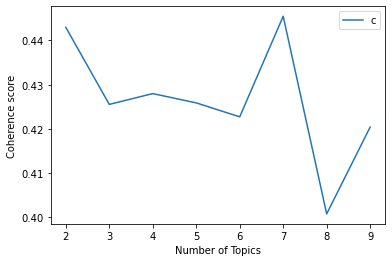

In [ ]:
# Printing graph
start,stop,step=2,10,1
plot_graph(corpus_clean,start,stop,step)

##### Generate the LDA model with Number of Topics predicted by Coherence values

Below is the Multicore LDA model defined using 7 number of topics and running for 1000 epochs

In [ ]:
# step 3 generate the lda model
# Creating the object for LDA model using gensim library

# Running and Training LDA model on the document term matrix.
ldamodel = Lda(doc_term_matrix, num_topics=7, passes=1000, chunksize=10, id2word = dictionary)

In [ ]:
# Saving Training model
ldamodel.save("C:/CapstoneProject/Training_Model_1000epochs/training1000.model")

In [ ]:
#load training model
from gensim import models
ldamodel = models.LdaModel.load("C:/CapstoneProject/Training_Model_1000epochs/training1000.model")

Below are the most frequent topics and most representative words

In [ ]:
# step 4 evaluate the results
# print most significant topics, and the most important words
print('─' * 80, '\nMost Freq. Topics, Most Rep. Words\n')
# show most frequent 3 topics, for each topic, show the top three most representative words
print(ldamodel.print_topics(num_topics=3, num_words=3)) 


──────────────────────────────────────────────────────────────────────────────── 
Most Freq. Topics, Most Rep. Words

[(2, '0.029*"physician" + 0.015*"use" + 0.014*"care"'), (1, '0.023*"group" + 0.023*"trial" + 0.022*"patient"'), (6, '0.035*"patient" + 0.017*"diseas" + 0.013*"infect"')]


Below are all the 7 topics and their most representative words

In [ ]:
print('─' * 80, '\nAll topics + words, ordered by sig.\n')
print(ldamodel.print_topics(num_topics=-1, num_words=147)) # this will get all topics (ordered by significance), and all words (orderred by significance of the word in each topic)


──────────────────────────────────────────────────────────────────────────────── 
All topics + words, ordered by sig.

[(0, '0.033*"patient" + 0.019*"p" + 0.017*"ci" + 0.014*"hospit" + 0.014*"compar" + 0.013*"studi" + 0.011*"associ" + 0.011*"year" + 0.010*"pandem" + 0.010*"rate" + 0.010*"care" + 0.010*"medic" + 0.009*"increas" + 0.009*"age" + 0.009*"period" + 0.008*"visit" + 0.008*"use" + 0.008*"outcom" + 0.007*"includ" + 0.007*"group" + 0.007*"decreas" + 0.007*"admiss" + 0.006*"cohort" + 0.006*"emerg" + 0.006*"differ" + 0.006*"data" + 0.006*"higher" + 0.006*"vs" + 0.006*"number" + 0.005*"women" + 0.005*"ed" + 0.005*"risk" + 0.005*"time" + 0.005*"signific" + 0.005*"mortal" + 0.005*"retrospect" + 0.005*"among" + 0.005*"chang" + 0.005*"significantli" + 0.004*"record" + 0.004*"lockdown" + 0.004*"regress" + 0.004*"surgeri" + 0.004*"march" + 0.004*"score" + 0.004*"observ" + 0.004*"icu" + 0.004*"physician" + 0.004*"total" + 0.004*"mean" + 0.004*"adjust" + 0.004*"male" + 0.004*"characterist" 

Below is the topic summary table

In [ ]:

# generate a more structured form
print('─' * 80, '\nTopic Summ. Table - Topic 0\n')
print(ldamodel.print_topics(num_topics=-1, num_words=147)[0][1]) # get the topic summary table for the first topic, i.e. topic 0

weight=re.findall('(0.\d{3})/*',str(ldamodel.print_topics(num_topics=-1, num_words=34)[0][1])) # extract the weight
word=re.findall('"(.*?)"',str(ldamodel.print_topics(num_topics=-1, num_words=34)[0][1])) # extract the word
tup=[(x,y) for x,y in zip(word,weight)]
topic_summary=dict(tup)

──────────────────────────────────────────────────────────────────────────────── 
Topic Summ. Table - Topic 0

0.033*"patient" + 0.019*"p" + 0.017*"ci" + 0.014*"hospit" + 0.014*"compar" + 0.013*"studi" + 0.011*"associ" + 0.011*"year" + 0.010*"pandem" + 0.010*"rate" + 0.010*"care" + 0.010*"medic" + 0.009*"increas" + 0.009*"age" + 0.009*"period" + 0.008*"visit" + 0.008*"use" + 0.008*"outcom" + 0.007*"includ" + 0.007*"group" + 0.007*"decreas" + 0.007*"admiss" + 0.006*"cohort" + 0.006*"emerg" + 0.006*"differ" + 0.006*"data" + 0.006*"higher" + 0.006*"vs" + 0.006*"number" + 0.005*"women" + 0.005*"ed" + 0.005*"risk" + 0.005*"time" + 0.005*"signific" + 0.005*"mortal" + 0.005*"retrospect" + 0.005*"among" + 0.005*"chang" + 0.005*"significantli" + 0.004*"record" + 0.004*"lockdown" + 0.004*"regress" + 0.004*"surgeri" + 0.004*"march" + 0.004*"score" + 0.004*"observ" + 0.004*"icu" + 0.004*"physician" + 0.004*"total" + 0.004*"mean" + 0.004*"adjust" + 0.004*"male" + 0.004*"characterist" + 0.004*"depar

Below is the weight of each words in 7 topics. Here, probability of each word adds up to 1

In [ ]:
# get the weight of each words in each topic
print('─' * 80, '\nTopics by Dict Seq.\n')
print(ldamodel.get_topics()) # this will match the result in print(ldamodel.print_topics(num_topics=-1, num_words=34)), but note that the sequence is different, here, the sequence is the word sequence in the dictionary
print('─' * 80, '\nWord Prob.\n')
print(sum(ldamodel.get_topics()[0])) # the probability for each words should add up to 1

──────────────────────────────────────────────────────────────────────────────── 
Topics by Dict Seq.

[[7.12285691e-04 6.56450959e-03 3.56985885e-03 ... 1.48381991e-06
  1.48381980e-06 1.48381980e-06]
 [1.11213909e-03 1.85355358e-03 9.01654479e-04 ... 3.29180648e-06
  1.04799903e-04 2.06771700e-04]
 [1.35052346e-06 1.34536560e-06 2.45225895e-03 ... 1.25816150e-04
  1.34499237e-06 1.34488869e-06]
 ...
 [2.14101584e-03 1.80686447e-06 1.52112241e-03 ... 1.80497204e-06
  1.80420318e-06 1.80420318e-06]
 [1.34831198e-05 1.34452075e-05 1.34808834e-05 ... 1.34304837e-05
  1.34257725e-05 1.34257725e-05]
 [1.81891501e-03 1.25724392e-03 1.91618782e-03 ... 1.24565793e-06
  1.24713847e-06 1.24697112e-06]]
──────────────────────────────────────────────────────────────────────────────── 
Word Prob.

0.9999999264337021


Below is the topic distribution list for fist document as an example. Here, first document is mainly about topic 3 because it had highest weight

In [ ]:

# get topic distribution (this is the most important output in this application)
print('─' * 80, '\nTopic Distribution\n')
print(ldamodel.get_document_topics(doc_term_matrix[0]))
# result: [(0, 0.91437984), (1, 0.043404248), (2, 0.042215884)]
# this means that the first document is mainly about the topic 0.

──────────────────────────────────────────────────────────────────────────────── 
Topic Distribution

[(0, 0.79627085), (6, 0.19585821)]


#### Text Visualization

Plotting the word cloud for the above developed model

In [ ]:
from wordcloud import WordCloud

Most Representative Words in Gensim Coherence + Perplexity Value Optimized Model


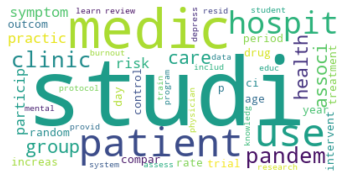

<Figure size 1152x720 with 0 Axes>

In [ ]:
#ldamodel = ldamodel
mdlGensim = ldamodel.print_topics(num_topics=9, num_words=15)

#print(mdl)

def getCloud(mdl, title): 
  lst = []
  for x in mdl:
    lst.append(re.findall('"(.*?)"',x[1]))
  lst2 = []
  for x in lst:
    for y in x:
      lst2.append(y)
  #print(lst2)

  wc = WordCloud(background_color='white'
                  ,max_words=50).generate(' '.join(lst2))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.figure(figsize=(16,10))
  print(title)
  plt.show()


getCloud(mdlGensim, "Most Representative Words in Gensim Coherence + Perplexity Value Optimized Model")

#### Check for Topic Similarity & Recommend Article for New Test Articles

Generating the topic distribution list for all the documents in the dataset 

In [ ]:
# generate the topic distribution for all documents for above related model
topic_distribuition_list=[]
for i in range(len(doc_term_matrix)):
    distribution=dict(ldamodel.get_document_topics(doc_term_matrix[i])) # note taht the distribution only show topics with loading, such as {0: 0.10538977, 7: 0.89361304}
    template_dict=dict.fromkeys(range(11),0) # we need to fill the missing toipcs in the distribution (missing because the loading is 0), this is to create a template of empty dictionary with all 0 values
    template_dict.update(distribution)
    topic_distribuition_list.append(template_dict)

print(topic_distribuition_list)

[{0: 0.455715, 1: 0, 2: 0.26662034, 3: 0.053868927, 4: 0, 5: 0, 6: 0.2206038, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.03024044, 1: 0, 2: 0.48031402, 3: 0.3881226, 4: 0.09947821, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.17084554, 1: 0, 2: 0.6197405, 3: 0.17182815, 4: 0, 5: 0, 6: 0.033556513, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.3169735, 1: 0, 2: 0.56698054, 3: 0, 4: 0, 5: 0, 6: 0.113116495, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.08279216, 1: 0.08608826, 2: 0.26831654, 3: 0.25973773, 4: 0, 5: 0, 6: 0.30131492, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0, 2: 0.1880364, 3: 0.23131393, 4: 0, 5: 0, 6: 0.5751754, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.24008118, 1: 0, 2: 0.4787025, 3: 0.024588753, 4: 0, 5: 0.010587903, 6: 0.24393651, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.26319373, 1: 0, 2: 0.19672258, 3: 0, 4: 0, 5: 0, 6: 0.53635204, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.07490998, 1: 0, 2: 0.40081912, 3: 0.24515606, 4: 0.018858671, 5: 0.074274756, 6: 0.1845355, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.098784596, 1: 0.021382637, 2: 0.36557367, 

In [ ]:
with open('myfile.txt', 'w') as f:
    print(topic_distribuition_list, file=f)

In [ ]:
stop1 = stopwords.words('english')
print(stop1)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

Fetching the file containing all the test abstracts. These are the abstracts for which the articles from the training dataset will be recommended

In [ ]:
test_abstracts_data = pd.ExcelFile(r'C:/CapstoneProject/Test_Abstracts.xlsx')
df_study_test = pd.read_excel(test_abstracts_data, 'Sheet1')
df_study_test

,Abstract
0,INTRODUCTION: Either a pass/fail approach or a...
1,INTRODUCTION: People living in poverty have li...
2,OBJECTIVES: To establish the pattern of change...
3,PURPOSE: To conduct a scoping review of the li...
4,OBJECTIVE: End-of-life interventions should be...
5,Diagnosis is the cornerstone of providing safe...
6,Previous studies of fetal death with maternal ...
7,BACKGROUND: Cognitive limitations are common a...
8,STUDY DESIGN: Longitudinal cohort study OBJECT...
9,To understand mental health clinics' chronic d...


Cleaning the test abstracts just like training abstracts 

In [ ]:
abstract_list_test = df_study_test["Abstract"].tolist()
abstract_list_test

['INTRODUCTION: Either a pass/fail approach or a seven-point grading scale are used to evaluate students at the Danish universities. The aim of this study was to explore any effect of the assessment methods on student performances during oral exams. METHODS: In a prospective study including 1,037 examinations in three medical subjects, we investigated the difference in the test scores between the spring- and autumn semester. In the spring semester, the students could either pass or fail the subject (pass/fail) while in the following autumn semester, the students were assessed by tiered grading (seven-point grading scale). Unknown to the students, the examiners assessed the students by the seven-point grading scale also in the spring semester. Students at the international classes who were officially assessed by the seven-point grading scale during both semesters served as control group. RESULTS: The grading scores were significantly higher among students who were aware of being evaluat

In [ ]:
contents_test=[]
for abstract in abstract_list_test:

    sentence_list = re.split(r'(?<=[^A-Z].[.?]) +(?=[A-Z])', abstract)
    final_clean_abstract=""


    for sentence in sentence_list:
        index_loc = sentence.find(":")
        if(index_loc!=-1):
            new_txt_without_headers=sentence[index_loc+1:]
        else:
            new_txt_without_headers=" "+sentence
    #print(new_txt_without_headers)
        final_clean_abstract+=new_txt_without_headers
    contents_test.append(final_clean_abstract.strip())

print()
print(f"clean abstract list:")
contents_test


clean abstract list:


['Either a pass/fail approach or a seven-point grading scale are used to evaluate students at the Danish universities. The aim of this study was to explore any effect of the assessment methods on student performances during oral exams. In a prospective study including 1,037 examinations in three medical subjects, we investigated the difference in the test scores between the spring- and autumn semester. In the spring semester, the students could either pass or fail the subject (pass/fail) while in the following autumn semester, the students were assessed by tiered grading (seven-point grading scale). Unknown to the students, the examiners assessed the students by the seven-point grading scale also in the spring semester. Students at the international classes who were officially assessed by the seven-point grading scale during both semesters served as control group. The grading scores were significantly higher among students who were aware of being evaluated with the seven-point grading 

In [ ]:
stemmer1 = PorterStemmer()
stop1 = stopwords.words('english')
clean_posts_test = []
for post in contents_test:
    res_1 = re.sub(r'http\S+', '', post)
    postwords = nltk.tokenize.word_tokenize(res_1)
    resultwords_1 = [word1 for word1 in postwords if word1.lower() not in stop1]
    resultwords_2 = [word2 for word2 in resultwords_1 if word2.isalpha()]
    resultwords_3 = [stemmer1.stem(i) for i in resultwords_2]
    resultwords_4 = [word3.lower() for word3 in resultwords_3]
    result = ' '.join(resultwords_4)
    words_to_remove = [i[0] for i in least_common_words(result,5)]
    result_spl = result.split()
    final_result = [finalword for finalword in result_spl if finalword not in words_to_remove]
    finalresult = ' '.join(final_result)
    clean_posts_test.append(finalresult)


In [ ]:
for i in clean_posts_test:
    if i == '':
        clean_posts_test.remove('')
    else:
        continue
print(clean_posts_test)

['either approach grade scale use evalu student danish univers aim studi explor effect assess method student perform oral exam prospect studi includ examin three medic subject investig differ test score autumn semest spring semest student could either pass fail subject follow autumn semest student assess tier grade grade scale unknown student examin assess student grade scale also spring semest student intern class offici assess grade scale semest serv control group grade score significantli higher among student awar evalu grade score compar group p comparison signific differ exam result observ autumn semest control group p moreov averag mark higher among intern student mean grade scale danish speak class mean grade scale seem motiv student yield better perform henc approach', 'peopl live poverti limit access tradit financi institut microfin programm design meet gap show promis improv incom econom product health commun academ research partnership develop two livestock product asset tra

Developing dictionary and document term matrix for all the test abstracts

In [ ]:
#Step 0
corpus_clean_test=[]
corpus_clean_test=[nltk.word_tokenize(corp) for corp in clean_posts_test]

In [ ]:
# step 1 generating the dictionary
# Creating the term dictionary of our courpus, where every unique term is assigned an index.
# you have to install gensim package first
dictionary_test = corpora.Dictionary(corpus_clean_test) # this is all words. All the words appearing in all the documents

# check word in dictionary
#for i in dictionary:
#  print(i,dictionary[i])

In [ ]:
#Step 2
# Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above
doc_term_matrix_test = [dictionary_test.doc2bow(doc) for doc in corpus_clean_test] # conver to a bag of words.

# note that this is the format of the lda input
print(doc_term_matrix_test) # the doc_term_matrix is not none-padded.

# step 3 generate the lda model
# Creating the object for LDA model using gensim library

[[(0, 1), (1, 1), (2, 2), (3, 2), (4, 4), (5, 3), (6, 1), (7, 1), (8, 1), (9, 2), (10, 1), (11, 1), (12, 2), (13, 1), (14, 2), (15, 2), (16, 1), (17, 2), (18, 2), (19, 2), (20, 2), (21, 1), (22, 1), (23, 1), (24, 9), (25, 3), (26, 1), (27, 2), (28, 1), (29, 2), (30, 1), (31, 1), (32, 2), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 2), (41, 1), (42, 2), (43, 1), (44, 1), (45, 6), (46, 3), (47, 1), (48, 6), (49, 1), (50, 1), (51, 1), (52, 1), (53, 2), (54, 10), (55, 2), (56, 2), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1)], [(2, 1), (10, 1), (12, 3), (16, 1), (20, 1), (25, 3), (28, 2), (29, 1), (33, 1), (55, 1), (62, 1), (64, 1), (65, 1), (66, 1), (67, 4), (68, 3), (69, 2), (70, 1), (71, 3), (72, 2), (73, 1), (74, 1), (75, 1), (76, 5), (77, 2), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 2), (84, 1), (85, 1), (86, 1), (87, 4), (88, 1), (89, 1), (90, 3), (91, 2), (92, 1), (93, 1), (94, 1), (95, 5), (96, 1), (97, 1), (98, 2), (99, 1), (100, 2

In [ ]:
# Running and Training LDA model on the document term matrix.
ldamodel_test = Lda(doc_term_matrix_test, num_topics=7,passes=1000,chunksize=10 ,id2word = dictionary_test)

In [ ]:
# Saving Test model
ldamodel_test.save("C:/CapstoneProject/Test_Model_1000epochs/test1000.model")

In [ ]:
#load test model
ldamodel_test = models.LdaModel.load("C:/CapstoneProject/Test_Model_1000epochs/test1000.model")

-------------------------------------------------------------------------------------

In [ ]:
# step 4 evaluate the results
# print most significant topics, and the most important words
print('─' * 80, '\nMost Freq. Topics, Most Rep. Words\n')
print(ldamodel_test.print_topics(num_topics=3, num_words=3)) # show most frequent 3 topics, for each topic, show the top three most representative words
print('─' * 80, '\nAll topics + words, ordered by sig.\n')
print(ldamodel_test.print_topics(num_topics=-1, num_words=147)) # this will get all topics (ordered by significance), and all words (orderred by significance of the word in each topic)


──────────────────────────────────────────────────────────────────────────────── 
Most Freq. Topics, Most Rep. Words

[(6, '0.022*"ifi" + 0.019*"consensu" + 0.019*"outbreak"'), (3, '0.026*"patient" + 0.020*"physician" + 0.016*"hospit"'), (4, '0.021*"death" + 0.021*"fetal" + 0.021*"ili"')]
──────────────────────────────────────────────────────────────────────────────── 
All topics + words, ordered by sig.

[(0, '0.015*"health" + 0.013*"ci" + 0.011*"screen" + 0.011*"public" + 0.011*"product" + 0.009*"commun" + 0.009*"particip" + 0.009*"research" + 0.009*"medic" + 0.007*"individu" + 0.007*"clinic" + 0.007*"phase" + 0.007*"interview" + 0.007*"intervent" + 0.007*"adolesc" + 0.007*"physician" + 0.007*"rfr" + 0.007*"pfp" + 0.007*"econom" + 0.007*"career" + 0.007*"professor" + 0.007*"mental" + 0.006*"among" + 0.006*"potenti" + 0.006*"control" + 0.006*"increas" + 0.006*"develop" + 0.006*"compar" + 0.006*"group" + 0.006*"includ" + 0.006*"adult" + 0.006*"famili" + 0.006*"prevent" + 0.006*"baselin

In [ ]:

# generate a more structured form
print('─' * 80, '\nTopic Summ. Table - Topic 0\n')
print(ldamodel_test.print_topics(num_topics=-1, num_words=147)[0][1]) # get the topic summary table for the first topic, i.e. topic 0

weight=re.findall('(0.\d{3})/*',str(ldamodel_test.print_topics(num_topics=-1, num_words=34)[0][1])) # extract the weight
word=re.findall('"(.*?)"',str(ldamodel_test.print_topics(num_topics=-1, num_words=34)[0][1])) # extract the word
tup=[(x,y) for x,y in zip(word,weight)]
topic_summary_test=dict(tup)

──────────────────────────────────────────────────────────────────────────────── 
Topic Summ. Table - Topic 0

0.015*"health" + 0.013*"ci" + 0.011*"screen" + 0.011*"public" + 0.011*"product" + 0.009*"commun" + 0.009*"particip" + 0.009*"research" + 0.009*"medic" + 0.007*"individu" + 0.007*"clinic" + 0.007*"phase" + 0.007*"interview" + 0.007*"intervent" + 0.007*"adolesc" + 0.007*"physician" + 0.007*"rfr" + 0.007*"pfp" + 0.007*"econom" + 0.007*"career" + 0.007*"professor" + 0.007*"mental" + 0.006*"among" + 0.006*"potenti" + 0.006*"control" + 0.006*"increas" + 0.006*"develop" + 0.006*"compar" + 0.006*"group" + 0.006*"includ" + 0.006*"adult" + 0.006*"famili" + 0.006*"prevent" + 0.006*"baselin" + 0.006*"number" + 0.006*"scientif" + 0.006*"live" + 0.006*"use" + 0.006*"rural" + 0.006*"annual" + 0.006*"villag" + 0.006*"provid" + 0.006*"diseas" + 0.004*"base" + 0.004*"follow" + 0.004*"review" + 0.004*"staff" + 0.004*"cohort" + 0.004*"find" + 0.004*"two" + 0.004*"doctor" + 0.004*"complet" + 0.004

In [ ]:

# get the weight of each words in each topic
print('─' * 80, '\nTopics by Dict Seq.\n')
print(ldamodel_test.get_topics()) # this will match the result in print(ldamodel.print_topics(num_topics=-1, num_words=34)), but note that the sequence is different, here, the sequence is the word sequence in the dictionary
print('─' * 80, '\nWord Prob.\n')
print(sum(ldamodel_test.get_topics()[0])) # the probability for each words should add up to 1

──────────────────────────────────────────────────────────────────────────────── 
Topics by Dict Seq.

[[0.00025616 0.00025616 0.00563549 ... 0.00025616 0.00025616 0.00025616]
 [0.00242757 0.0024276  0.00356055 ... 0.00016185 0.00016185 0.00016185]
 [0.0001298  0.00194679 0.00103811 ... 0.0001298  0.0001298  0.0001298 ]
 ...
 [0.00171917 0.0017192  0.00322371 ... 0.00021492 0.00021492 0.00021492]
 [0.0004386  0.0004386  0.0004386  ... 0.0004386  0.0004386  0.0004386 ]
 [0.00033876 0.00033876 0.00270992 ... 0.00033876 0.00033876 0.00033876]]
──────────────────────────────────────────────────────────────────────────────── 
Word Prob.

0.9999999702849891


In [ ]:
# get topic distribution (this is the most important output in this application)
print('─' * 80, '\nTopic Distribution\n')
print(ldamodel_test.get_document_topics(doc_term_matrix_test[0]))
# result: [(0, 0.91437984), (1, 0.043404248), (2, 0.042215884)]
# this means that the first document is mainly about the topic 0.

──────────────────────────────────────────────────────────────────────────────── 
Topic Distribution

[(1, 0.9927845)]


In [ ]:
# generate the topic distribution for all documents
topic_distribuition_list_test=[]
for i in range(len(doc_term_matrix_test)):
    distribution=dict(ldamodel_test.get_document_topics(doc_term_matrix_test[i])) # note taht the distribution only show topics with loading, such as {0: 0.10538977, 7: 0.89361304}
    template_dict=dict.fromkeys(range(11),0) # we need to fill the missing toipcs in the distribution (missing because the loading is 0), this is to create a template of empty dictionary with all 0 values
    template_dict.update(distribution)
    topic_distribuition_list_test.append(template_dict)

print(topic_distribuition_list_test)

[{0: 0, 1: 0.9927845, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.995124, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.99442625, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0, 2: 0.9939513, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0.9936421, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0.9907664, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0, 2: 0, 3: 0, 4: 0.9930822, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0.9940793, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0, 2: 0, 3: 0.99247473, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0.98806584, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0, 2: 0.99359035, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0, 2: 0.9943901, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0}, {0: 0, 1: 0, 2: 0.99403584, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10

### Perform Cosine similarity check to find article recommendations

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

def cossimilarity(x,y):
    value1=np.dot(x,y)
    xm=np.sqrt(sum([i**2 for i in x]))
    ym=np.sqrt(sum([i**2 for i in y]))
    value2=xm*ym
    cs=value1/value2
    return cs

Calculating Cosine Similarity for all the combinations of test articles and training articles

In [ ]:
import statistics
test_article_num = []
sample_article_num = []

cosine_list=[]
similar_article_dict_detail= dict()#added by SP
article_match_detail=dict()#added by SP
article_sim_count=[]#added by SP
count_of_article=0#added by SP
count_similar_article=0
for i in range(len(topic_distribuition_list_test)):
    for j in range(i,len(topic_distribuition_list)): # remember, this is how to iterate pairwise. You can use itertool though.

        disi=list(topic_distribuition_list_test[i].values()) # the dict.values() returns a dict_values class variable, we need to convert it to list, otherwise we cannot do dot product.
        disj=list(topic_distribuition_list[j].values())
        #print(disi)
        #print(disj)
        cos_similar = cossimilarity(disi,disj)
        cosine_list.append(cos_similar)
        test_article_num.append(i)
        sample_article_num.append(j)
        list_of_tuples = list(zip(test_article_num,sample_article_num,cosine_list))
        print('--------------------------------------')
        print(f'Topic similarity between Test article {i} and Trained article {j}')
        if cos_similar >= 0.8:
            
            print(cos_similar)
            count_similar_article+=1
            count_of_article=similar_article_dict_detail.get(i, 0)#added by SP
            similar_article_dict_detail[i]=count_of_article+1 #added by SP
            article_sim_count=article_match_detail.get(i, [])#added by SP
            article_sim_count.append(str(j)+" - "+str(cos_similar))#added by SP
            article_match_detail[i]=article_sim_count#added by SP
        else:
            print(cos_similar)
            #print('Not recommended')
#list_of_tuples (Working on)

--------------------------------------
Topic similarity between Test article 0 and Trained article 0
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 2
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 4
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 5
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 6
0.07429710468173541
--------------------------------------
Topic similarity between Test article 0 and Trained article 7
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 8
0.0
--------------------------------------


0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1016
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1017
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1018
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1019
0.1346656292536458
--------------------------------------
Topic similarity between Test article 0 and Trained article 1020
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1021
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1022
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1023
0.12300527466056524
--------------------------------------
Topic similarity between Test article 0 and Trained article 10

--------------------------------------
Topic similarity between Test article 0 and Trained article 1817
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1818
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1819
0.1724214377882559
--------------------------------------
Topic similarity between Test article 0 and Trained article 1820
0.1762729475549655
--------------------------------------
Topic similarity between Test article 0 and Trained article 1821
0.015237023122777965
--------------------------------------
Topic similarity between Test article 0 and Trained article 1822
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 1823
0.24740774766405896
--------------------------------------
Topic similarity between Test article 0 and Trained article 1824
0.0
--------------------------------------
Topic similarity between Test arti

0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 2543
0.14784825416604044
--------------------------------------
Topic similarity between Test article 0 and Trained article 2544
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 2545
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 2546
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 2547
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 2548
0.1382358095478255
--------------------------------------
Topic similarity between Test article 0 and Trained article 2549
0.15570076657823056
--------------------------------------
Topic similarity between Test article 0 and Trained article 2550
0.0
--------------------------------------
Topic similarity between Test article 0 and Tr

0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3043
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3044
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3045
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3046
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3047
0.30340900321815434
--------------------------------------
Topic similarity between Test article 0 and Trained article 3048
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3049
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3050
0.0896329590373377
--------------------------------------
Topic similarity between Test article 0 and Trained article 30

--------------------------------------
Topic similarity between Test article 0 and Trained article 3486
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3487
0.23586589514616124
--------------------------------------
Topic similarity between Test article 0 and Trained article 3488
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3489
0.9216787042091341
--------------------------------------
Topic similarity between Test article 0 and Trained article 3490
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3491
0.16504583768352987
--------------------------------------
Topic similarity between Test article 0 and Trained article 3492
0.0
--------------------------------------
Topic similarity between Test article 0 and Trained article 3493
0.0
--------------------------------------
Topic similarity between Test article 0 and Traine

--------------------------------------
Topic similarity between Test article 1 and Trained article 280
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 281
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 282
0.4296640153727427
--------------------------------------
Topic similarity between Test article 1 and Trained article 283
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 284
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 285
0.2046109984991869
--------------------------------------
Topic similarity between Test article 1 and Trained article 286
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 287
0.38680451258759513
--------------------------------------
Topic similarity between Test article 1 and Trained article

--------------------------------------
Topic similarity between Test article 1 and Trained article 693
0.22328103154948584
--------------------------------------
Topic similarity between Test article 1 and Trained article 694
0.3509025742662117
--------------------------------------
Topic similarity between Test article 1 and Trained article 695
0.4218956880636541
--------------------------------------
Topic similarity between Test article 1 and Trained article 696
0.2158347324985541
--------------------------------------
Topic similarity between Test article 1 and Trained article 697
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 698
0.2810278061044576
--------------------------------------
Topic similarity between Test article 1 and Trained article 699
0.30216280906850373
--------------------------------------
Topic similarity between Test article 1 and Trained article 700
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 1 and Trained article 1062
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1063
0.12273321143015535
--------------------------------------
Topic similarity between Test article 1 and Trained article 1064
0.5627891928303969
--------------------------------------
Topic similarity between Test article 1 and Trained article 1065
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1066
0.6377477193863955
--------------------------------------
Topic similarity between Test article 1 and Trained article 1067
0.9860944064458891
--------------------------------------
Topic similarity between Test article 1 and Trained article 1068
0.05674585812027513
--------------------------------------
Topic similarity between Test article 1 and Trained article 1069
0.0
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 1 and Trained article 1419
0.7358161294807364
--------------------------------------
Topic similarity between Test article 1 and Trained article 1420
0.6507982688504901
--------------------------------------
Topic similarity between Test article 1 and Trained article 1421
0.311047284089355
--------------------------------------
Topic similarity between Test article 1 and Trained article 1422
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1423
0.31826919888064986
--------------------------------------
Topic similarity between Test article 1 and Trained article 1424
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1425
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1426
0.10964266943844247
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 1 and Trained article 1753
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1754
0.9555562633225858
--------------------------------------
Topic similarity between Test article 1 and Trained article 1755
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1756
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1757
0.27601489291180675
--------------------------------------
Topic similarity between Test article 1 and Trained article 1758
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1759
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1760
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 1761
0

--------------------------------------
Topic similarity between Test article 1 and Trained article 2084
0.06107771729064816
--------------------------------------
Topic similarity between Test article 1 and Trained article 2085
0.4217408183584023
--------------------------------------
Topic similarity between Test article 1 and Trained article 2086
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2087
0.03460408047808858
--------------------------------------
Topic similarity between Test article 1 and Trained article 2088
0.40928939010809573
--------------------------------------
Topic similarity between Test article 1 and Trained article 2089
0.549989157505375
--------------------------------------
Topic similarity between Test article 1 and Trained article 2090
0.25046389729343704
--------------------------------------
Topic similarity between Test article 1 and Trained article 2091
0.29367426924265616
---------------------------

--------------------------------------
Topic similarity between Test article 1 and Trained article 2398
0.5025663551713841
--------------------------------------
Topic similarity between Test article 1 and Trained article 2399
0.6489601659142359
--------------------------------------
Topic similarity between Test article 1 and Trained article 2400
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2401
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2402
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2403
0.54731956834889
--------------------------------------
Topic similarity between Test article 1 and Trained article 2404
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2405
0.7815394496940931
--------------------------------------
Topic similarity between Test article 1

--------------------------------------
Topic similarity between Test article 1 and Trained article 2598
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2599
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2600
0.8207867654012844
--------------------------------------
Topic similarity between Test article 1 and Trained article 2601
0.14213868998979817
--------------------------------------
Topic similarity between Test article 1 and Trained article 2602
0.855321944438541
--------------------------------------
Topic similarity between Test article 1 and Trained article 2603
0.14280373259482765
--------------------------------------
Topic similarity between Test article 1 and Trained article 2604
0.045968295088069155
--------------------------------------
Topic similarity between Test article 1 and Trained article 2605
0.7992501808488321
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 1 and Trained article 2900
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2901
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2902
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2903
0.07095997533821038
--------------------------------------
Topic similarity between Test article 1 and Trained article 2904
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 2905
0.39672913806534627
--------------------------------------
Topic similarity between Test article 1 and Trained article 2906
0.9171576731486707
--------------------------------------
Topic similarity between Test article 1 and Trained article 2907
0.46540569818908334
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 1 and Trained article 3156
0.7226230041522933
--------------------------------------
Topic similarity between Test article 1 and Trained article 3157
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 3158
0.09212136830883355
--------------------------------------
Topic similarity between Test article 1 and Trained article 3159
0.03171116040408482
--------------------------------------
Topic similarity between Test article 1 and Trained article 3160
0.8892478167815993
--------------------------------------
Topic similarity between Test article 1 and Trained article 3161
0.06224000155219095
--------------------------------------
Topic similarity between Test article 1 and Trained article 3162
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 3163
0.29730474191506234
--------------------------------------
Top

0.4203298623728241
--------------------------------------
Topic similarity between Test article 1 and Trained article 3419
0.8941237106068252
--------------------------------------
Topic similarity between Test article 1 and Trained article 3420
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 3421
0.29306037392449164
--------------------------------------
Topic similarity between Test article 1 and Trained article 3422
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 3423
0.4858466173840135
--------------------------------------
Topic similarity between Test article 1 and Trained article 3424
0.0
--------------------------------------
Topic similarity between Test article 1 and Trained article 3425
0.10403513784254481
--------------------------------------
Topic similarity between Test article 1 and Trained article 3426
0.0
--------------------------------------
Topic similarity

--------------------------------------
Topic similarity between Test article 2 and Trained article 34
0.39589550727121037
--------------------------------------
Topic similarity between Test article 2 and Trained article 35
0.5186153857204641
--------------------------------------
Topic similarity between Test article 2 and Trained article 36
0.08439444584028089
--------------------------------------
Topic similarity between Test article 2 and Trained article 37
0.34184168363433537
--------------------------------------
Topic similarity between Test article 2 and Trained article 38
0.25890120333894795
--------------------------------------
Topic similarity between Test article 2 and Trained article 39
0.6238914984901468
--------------------------------------
Topic similarity between Test article 2 and Trained article 40
0.29306349120943875
--------------------------------------
Topic similarity between Test article 2 and Trained article 41
0.11475001519051073
--------------------------

--------------------------------------
Topic similarity between Test article 2 and Trained article 271
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 272
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 273
0.35383678604364904
--------------------------------------
Topic similarity between Test article 2 and Trained article 274
0.36395864258700433
--------------------------------------
Topic similarity between Test article 2 and Trained article 275
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 276
0.18588723072220917
--------------------------------------
Topic similarity between Test article 2 and Trained article 277
0.5872800155164912
--------------------------------------
Topic similarity between Test article 2 and Trained article 278
0.0
--------------------------------------
Topic similarity between Test article 2 an

--------------------------------------
Topic similarity between Test article 2 and Trained article 486
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 487
0.4305256429191447
--------------------------------------
Topic similarity between Test article 2 and Trained article 488
0.6013258207753445
--------------------------------------
Topic similarity between Test article 2 and Trained article 489
0.19975409235707167
--------------------------------------
Topic similarity between Test article 2 and Trained article 490
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 491
0.5304489098698774
--------------------------------------
Topic similarity between Test article 2 and Trained article 492
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 493
0.04927425734270149
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 2 and Trained article 761
0.7104180306897394
--------------------------------------
Topic similarity between Test article 2 and Trained article 762
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 763
0.7665225959864133
--------------------------------------
Topic similarity between Test article 2 and Trained article 764
0.6459188535077373
--------------------------------------
Topic similarity between Test article 2 and Trained article 765
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 766
0.41639088211468994
--------------------------------------
Topic similarity between Test article 2 and Trained article 767
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 768
0.24183916650408793
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 2 and Trained article 1019
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 1020
0.08397182135644107
--------------------------------------
Topic similarity between Test article 2 and Trained article 1021
0.5450609235804212
--------------------------------------
Topic similarity between Test article 2 and Trained article 1022
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 1023
0.7567083664976139
--------------------------------------
Topic similarity between Test article 2 and Trained article 1024
0.21226227124232713
--------------------------------------
Topic similarity between Test article 2 and Trained article 1025
0.5244686572903807
--------------------------------------
Topic similarity between Test article 2 and Trained article 1026
0.054997075210310845
--------------------------------------
Top

--------------------------------------
Topic similarity between Test article 2 and Trained article 1272
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 1273
0.30575421346815224
--------------------------------------
Topic similarity between Test article 2 and Trained article 1274
0.34507007185880206
--------------------------------------
Topic similarity between Test article 2 and Trained article 1275
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 1276
0.18672804808320734
--------------------------------------
Topic similarity between Test article 2 and Trained article 1277
0.18539181172174476
--------------------------------------
Topic similarity between Test article 2 and Trained article 1278
0.766527115427901
--------------------------------------
Topic similarity between Test article 2 and Trained article 1279
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 2 and Trained article 1513
0.15447629394929302
--------------------------------------
Topic similarity between Test article 2 and Trained article 1514
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 1515
0.598488263072981
--------------------------------------
Topic similarity between Test article 2 and Trained article 1516
0.9602240508583584
--------------------------------------
Topic similarity between Test article 2 and Trained article 1517
0.26009423277518
--------------------------------------
Topic similarity between Test article 2 and Trained article 1518
0.17264842628557966
--------------------------------------
Topic similarity between Test article 2 and Trained article 1519
0.4344780393087347
--------------------------------------
Topic similarity between Test article 2 and Trained article 1520
0.0
--------------------------------------
Topic si

--------------------------------------
Topic similarity between Test article 2 and Trained article 1796
0.29132029763810846
--------------------------------------
Topic similarity between Test article 2 and Trained article 1797
0.4197262206406831
--------------------------------------
Topic similarity between Test article 2 and Trained article 1798
0.31445512652205826
--------------------------------------
Topic similarity between Test article 2 and Trained article 1799
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 1800
0.7110186936257672
--------------------------------------
Topic similarity between Test article 2 and Trained article 1801
0.26546872812194594
--------------------------------------
Topic similarity between Test article 2 and Trained article 1802
0.051669628436902676
--------------------------------------
Topic similarity between Test article 2 and Trained article 1803
0.028686018253341425
------------------------

--------------------------------------
Topic similarity between Test article 2 and Trained article 2023
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2024
0.6729259910432369
--------------------------------------
Topic similarity between Test article 2 and Trained article 2025
0.06734519379480257
--------------------------------------
Topic similarity between Test article 2 and Trained article 2026
0.5984887184076325
--------------------------------------
Topic similarity between Test article 2 and Trained article 2027
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2028
0.693491283322313
--------------------------------------
Topic similarity between Test article 2 and Trained article 2029
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2030
0.0
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 2 and Trained article 2276
0.9072306015859459
--------------------------------------
Topic similarity between Test article 2 and Trained article 2277
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2278
0.6385148240464431
--------------------------------------
Topic similarity between Test article 2 and Trained article 2279
0.04259400150923963
--------------------------------------
Topic similarity between Test article 2 and Trained article 2280
0.05831280975494165
--------------------------------------
Topic similarity between Test article 2 and Trained article 2281
0.5101948178150202
--------------------------------------
Topic similarity between Test article 2 and Trained article 2282
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2283
0.0
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 2 and Trained article 2458
0.024358719085744503
--------------------------------------
Topic similarity between Test article 2 and Trained article 2459
0.8402134360153671
--------------------------------------
Topic similarity between Test article 2 and Trained article 2460
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2461
0.12531996681796692
--------------------------------------
Topic similarity between Test article 2 and Trained article 2462
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2463
0.5721323251721471
--------------------------------------
Topic similarity between Test article 2 and Trained article 2464
0.595573262841673
--------------------------------------
Topic similarity between Test article 2 and Trained article 2465
0.0
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 2 and Trained article 2658
0.0725532797984454
--------------------------------------
Topic similarity between Test article 2 and Trained article 2659
0.41783045959188264
--------------------------------------
Topic similarity between Test article 2 and Trained article 2660
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2661
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2662
0.024729157868453595
--------------------------------------
Topic similarity between Test article 2 and Trained article 2663
0.6959395896339177
--------------------------------------
Topic similarity between Test article 2 and Trained article 2664
0.7226313780833726
--------------------------------------
Topic similarity between Test article 2 and Trained article 2665
0.1308751501773865
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 2 and Trained article 2879
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2880
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 2881
0.07249421144210613
--------------------------------------
Topic similarity between Test article 2 and Trained article 2882
0.06018263323949907
--------------------------------------
Topic similarity between Test article 2 and Trained article 2883
0.1491179778975443
--------------------------------------
Topic similarity between Test article 2 and Trained article 2884
0.15465898816736995
--------------------------------------
Topic similarity between Test article 2 and Trained article 2885
0.22183536330888493
--------------------------------------
Topic similarity between Test article 2 and Trained article 2886
0.41032551011806206
--------------------------------------
To

--------------------------------------
Topic similarity between Test article 2 and Trained article 3081
0.09617798755932953
--------------------------------------
Topic similarity between Test article 2 and Trained article 3082
0.0896999802882772
--------------------------------------
Topic similarity between Test article 2 and Trained article 3083
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 3084
0.7937318171692496
--------------------------------------
Topic similarity between Test article 2 and Trained article 3085
0.9414937807763835
--------------------------------------
Topic similarity between Test article 2 and Trained article 3086
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 3087
0.8676875943368454
--------------------------------------
Topic similarity between Test article 2 and Trained article 3088
0.9528388019153116
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 2 and Trained article 3307
0.3868656619172369
--------------------------------------
Topic similarity between Test article 2 and Trained article 3308
0.08824785755696918
--------------------------------------
Topic similarity between Test article 2 and Trained article 3309
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 3310
0.40955688224897907
--------------------------------------
Topic similarity between Test article 2 and Trained article 3311
0.18727630478401733
--------------------------------------
Topic similarity between Test article 2 and Trained article 3312
0.19841976788630492
--------------------------------------
Topic similarity between Test article 2 and Trained article 3313
0.3915928688117152
--------------------------------------
Topic similarity between Test article 2 and Trained article 3314
0.33335929128446495
--------------------------

--------------------------------------
Topic similarity between Test article 2 and Trained article 3530
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 3531
0.23942651189392358
--------------------------------------
Topic similarity between Test article 2 and Trained article 3532
0.9602582240223619
--------------------------------------
Topic similarity between Test article 2 and Trained article 3533
0.35916369869605214
--------------------------------------
Topic similarity between Test article 2 and Trained article 3534
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 3535
0.8500674434696556
--------------------------------------
Topic similarity between Test article 2 and Trained article 3536
0.0
--------------------------------------
Topic similarity between Test article 2 and Trained article 3537
0.02865397060158958
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 3 and Trained article 9
0.22291924191157753
--------------------------------------
Topic similarity between Test article 3 and Trained article 10
0.3710311205649152
--------------------------------------
Topic similarity between Test article 3 and Trained article 11
0.9106074911626401
--------------------------------------
Topic similarity between Test article 3 and Trained article 12
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 13
0.11976807146934952
--------------------------------------
Topic similarity between Test article 3 and Trained article 14
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 15
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 16
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained 

--------------------------------------
Topic similarity between Test article 3 and Trained article 206
0.5112150333812095
--------------------------------------
Topic similarity between Test article 3 and Trained article 207
0.41163248499995725
--------------------------------------
Topic similarity between Test article 3 and Trained article 208
0.3359363521660946
--------------------------------------
Topic similarity between Test article 3 and Trained article 209
0.3452147463538845
--------------------------------------
Topic similarity between Test article 3 and Trained article 210
0.6067314552466554
--------------------------------------
Topic similarity between Test article 3 and Trained article 211
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 212
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 213
0.46342887571346614
--------------------------------------
Topic similar

Topic similarity between Test article 3 and Trained article 384
0.3222327520269679
--------------------------------------
Topic similarity between Test article 3 and Trained article 385
0.24473272669340787
--------------------------------------
Topic similarity between Test article 3 and Trained article 386
0.8565018151486853
--------------------------------------
Topic similarity between Test article 3 and Trained article 387
0.32282845437750873
--------------------------------------
Topic similarity between Test article 3 and Trained article 388
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 389
0.6698847532830644
--------------------------------------
Topic similarity between Test article 3 and Trained article 390
0.12144027298336002
--------------------------------------
Topic similarity between Test article 3 and Trained article 391
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained

--------------------------------------
Topic similarity between Test article 3 and Trained article 607
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 608
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 609
0.17861088309875653
--------------------------------------
Topic similarity between Test article 3 and Trained article 610
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 611
0.39628973296122133
--------------------------------------
Topic similarity between Test article 3 and Trained article 612
0.07484247520527465
--------------------------------------
Topic similarity between Test article 3 and Trained article 613
0.4407475948048081
--------------------------------------
Topic similarity between Test article 3 and Trained article 614
0.0
--------------------------------------
Topic similarity between Test article 3 an

--------------------------------------
Topic similarity between Test article 3 and Trained article 818
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 819
0.9096505258869679
--------------------------------------
Topic similarity between Test article 3 and Trained article 820
0.4987100586881696
--------------------------------------
Topic similarity between Test article 3 and Trained article 821
0.31421927301399494
--------------------------------------
Topic similarity between Test article 3 and Trained article 822
0.5502037033306163
--------------------------------------
Topic similarity between Test article 3 and Trained article 823
0.2288537204805352
--------------------------------------
Topic similarity between Test article 3 and Trained article 824
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 825
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 3 and Trained article 1011
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1012
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1013
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1014
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1015
0.6679813732887318
--------------------------------------
Topic similarity between Test article 3 and Trained article 1016
0.6127456428786371
--------------------------------------
Topic similarity between Test article 3 and Trained article 1017
0.23038888853873368
--------------------------------------
Topic similarity between Test article 3 and Trained article 1018
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained

--------------------------------------
Topic similarity between Test article 3 and Trained article 1221
0.11424262517514207
--------------------------------------
Topic similarity between Test article 3 and Trained article 1222
0.439457570949497
--------------------------------------
Topic similarity between Test article 3 and Trained article 1223
0.9922086161524125
--------------------------------------
Topic similarity between Test article 3 and Trained article 1224
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1225
0.17096006482414003
--------------------------------------
Topic similarity between Test article 3 and Trained article 1226
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1227
0.8992169513786833
--------------------------------------
Topic similarity between Test article 3 and Trained article 1228
0.05573349130097101
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 3 and Trained article 1389
0.1503108992235024
--------------------------------------
Topic similarity between Test article 3 and Trained article 1390
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1391
0.7678619725691427
--------------------------------------
Topic similarity between Test article 3 and Trained article 1392
0.795679724039864
--------------------------------------
Topic similarity between Test article 3 and Trained article 1393
0.5078888429111426
--------------------------------------
Topic similarity between Test article 3 and Trained article 1394
0.015070143812428397
--------------------------------------
Topic similarity between Test article 3 and Trained article 1395
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1396
0.1333510440316069
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 3 and Trained article 1563
0.2633246478613667
--------------------------------------
Topic similarity between Test article 3 and Trained article 1564
0.9672276619737193
--------------------------------------
Topic similarity between Test article 3 and Trained article 1565
0.1509392411971023
--------------------------------------
Topic similarity between Test article 3 and Trained article 1566
0.19563699930523887
--------------------------------------
Topic similarity between Test article 3 and Trained article 1567
0.2543416515028891
--------------------------------------
Topic similarity between Test article 3 and Trained article 1568
0.20745241065928088
--------------------------------------
Topic similarity between Test article 3 and Trained article 1569
0.8655005340271682
--------------------------------------
Topic similarity between Test article 3 and Trained article 1570
0.42789412230846213
-------------

--------------------------------------
Topic similarity between Test article 3 and Trained article 1722
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1723
0.6286952966152238
--------------------------------------
Topic similarity between Test article 3 and Trained article 1724
0.15107547974746413
--------------------------------------
Topic similarity between Test article 3 and Trained article 1725
0.4115400785917117
--------------------------------------
Topic similarity between Test article 3 and Trained article 1726
0.5858227733161755
--------------------------------------
Topic similarity between Test article 3 and Trained article 1727
0.13845378022668958
--------------------------------------
Topic similarity between Test article 3 and Trained article 1728
0.43603236654537086
--------------------------------------
Topic similarity between Test article 3 and Trained article 1729
0.8548415888915714
----------------------------

--------------------------------------
Topic similarity between Test article 3 and Trained article 1837
0.14749647614871447
--------------------------------------
Topic similarity between Test article 3 and Trained article 1838
0.4296904930111742
--------------------------------------
Topic similarity between Test article 3 and Trained article 1839
0.7671589158616285
--------------------------------------
Topic similarity between Test article 3 and Trained article 1840
0.8002573550341092
--------------------------------------
Topic similarity between Test article 3 and Trained article 1841
0.06347107976282428
--------------------------------------
Topic similarity between Test article 3 and Trained article 1842
0.2666076671602321
--------------------------------------
Topic similarity between Test article 3 and Trained article 1843
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 1844
0.0
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 3 and Trained article 2019
0.44747533990110644
--------------------------------------
Topic similarity between Test article 3 and Trained article 2020
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2021
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2022
0.48922666989221525
--------------------------------------
Topic similarity between Test article 3 and Trained article 2023
0.9111349966739891
--------------------------------------
Topic similarity between Test article 3 and Trained article 2024
0.6616671146565599
--------------------------------------
Topic similarity between Test article 3 and Trained article 2025
0.46482556462265534
--------------------------------------
Topic similarity between Test article 3 and Trained article 2026
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 3 and Trained article 2195
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2196
0.6874067159964343
--------------------------------------
Topic similarity between Test article 3 and Trained article 2197
0.30749864589784387
--------------------------------------
Topic similarity between Test article 3 and Trained article 2198
0.19452339605995156
--------------------------------------
Topic similarity between Test article 3 and Trained article 2199
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2200
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2201
0.25198525858727583
--------------------------------------
Topic similarity between Test article 3 and Trained article 2202
0.7114946748251096
--------------------------------------
Topic similarity be

0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2368
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2369
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2370
0.46827736254441044
--------------------------------------
Topic similarity between Test article 3 and Trained article 2371
0.9096498556054077
--------------------------------------
Topic similarity between Test article 3 and Trained article 2372
0.7501423878228
--------------------------------------
Topic similarity between Test article 3 and Trained article 2373
0.5914026839921057
--------------------------------------
Topic similarity between Test article 3 and Trained article 2374
0.28143970199522156
--------------------------------------
Topic similarity between Test article 3 and Trained article 2375
0.0
--------------------------------------
Topic similarity be

Topic similarity between Test article 3 and Trained article 2561
0.06483828864083069
--------------------------------------
Topic similarity between Test article 3 and Trained article 2562
0.11096989048774376
--------------------------------------
Topic similarity between Test article 3 and Trained article 2563
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2564
0.9589885158806339
--------------------------------------
Topic similarity between Test article 3 and Trained article 2565
0.6632889879717793
--------------------------------------
Topic similarity between Test article 3 and Trained article 2566
0.7689606977588517
--------------------------------------
Topic similarity between Test article 3 and Trained article 2567
0.9318971501875976
--------------------------------------
Topic similarity between Test article 3 and Trained article 2568
0.11980811299610618
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 3 and Trained article 2746
0.8623948627559052
--------------------------------------
Topic similarity between Test article 3 and Trained article 2747
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2748
0.21509592961903629
--------------------------------------
Topic similarity between Test article 3 and Trained article 2749
0.3933897958089214
--------------------------------------
Topic similarity between Test article 3 and Trained article 2750
0.45809767933159024
--------------------------------------
Topic similarity between Test article 3 and Trained article 2751
0.8782798896614435
--------------------------------------
Topic similarity between Test article 3 and Trained article 2752
0.42004191840058086
--------------------------------------
Topic similarity between Test article 3 and Trained article 2753
0.0
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 3 and Trained article 2926
0.4620574774347098
--------------------------------------
Topic similarity between Test article 3 and Trained article 2927
0.01156398229492671
--------------------------------------
Topic similarity between Test article 3 and Trained article 2928
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 2929
0.1751665792072574
--------------------------------------
Topic similarity between Test article 3 and Trained article 2930
0.16228953479309283
--------------------------------------
Topic similarity between Test article 3 and Trained article 2931
0.6188005170867906
--------------------------------------
Topic similarity between Test article 3 and Trained article 2932
0.12859864281604863
--------------------------------------
Topic similarity between Test article 3 and Trained article 2933
0.028643750854957656
--------------------------

--------------------------------------
Topic similarity between Test article 3 and Trained article 3104
0.7607342168284442
--------------------------------------
Topic similarity between Test article 3 and Trained article 3105
0.11522375441237115
--------------------------------------
Topic similarity between Test article 3 and Trained article 3106
0.4196150566730519
--------------------------------------
Topic similarity between Test article 3 and Trained article 3107
0.8877434161132348
--------------------------------------
Topic similarity between Test article 3 and Trained article 3108
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 3109
0.29027127367745753
--------------------------------------
Topic similarity between Test article 3 and Trained article 3110
0.8540586787379937
--------------------------------------
Topic similarity between Test article 3 and Trained article 3111
0.0
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 3 and Trained article 3283
0.5576640696449323
--------------------------------------
Topic similarity between Test article 3 and Trained article 3284
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 3285
0.5353901236181107
--------------------------------------
Topic similarity between Test article 3 and Trained article 3286
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 3287
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 3288
0.6259400258698233
--------------------------------------
Topic similarity between Test article 3 and Trained article 3289
0.8111197428996958
--------------------------------------
Topic similarity between Test article 3 and Trained article 3290
0.34386167487202696
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 3 and Trained article 3460
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 3461
0.032391179816005033
--------------------------------------
Topic similarity between Test article 3 and Trained article 3462
0.5622101657174855
--------------------------------------
Topic similarity between Test article 3 and Trained article 3463
0.3338907955944271
--------------------------------------
Topic similarity between Test article 3 and Trained article 3464
0.7060830151289057
--------------------------------------
Topic similarity between Test article 3 and Trained article 3465
0.6378527206449252
--------------------------------------
Topic similarity between Test article 3 and Trained article 3466
0.3452343485154151
--------------------------------------
Topic similarity between Test article 3 and Trained article 3467
0.0
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 3 and Trained article 3545
0.09794418051402647
--------------------------------------
Topic similarity between Test article 3 and Trained article 3546
0.9202247937112186
--------------------------------------
Topic similarity between Test article 3 and Trained article 3547
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 3548
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 3549
0.6371760119370304
--------------------------------------
Topic similarity between Test article 3 and Trained article 3550
0.2254555083817915
--------------------------------------
Topic similarity between Test article 3 and Trained article 3551
0.0
--------------------------------------
Topic similarity between Test article 3 and Trained article 3552
0.9743279777964495
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 4 and Trained article 89
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 90
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 91
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 92
0.4060193102729801
--------------------------------------
Topic similarity between Test article 4 and Trained article 93
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 94
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 95
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 96
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 97
0.9426189783563792
----------------

--------------------------------------
Topic similarity between Test article 4 and Trained article 253
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 254
0.4532595335224232
--------------------------------------
Topic similarity between Test article 4 and Trained article 255
0.8667509463695916
--------------------------------------
Topic similarity between Test article 4 and Trained article 256
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 257
0.6225652589936741
--------------------------------------
Topic similarity between Test article 4 and Trained article 258
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 259
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 260
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 

--------------------------------------
Topic similarity between Test article 4 and Trained article 433
0.19348109178145242
--------------------------------------
Topic similarity between Test article 4 and Trained article 434
0.7088640931609149
--------------------------------------
Topic similarity between Test article 4 and Trained article 435
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 436
0.7938045246543938
--------------------------------------
Topic similarity between Test article 4 and Trained article 437
0.7667928855506689
--------------------------------------
Topic similarity between Test article 4 and Trained article 438
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 439
0.2030196057567599
--------------------------------------
Topic similarity between Test article 4 and Trained article 440
0.2881672149692361
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 4 and Trained article 613
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 614
0.9919516377217157
--------------------------------------
Topic similarity between Test article 4 and Trained article 615
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 616
0.9779218241557235
--------------------------------------
Topic similarity between Test article 4 and Trained article 617
0.14883724472601273
--------------------------------------
Topic similarity between Test article 4 and Trained article 618
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 619
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 620
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article

--------------------------------------
Topic similarity between Test article 4 and Trained article 780
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 781
0.09055727969887754
--------------------------------------
Topic similarity between Test article 4 and Trained article 782
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 783
0.03356491406154075
--------------------------------------
Topic similarity between Test article 4 and Trained article 784
0.4080797802370912
--------------------------------------
Topic similarity between Test article 4 and Trained article 785
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 786
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 787
0.8617687464518284
--------------------------------------
Topic similarity between Test article 4 and

--------------------------------------
Topic similarity between Test article 4 and Trained article 948
0.36717046483878607
--------------------------------------
Topic similarity between Test article 4 and Trained article 949
0.14884102906423333
--------------------------------------
Topic similarity between Test article 4 and Trained article 950
0.24360460866823383
--------------------------------------
Topic similarity between Test article 4 and Trained article 951
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 952
0.0775617198697119
--------------------------------------
Topic similarity between Test article 4 and Trained article 953
0.26871714581381767
--------------------------------------
Topic similarity between Test article 4 and Trained article 954
0.9194260331470183
--------------------------------------
Topic similarity between Test article 4 and Trained article 955
0.31873754363710827
----------------------------------

--------------------------------------
Topic similarity between Test article 4 and Trained article 1115
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1116
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1117
0.9985651859245464
--------------------------------------
Topic similarity between Test article 4 and Trained article 1118
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1119
0.2219453623490347
--------------------------------------
Topic similarity between Test article 4 and Trained article 1120
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1121
0.4122377207015948
--------------------------------------
Topic similarity between Test article 4 and Trained article 1122
0.037108779852180085
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 4 and Trained article 1276
0.27741664623697426
--------------------------------------
Topic similarity between Test article 4 and Trained article 1277
0.10005804034344631
--------------------------------------
Topic similarity between Test article 4 and Trained article 1278
0.6422119442316386
--------------------------------------
Topic similarity between Test article 4 and Trained article 1279
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1280
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1281
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1282
0.9954698161414371
--------------------------------------
Topic similarity between Test article 4 and Trained article 1283
0.5516864552524947
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 4 and Trained article 1439
0.8775779118914793
--------------------------------------
Topic similarity between Test article 4 and Trained article 1440
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1441
0.23689602524528744
--------------------------------------
Topic similarity between Test article 4 and Trained article 1442
0.4215585160284604
--------------------------------------
Topic similarity between Test article 4 and Trained article 1443
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1444
0.8207759349891657
--------------------------------------
Topic similarity between Test article 4 and Trained article 1445
0.7222549891359449
--------------------------------------
Topic similarity between Test article 4 and Trained article 1446
0.8845429354804373
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 4 and Trained article 1575
0.9956510014936372
--------------------------------------
Topic similarity between Test article 4 and Trained article 1576
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1577
0.06936966954765977
--------------------------------------
Topic similarity between Test article 4 and Trained article 1578
0.2516135220639216
--------------------------------------
Topic similarity between Test article 4 and Trained article 1579
0.019867386715790147
--------------------------------------
Topic similarity between Test article 4 and Trained article 1580
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1581
0.8259375912735009
--------------------------------------
Topic similarity between Test article 4 and Trained article 1582
0.12507868536959205
--------------------------------------
Top

--------------------------------------
Topic similarity between Test article 4 and Trained article 1725
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1726
0.3895058792473782
--------------------------------------
Topic similarity between Test article 4 and Trained article 1727
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1728
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1729
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1730
0.793802209480284
--------------------------------------
Topic similarity between Test article 4 and Trained article 1731
0.23728883617177238
--------------------------------------
Topic similarity between Test article 4 and Trained article 1732
0.09671677604225218
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 4 and Trained article 1882
0.09563591966994085
--------------------------------------
Topic similarity between Test article 4 and Trained article 1883
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1884
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1885
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 1886
0.15130781570378077
--------------------------------------
Topic similarity between Test article 4 and Trained article 1887
0.148856105092794
--------------------------------------
Topic similarity between Test article 4 and Trained article 1888
0.636109315894848
--------------------------------------
Topic similarity between Test article 4 and Trained article 1889
0.0
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 4 and Trained article 2050
0.8854426663282254
--------------------------------------
Topic similarity between Test article 4 and Trained article 2051
0.09867472495362581
--------------------------------------
Topic similarity between Test article 4 and Trained article 2052
0.021519084597910857
--------------------------------------
Topic similarity between Test article 4 and Trained article 2053
0.6914992624783636
--------------------------------------
Topic similarity between Test article 4 and Trained article 2054
0.9753965803707866
--------------------------------------
Topic similarity between Test article 4 and Trained article 2055
0.38498668899461486
--------------------------------------
Topic similarity between Test article 4 and Trained article 2056
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2057
0.11238193431959245
--------------------------

--------------------------------------
Topic similarity between Test article 4 and Trained article 2210
0.9424223027667458
--------------------------------------
Topic similarity between Test article 4 and Trained article 2211
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2212
0.6845922449817129
--------------------------------------
Topic similarity between Test article 4 and Trained article 2213
0.1465687924224111
--------------------------------------
Topic similarity between Test article 4 and Trained article 2214
0.9089882323465752
--------------------------------------
Topic similarity between Test article 4 and Trained article 2215
0.4445653090469662
--------------------------------------
Topic similarity between Test article 4 and Trained article 2216
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2217
0.8946149802412399
--------------------------------------
Topic s

--------------------------------------
Topic similarity between Test article 4 and Trained article 2372
0.3758964609382607
--------------------------------------
Topic similarity between Test article 4 and Trained article 2373
0.5317450761646286
--------------------------------------
Topic similarity between Test article 4 and Trained article 2374
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2375
0.9163780390022015
--------------------------------------
Topic similarity between Test article 4 and Trained article 2376
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2377
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2378
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2379
0.955396486905332
--------------------------------------
Topic similarity between Test article 

--------------------------------------
Topic similarity between Test article 4 and Trained article 2529
0.30685030187363815
--------------------------------------
Topic similarity between Test article 4 and Trained article 2530
0.5856002874857446
--------------------------------------
Topic similarity between Test article 4 and Trained article 2531
0.6835602365479664
--------------------------------------
Topic similarity between Test article 4 and Trained article 2532
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2533
0.910388277766726
--------------------------------------
Topic similarity between Test article 4 and Trained article 2534
0.6795962896930317
--------------------------------------
Topic similarity between Test article 4 and Trained article 2535
0.16432222324090895
--------------------------------------
Topic similarity between Test article 4 and Trained article 2536
0.28459716620093845
-----------------------------

--------------------------------------
Topic similarity between Test article 4 and Trained article 2682
0.514650413494674
--------------------------------------
Topic similarity between Test article 4 and Trained article 2683
0.0751472517264915
--------------------------------------
Topic similarity between Test article 4 and Trained article 2684
0.15449585353746612
--------------------------------------
Topic similarity between Test article 4 and Trained article 2685
0.3189309351521675
--------------------------------------
Topic similarity between Test article 4 and Trained article 2686
0.9793758458577659
--------------------------------------
Topic similarity between Test article 4 and Trained article 2687
0.29194146707734814
--------------------------------------
Topic similarity between Test article 4 and Trained article 2688
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2689
0.6413827155051035
------------------------------

--------------------------------------
Topic similarity between Test article 4 and Trained article 2831
0.09836522854623306
--------------------------------------
Topic similarity between Test article 4 and Trained article 2832
0.15311774154133265
--------------------------------------
Topic similarity between Test article 4 and Trained article 2833
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2834
0.8310611539698547
--------------------------------------
Topic similarity between Test article 4 and Trained article 2835
0.0797732751100173
--------------------------------------
Topic similarity between Test article 4 and Trained article 2836
0.18881694348667843
--------------------------------------
Topic similarity between Test article 4 and Trained article 2837
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2838
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 4 and Trained article 2984
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 2985
0.1573505773400179
--------------------------------------
Topic similarity between Test article 4 and Trained article 2986
0.9842406859408959
--------------------------------------
Topic similarity between Test article 4 and Trained article 2987
0.08701572346203515
--------------------------------------
Topic similarity between Test article 4 and Trained article 2988
0.8316854315188998
--------------------------------------
Topic similarity between Test article 4 and Trained article 2989
0.19539731937052002
--------------------------------------
Topic similarity between Test article 4 and Trained article 2990
0.4504647286704153
--------------------------------------
Topic similarity between Test article 4 and Trained article 2991
0.9234192986688611
-----------------------------

--------------------------------------
Topic similarity between Test article 4 and Trained article 3157
0.26188350331121246
--------------------------------------
Topic similarity between Test article 4 and Trained article 3158
0.9829555304338723
--------------------------------------
Topic similarity between Test article 4 and Trained article 3159
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 3160
0.45742575391986756
--------------------------------------
Topic similarity between Test article 4 and Trained article 3161
0.3019231841836462
--------------------------------------
Topic similarity between Test article 4 and Trained article 3162
0.3741128951103258
--------------------------------------
Topic similarity between Test article 4 and Trained article 3163
0.14454107451686884
--------------------------------------
Topic similarity between Test article 4 and Trained article 3164
0.0
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 4 and Trained article 3340
0.9530516556026953
--------------------------------------
Topic similarity between Test article 4 and Trained article 3341
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 3342
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 3343
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 3344
0.032895613361650866
--------------------------------------
Topic similarity between Test article 4 and Trained article 3345
0.053690660019084326
--------------------------------------
Topic similarity between Test article 4 and Trained article 3346
0.13569711163688436
--------------------------------------
Topic similarity between Test article 4 and Trained article 3347
0.0
--------------------------------------
Topic similarity between Test ar

--------------------------------------
Topic similarity between Test article 4 and Trained article 3501
0.5439242570263699
--------------------------------------
Topic similarity between Test article 4 and Trained article 3502
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 3503
0.20177754331873818
--------------------------------------
Topic similarity between Test article 4 and Trained article 3504
0.8533496670294229
--------------------------------------
Topic similarity between Test article 4 and Trained article 3505
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 3506
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 3507
0.0
--------------------------------------
Topic similarity between Test article 4 and Trained article 3508
0.5213820324508995
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 5 and Trained article 37
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 38
0.1881313909709709
--------------------------------------
Topic similarity between Test article 5 and Trained article 39
0.31358689340063994
--------------------------------------
Topic similarity between Test article 5 and Trained article 40
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 41
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 42
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 43
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 44
0.058723279845525736
--------------------------------------
Topic similarity between Test article 5 and Trained article 45
0.

--------------------------------------
Topic similarity between Test article 5 and Trained article 186
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 187
0.1939505800588158
--------------------------------------
Topic similarity between Test article 5 and Trained article 188
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 189
0.16146694447730087
--------------------------------------
Topic similarity between Test article 5 and Trained article 190
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 191
0.06856207693608186
--------------------------------------
Topic similarity between Test article 5 and Trained article 192
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 193
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained articl

--------------------------------------
Topic similarity between Test article 5 and Trained article 331
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 332
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 333
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 334
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 335
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 336
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 337
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 338
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 339
0.0
-------------------------------------

--------------------------------------
Topic similarity between Test article 5 and Trained article 477
0.1321878764282547
--------------------------------------
Topic similarity between Test article 5 and Trained article 478
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 479
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 480
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 481
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 482
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 483
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 484
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 485
0.0
----------------------

--------------------------------------
Topic similarity between Test article 5 and Trained article 619
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 620
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 621
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 622
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 623
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 624
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 625
0.9953288880107252
--------------------------------------
Topic similarity between Test article 5 and Trained article 626
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 627
0.291037268793742
--------

--------------------------------------
Topic similarity between Test article 5 and Trained article 762
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 763
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 764
0.7055717838483532
--------------------------------------
Topic similarity between Test article 5 and Trained article 765
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 766
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 767
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 768
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 769
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 770
0.013299624126927706
-----

--------------------------------------
Topic similarity between Test article 5 and Trained article 901
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 902
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 903
0.225847846627622
--------------------------------------
Topic similarity between Test article 5 and Trained article 904
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 905
0.10812929652443322
--------------------------------------
Topic similarity between Test article 5 and Trained article 906
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 907
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 908
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 909
0.0
-------

--------------------------------------
Topic similarity between Test article 5 and Trained article 1038
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1039
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1040
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1041
0.25098004867506013
--------------------------------------
Topic similarity between Test article 5 and Trained article 1042
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1043
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1044
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1045
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1046
0.0
------------

--------------------------------------
Topic similarity between Test article 5 and Trained article 1181
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1182
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1183
0.1609392826361572
--------------------------------------
Topic similarity between Test article 5 and Trained article 1184
0.3602675628581243
--------------------------------------
Topic similarity between Test article 5 and Trained article 1185
0.18580912984418343
--------------------------------------
Topic similarity between Test article 5 and Trained article 1186
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1187
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1188
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained

--------------------------------------
Topic similarity between Test article 5 and Trained article 1369
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1370
0.04752033983190609
--------------------------------------
Topic similarity between Test article 5 and Trained article 1371
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1372
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1373
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1374
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1375
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1376
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1377
0.90469844878534

--------------------------------------
Topic similarity between Test article 5 and Trained article 1511
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1512
0.03568454792546571
--------------------------------------
Topic similarity between Test article 5 and Trained article 1513
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1514
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1515
0.11457771160697379
--------------------------------------
Topic similarity between Test article 5 and Trained article 1516
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1517
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1518
0.0726533604750045
--------------------------------------
Topic similarity between Test article 5 and Traine

--------------------------------------
Topic similarity between Test article 5 and Trained article 1649
0.10333651014265934
--------------------------------------
Topic similarity between Test article 5 and Trained article 1650
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1651
0.09314106802100988
--------------------------------------
Topic similarity between Test article 5 and Trained article 1652
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1653
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1654
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1655
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1656
0.2751319167045394
--------------------------------------
Topic similarity between Test article 5 and Traine

--------------------------------------
Topic similarity between Test article 5 and Trained article 1783
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1784
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1785
0.05514125000945972
--------------------------------------
Topic similarity between Test article 5 and Trained article 1786
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1787
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1788
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1789
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1790
0.10525700384795558
--------------------------------------
Topic similarity between Test article 5 and Trained article 1791


--------------------------------------
Topic similarity between Test article 5 and Trained article 1920
0.09987918073847696
--------------------------------------
Topic similarity between Test article 5 and Trained article 1921
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1922
0.20991270497300793
--------------------------------------
Topic similarity between Test article 5 and Trained article 1923
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1924
0.03665178066523317
--------------------------------------
Topic similarity between Test article 5 and Trained article 1925
0.11325255015200397
--------------------------------------
Topic similarity between Test article 5 and Trained article 1926
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 1927
0.0
--------------------------------------
Topic similarity between Test art

--------------------------------------
Topic similarity between Test article 5 and Trained article 2051
0.08432356672725752
--------------------------------------
Topic similarity between Test article 5 and Trained article 2052
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2053
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2054
0.1149746536303009
--------------------------------------
Topic similarity between Test article 5 and Trained article 2055
0.2537485604447364
--------------------------------------
Topic similarity between Test article 5 and Trained article 2056
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2057
0.20656398376637067
--------------------------------------
Topic similarity between Test article 5 and Trained article 2058
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 5 and Trained article 2183
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2184
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2185
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2186
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2187
0.05848228736884951
--------------------------------------
Topic similarity between Test article 5 and Trained article 2188
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2189
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2190
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2191
0.0
------------

--------------------------------------
Topic similarity between Test article 5 and Trained article 2313
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2314
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2315
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2316
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2317
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2318
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2319
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2320
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2321
0.0
----------------------------

--------------------------------------
Topic similarity between Test article 5 and Trained article 2445
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2446
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2447
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2448
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2449
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2450
0.029856027557554607
--------------------------------------
Topic similarity between Test article 5 and Trained article 2451
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2452
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2453
0.0
-----------

--------------------------------------
Topic similarity between Test article 5 and Trained article 2584
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2585
0.02087722384865007
--------------------------------------
Topic similarity between Test article 5 and Trained article 2586
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2587
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2588
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2589
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2590
0.9447491615920232
--------------------------------------
Topic similarity between Test article 5 and Trained article 2591
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2592
0

--------------------------------------
Topic similarity between Test article 5 and Trained article 2716
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2717
0.16045368175607247
--------------------------------------
Topic similarity between Test article 5 and Trained article 2718
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2719
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2720
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2721
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2722
0.05353815349037275
--------------------------------------
Topic similarity between Test article 5 and Trained article 2723
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2724


--------------------------------------
Topic similarity between Test article 5 and Trained article 2841
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2842
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2843
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2844
0.8094563360659621
--------------------------------------
Topic similarity between Test article 5 and Trained article 2845
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2846
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2847
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 2848
0.021412070087087034
--------------------------------------
Topic similarity between Test article 5 and Trained article 2849


--------------------------------------
Topic similarity between Test article 5 and Trained article 3020
0.31718251794575203
--------------------------------------
Topic similarity between Test article 5 and Trained article 3021
0.02986063960614067
--------------------------------------
Topic similarity between Test article 5 and Trained article 3022
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3023
0.2631015888696386
--------------------------------------
Topic similarity between Test article 5 and Trained article 3024
0.6260676622855235
--------------------------------------
Topic similarity between Test article 5 and Trained article 3025
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3026
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3027
0.33017691992742176
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 5 and Trained article 3150
0.01953345621066819
--------------------------------------
Topic similarity between Test article 5 and Trained article 3151
0.9987346718021438
--------------------------------------
Topic similarity between Test article 5 and Trained article 3152
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3153
0.03224790772167249
--------------------------------------
Topic similarity between Test article 5 and Trained article 3154
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3155
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3156
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3157
0.0
--------------------------------------
Topic similarity between Test article 5 and Traine

--------------------------------------
Topic similarity between Test article 5 and Trained article 3278
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3279
0.5311396725250112
--------------------------------------
Topic similarity between Test article 5 and Trained article 3280
1.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3281
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3282
0.01877012038070839
--------------------------------------
Topic similarity between Test article 5 and Trained article 3283
0.17285074203836423
--------------------------------------
Topic similarity between Test article 5 and Trained article 3284
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3285
0.0
--------------------------------------
Topic similarity between Test article 5 and Traine

--------------------------------------
Topic similarity between Test article 5 and Trained article 3403
0.21539564377177278
--------------------------------------
Topic similarity between Test article 5 and Trained article 3404
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3405
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3406
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3407
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3408
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3409
0.9491079258899368
--------------------------------------
Topic similarity between Test article 5 and Trained article 3410
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3411
0

--------------------------------------
Topic similarity between Test article 5 and Trained article 3527
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3528
0.9821847332651515
--------------------------------------
Topic similarity between Test article 5 and Trained article 3529
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3530
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3531
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3532
0.0
--------------------------------------
Topic similarity between Test article 5 and Trained article 3533
0.10304168632013358
--------------------------------------
Topic similarity between Test article 5 and Trained article 3534
0.6260766738108966
--------------------------------------
Topic similarity between Test article 5 and Trained

--------------------------------------
Topic similarity between Test article 6 and Trained article 26
0.4007098143500453
--------------------------------------
Topic similarity between Test article 6 and Trained article 27
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 28
0.31876303772294184
--------------------------------------
Topic similarity between Test article 6 and Trained article 29
0.5971173483146767
--------------------------------------
Topic similarity between Test article 6 and Trained article 30
0.2365543449956533
--------------------------------------
Topic similarity between Test article 6 and Trained article 31
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 32
0.12042710594310661
--------------------------------------
Topic similarity between Test article 6 and Trained article 33
0.0
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 6 and Trained article 136
0.05204725783031341
--------------------------------------
Topic similarity between Test article 6 and Trained article 137
0.2230128542646475
--------------------------------------
Topic similarity between Test article 6 and Trained article 138
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 139
0.17927803795586358
--------------------------------------
Topic similarity between Test article 6 and Trained article 140
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 141
0.8931949735809901
--------------------------------------
Topic similarity between Test article 6 and Trained article 142
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 143
0.9393331627318684
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 6 and Trained article 256
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 257
0.4058147530081679
--------------------------------------
Topic similarity between Test article 6 and Trained article 258
0.7131773187804176
--------------------------------------
Topic similarity between Test article 6 and Trained article 259
0.5038282217783435
--------------------------------------
Topic similarity between Test article 6 and Trained article 260
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 261
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 262
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 263
0.7618607711172165
--------------------------------------
Topic similarity between Test article 6 and T

--------------------------------------
Topic similarity between Test article 6 and Trained article 374
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 375
0.02473094631238591
--------------------------------------
Topic similarity between Test article 6 and Trained article 376
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 377
0.042028576725133895
--------------------------------------
Topic similarity between Test article 6 and Trained article 378
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 379
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 380
0.14572089971551924
--------------------------------------
Topic similarity between Test article 6 and Trained article 381
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained arti

--------------------------------------
Topic similarity between Test article 6 and Trained article 473
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 474
0.8947279949111547
--------------------------------------
Topic similarity between Test article 6 and Trained article 475
0.5537856770458669
--------------------------------------
Topic similarity between Test article 6 and Trained article 476
0.05228804971569179
--------------------------------------
Topic similarity between Test article 6 and Trained article 477
0.8983126853958958
--------------------------------------
Topic similarity between Test article 6 and Trained article 478
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 479
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 480
0.4178532679520447
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 6 and Trained article 573
0.8350891904260386
--------------------------------------
Topic similarity between Test article 6 and Trained article 574
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 575
0.9245103045568158
--------------------------------------
Topic similarity between Test article 6 and Trained article 576
0.8844320706785407
--------------------------------------
Topic similarity between Test article 6 and Trained article 577
0.11597666845732597
--------------------------------------
Topic similarity between Test article 6 and Trained article 578
0.0843604105989942
--------------------------------------
Topic similarity between Test article 6 and Trained article 579
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 580
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 6 and Trained article 683
0.06899921302484452
--------------------------------------
Topic similarity between Test article 6 and Trained article 684
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 685
0.9596062724786834
--------------------------------------
Topic similarity between Test article 6 and Trained article 686
0.052904601917618865
--------------------------------------
Topic similarity between Test article 6 and Trained article 687
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 688
0.5085932347330594
--------------------------------------
Topic similarity between Test article 6 and Trained article 689
0.2560211047531385
--------------------------------------
Topic similarity between Test article 6 and Trained article 690
0.36356187986173444
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 6 and Trained article 802
0.2192159950864663
--------------------------------------
Topic similarity between Test article 6 and Trained article 803
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 804
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 805
0.1667365647381297
--------------------------------------
Topic similarity between Test article 6 and Trained article 806
0.2950622242119012
--------------------------------------
Topic similarity between Test article 6 and Trained article 807
0.3255759128885126
--------------------------------------
Topic similarity between Test article 6 and Trained article 808
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 809
0.903014611638981
--------------------------------------
Topic similarity between Test a

--------------------------------------
Topic similarity between Test article 6 and Trained article 952
0.5245980667687274
--------------------------------------
Topic similarity between Test article 6 and Trained article 953
0.5198249285397887
--------------------------------------
Topic similarity between Test article 6 and Trained article 954
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 955
0.16295200920182162
--------------------------------------
Topic similarity between Test article 6 and Trained article 956
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 957
0.45507282753513406
--------------------------------------
Topic similarity between Test article 6 and Trained article 958
0.5414253989645794
--------------------------------------
Topic similarity between Test article 6 and Trained article 959
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 6 and Trained article 1068
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1069
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1070
0.047630875186988074
--------------------------------------
Topic similarity between Test article 6 and Trained article 1071
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1072
0.33110884221350323
--------------------------------------
Topic similarity between Test article 6 and Trained article 1073
0.16427744608114792
--------------------------------------
Topic similarity between Test article 6 and Trained article 1074
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1075
0.19981822927432466
--------------------------------------
Topic similarity between Test ar

--------------------------------------
Topic similarity between Test article 6 and Trained article 1191
0.17223316615455528
--------------------------------------
Topic similarity between Test article 6 and Trained article 1192
0.05196591765240315
--------------------------------------
Topic similarity between Test article 6 and Trained article 1193
0.03319543890182669
--------------------------------------
Topic similarity between Test article 6 and Trained article 1194
0.8644481818820589
--------------------------------------
Topic similarity between Test article 6 and Trained article 1195
0.09469364443555224
--------------------------------------
Topic similarity between Test article 6 and Trained article 1196
0.1825572760174921
--------------------------------------
Topic similarity between Test article 6 and Trained article 1197
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1198
0.7396148980017169
---------------------------

--------------------------------------
Topic similarity between Test article 6 and Trained article 1304
0.15670082482486072
--------------------------------------
Topic similarity between Test article 6 and Trained article 1305
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1306
0.06588252526153916
--------------------------------------
Topic similarity between Test article 6 and Trained article 1307
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1308
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1309
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1310
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1311
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1312


--------------------------------------
Topic similarity between Test article 6 and Trained article 1426
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1427
0.5298019176366942
--------------------------------------
Topic similarity between Test article 6 and Trained article 1428
0.9194884410857522
--------------------------------------
Topic similarity between Test article 6 and Trained article 1429
0.21895356669704827
--------------------------------------
Topic similarity between Test article 6 and Trained article 1430
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1431
0.7535616517136718
--------------------------------------
Topic similarity between Test article 6 and Trained article 1432
0.05604031024685663
--------------------------------------
Topic similarity between Test article 6 and Trained article 1433
0.9618563060358646
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 6 and Trained article 1540
0.5194327649655177
--------------------------------------
Topic similarity between Test article 6 and Trained article 1541
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1542
0.5108119401181355
--------------------------------------
Topic similarity between Test article 6 and Trained article 1543
0.17614700643564127
--------------------------------------
Topic similarity between Test article 6 and Trained article 1544
0.33055586824046346
--------------------------------------
Topic similarity between Test article 6 and Trained article 1545
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1546
0.7825021656530301
--------------------------------------
Topic similarity between Test article 6 and Trained article 1547
0.0
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 6 and Trained article 1657
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1658
0.38636970963242306
--------------------------------------
Topic similarity between Test article 6 and Trained article 1659
0.7618601953723595
--------------------------------------
Topic similarity between Test article 6 and Trained article 1660
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1661
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1662
0.14052205777402113
--------------------------------------
Topic similarity between Test article 6 and Trained article 1663
0.02642971471556029
--------------------------------------
Topic similarity between Test article 6 and Trained article 1664
0.2399548074779665
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 6 and Trained article 1777
0.10349325325644307
--------------------------------------
Topic similarity between Test article 6 and Trained article 1778
0.9950045548128297
--------------------------------------
Topic similarity between Test article 6 and Trained article 1779
0.9481428457701458
--------------------------------------
Topic similarity between Test article 6 and Trained article 1780
0.5206193661772779
--------------------------------------
Topic similarity between Test article 6 and Trained article 1781
0.49950885099290776
--------------------------------------
Topic similarity between Test article 6 and Trained article 1782
0.11531445976971852
--------------------------------------
Topic similarity between Test article 6 and Trained article 1783
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1784
0.09670593831480037
---------------------------

--------------------------------------
Topic similarity between Test article 6 and Trained article 1894
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1895
0.659704318726035
--------------------------------------
Topic similarity between Test article 6 and Trained article 1896
0.1049781261201946
--------------------------------------
Topic similarity between Test article 6 and Trained article 1897
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1898
0.157662949358291
--------------------------------------
Topic similarity between Test article 6 and Trained article 1899
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1900
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 1901
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained ar

--------------------------------------
Topic similarity between Test article 6 and Trained article 2010
0.9998800265375686
--------------------------------------
Topic similarity between Test article 6 and Trained article 2011
0.08838877877401517
--------------------------------------
Topic similarity between Test article 6 and Trained article 2012
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2013
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2014
0.03562289732057984
--------------------------------------
Topic similarity between Test article 6 and Trained article 2015
0.07323888601311349
--------------------------------------
Topic similarity between Test article 6 and Trained article 2016
0.7120878618657733
--------------------------------------
Topic similarity between Test article 6 and Trained article 2017
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 6 and Trained article 2125
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2126
0.6539464096037222
--------------------------------------
Topic similarity between Test article 6 and Trained article 2127
0.7291295792154103
--------------------------------------
Topic similarity between Test article 6 and Trained article 2128
0.05980920944635317
--------------------------------------
Topic similarity between Test article 6 and Trained article 2129
0.03897386033420594
--------------------------------------
Topic similarity between Test article 6 and Trained article 2130
0.054065638321630104
--------------------------------------
Topic similarity between Test article 6 and Trained article 2131
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2132
0.11427023496425982
--------------------------------------
To

--------------------------------------
Topic similarity between Test article 6 and Trained article 2236
0.5870994142564091
--------------------------------------
Topic similarity between Test article 6 and Trained article 2237
0.7228371418918633
--------------------------------------
Topic similarity between Test article 6 and Trained article 2238
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2239
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2240
0.9853041025783826
--------------------------------------
Topic similarity between Test article 6 and Trained article 2241
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2242
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2243
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained 

--------------------------------------
Topic similarity between Test article 6 and Trained article 2350
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2351
0.37741511959906443
--------------------------------------
Topic similarity between Test article 6 and Trained article 2352
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2353
0.34165130584259096
--------------------------------------
Topic similarity between Test article 6 and Trained article 2354
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2355
0.09165684453740398
--------------------------------------
Topic similarity between Test article 6 and Trained article 2356
0.14994973352450122
--------------------------------------
Topic similarity between Test article 6 and Trained article 2357
0.0
--------------------------------------
Topic similarity between Test art

--------------------------------------
Topic similarity between Test article 6 and Trained article 2529
0.6365661726761074
--------------------------------------
Topic similarity between Test article 6 and Trained article 2530
0.6684553441439538
--------------------------------------
Topic similarity between Test article 6 and Trained article 2531
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2532
0.45312712665587973
--------------------------------------
Topic similarity between Test article 6 and Trained article 2533
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2534
0.15556493263244972
--------------------------------------
Topic similarity between Test article 6 and Trained article 2535
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2536
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 6 and Trained article 2645
0.9621840181547595
--------------------------------------
Topic similarity between Test article 6 and Trained article 2646
0.2503828378709298
--------------------------------------
Topic similarity between Test article 6 and Trained article 2647
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2648
0.5998956235027868
--------------------------------------
Topic similarity between Test article 6 and Trained article 2649
0.31114051372622886
--------------------------------------
Topic similarity between Test article 6 and Trained article 2650
0.15164554539518532
--------------------------------------
Topic similarity between Test article 6 and Trained article 2651
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2652
1.0
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 6 and Trained article 2762
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2763
0.056129282534902354
--------------------------------------
Topic similarity between Test article 6 and Trained article 2764
0.268596973427247
--------------------------------------
Topic similarity between Test article 6 and Trained article 2765
0.42551222845115677
--------------------------------------
Topic similarity between Test article 6 and Trained article 2766
0.8193349235292468
--------------------------------------
Topic similarity between Test article 6 and Trained article 2767
0.04625659862132251
--------------------------------------
Topic similarity between Test article 6 and Trained article 2768
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2769
0.7710619973888628
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 6 and Trained article 2869
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2870
0.7097074741682399
--------------------------------------
Topic similarity between Test article 6 and Trained article 2871
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2872
0.1365631225968468
--------------------------------------
Topic similarity between Test article 6 and Trained article 2873
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2874
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 2875
0.031298633711250454
--------------------------------------
Topic similarity between Test article 6 and Trained article 2876
0.0
--------------------------------------
Topic similarity between Test article 6 and Traine

--------------------------------------
Topic similarity between Test article 6 and Trained article 2982
0.1707239013084532
--------------------------------------
Topic similarity between Test article 6 and Trained article 2983
0.09321413978659715
--------------------------------------
Topic similarity between Test article 6 and Trained article 2984
0.9245142594918002
--------------------------------------
Topic similarity between Test article 6 and Trained article 2985
0.21821200468541432
--------------------------------------
Topic similarity between Test article 6 and Trained article 2986
0.043675583859189654
--------------------------------------
Topic similarity between Test article 6 and Trained article 2987
0.8922883527973194
--------------------------------------
Topic similarity between Test article 6 and Trained article 2988
0.04196946313491349
--------------------------------------
Topic similarity between Test article 6 and Trained article 2989
0.0
--------------------------

--------------------------------------
Topic similarity between Test article 6 and Trained article 3094
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3095
0.897323778746714
--------------------------------------
Topic similarity between Test article 6 and Trained article 3096
0.061461642791601725
--------------------------------------
Topic similarity between Test article 6 and Trained article 3097
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3098
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3099
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3100
0.06600387400760425
--------------------------------------
Topic similarity between Test article 6 and Trained article 3101
0.0
--------------------------------------
Topic similarity between Test article 6 and Traine

--------------------------------------
Topic similarity between Test article 6 and Trained article 3205
0.9859666339788333
--------------------------------------
Topic similarity between Test article 6 and Trained article 3206
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3207
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3208
0.3653546417366375
--------------------------------------
Topic similarity between Test article 6 and Trained article 3209
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3210
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3211
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3212
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3213
0.

--------------------------------------
Topic similarity between Test article 6 and Trained article 3308
0.8444400962136895
--------------------------------------
Topic similarity between Test article 6 and Trained article 3309
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3310
0.12014763109112214
--------------------------------------
Topic similarity between Test article 6 and Trained article 3311
0.9340935605348991
--------------------------------------
Topic similarity between Test article 6 and Trained article 3312
0.0511204009531952
--------------------------------------
Topic similarity between Test article 6 and Trained article 3313
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3314
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3315
0.0
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 6 and Trained article 3417
0.9700687758638962
--------------------------------------
Topic similarity between Test article 6 and Trained article 3418
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3419
0.3365358344848702
--------------------------------------
Topic similarity between Test article 6 and Trained article 3420
0.6985315567142074
--------------------------------------
Topic similarity between Test article 6 and Trained article 3421
0.9396717575646087
--------------------------------------
Topic similarity between Test article 6 and Trained article 3422
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3423
0.44621541938595766
--------------------------------------
Topic similarity between Test article 6 and Trained article 3424
0.2159429082231026
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 6 and Trained article 3531
0.2948632010194163
--------------------------------------
Topic similarity between Test article 6 and Trained article 3532
0.11106136121237127
--------------------------------------
Topic similarity between Test article 6 and Trained article 3533
0.4182325802967297
--------------------------------------
Topic similarity between Test article 6 and Trained article 3534
0.15597041663630448
--------------------------------------
Topic similarity between Test article 6 and Trained article 3535
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3536
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3537
0.0
--------------------------------------
Topic similarity between Test article 6 and Trained article 3538
0.8741094027282454
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 7 and Trained article 28
0.23951555355047469
--------------------------------------
Topic similarity between Test article 7 and Trained article 29
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 30
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 31
1.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 32
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 33
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 34
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 35
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 36
0.0
------------------------------

--------------------------------------
Topic similarity between Test article 7 and Trained article 142
0.02723948653599097
--------------------------------------
Topic similarity between Test article 7 and Trained article 143
0.12077128933969936
--------------------------------------
Topic similarity between Test article 7 and Trained article 144
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 145
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 146
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 147
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 148
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 149
0.035332183935664736
--------------------------------------
Topic similarity between Test article 7 and Trained arti

--------------------------------------
Topic similarity between Test article 7 and Trained article 250
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 251
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 252
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 253
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 254
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 255
0.16093828871364044
--------------------------------------
Topic similarity between Test article 7 and Trained article 256
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 257
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 258
0.0
---------------------

--------------------------------------
Topic similarity between Test article 7 and Trained article 339
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 340
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 341
0.04570741468313758
--------------------------------------
Topic similarity between Test article 7 and Trained article 342
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 343
0.07170820989918791
--------------------------------------
Topic similarity between Test article 7 and Trained article 344
0.3301767893463447
--------------------------------------
Topic similarity between Test article 7 and Trained article 345
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 346
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained articl

--------------------------------------
Topic similarity between Test article 7 and Trained article 445
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 446
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 447
0.4665532938211247
--------------------------------------
Topic similarity between Test article 7 and Trained article 448
0.6898370210962519
--------------------------------------
Topic similarity between Test article 7 and Trained article 449
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 450
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 451
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 452
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 453
0.0
-------

--------------------------------------
Topic similarity between Test article 7 and Trained article 549
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 550
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 551
0.02627005184071375
--------------------------------------
Topic similarity between Test article 7 and Trained article 552
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 553
0.0199869409235562
--------------------------------------
Topic similarity between Test article 7 and Trained article 554
0.15133372293367364
--------------------------------------
Topic similarity between Test article 7 and Trained article 555
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 556
0.11669934189369127
--------------------------------------
Topic similarity between Test article 7 an

--------------------------------------
Topic similarity between Test article 7 and Trained article 655
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 656
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 657
0.25977046536168674
--------------------------------------
Topic similarity between Test article 7 and Trained article 658
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 659
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 660
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 661
0.557700074529866
--------------------------------------
Topic similarity between Test article 7 and Trained article 662
0.08945077146424016
--------------------------------------
Topic similarity between Test article 7 and Trained article

--------------------------------------
Topic similarity between Test article 7 and Trained article 756
0.055599385781132785
--------------------------------------
Topic similarity between Test article 7 and Trained article 757
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 758
0.17268418594161575
--------------------------------------
Topic similarity between Test article 7 and Trained article 759
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 760
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 761
0.3900777447181886
--------------------------------------
Topic similarity between Test article 7 and Trained article 762
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 763
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained artic

--------------------------------------
Topic similarity between Test article 7 and Trained article 851
0.12149206524417093
--------------------------------------
Topic similarity between Test article 7 and Trained article 852
0.1809761353869785
--------------------------------------
Topic similarity between Test article 7 and Trained article 853
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 854
0.0825798453457462
--------------------------------------
Topic similarity between Test article 7 and Trained article 855
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 856
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 857
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 858
0.01876987681593361
--------------------------------------
Topic similarity between Test article 7 and

--------------------------------------
Topic similarity between Test article 7 and Trained article 962
0.5207096838676537
--------------------------------------
Topic similarity between Test article 7 and Trained article 963
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 964
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 965
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 966
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 967
0.056906671566075574
--------------------------------------
Topic similarity between Test article 7 and Trained article 968
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 969
0.7900589713641956
--------------------------------------
Topic similarity between Test article 7 and Trained articl

--------------------------------------
Topic similarity between Test article 7 and Trained article 1074
0.04001099868904823
--------------------------------------
Topic similarity between Test article 7 and Trained article 1075
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1076
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1077
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1078
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1079
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1080
0.0531127951130551
--------------------------------------
Topic similarity between Test article 7 and Trained article 1081
0.09929680229237388
--------------------------------------
Topic similarity between Test article 7 and Traine

--------------------------------------
Topic similarity between Test article 7 and Trained article 1185
0.1858091298441834
--------------------------------------
Topic similarity between Test article 7 and Trained article 1186
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1187
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1188
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1189
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1190
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1191
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1192
0.082617907680259
--------------------------------------
Topic similarity between Test article 7 and Trained article 1193
0.0

--------------------------------------
Topic similarity between Test article 7 and Trained article 1285
0.40639631960757516
--------------------------------------
Topic similarity between Test article 7 and Trained article 1286
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1287
0.03664513915503729
--------------------------------------
Topic similarity between Test article 7 and Trained article 1288
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1289
0.44190113824184113
--------------------------------------
Topic similarity between Test article 7 and Trained article 1290
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1291
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1292
0.0
--------------------------------------
Topic similarity between Test article 7 and Train

--------------------------------------
Topic similarity between Test article 7 and Trained article 1390
0.05927544791884716
--------------------------------------
Topic similarity between Test article 7 and Trained article 1391
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1392
0.18309737942659984
--------------------------------------
Topic similarity between Test article 7 and Trained article 1393
0.31652773149567165
--------------------------------------
Topic similarity between Test article 7 and Trained article 1394
0.07506412179959078
--------------------------------------
Topic similarity between Test article 7 and Trained article 1395
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1396
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1397
0.6152270579412148
--------------------------------------
Topic similarity b

--------------------------------------
Topic similarity between Test article 7 and Trained article 1495
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1496
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1497
0.2537499833852702
--------------------------------------
Topic similarity between Test article 7 and Trained article 1498
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1499
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1500
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1501
0.1450557333053805
--------------------------------------
Topic similarity between Test article 7 and Trained article 1502
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1503
0.

--------------------------------------
Topic similarity between Test article 7 and Trained article 1598
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1599
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1600
0.48166170293905797
--------------------------------------
Topic similarity between Test article 7 and Trained article 1601
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1602
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1603
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1604
0.8870571171636928
--------------------------------------
Topic similarity between Test article 7 and Trained article 1605
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1606
0

--------------------------------------
Topic similarity between Test article 7 and Trained article 1698
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1699
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1700
0.030408425529674727
--------------------------------------
Topic similarity between Test article 7 and Trained article 1701
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1702
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1703
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1704
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1705
0.16113102224059964
--------------------------------------
Topic similarity between Test article 7 and Trained article 1706

--------------------------------------
Topic similarity between Test article 7 and Trained article 1794
0.09271146636637619
--------------------------------------
Topic similarity between Test article 7 and Trained article 1795
0.14192951118267294
--------------------------------------
Topic similarity between Test article 7 and Trained article 1796
0.07026629556991966
--------------------------------------
Topic similarity between Test article 7 and Trained article 1797
0.09765913613682291
--------------------------------------
Topic similarity between Test article 7 and Trained article 1798
0.10947499978140225
--------------------------------------
Topic similarity between Test article 7 and Trained article 1799
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1800
0.1910489663328669
--------------------------------------
Topic similarity between Test article 7 and Trained article 1801
0.08261799542925895
-------------------------

--------------------------------------
Topic similarity between Test article 7 and Trained article 1890
0.6086048916836044
--------------------------------------
Topic similarity between Test article 7 and Trained article 1891
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1892
0.38201318584165667
--------------------------------------
Topic similarity between Test article 7 and Trained article 1893
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1894
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1895
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1896
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1897
0.6898385802280678
--------------------------------------
Topic similarity between Test article 7 and Trained

--------------------------------------
Topic similarity between Test article 7 and Trained article 1987
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1988
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1989
0.15659470034062922
--------------------------------------
Topic similarity between Test article 7 and Trained article 1990
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1991
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1992
0.7080191767592728
--------------------------------------
Topic similarity between Test article 7 and Trained article 1993
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1994
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 1995
0

--------------------------------------
Topic similarity between Test article 7 and Trained article 2093
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2094
0.32467671199999143
--------------------------------------
Topic similarity between Test article 7 and Trained article 2095
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2096
0.11456298020269086
--------------------------------------
Topic similarity between Test article 7 and Trained article 2097
0.19482366301370624
--------------------------------------
Topic similarity between Test article 7 and Trained article 2098
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2099
0.10851769956530591
--------------------------------------
Topic similarity between Test article 7 and Trained article 2100
0.03617484593381598
--------------------------------------
Topic similarity 

--------------------------------------
Topic similarity between Test article 7 and Trained article 2194
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2195
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2196
0.20481547677680817
--------------------------------------
Topic similarity between Test article 7 and Trained article 2197
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2198
0.05381188473870687
--------------------------------------
Topic similarity between Test article 7 and Trained article 2199
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2200
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2201
0.47697424731566423
--------------------------------------
Topic similarity between Test article 7 and Train

--------------------------------------
Topic similarity between Test article 7 and Trained article 2296
0.9679754075657464
--------------------------------------
Topic similarity between Test article 7 and Trained article 2297
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2298
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2299
0.08504572317163604
--------------------------------------
Topic similarity between Test article 7 and Trained article 2300
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2301
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2302
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2303
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2304
0

--------------------------------------
Topic similarity between Test article 7 and Trained article 2395
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2396
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2397
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2398
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2399
0.1205138720986282
--------------------------------------
Topic similarity between Test article 7 and Trained article 2400
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2401
0.025752177261701537
--------------------------------------
Topic similarity between Test article 7 and Trained article 2402
0.056058348972399565
--------------------------------------
Topic similarity between Test article 7 and Trai

--------------------------------------
Topic similarity between Test article 7 and Trained article 2494
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2495
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2496
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2497
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2498
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2499
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2500
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2501
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2502
0.05497260765028563
------------

--------------------------------------
Topic similarity between Test article 7 and Trained article 2590
0.9447491615920232
--------------------------------------
Topic similarity between Test article 7 and Trained article 2591
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2592
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2593
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2594
0.08882506524374965
--------------------------------------
Topic similarity between Test article 7 and Trained article 2595
0.1680249863387729
--------------------------------------
Topic similarity between Test article 7 and Trained article 2596
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2597
0.30668994901956
--------------------------------------
Topic similarity between Test article 

--------------------------------------
Topic similarity between Test article 7 and Trained article 2686
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2687
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2688
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2689
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2690
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2691
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2692
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2693
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2694
0.0
----------------------------

--------------------------------------
Topic similarity between Test article 7 and Trained article 2782
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2783
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2784
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2785
0.08454371637292422
--------------------------------------
Topic similarity between Test article 7 and Trained article 2786
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2787
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2788
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2789
0.6246128223970085
--------------------------------------
Topic similarity between Test article 7 and Trained article 2790
0

--------------------------------------
Topic similarity between Test article 7 and Trained article 2876
0.09613333607030304
--------------------------------------
Topic similarity between Test article 7 and Trained article 2877
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2878
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2879
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2880
0.04122477616463707
--------------------------------------
Topic similarity between Test article 7 and Trained article 2881
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2882
0.04650961402707739
--------------------------------------
Topic similarity between Test article 7 and Trained article 2883
0.3048063903331569
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 7 and Trained article 2961
0.022282365497838606
--------------------------------------
Topic similarity between Test article 7 and Trained article 2962
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2963
0.2069975361421639
--------------------------------------
Topic similarity between Test article 7 and Trained article 2964
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 2965
0.25385539591377043
--------------------------------------
Topic similarity between Test article 7 and Trained article 2966
0.050197112935842
--------------------------------------
Topic similarity between Test article 7 and Trained article 2967
0.22385053477595918
--------------------------------------
Topic similarity between Test article 7 and Trained article 2968
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 7 and Trained article 3050
0.0896329590373377
--------------------------------------
Topic similarity between Test article 7 and Trained article 3051
0.04528373022530064
--------------------------------------
Topic similarity between Test article 7 and Trained article 3052
0.08131707257285295
--------------------------------------
Topic similarity between Test article 7 and Trained article 3053
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3054
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3055
0.04634443971358325
--------------------------------------
Topic similarity between Test article 7 and Trained article 3056
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3057
0.032339298437805544
--------------------------------------
Topic similarity 

--------------------------------------
Topic similarity between Test article 7 and Trained article 3152
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3153
0.0322479077216725
--------------------------------------
Topic similarity between Test article 7 and Trained article 3154
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3155
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3156
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3157
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3158
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3159
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3160
0.0
-------------

--------------------------------------
Topic similarity between Test article 7 and Trained article 3251
0.9350533738502917
--------------------------------------
Topic similarity between Test article 7 and Trained article 3252
0.9780336001122063
--------------------------------------
Topic similarity between Test article 7 and Trained article 3253
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3254
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3255
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3256
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3257
0.07990330679621133
--------------------------------------
Topic similarity between Test article 7 and Trained article 3258
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained

--------------------------------------
Topic similarity between Test article 7 and Trained article 3348
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3349
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3350
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3351
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3352
0.03845862351224319
--------------------------------------
Topic similarity between Test article 7 and Trained article 3353
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3354
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3355
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3356
0.0
------------

--------------------------------------
Topic similarity between Test article 7 and Trained article 3439
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3440
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3441
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3442
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3443
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3444
0.40515777307082684
--------------------------------------
Topic similarity between Test article 7 and Trained article 3445
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3446
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3447
0.06822710928498

--------------------------------------
Topic similarity between Test article 7 and Trained article 3532
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3533
0.10304168632013357
--------------------------------------
Topic similarity between Test article 7 and Trained article 3534
0.6260766738108966
--------------------------------------
Topic similarity between Test article 7 and Trained article 3535
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3536
0.0
--------------------------------------
Topic similarity between Test article 7 and Trained article 3537
0.03583302236361546
--------------------------------------
Topic similarity between Test article 7 and Trained article 3538
0.019988304253679073
--------------------------------------
Topic similarity between Test article 7 and Trained article 3539
0.0
--------------------------------------
Topic similarity between Test art

--------------------------------------
Topic similarity between Test article 8 and Trained article 11
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 12
0.061688010784067236
--------------------------------------
Topic similarity between Test article 8 and Trained article 13
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 14
0.9935195608743753
--------------------------------------
Topic similarity between Test article 8 and Trained article 15
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 16
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 17
0.21945057949107863
--------------------------------------
Topic similarity between Test article 8 and Trained article 18
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 19
0.

--------------------------------------
Topic similarity between Test article 8 and Trained article 176
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 177
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 178
0.06651980531878342
--------------------------------------
Topic similarity between Test article 8 and Trained article 179
0.9002637410627324
--------------------------------------
Topic similarity between Test article 8 and Trained article 180
1.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 181
0.03485184178214693
--------------------------------------
Topic similarity between Test article 8 and Trained article 182
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 183
0.9013852515452193
--------------------------------------
Topic similarity between Test article 8 and

--------------------------------------
Topic similarity between Test article 8 and Trained article 264
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 265
0.21444201659826823
--------------------------------------
Topic similarity between Test article 8 and Trained article 266
0.9705174415542726
--------------------------------------
Topic similarity between Test article 8 and Trained article 267
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 268
0.9786300924985747
--------------------------------------
Topic similarity between Test article 8 and Trained article 269
0.34203000274947376
--------------------------------------
Topic similarity between Test article 8 and Trained article 270
0.5894124263831653
--------------------------------------
Topic similarity between Test article 8 and Trained article 271
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 8 and Trained article 361
0.798865883111217
--------------------------------------
Topic similarity between Test article 8 and Trained article 362
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 363
0.7428424027276173
--------------------------------------
Topic similarity between Test article 8 and Trained article 364
0.9928677272192142
--------------------------------------
Topic similarity between Test article 8 and Trained article 365
0.22058725078928879
--------------------------------------
Topic similarity between Test article 8 and Trained article 366
0.032558502435483416
--------------------------------------
Topic similarity between Test article 8 and Trained article 367
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 368
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 8 and Trained article 458
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 459
0.9364430048111063
--------------------------------------
Topic similarity between Test article 8 and Trained article 460
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 461
0.12506602504396278
--------------------------------------
Topic similarity between Test article 8 and Trained article 462
0.09143433887258047
--------------------------------------
Topic similarity between Test article 8 and Trained article 463
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 464
0.0977932392267174
--------------------------------------
Topic similarity between Test article 8 and Trained article 465
0.0
--------------------------------------
Topic similarity between Test article 8 and

--------------------------------------
Topic similarity between Test article 8 and Trained article 551
0.2626478877430831
--------------------------------------
Topic similarity between Test article 8 and Trained article 552
0.7551815177392072
--------------------------------------
Topic similarity between Test article 8 and Trained article 553
0.13190755115182093
--------------------------------------
Topic similarity between Test article 8 and Trained article 554
0.031793141549070175
--------------------------------------
Topic similarity between Test article 8 and Trained article 555
0.9964973844867967
--------------------------------------
Topic similarity between Test article 8 and Trained article 556
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 557
0.9958256384634516
--------------------------------------
Topic similarity between Test article 8 and Trained article 558
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 8 and Trained article 646
0.017122325477748657
--------------------------------------
Topic similarity between Test article 8 and Trained article 647
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 648
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 649
0.03622265562840238
--------------------------------------
Topic similarity between Test article 8 and Trained article 650
0.05332443157897192
--------------------------------------
Topic similarity between Test article 8 and Trained article 651
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 652
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 653
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained arti

--------------------------------------
Topic similarity between Test article 8 and Trained article 736
0.16594336772662735
--------------------------------------
Topic similarity between Test article 8 and Trained article 737
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 738
0.6526171008825435
--------------------------------------
Topic similarity between Test article 8 and Trained article 739
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 740
0.3043409731054048
--------------------------------------
Topic similarity between Test article 8 and Trained article 741
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 742
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 743
0.032883953943242124
--------------------------------------
Topic similarity between Test article 8 an

--------------------------------------
Topic similarity between Test article 8 and Trained article 827
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 828
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 829
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 830
0.23533411532912696
--------------------------------------
Topic similarity between Test article 8 and Trained article 831
0.040016202231534646
--------------------------------------
Topic similarity between Test article 8 and Trained article 832
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 833
0.2894314923575228
--------------------------------------
Topic similarity between Test article 8 and Trained article 834
0.9818330204234224
--------------------------------------
Topic similarity between Test article 8 an

--------------------------------------
Topic similarity between Test article 8 and Trained article 918
0.5054126308397353
--------------------------------------
Topic similarity between Test article 8 and Trained article 919
0.15256843813080195
--------------------------------------
Topic similarity between Test article 8 and Trained article 920
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 921
0.950865672984667
--------------------------------------
Topic similarity between Test article 8 and Trained article 922
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 923
0.9873400730456173
--------------------------------------
Topic similarity between Test article 8 and Trained article 924
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 925
0.03474854605103457
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 8 and Trained article 1009
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1010
0.0830487665953097
--------------------------------------
Topic similarity between Test article 8 and Trained article 1011
0.10342333027099239
--------------------------------------
Topic similarity between Test article 8 and Trained article 1012
0.9387665168731784
--------------------------------------
Topic similarity between Test article 8 and Trained article 1013
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1014
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1015
0.7156686549151483
--------------------------------------
Topic similarity between Test article 8 and Trained article 1016
0.7582876156032485
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 8 and Trained article 1099
0.07447446669390319
--------------------------------------
Topic similarity between Test article 8 and Trained article 1100
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1101
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1102
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1103
0.5633059123325538
--------------------------------------
Topic similarity between Test article 8 and Trained article 1104
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1105
0.9797758122861546
--------------------------------------
Topic similarity between Test article 8 and Trained article 1106
0.04668164847942209
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 8 and Trained article 1186
0.5350598719572747
--------------------------------------
Topic similarity between Test article 8 and Trained article 1187
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1188
0.8322619361447584
--------------------------------------
Topic similarity between Test article 8 and Trained article 1189
0.590006601893049
--------------------------------------
Topic similarity between Test article 8 and Trained article 1190
0.18924658126289523
--------------------------------------
Topic similarity between Test article 8 and Trained article 1191
0.2639999005030729
--------------------------------------
Topic similarity between Test article 8 and Trained article 1192
0.9185086979278654
--------------------------------------
Topic similarity between Test article 8 and Trained article 1193
0.9460272843350503
-------------------------------

--------------------------------------
Topic similarity between Test article 8 and Trained article 1267
0.9244575980148423
--------------------------------------
Topic similarity between Test article 8 and Trained article 1268
0.9850830396017102
--------------------------------------
Topic similarity between Test article 8 and Trained article 1269
0.16284550130052855
--------------------------------------
Topic similarity between Test article 8 and Trained article 1270
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1271
0.8848604242736858
--------------------------------------
Topic similarity between Test article 8 and Trained article 1272
0.8880902989943716
--------------------------------------
Topic similarity between Test article 8 and Trained article 1273
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1274
0.0
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 8 and Trained article 1413
0.5744358772129871
--------------------------------------
Topic similarity between Test article 8 and Trained article 1414
0.3060625054879872
--------------------------------------
Topic similarity between Test article 8 and Trained article 1415
0.06503589674685097
--------------------------------------
Topic similarity between Test article 8 and Trained article 1416
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1417
0.24550317090120397
--------------------------------------
Topic similarity between Test article 8 and Trained article 1418
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1419
0.05925114596186207
--------------------------------------
Topic similarity between Test article 8 and Trained article 1420
0.6142606542796031
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 8 and Trained article 1493
0.07536382293797782
--------------------------------------
Topic similarity between Test article 8 and Trained article 1494
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1495
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1496
0.846122245897887
--------------------------------------
Topic similarity between Test article 8 and Trained article 1497
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1498
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1499
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1500
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1501
0.

--------------------------------------
Topic similarity between Test article 8 and Trained article 1610
0.029387920080648503
--------------------------------------
Topic similarity between Test article 8 and Trained article 1611
0.0665886814505001
--------------------------------------
Topic similarity between Test article 8 and Trained article 1612
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1613
0.8197992321179297
--------------------------------------
Topic similarity between Test article 8 and Trained article 1614
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1615
0.29354155044945046
--------------------------------------
Topic similarity between Test article 8 and Trained article 1616
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1617
0.2136096482549825
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 8 and Trained article 1688
0.9591786959113817
--------------------------------------
Topic similarity between Test article 8 and Trained article 1689
0.5704555927922993
--------------------------------------
Topic similarity between Test article 8 and Trained article 1690
0.9854812168324961
--------------------------------------
Topic similarity between Test article 8 and Trained article 1691
0.7863531032736404
--------------------------------------
Topic similarity between Test article 8 and Trained article 1692
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1693
0.39583626162125035
--------------------------------------
Topic similarity between Test article 8 and Trained article 1694
0.6690525784107304
--------------------------------------
Topic similarity between Test article 8 and Trained article 1695
0.0
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 8 and Trained article 1770
0.13158316167091233
--------------------------------------
Topic similarity between Test article 8 and Trained article 1771
0.945489567825594
--------------------------------------
Topic similarity between Test article 8 and Trained article 1772
0.32819645920097773
--------------------------------------
Topic similarity between Test article 8 and Trained article 1773
0.4665461193789258
--------------------------------------
Topic similarity between Test article 8 and Trained article 1774
0.969275422038641
--------------------------------------
Topic similarity between Test article 8 and Trained article 1775
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1776
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1777
0.7700149077061854
--------------------------------------
Topic s

--------------------------------------
Topic similarity between Test article 8 and Trained article 1861
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1862
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1863
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1864
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1865
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1866
0.7485615769618889
--------------------------------------
Topic similarity between Test article 8 and Trained article 1867
0.8548823883480793
--------------------------------------
Topic similarity between Test article 8 and Trained article 1868
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1869
0.

--------------------------------------
Topic similarity between Test article 8 and Trained article 1978
0.19294104917968016
--------------------------------------
Topic similarity between Test article 8 and Trained article 1979
0.042979434240525846
--------------------------------------
Topic similarity between Test article 8 and Trained article 1980
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1981
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1982
0.2424758881679474
--------------------------------------
Topic similarity between Test article 8 and Trained article 1983
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 1984
0.9005649222831889
--------------------------------------
Topic similarity between Test article 8 and Trained article 1985
0.0
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 8 and Trained article 2066
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2067
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2068
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2069
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2070
0.8018788099277909
--------------------------------------
Topic similarity between Test article 8 and Trained article 2071
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2072
0.43878817023728356
--------------------------------------
Topic similarity between Test article 8 and Trained article 2073
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2074
0

--------------------------------------
Topic similarity between Test article 8 and Trained article 2214
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2215
0.34636007009410025
--------------------------------------
Topic similarity between Test article 8 and Trained article 2216
0.4626835764040263
--------------------------------------
Topic similarity between Test article 8 and Trained article 2217
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2218
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2219
0.9392563560301994
--------------------------------------
Topic similarity between Test article 8 and Trained article 2220
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2221
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained

--------------------------------------
Topic similarity between Test article 8 and Trained article 2294
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2295
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2296
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2297
0.037918591896158524
--------------------------------------
Topic similarity between Test article 8 and Trained article 2298
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2299
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2300
0.13543094317723053
--------------------------------------
Topic similarity between Test article 8 and Trained article 2301
0.22788589431693745
--------------------------------------
Topic similarity between Test article 8 and Trai

--------------------------------------
Topic similarity between Test article 8 and Trained article 2379
0.04726102038838216
--------------------------------------
Topic similarity between Test article 8 and Trained article 2380
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2381
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2382
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2383
0.1535747893941427
--------------------------------------
Topic similarity between Test article 8 and Trained article 2384
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2385
0.5529023133168455
--------------------------------------
Topic similarity between Test article 8 and Trained article 2386
0.952227259146601
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 8 and Trained article 2464
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2465
0.21340719115197793
--------------------------------------
Topic similarity between Test article 8 and Trained article 2466
0.2718471494242261
--------------------------------------
Topic similarity between Test article 8 and Trained article 2467
0.8897214799703044
--------------------------------------
Topic similarity between Test article 8 and Trained article 2468
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2469
0.32702471774908337
--------------------------------------
Topic similarity between Test article 8 and Trained article 2470
0.543634584145572
--------------------------------------
Topic similarity between Test article 8 and Trained article 2471
0.0
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 8 and Trained article 2551
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2552
0.9715475273782026
--------------------------------------
Topic similarity between Test article 8 and Trained article 2553
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2554
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2555
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2556
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2557
0.28630253514086307
--------------------------------------
Topic similarity between Test article 8 and Trained article 2558
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2559
0

--------------------------------------
Topic similarity between Test article 8 and Trained article 2645
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2646
0.6219568333536191
--------------------------------------
Topic similarity between Test article 8 and Trained article 2647
0.6150647128983562
--------------------------------------
Topic similarity between Test article 8 and Trained article 2648
0.7774041264194963
--------------------------------------
Topic similarity between Test article 8 and Trained article 2649
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2650
0.616262035386577
--------------------------------------
Topic similarity between Test article 8 and Trained article 2651
0.6826141456419261
--------------------------------------
Topic similarity between Test article 8 and Trained article 2652
0.0
--------------------------------------
Topic similarity betwee

--------------------------------------
Topic similarity between Test article 8 and Trained article 2736
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2737
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2738
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2739
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2740
0.05315093049558378
--------------------------------------
Topic similarity between Test article 8 and Trained article 2741
0.2860007064173477
--------------------------------------
Topic similarity between Test article 8 and Trained article 2742
0.3987178176515893
--------------------------------------
Topic similarity between Test article 8 and Trained article 2743
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained

--------------------------------------
Topic similarity between Test article 8 and Trained article 2827
0.9229058625471438
--------------------------------------
Topic similarity between Test article 8 and Trained article 2828
0.519152672124311
--------------------------------------
Topic similarity between Test article 8 and Trained article 2829
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2830
0.040019244896354195
--------------------------------------
Topic similarity between Test article 8 and Trained article 2831
0.28277756675919336
--------------------------------------
Topic similarity between Test article 8 and Trained article 2832
0.5660190857791185
--------------------------------------
Topic similarity between Test article 8 and Trained article 2833
0.7794996524627903
--------------------------------------
Topic similarity between Test article 8 and Trained article 2834
0.0
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 8 and Trained article 2908
0.07994299971167079
--------------------------------------
Topic similarity between Test article 8 and Trained article 2909
0.8511694322091641
--------------------------------------
Topic similarity between Test article 8 and Trained article 2910
0.2237511850368246
--------------------------------------
Topic similarity between Test article 8 and Trained article 2911
0.1980438012849207
--------------------------------------
Topic similarity between Test article 8 and Trained article 2912
0.0859825256470212
--------------------------------------
Topic similarity between Test article 8 and Trained article 2913
0.8192542342986466
--------------------------------------
Topic similarity between Test article 8 and Trained article 2914
0.4559711985208336
--------------------------------------
Topic similarity between Test article 8 and Trained article 2915
0.05054151331655297
--------------

--------------------------------------
Topic similarity between Test article 8 and Trained article 2995
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2996
0.13631123280248686
--------------------------------------
Topic similarity between Test article 8 and Trained article 2997
0.9376758358298243
--------------------------------------
Topic similarity between Test article 8 and Trained article 2998
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 2999
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3000
0.16854051999160144
--------------------------------------
Topic similarity between Test article 8 and Trained article 3001
0.1386980085174461
--------------------------------------
Topic similarity between Test article 8 and Trained article 3002
0.9752427512180092
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 8 and Trained article 3083
0.23888221001133716
--------------------------------------
Topic similarity between Test article 8 and Trained article 3084
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3085
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3086
0.9383025479883761
--------------------------------------
Topic similarity between Test article 8 and Trained article 3087
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3088
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3089
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3090
0.1489679460439573
--------------------------------------
Topic similarity between Test article 8 and Trained

--------------------------------------
Topic similarity between Test article 8 and Trained article 3167
0.7802034582642243
--------------------------------------
Topic similarity between Test article 8 and Trained article 3168
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3169
0.9721075960176244
--------------------------------------
Topic similarity between Test article 8 and Trained article 3170
0.06769845883593183
--------------------------------------
Topic similarity between Test article 8 and Trained article 3171
0.45597986341101127
--------------------------------------
Topic similarity between Test article 8 and Trained article 3172
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3173
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3174
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 8 and Trained article 3251
0.1846948713049712
--------------------------------------
Topic similarity between Test article 8 and Trained article 3252
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3253
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3254
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3255
0.227853948302426
--------------------------------------
Topic similarity between Test article 8 and Trained article 3256
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3257
0.4574893289374782
--------------------------------------
Topic similarity between Test article 8 and Trained article 3258
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained a

--------------------------------------
Topic similarity between Test article 8 and Trained article 3332
0.7986200765493853
--------------------------------------
Topic similarity between Test article 8 and Trained article 3333
0.9058148860942792
--------------------------------------
Topic similarity between Test article 8 and Trained article 3334
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3335
0.95321785966764
--------------------------------------
Topic similarity between Test article 8 and Trained article 3336
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3337
0.1180799178136538
--------------------------------------
Topic similarity between Test article 8 and Trained article 3338
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3339
0.0
--------------------------------------
Topic similarity between Test article 8

--------------------------------------
Topic similarity between Test article 8 and Trained article 3414
0.15461136573067813
--------------------------------------
Topic similarity between Test article 8 and Trained article 3415
0.314436063648926
--------------------------------------
Topic similarity between Test article 8 and Trained article 3416
0.9843688790030388
--------------------------------------
Topic similarity between Test article 8 and Trained article 3417
0.1788887259465175
--------------------------------------
Topic similarity between Test article 8 and Trained article 3418
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3419
0.026979681094532734
--------------------------------------
Topic similarity between Test article 8 and Trained article 3420
0.49428282330212436
--------------------------------------
Topic similarity between Test article 8 and Trained article 3421
0.17644434043254592
---------------------------

--------------------------------------
Topic similarity between Test article 8 and Trained article 3489
0.16593902020064788
--------------------------------------
Topic similarity between Test article 8 and Trained article 3490
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3491
0.38243861092733794
--------------------------------------
Topic similarity between Test article 8 and Trained article 3492
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3493
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3494
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3495
0.7738067899917407
--------------------------------------
Topic similarity between Test article 8 and Trained article 3496
0.2750346142438492
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 8 and Trained article 3578
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3579
0.7601319391549282
--------------------------------------
Topic similarity between Test article 8 and Trained article 3580
0.6860396023828388
--------------------------------------
Topic similarity between Test article 8 and Trained article 3581
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3582
0.06904914529907505
--------------------------------------
Topic similarity between Test article 8 and Trained article 3583
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3584
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained article 3585
0.0
--------------------------------------
Topic similarity between Test article 8 and Trained

--------------------------------------
Topic similarity between Test article 9 and Trained article 52
0.18817872529963559
--------------------------------------
Topic similarity between Test article 9 and Trained article 53
0.745479176250821
--------------------------------------
Topic similarity between Test article 9 and Trained article 54
0.1782357232929562
--------------------------------------
Topic similarity between Test article 9 and Trained article 55
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 56
0.05728337143414909
--------------------------------------
Topic similarity between Test article 9 and Trained article 57
0.8127871349344457
--------------------------------------
Topic similarity between Test article 9 and Trained article 58
0.5090771534620164
--------------------------------------
Topic similarity between Test article 9 and Trained article 59
0.0
--------------------------------------
Topic similarity betwe

--------------------------------------
Topic similarity between Test article 9 and Trained article 137
0.6605203542293664
--------------------------------------
Topic similarity between Test article 9 and Trained article 138
0.4719188100539265
--------------------------------------
Topic similarity between Test article 9 and Trained article 139
0.5466890259316899
--------------------------------------
Topic similarity between Test article 9 and Trained article 140
0.26573576821171185
--------------------------------------
Topic similarity between Test article 9 and Trained article 141
0.3372982536704035
--------------------------------------
Topic similarity between Test article 9 and Trained article 142
0.4835909226060477
--------------------------------------
Topic similarity between Test article 9 and Trained article 143
0.04180916050182655
--------------------------------------
Topic similarity between Test article 9 and Trained article 144
0.08436670957800631
---------------------

--------------------------------------
Topic similarity between Test article 9 and Trained article 219
0.14170363377417802
--------------------------------------
Topic similarity between Test article 9 and Trained article 220
0.1314404109157055
--------------------------------------
Topic similarity between Test article 9 and Trained article 221
0.8267452502764747
--------------------------------------
Topic similarity between Test article 9 and Trained article 222
0.9972277349897964
--------------------------------------
Topic similarity between Test article 9 and Trained article 223
0.8037258964316378
--------------------------------------
Topic similarity between Test article 9 and Trained article 224
0.7499499925112246
--------------------------------------
Topic similarity between Test article 9 and Trained article 225
0.7771586112221752
--------------------------------------
Topic similarity between Test article 9 and Trained article 226
0.3218222187394268
-----------------------

--------------------------------------
Topic similarity between Test article 9 and Trained article 301
0.9617598317369295
--------------------------------------
Topic similarity between Test article 9 and Trained article 302
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 303
0.04741541586842006
--------------------------------------
Topic similarity between Test article 9 and Trained article 304
0.9508589899663852
--------------------------------------
Topic similarity between Test article 9 and Trained article 305
0.08971235720509348
--------------------------------------
Topic similarity between Test article 9 and Trained article 306
0.29666445966867555
--------------------------------------
Topic similarity between Test article 9 and Trained article 307
0.13627245023978796
--------------------------------------
Topic similarity between Test article 9 and Trained article 308
0.9984418607916803
-----------------------------------

--------------------------------------
Topic similarity between Test article 9 and Trained article 384
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 385
0.6073963576722089
--------------------------------------
Topic similarity between Test article 9 and Trained article 386
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 387
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 388
0.9232350808872928
--------------------------------------
Topic similarity between Test article 9 and Trained article 389
0.6932161144796902
--------------------------------------
Topic similarity between Test article 9 and Trained article 390
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 391
0.20204175814520353
--------------------------------------
Topic similarity between Test article 9 and 

--------------------------------------
Topic similarity between Test article 9 and Trained article 467
0.7216770162737447
--------------------------------------
Topic similarity between Test article 9 and Trained article 468
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 469
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 470
0.40030561209922155
--------------------------------------
Topic similarity between Test article 9 and Trained article 471
0.402705857119981
--------------------------------------
Topic similarity between Test article 9 and Trained article 472
0.36036530924691057
--------------------------------------
Topic similarity between Test article 9 and Trained article 473
0.17564239857117203
--------------------------------------
Topic similarity between Test article 9 and Trained article 474
0.091152646251374
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 9 and Trained article 548
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 549
0.33730524899084935
--------------------------------------
Topic similarity between Test article 9 and Trained article 550
0.8145184928597927
--------------------------------------
Topic similarity between Test article 9 and Trained article 551
0.376798456740811
--------------------------------------
Topic similarity between Test article 9 and Trained article 552
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 553
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 554
0.9030656599796153
--------------------------------------
Topic similarity between Test article 9 and Trained article 555
0.0
--------------------------------------
Topic similarity between Test article 9 and T

--------------------------------------
Topic similarity between Test article 9 and Trained article 628
0.7772900309215207
--------------------------------------
Topic similarity between Test article 9 and Trained article 629
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 630
0.13577260563899088
--------------------------------------
Topic similarity between Test article 9 and Trained article 631
0.5424402173705964
--------------------------------------
Topic similarity between Test article 9 and Trained article 632
0.3779644730092272
--------------------------------------
Topic similarity between Test article 9 and Trained article 633
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 634
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 635
0.877515622498149
--------------------------------------
Topic similarity between Test 

--------------------------------------
Topic similarity between Test article 9 and Trained article 708
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 709
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 710
0.038136169308735896
--------------------------------------
Topic similarity between Test article 9 and Trained article 711
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 712
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 713
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 714
0.9929519732745544
--------------------------------------
Topic similarity between Test article 9 and Trained article 715
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 716
0.1366192

--------------------------------------
Topic similarity between Test article 9 and Trained article 793
0.09983285655311999
--------------------------------------
Topic similarity between Test article 9 and Trained article 794
0.22067714455630782
--------------------------------------
Topic similarity between Test article 9 and Trained article 795
0.28265607403181364
--------------------------------------
Topic similarity between Test article 9 and Trained article 796
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 797
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 798
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 799
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 800
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained artic

--------------------------------------
Topic similarity between Test article 9 and Trained article 877
0.022331134918729456
--------------------------------------
Topic similarity between Test article 9 and Trained article 878
0.396736880258772
--------------------------------------
Topic similarity between Test article 9 and Trained article 879
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 880
0.094352238369429
--------------------------------------
Topic similarity between Test article 9 and Trained article 881
0.4078522699616716
--------------------------------------
Topic similarity between Test article 9 and Trained article 882
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 883
0.42995147416111973
--------------------------------------
Topic similarity between Test article 9 and Trained article 884
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 9 and Trained article 957
0.6566778731085113
--------------------------------------
Topic similarity between Test article 9 and Trained article 958
0.8011455545428069
--------------------------------------
Topic similarity between Test article 9 and Trained article 959
0.16356612320882347
--------------------------------------
Topic similarity between Test article 9 and Trained article 960
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 961
0.12732863857462293
--------------------------------------
Topic similarity between Test article 9 and Trained article 962
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 963
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 964
0.0
--------------------------------------
Topic similarity between Test article 9 and

--------------------------------------
Topic similarity between Test article 9 and Trained article 1037
0.15702376513897154
--------------------------------------
Topic similarity between Test article 9 and Trained article 1038
0.5026715074797052
--------------------------------------
Topic similarity between Test article 9 and Trained article 1039
0.8410816531883365
--------------------------------------
Topic similarity between Test article 9 and Trained article 1040
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1041
0.5386441505451502
--------------------------------------
Topic similarity between Test article 9 and Trained article 1042
0.18182229789399612
--------------------------------------
Topic similarity between Test article 9 and Trained article 1043
0.024804960489798522
--------------------------------------
Topic similarity between Test article 9 and Trained article 1044
0.0
--------------------------------------
Top

--------------------------------------
Topic similarity between Test article 9 and Trained article 1118
0.24683857991488684
--------------------------------------
Topic similarity between Test article 9 and Trained article 1119
0.10931840819997914
--------------------------------------
Topic similarity between Test article 9 and Trained article 1120
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1121
0.2966971443066393
--------------------------------------
Topic similarity between Test article 9 and Trained article 1122
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1123
0.035376176961326215
--------------------------------------
Topic similarity between Test article 9 and Trained article 1124
0.24228322365973282
--------------------------------------
Topic similarity between Test article 9 and Trained article 1125
0.7812136437591042
--------------------------------------
To

--------------------------------------
Topic similarity between Test article 9 and Trained article 1200
0.6903217148918771
--------------------------------------
Topic similarity between Test article 9 and Trained article 1201
0.9520730349128109
--------------------------------------
Topic similarity between Test article 9 and Trained article 1202
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1203
0.2503682792194882
--------------------------------------
Topic similarity between Test article 9 and Trained article 1204
0.32478900810583294
--------------------------------------
Topic similarity between Test article 9 and Trained article 1205
0.03537804742612197
--------------------------------------
Topic similarity between Test article 9 and Trained article 1206
0.9813778889956817
--------------------------------------
Topic similarity between Test article 9 and Trained article 1207
0.0
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 9 and Trained article 1282
0.08195202379194345
--------------------------------------
Topic similarity between Test article 9 and Trained article 1283
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1284
0.7446298608341736
--------------------------------------
Topic similarity between Test article 9 and Trained article 1285
0.3877393559841762
--------------------------------------
Topic similarity between Test article 9 and Trained article 1286
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1287
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1288
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1289
0.08829831763267566
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 9 and Trained article 1420
0.6507982688504902
--------------------------------------
Topic similarity between Test article 9 and Trained article 1421
0.311047284089355
--------------------------------------
Topic similarity between Test article 9 and Trained article 1422
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1423
0.31826919888064986
--------------------------------------
Topic similarity between Test article 9 and Trained article 1424
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1425
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1426
0.10964266943844246
--------------------------------------
Topic similarity between Test article 9 and Trained article 1427
0.0
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 9 and Trained article 1499
0.4003076763024229
--------------------------------------
Topic similarity between Test article 9 and Trained article 1500
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1501
0.6930514130670827
--------------------------------------
Topic similarity between Test article 9 and Trained article 1502
0.8892456791759029
--------------------------------------
Topic similarity between Test article 9 and Trained article 1503
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1504
0.5631242646614097
--------------------------------------
Topic similarity between Test article 9 and Trained article 1505
0.6013456292722787
--------------------------------------
Topic similarity between Test article 9 and Trained article 1506
0.3658657936673878
--------------------------------------
Topic s

--------------------------------------
Topic similarity between Test article 9 and Trained article 1628
0.566468455466887
--------------------------------------
Topic similarity between Test article 9 and Trained article 1629
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1630
0.6385893405113292
--------------------------------------
Topic similarity between Test article 9 and Trained article 1631
0.059232815931164556
--------------------------------------
Topic similarity between Test article 9 and Trained article 1632
0.8999775916251215
--------------------------------------
Topic similarity between Test article 9 and Trained article 1633
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1634
0.024994104100031604
--------------------------------------
Topic similarity between Test article 9 and Trained article 1635
0.7367157418288
--------------------------------------
Topic s

--------------------------------------
Topic similarity between Test article 9 and Trained article 1712
0.28253636262286513
--------------------------------------
Topic similarity between Test article 9 and Trained article 1713
0.5450662555364323
--------------------------------------
Topic similarity between Test article 9 and Trained article 1714
0.3368562239106464
--------------------------------------
Topic similarity between Test article 9 and Trained article 1715
0.05081398735937241
--------------------------------------
Topic similarity between Test article 9 and Trained article 1716
0.2513720517791537
--------------------------------------
Topic similarity between Test article 9 and Trained article 1717
0.5188543310620052
--------------------------------------
Topic similarity between Test article 9 and Trained article 1718
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1719
0.3392067065910029
-----------------------------

--------------------------------------
Topic similarity between Test article 9 and Trained article 1790
0.5267012911012049
--------------------------------------
Topic similarity between Test article 9 and Trained article 1791
0.5925724582065174
--------------------------------------
Topic similarity between Test article 9 and Trained article 1792
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1793
0.024380406114990486
--------------------------------------
Topic similarity between Test article 9 and Trained article 1794
0.7690570375428899
--------------------------------------
Topic similarity between Test article 9 and Trained article 1795
0.2109767978982379
--------------------------------------
Topic similarity between Test article 9 and Trained article 1796
0.2913202976381085
--------------------------------------
Topic similarity between Test article 9 and Trained article 1797
0.4197262206406831
-----------------------------

--------------------------------------
Topic similarity between Test article 9 and Trained article 1871
0.36480310044580033
--------------------------------------
Topic similarity between Test article 9 and Trained article 1872
0.943480467807516
--------------------------------------
Topic similarity between Test article 9 and Trained article 1873
0.02677022410172427
--------------------------------------
Topic similarity between Test article 9 and Trained article 1874
0.04828168960610399
--------------------------------------
Topic similarity between Test article 9 and Trained article 1875
0.22111262533636838
--------------------------------------
Topic similarity between Test article 9 and Trained article 1876
0.648959380733366
--------------------------------------
Topic similarity between Test article 9 and Trained article 1877
0.13380494482376387
--------------------------------------
Topic similarity between Test article 9 and Trained article 1878
0.0
----------------------------

--------------------------------------
Topic similarity between Test article 9 and Trained article 1951
0.16828286700283965
--------------------------------------
Topic similarity between Test article 9 and Trained article 1952
0.1636119714023222
--------------------------------------
Topic similarity between Test article 9 and Trained article 1953
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1954
0.02355008247460887
--------------------------------------
Topic similarity between Test article 9 and Trained article 1955
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 1956
0.3276846738329403
--------------------------------------
Topic similarity between Test article 9 and Trained article 1957
0.9086263604265862
--------------------------------------
Topic similarity between Test article 9 and Trained article 1958
0.0
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 9 and Trained article 2030
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2031
0.6801345507929529
--------------------------------------
Topic similarity between Test article 9 and Trained article 2032
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2033
0.8617406625585278
--------------------------------------
Topic similarity between Test article 9 and Trained article 2034
0.9673591842977345
--------------------------------------
Topic similarity between Test article 9 and Trained article 2035
0.07749651924848559
--------------------------------------
Topic similarity between Test article 9 and Trained article 2036
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2037
0.13586450782861825
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 9 and Trained article 2108
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2109
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2110
0.40647805886346844
--------------------------------------
Topic similarity between Test article 9 and Trained article 2111
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2112
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2113
0.15416683162833417
--------------------------------------
Topic similarity between Test article 9 and Trained article 2114
0.5473371054417825
--------------------------------------
Topic similarity between Test article 9 and Trained article 2115
0.0
--------------------------------------
Topic similarity between Test article 9 and Traine

--------------------------------------
Topic similarity between Test article 9 and Trained article 2187
0.2778328821206257
--------------------------------------
Topic similarity between Test article 9 and Trained article 2188
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2189
0.5929320935738297
--------------------------------------
Topic similarity between Test article 9 and Trained article 2190
0.15519469237866065
--------------------------------------
Topic similarity between Test article 9 and Trained article 2191
0.766522464231855
--------------------------------------
Topic similarity between Test article 9 and Trained article 2192
0.9868762565935454
--------------------------------------
Topic similarity between Test article 9 and Trained article 2193
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2194
0.0
--------------------------------------
Topic similarity betwe

--------------------------------------
Topic similarity between Test article 9 and Trained article 2262
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2263
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2264
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2265
0.049014864254864725
--------------------------------------
Topic similarity between Test article 9 and Trained article 2266
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2267
0.2415485853775934
--------------------------------------
Topic similarity between Test article 9 and Trained article 2268
0.4496890851286138
--------------------------------------
Topic similarity between Test article 9 and Trained article 2269
0.307612311796823
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 9 and Trained article 2337
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2338
0.12078201396950809
--------------------------------------
Topic similarity between Test article 9 and Trained article 2339
0.16724075732004712
--------------------------------------
Topic similarity between Test article 9 and Trained article 2340
0.17678463158426333
--------------------------------------
Topic similarity between Test article 9 and Trained article 2341
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2342
0.16363490408835243
--------------------------------------
Topic similarity between Test article 9 and Trained article 2343
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2344
0.9257257087706223
--------------------------------------
Topic similarity b

--------------------------------------
Topic similarity between Test article 9 and Trained article 2414
0.4776709770616293
--------------------------------------
Topic similarity between Test article 9 and Trained article 2415
0.6760462181403911
--------------------------------------
Topic similarity between Test article 9 and Trained article 2416
0.9036900088066863
--------------------------------------
Topic similarity between Test article 9 and Trained article 2417
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2418
0.8270997244283509
--------------------------------------
Topic similarity between Test article 9 and Trained article 2419
0.34045444828599075
--------------------------------------
Topic similarity between Test article 9 and Trained article 2420
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2421
0.0
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 9 and Trained article 2495
0.03924635286709207
--------------------------------------
Topic similarity between Test article 9 and Trained article 2496
0.40396399218556106
--------------------------------------
Topic similarity between Test article 9 and Trained article 2497
0.5925846437581922
--------------------------------------
Topic similarity between Test article 9 and Trained article 2498
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2499
0.9436453105088298
--------------------------------------
Topic similarity between Test article 9 and Trained article 2500
0.037764507385149235
--------------------------------------
Topic similarity between Test article 9 and Trained article 2501
0.1063757611135037
--------------------------------------
Topic similarity between Test article 9 and Trained article 2502
0.0
--------------------------------------
Top

--------------------------------------
Topic similarity between Test article 9 and Trained article 2575
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2576
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2577
0.04012094733445781
--------------------------------------
Topic similarity between Test article 9 and Trained article 2578
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2579
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2580
0.04105253021436626
--------------------------------------
Topic similarity between Test article 9 and Trained article 2581
0.3225782367574122
--------------------------------------
Topic similarity between Test article 9 and Trained article 2582
0.0
--------------------------------------
Topic similarity between Test article 9 and Traine

--------------------------------------
Topic similarity between Test article 9 and Trained article 2654
0.09588185392926127
--------------------------------------
Topic similarity between Test article 9 and Trained article 2655
0.12117800648336866
--------------------------------------
Topic similarity between Test article 9 and Trained article 2656
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2657
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2658
0.0725532797984454
--------------------------------------
Topic similarity between Test article 9 and Trained article 2659
0.41783045959188264
--------------------------------------
Topic similarity between Test article 9 and Trained article 2660
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2661
0.0
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 9 and Trained article 2732
0.12604702281943847
--------------------------------------
Topic similarity between Test article 9 and Trained article 2733
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2734
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2735
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2736
0.39589986028180413
--------------------------------------
Topic similarity between Test article 9 and Trained article 2737
0.25038117788249054
--------------------------------------
Topic similarity between Test article 9 and Trained article 2738
0.8676911852795093
--------------------------------------
Topic similarity between Test article 9 and Trained article 2739
0.35440186311205096
--------------------------------------
Topic similarity b

--------------------------------------
Topic similarity between Test article 9 and Trained article 2811
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2812
0.3011584525529965
--------------------------------------
Topic similarity between Test article 9 and Trained article 2813
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2814
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2815
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2816
0.2654616025604785
--------------------------------------
Topic similarity between Test article 9 and Trained article 2817
0.5590555603510388
--------------------------------------
Topic similarity between Test article 9 and Trained article 2818
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained 

--------------------------------------
Topic similarity between Test article 9 and Trained article 2888
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2889
0.66911343906212
--------------------------------------
Topic similarity between Test article 9 and Trained article 2890
0.5924250147298086
--------------------------------------
Topic similarity between Test article 9 and Trained article 2891
0.2287233843726869
--------------------------------------
Topic similarity between Test article 9 and Trained article 2892
0.12483888923563051
--------------------------------------
Topic similarity between Test article 9 and Trained article 2893
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2894
0.44292765373501636
--------------------------------------
Topic similarity between Test article 9 and Trained article 2895
0.18418949328404205
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 9 and Trained article 2965
0.35065751970017517
--------------------------------------
Topic similarity between Test article 9 and Trained article 2966
0.32786108613795517
--------------------------------------
Topic similarity between Test article 9 and Trained article 2967
0.3137829129873353
--------------------------------------
Topic similarity between Test article 9 and Trained article 2968
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2969
0.19717384464170312
--------------------------------------
Topic similarity between Test article 9 and Trained article 2970
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 2971
0.3011304480627223
--------------------------------------
Topic similarity between Test article 9 and Trained article 2972
0.23814990191899438
--------------------------------------
Top

--------------------------------------
Topic similarity between Test article 9 and Trained article 3042
0.9171581534378762
--------------------------------------
Topic similarity between Test article 9 and Trained article 3043
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3044
0.12931175829302363
--------------------------------------
Topic similarity between Test article 9 and Trained article 3045
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3046
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3047
0.06313747636189838
--------------------------------------
Topic similarity between Test article 9 and Trained article 3048
0.9735227613809192
--------------------------------------
Topic similarity between Test article 9 and Trained article 3049
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 9 and Trained article 3113
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3114
0.5079676439488785
--------------------------------------
Topic similarity between Test article 9 and Trained article 3115
0.20596606819162908
--------------------------------------
Topic similarity between Test article 9 and Trained article 3116
0.09273869067607013
--------------------------------------
Topic similarity between Test article 9 and Trained article 3117
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3118
0.23216295131711615
--------------------------------------
Topic similarity between Test article 9 and Trained article 3119
0.9795172442400614
--------------------------------------
Topic similarity between Test article 9 and Trained article 3120
0.3509023977044331
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 9 and Trained article 3188
0.7879031440705526
--------------------------------------
Topic similarity between Test article 9 and Trained article 3189
0.13586954137580312
--------------------------------------
Topic similarity between Test article 9 and Trained article 3190
0.3534502889687308
--------------------------------------
Topic similarity between Test article 9 and Trained article 3191
0.36976885011117805
--------------------------------------
Topic similarity between Test article 9 and Trained article 3192
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3193
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3194
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3195
0.34723970573724616
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 9 and Trained article 3314
0.333359291284465
--------------------------------------
Topic similarity between Test article 9 and Trained article 3315
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3316
0.8707025842350896
--------------------------------------
Topic similarity between Test article 9 and Trained article 3317
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3318
0.30529941470117583
--------------------------------------
Topic similarity between Test article 9 and Trained article 3319
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3320
0.8775115937696625
--------------------------------------
Topic similarity between Test article 9 and Trained article 3321
0.4829850636388582
--------------------------------------
Topic similarity betwe

--------------------------------------
Topic similarity between Test article 9 and Trained article 3390
0.10741239601983582
--------------------------------------
Topic similarity between Test article 9 and Trained article 3391
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3392
0.6263016167091745
--------------------------------------
Topic similarity between Test article 9 and Trained article 3393
0.259633082789917
--------------------------------------
Topic similarity between Test article 9 and Trained article 3394
0.9820138211780866
--------------------------------------
Topic similarity between Test article 9 and Trained article 3395
0.7992483674305141
--------------------------------------
Topic similarity between Test article 9 and Trained article 3396
0.014399411708202655
--------------------------------------
Topic similarity between Test article 9 and Trained article 3397
0.0
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 9 and Trained article 3467
0.2292254460215956
--------------------------------------
Topic similarity between Test article 9 and Trained article 3468
0.5422730469031529
--------------------------------------
Topic similarity between Test article 9 and Trained article 3469
0.5924246514890059
--------------------------------------
Topic similarity between Test article 9 and Trained article 3470
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3471
0.46351833662289565
--------------------------------------
Topic similarity between Test article 9 and Trained article 3472
0.04261332998991977
--------------------------------------
Topic similarity between Test article 9 and Trained article 3473
0.6623234839019122
--------------------------------------
Topic similarity between Test article 9 and Trained article 3474
0.1136642089613019
-----------------------------

--------------------------------------
Topic similarity between Test article 9 and Trained article 3543
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3544
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3545
0.5306569024809642
--------------------------------------
Topic similarity between Test article 9 and Trained article 3546
0.1464473944890754
--------------------------------------
Topic similarity between Test article 9 and Trained article 3547
0.9994764180745495
--------------------------------------
Topic similarity between Test article 9 and Trained article 3548
0.9415252079826132
--------------------------------------
Topic similarity between Test article 9 and Trained article 3549
0.6568243682068459
--------------------------------------
Topic similarity between Test article 9 and Trained article 3550
0.0
--------------------------------------
Topic similarity betwe

--------------------------------------
Topic similarity between Test article 9 and Trained article 3615
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3616
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3617
0.8856821935167623
--------------------------------------
Topic similarity between Test article 9 and Trained article 3618
0.0
--------------------------------------
Topic similarity between Test article 9 and Trained article 3619
0.5320442882137186
--------------------------------------
Topic similarity between Test article 9 and Trained article 3620
0.4269644693290511
--------------------------------------
Topic similarity between Test article 9 and Trained article 3621
0.07938484022501069
--------------------------------------
Topic similarity between Test article 9 and Trained article 3622
0.4616951726572974
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 10 and Trained article 76
0.12232545448121604
--------------------------------------
Topic similarity between Test article 10 and Trained article 77
0.10937766621660203
--------------------------------------
Topic similarity between Test article 10 and Trained article 78
0.28640945791009587
--------------------------------------
Topic similarity between Test article 10 and Trained article 79
0.7296879315892973
--------------------------------------
Topic similarity between Test article 10 and Trained article 80
0.9659439632603612
--------------------------------------
Topic similarity between Test article 10 and Trained article 81
0.2324018823985944
--------------------------------------
Topic similarity between Test article 10 and Trained article 82
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 83
0.7107544281498489
------------------------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 149
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 150
0.13950381830719968
--------------------------------------
Topic similarity between Test article 10 and Trained article 151
0.3024845079321779
--------------------------------------
Topic similarity between Test article 10 and Trained article 152
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 153
0.36223768839111303
--------------------------------------
Topic similarity between Test article 10 and Trained article 154
0.8333443804838548
--------------------------------------
Topic similarity between Test article 10 and Trained article 155
0.5342303900692004
--------------------------------------
Topic similarity between Test article 10 and Trained article 156
0.042032986973605316
--------------------------------------
Top

--------------------------------------
Topic similarity between Test article 10 and Trained article 220
0.07222460926395477
--------------------------------------
Topic similarity between Test article 10 and Trained article 221
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 222
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 223
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 224
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 225
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 226
0.9190229769011512
--------------------------------------
Topic similarity between Test article 10 and Trained article 227
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 228
0

--------------------------------------
Topic similarity between Test article 10 and Trained article 295
0.12954148215362662
--------------------------------------
Topic similarity between Test article 10 and Trained article 296
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 297
0.9713238397631034
--------------------------------------
Topic similarity between Test article 10 and Trained article 298
0.32809466511553953
--------------------------------------
Topic similarity between Test article 10 and Trained article 299
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 300
0.18783342382990934
--------------------------------------
Topic similarity between Test article 10 and Trained article 301
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 302
0.0
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 10 and Trained article 367
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 368
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 369
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 370
0.0269116849355913
--------------------------------------
Topic similarity between Test article 10 and Trained article 371
0.28133996242423903
--------------------------------------
Topic similarity between Test article 10 and Trained article 372
0.649394832912729
--------------------------------------
Topic similarity between Test article 10 and Trained article 373
0.49898416814641
--------------------------------------
Topic similarity between Test article 10 and Trained article 374
0.3228646503406217
--------------------------------------
Topic similarity between

--------------------------------------
Topic similarity between Test article 10 and Trained article 440
0.9179628530199312
--------------------------------------
Topic similarity between Test article 10 and Trained article 441
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 442
0.27755417855966696
--------------------------------------
Topic similarity between Test article 10 and Trained article 443
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 444
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 445
0.5966764933178094
--------------------------------------
Topic similarity between Test article 10 and Trained article 446
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 447
0.7895927434417358
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 10 and Trained article 513
0.9659449660663281
--------------------------------------
Topic similarity between Test article 10 and Trained article 514
0.06480334659579412
--------------------------------------
Topic similarity between Test article 10 and Trained article 515
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 516
0.13103320223040982
--------------------------------------
Topic similarity between Test article 10 and Trained article 517
0.15102165783596158
--------------------------------------
Topic similarity between Test article 10 and Trained article 518
0.7346162005743923
--------------------------------------
Topic similarity between Test article 10 and Trained article 519
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 520
0.34191055829194583
--------------------------------------
Top

--------------------------------------
Topic similarity between Test article 10 and Trained article 617
0.35953025892168733
--------------------------------------
Topic similarity between Test article 10 and Trained article 618
0.4568959874262704
--------------------------------------
Topic similarity between Test article 10 and Trained article 619
0.504554699418805
--------------------------------------
Topic similarity between Test article 10 and Trained article 620
0.39201021156698607
--------------------------------------
Topic similarity between Test article 10 and Trained article 621
0.15081667496050635
--------------------------------------
Topic similarity between Test article 10 and Trained article 622
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 623
0.6965984191050596
--------------------------------------
Topic similarity between Test article 10 and Trained article 624
0.022959239684064752
---------------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 724
0.6108740715961892
--------------------------------------
Topic similarity between Test article 10 and Trained article 725
0.3860342282427418
--------------------------------------
Topic similarity between Test article 10 and Trained article 726
0.47443189656847057
--------------------------------------
Topic similarity between Test article 10 and Trained article 727
0.7757508970474083
--------------------------------------
Topic similarity between Test article 10 and Trained article 728
0.2353288529109033
--------------------------------------
Topic similarity between Test article 10 and Trained article 729
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 730
0.7667728832773306
--------------------------------------
Topic similarity between Test article 10 and Trained article 731
0.0
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 10 and Trained article 815
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 816
0.1273369916104925
--------------------------------------
Topic similarity between Test article 10 and Trained article 817
0.06151157748483785
--------------------------------------
Topic similarity between Test article 10 and Trained article 818
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 819
0.9096505258869679
--------------------------------------
Topic similarity between Test article 10 and Trained article 820
0.4987100586881696
--------------------------------------
Topic similarity between Test article 10 and Trained article 821
0.314219273013995
--------------------------------------
Topic similarity between Test article 10 and Trained article 822
0.5502037033306164
--------------------------------------
Topic s

--------------------------------------
Topic similarity between Test article 10 and Trained article 949
0.3595320441840769
--------------------------------------
Topic similarity between Test article 10 and Trained article 950
0.9502858382250837
--------------------------------------
Topic similarity between Test article 10 and Trained article 951
0.9607817704345478
--------------------------------------
Topic similarity between Test article 10 and Trained article 952
0.489269063921259
--------------------------------------
Topic similarity between Test article 10 and Trained article 953
0.24447311149389164
--------------------------------------
Topic similarity between Test article 10 and Trained article 954
0.20524026867981876
--------------------------------------
Topic similarity between Test article 10 and Trained article 955
0.9189543621994639
--------------------------------------
Topic similarity between Test article 10 and Trained article 956
0.4133909896507485
---------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 1019
0.9416690770132955
--------------------------------------
Topic similarity between Test article 10 and Trained article 1020
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1021
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1022
0.6550089482259676
--------------------------------------
Topic similarity between Test article 10 and Trained article 1023
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1024
0.3946683269055934
--------------------------------------
Topic similarity between Test article 10 and Trained article 1025
0.8333443015471098
--------------------------------------
Topic similarity between Test article 10 and Trained article 1026
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 10 and Trained article 1096
0.09885041505997746
--------------------------------------
Topic similarity between Test article 10 and Trained article 1097
0.7884170298961067
--------------------------------------
Topic similarity between Test article 10 and Trained article 1098
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1099
0.9249906991125658
--------------------------------------
Topic similarity between Test article 10 and Trained article 1100
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1101
0.12335789644402037
--------------------------------------
Topic similarity between Test article 10 and Trained article 1102
0.1542406643162629
--------------------------------------
Topic similarity between Test article 10 and Trained article 1103
0.7352474514674078
------------------------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 1222
0.43945757094949706
--------------------------------------
Topic similarity between Test article 10 and Trained article 1223
0.9922086161524126
--------------------------------------
Topic similarity between Test article 10 and Trained article 1224
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1225
0.17096006482414006
--------------------------------------
Topic similarity between Test article 10 and Trained article 1226
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1227
0.8992169513786833
--------------------------------------
Topic similarity between Test article 10 and Trained article 1228
0.05573349130097101
--------------------------------------
Topic similarity between Test article 10 and Trained article 1229
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 10 and Trained article 1340
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1341
0.18375707184450812
--------------------------------------
Topic similarity between Test article 10 and Trained article 1342
0.12065168608320413
--------------------------------------
Topic similarity between Test article 10 and Trained article 1343
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1344
0.6611144598789046
--------------------------------------
Topic similarity between Test article 10 and Trained article 1345
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1346
0.7427478542379964
--------------------------------------
Topic similarity between Test article 10 and Trained article 1347
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 10 and Trained article 1410
0.18635802986958147
--------------------------------------
Topic similarity between Test article 10 and Trained article 1411
0.482442735651681
--------------------------------------
Topic similarity between Test article 10 and Trained article 1412
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1413
0.8066210285813762
--------------------------------------
Topic similarity between Test article 10 and Trained article 1414
0.039173935275173634
--------------------------------------
Topic similarity between Test article 10 and Trained article 1415
0.8626878557816126
--------------------------------------
Topic similarity between Test article 10 and Trained article 1416
0.9823031293486669
--------------------------------------
Topic similarity between Test article 10 and Trained article 1417
0.19093721826344728
--------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 1479
0.3818974920783318
--------------------------------------
Topic similarity between Test article 10 and Trained article 1480
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1481
0.6926934108577951
--------------------------------------
Topic similarity between Test article 10 and Trained article 1482
0.5579631214061882
--------------------------------------
Topic similarity between Test article 10 and Trained article 1483
0.027975554152495606
--------------------------------------
Topic similarity between Test article 10 and Trained article 1484
0.2510136659124012
--------------------------------------
Topic similarity between Test article 10 and Trained article 1485
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1486
0.07361207117737369
-----------------------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 1605
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1606
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1607
0.9344576938916866
--------------------------------------
Topic similarity between Test article 10 and Trained article 1608
0.10847754857515733
--------------------------------------
Topic similarity between Test article 10 and Trained article 1609
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1610
0.24393597420321297
--------------------------------------
Topic similarity between Test article 10 and Trained article 1611
0.5342298285132362
--------------------------------------
Topic similarity between Test article 10 and Trained article 1612
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 10 and Trained article 1675
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1676
0.20386685071951668
--------------------------------------
Topic similarity between Test article 10 and Trained article 1677
0.7573210861408735
--------------------------------------
Topic similarity between Test article 10 and Trained article 1678
0.1697433346981987
--------------------------------------
Topic similarity between Test article 10 and Trained article 1679
0.14324792473199408
--------------------------------------
Topic similarity between Test article 10 and Trained article 1680
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1681
0.22771045092002354
--------------------------------------
Topic similarity between Test article 10 and Trained article 1682
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 10 and Trained article 1745
0.7785357184131027
--------------------------------------
Topic similarity between Test article 10 and Trained article 1746
0.2447358127022374
--------------------------------------
Topic similarity between Test article 10 and Trained article 1747
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1748
0.9362611455468663
--------------------------------------
Topic similarity between Test article 10 and Trained article 1749
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1750
0.3172894035740067
--------------------------------------
Topic similarity between Test article 10 and Trained article 1751
0.1624197692495506
--------------------------------------
Topic similarity between Test article 10 and Trained article 1752
0.32079643652858647
-------------------------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 1816
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1817
0.7916409181782319
--------------------------------------
Topic similarity between Test article 10 and Trained article 1818
0.04202729361932243
--------------------------------------
Topic similarity between Test article 10 and Trained article 1819
0.046386488533407086
--------------------------------------
Topic similarity between Test article 10 and Trained article 1820
0.04946893745894141
--------------------------------------
Topic similarity between Test article 10 and Trained article 1821
0.08113638624370743
--------------------------------------
Topic similarity between Test article 10 and Trained article 1822
0.11121551915511134
--------------------------------------
Topic similarity between Test article 10 and Trained article 1823
0.2604329492891982
-----------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 1954
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1955
0.24230305837379984
--------------------------------------
Topic similarity between Test article 10 and Trained article 1956
0.15074579042703093
--------------------------------------
Topic similarity between Test article 10 and Trained article 1957
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 1958
0.6505355993765536
--------------------------------------
Topic similarity between Test article 10 and Trained article 1959
0.9662239422050841
--------------------------------------
Topic similarity between Test article 10 and Trained article 1960
0.055749556411588186
--------------------------------------
Topic similarity between Test article 10 and Trained article 1961
0.0
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 10 and Trained article 2093
0.2723820109934997
--------------------------------------
Topic similarity between Test article 10 and Trained article 2094
0.019635493665786003
--------------------------------------
Topic similarity between Test article 10 and Trained article 2095
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2096
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2097
0.27252719405567505
--------------------------------------
Topic similarity between Test article 10 and Trained article 2098
0.4858999664324756
--------------------------------------
Topic similarity between Test article 10 and Trained article 2099
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2100
0.8782574569284968
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 10 and Trained article 2165
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2166
0.46834919823989324
--------------------------------------
Topic similarity between Test article 10 and Trained article 2167
0.160714701659181
--------------------------------------
Topic similarity between Test article 10 and Trained article 2168
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2169
0.4294639985989721
--------------------------------------
Topic similarity between Test article 10 and Trained article 2170
0.8278834702428188
--------------------------------------
Topic similarity between Test article 10 and Trained article 2171
0.9385515263069507
--------------------------------------
Topic similarity between Test article 10 and Trained article 2172
0.5992734791102451
--------------------------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 2367
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2368
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2369
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2370
0.46827736254441044
--------------------------------------
Topic similarity between Test article 10 and Trained article 2371
0.9096498556054077
--------------------------------------
Topic similarity between Test article 10 and Trained article 2372
0.7501423878228
--------------------------------------
Topic similarity between Test article 10 and Trained article 2373
0.5914026839921056
--------------------------------------
Topic similarity between Test article 10 and Trained article 2374
0.28143970199522156
--------------------------------------
Topic similarit

--------------------------------------
Topic similarity between Test article 10 and Trained article 2505
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2506
0.9733454307794588
--------------------------------------
Topic similarity between Test article 10 and Trained article 2507
0.6257181137027166
--------------------------------------
Topic similarity between Test article 10 and Trained article 2508
0.38422557032532784
--------------------------------------
Topic similarity between Test article 10 and Trained article 2509
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2510
0.13930531570179064
--------------------------------------
Topic similarity between Test article 10 and Trained article 2511
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2512
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 10 and Trained article 2637
0.9971559854959304
--------------------------------------
Topic similarity between Test article 10 and Trained article 2638
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2639
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2640
0.8412040510788689
--------------------------------------
Topic similarity between Test article 10 and Trained article 2641
0.1778979818349584
--------------------------------------
Topic similarity between Test article 10 and Trained article 2642
0.23330095593595873
--------------------------------------
Topic similarity between Test article 10 and Trained article 2643
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2644
0.25295573654650716
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 10 and Trained article 2706
0.22773810548062554
--------------------------------------
Topic similarity between Test article 10 and Trained article 2707
0.10206675787347219
--------------------------------------
Topic similarity between Test article 10 and Trained article 2708
0.9731561152586574
--------------------------------------
Topic similarity between Test article 10 and Trained article 2709
0.6726922984942597
--------------------------------------
Topic similarity between Test article 10 and Trained article 2710
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2711
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2712
0.42004017365448926
--------------------------------------
Topic similarity between Test article 10 and Trained article 2713
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 10 and Trained article 2840
0.05619528989937013
--------------------------------------
Topic similarity between Test article 10 and Trained article 2841
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2842
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2843
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2844
0.5147373528456642
--------------------------------------
Topic similarity between Test article 10 and Trained article 2845
0.2433881845731822
--------------------------------------
Topic similarity between Test article 10 and Trained article 2846
0.09286799877067335
--------------------------------------
Topic similarity between Test article 10 and Trained article 2847
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 10 and Trained article 2977
0.6743696810675491
--------------------------------------
Topic similarity between Test article 10 and Trained article 2978
0.932956120255071
--------------------------------------
Topic similarity between Test article 10 and Trained article 2979
0.4323192889242097
--------------------------------------
Topic similarity between Test article 10 and Trained article 2980
0.5681733410465218
--------------------------------------
Topic similarity between Test article 10 and Trained article 2981
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 2982
0.16677005598050224
--------------------------------------
Topic similarity between Test article 10 and Trained article 2983
0.04088809254264599
--------------------------------------
Topic similarity between Test article 10 and Trained article 2984
0.0
-------------------------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 3047
0.6702500302454594
--------------------------------------
Topic similarity between Test article 10 and Trained article 3048
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 3049
0.4975360308866288
--------------------------------------
Topic similarity between Test article 10 and Trained article 3050
0.10206424400934978
--------------------------------------
Topic similarity between Test article 10 and Trained article 3051
0.10608842181519326
--------------------------------------
Topic similarity between Test article 10 and Trained article 3052
0.661593377755742
--------------------------------------
Topic similarity between Test article 10 and Trained article 3053
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 3054
0.9794951152634891
-------------------------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 3223
0.909650804381529
--------------------------------------
Topic similarity between Test article 10 and Trained article 3224
0.721459864753207
--------------------------------------
Topic similarity between Test article 10 and Trained article 3225
0.9584996613466945
--------------------------------------
Topic similarity between Test article 10 and Trained article 3226
0.13717708610692975
--------------------------------------
Topic similarity between Test article 10 and Trained article 3227
0.7611975929582951
--------------------------------------
Topic similarity between Test article 10 and Trained article 3228
0.37222787462061535
--------------------------------------
Topic similarity between Test article 10 and Trained article 3229
0.9112484377978609
--------------------------------------
Topic similarity between Test article 10 and Trained article 3230
0.8664820340143132
--------

--------------------------------------
Topic similarity between Test article 10 and Trained article 3351
0.35005566829668017
--------------------------------------
Topic similarity between Test article 10 and Trained article 3352
0.16599035247236324
--------------------------------------
Topic similarity between Test article 10 and Trained article 3353
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 3354
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 3355
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 3356
0.9302675505655469
--------------------------------------
Topic similarity between Test article 10 and Trained article 3357
0.6163634857162172
--------------------------------------
Topic similarity between Test article 10 and Trained article 3358
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 10 and Trained article 3480
0.8581598210419005
--------------------------------------
Topic similarity between Test article 10 and Trained article 3481
0.5805909759815199
--------------------------------------
Topic similarity between Test article 10 and Trained article 3482
0.39815672715855366
--------------------------------------
Topic similarity between Test article 10 and Trained article 3483
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 3484
0.9776244599242399
--------------------------------------
Topic similarity between Test article 10 and Trained article 3485
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 3486
0.8362259600045914
--------------------------------------
Topic similarity between Test article 10 and Trained article 3487
0.24447305120857882
------------------------------------

--------------------------------------
Topic similarity between Test article 10 and Trained article 3612
0.5796281718621257
--------------------------------------
Topic similarity between Test article 10 and Trained article 3613
0.8390080145717695
--------------------------------------
Topic similarity between Test article 10 and Trained article 3614
0.0
--------------------------------------
Topic similarity between Test article 10 and Trained article 3615
0.8434475461976517
--------------------------------------
Topic similarity between Test article 10 and Trained article 3616
0.31735966574495555
--------------------------------------
Topic similarity between Test article 10 and Trained article 3617
0.1310373263524307
--------------------------------------
Topic similarity between Test article 10 and Trained article 3618
0.4900006944300262
--------------------------------------
Topic similarity between Test article 10 and Trained article 3619
0.0
-------------------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 128
0.42162795187368934
--------------------------------------
Topic similarity between Test article 11 and Trained article 129
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 130
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 131
0.5199307152996973
--------------------------------------
Topic similarity between Test article 11 and Trained article 132
0.7089648500772722
--------------------------------------
Topic similarity between Test article 11 and Trained article 133
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 134
0.3608807309121542
--------------------------------------
Topic similarity between Test article 11 and Trained article 135
0.45236935894178376
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 11 and Trained article 258
0.6548149267435107
--------------------------------------
Topic similarity between Test article 11 and Trained article 259
0.6288010054449256
--------------------------------------
Topic similarity between Test article 11 and Trained article 260
0.5978827598754511
--------------------------------------
Topic similarity between Test article 11 and Trained article 261
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 262
0.8188416349626687
--------------------------------------
Topic similarity between Test article 11 and Trained article 263
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 264
0.5576571844085193
--------------------------------------
Topic similarity between Test article 11 and Trained article 265
0.5833134356082798
--------------------------------------
Topic s

--------------------------------------
Topic similarity between Test article 11 and Trained article 384
0.3222327520269679
--------------------------------------
Topic similarity between Test article 11 and Trained article 385
0.2447327266934079
--------------------------------------
Topic similarity between Test article 11 and Trained article 386
0.8565018151486853
--------------------------------------
Topic similarity between Test article 11 and Trained article 387
0.32282845437750873
--------------------------------------
Topic similarity between Test article 11 and Trained article 388
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 389
0.6698847532830644
--------------------------------------
Topic similarity between Test article 11 and Trained article 390
0.12144027298336002
--------------------------------------
Topic similarity between Test article 11 and Trained article 391
0.0
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 11 and Trained article 505
0.17492039604163795
--------------------------------------
Topic similarity between Test article 11 and Trained article 506
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 507
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 508
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 509
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 510
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 511
0.7132609628889383
--------------------------------------
Topic similarity between Test article 11 and Trained article 512
0.9144213731253262
--------------------------------------
Topic similarity between Test article 11 and Traine

--------------------------------------
Topic similarity between Test article 11 and Trained article 636
0.22291891297900074
--------------------------------------
Topic similarity between Test article 11 and Trained article 637
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 638
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 639
0.9558912081014252
--------------------------------------
Topic similarity between Test article 11 and Trained article 640
0.286408314888767
--------------------------------------
Topic similarity between Test article 11 and Trained article 641
0.9068860628823299
--------------------------------------
Topic similarity between Test article 11 and Trained article 642
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 643
0.0
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 11 and Trained article 756
0.9441391608472225
--------------------------------------
Topic similarity between Test article 11 and Trained article 757
0.2530977388481928
--------------------------------------
Topic similarity between Test article 11 and Trained article 758
0.5576477104306502
--------------------------------------
Topic similarity between Test article 11 and Trained article 759
0.48099428702343117
--------------------------------------
Topic similarity between Test article 11 and Trained article 760
0.9713241026772405
--------------------------------------
Topic similarity between Test article 11 and Trained article 761
0.5759532887058124
--------------------------------------
Topic similarity between Test article 11 and Trained article 762
0.44319305701785533
--------------------------------------
Topic similarity between Test article 11 and Trained article 763
0.0
-----------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 880
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 881
0.18717551479895692
--------------------------------------
Topic similarity between Test article 11 and Trained article 882
0.23427144031472322
--------------------------------------
Topic similarity between Test article 11 and Trained article 883
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 884
0.06763239394630949
--------------------------------------
Topic similarity between Test article 11 and Trained article 885
0.3817619489838601
--------------------------------------
Topic similarity between Test article 11 and Trained article 886
0.8816062501134062
--------------------------------------
Topic similarity between Test article 11 and Trained article 887
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 11 and Trained article 987
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 988
0.7387075401103788
--------------------------------------
Topic similarity between Test article 11 and Trained article 989
0.5756041735495592
--------------------------------------
Topic similarity between Test article 11 and Trained article 990
0.4171264983450745
--------------------------------------
Topic similarity between Test article 11 and Trained article 991
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 992
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 993
0.03954761593579353
--------------------------------------
Topic similarity between Test article 11 and Trained article 994
0.6804812706492693
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 11 and Trained article 1102
0.1542406643162629
--------------------------------------
Topic similarity between Test article 11 and Trained article 1103
0.7352474514674077
--------------------------------------
Topic similarity between Test article 11 and Trained article 1104
0.9300606087721057
--------------------------------------
Topic similarity between Test article 11 and Trained article 1105
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1106
0.20263155679636463
--------------------------------------
Topic similarity between Test article 11 and Trained article 1107
0.9184690800050558
--------------------------------------
Topic similarity between Test article 11 and Trained article 1108
0.21553376984697636
--------------------------------------
Topic similarity between Test article 11 and Trained article 1109
0.7368159180520376
---------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 1220
0.9887360746924014
--------------------------------------
Topic similarity between Test article 11 and Trained article 1221
0.11424262517514207
--------------------------------------
Topic similarity between Test article 11 and Trained article 1222
0.43945757094949706
--------------------------------------
Topic similarity between Test article 11 and Trained article 1223
0.9922086161524126
--------------------------------------
Topic similarity between Test article 11 and Trained article 1224
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1225
0.17096006482414006
--------------------------------------
Topic similarity between Test article 11 and Trained article 1226
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1227
0.8992169513786833
-----------------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 1344
0.6611144598789046
--------------------------------------
Topic similarity between Test article 11 and Trained article 1345
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1346
0.7427478542379964
--------------------------------------
Topic similarity between Test article 11 and Trained article 1347
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1348
0.1412270900939846
--------------------------------------
Topic similarity between Test article 11 and Trained article 1349
0.7029335329549288
--------------------------------------
Topic similarity between Test article 11 and Trained article 1350
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1351
0.5025870875152176
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 11 and Trained article 1418
0.9897502194864191
--------------------------------------
Topic similarity between Test article 11 and Trained article 1419
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1420
0.3880651861721998
--------------------------------------
Topic similarity between Test article 11 and Trained article 1421
0.9503944376208419
--------------------------------------
Topic similarity between Test article 11 and Trained article 1422
0.09376625719155203
--------------------------------------
Topic similarity between Test article 11 and Trained article 1423
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1424
0.06447218011879581
--------------------------------------
Topic similarity between Test article 11 and Trained article 1425
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 11 and Trained article 1541
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1542
0.34687202251429045
--------------------------------------
Topic similarity between Test article 11 and Trained article 1543
0.1475777690632751
--------------------------------------
Topic similarity between Test article 11 and Trained article 1544
0.3205524053505629
--------------------------------------
Topic similarity between Test article 11 and Trained article 1545
0.4541738200645074
--------------------------------------
Topic similarity between Test article 11 and Trained article 1546
0.569611601813421
--------------------------------------
Topic similarity between Test article 11 and Trained article 1547
0.8010905759575253
--------------------------------------
Topic similarity between Test article 11 and Trained article 1548
0.11846464998498525
----------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 1658
0.1295435637768764
--------------------------------------
Topic similarity between Test article 11 and Trained article 1659
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1660
0.13234160323423097
--------------------------------------
Topic similarity between Test article 11 and Trained article 1661
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1662
0.510198985384877
--------------------------------------
Topic similarity between Test article 11 and Trained article 1663
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1664
0.2518743911230557
--------------------------------------
Topic similarity between Test article 11 and Trained article 1665
0.7671566970867628
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 11 and Trained article 1782
0.7798178428748008
--------------------------------------
Topic similarity between Test article 11 and Trained article 1783
0.5974862709528733
--------------------------------------
Topic similarity between Test article 11 and Trained article 1784
0.8921348655370651
--------------------------------------
Topic similarity between Test article 11 and Trained article 1785
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1786
0.7971457772138527
--------------------------------------
Topic similarity between Test article 11 and Trained article 1787
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1788
0.7804906592129771
--------------------------------------
Topic similarity between Test article 11 and Trained article 1789
0.0
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 11 and Trained article 1904
0.025832982347745503
--------------------------------------
Topic similarity between Test article 11 and Trained article 1905
0.119165774189485
--------------------------------------
Topic similarity between Test article 11 and Trained article 1906
0.6920943883541665
--------------------------------------
Topic similarity between Test article 11 and Trained article 1907
0.11120926790790028
--------------------------------------
Topic similarity between Test article 11 and Trained article 1908
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 1909
0.06398369513109695
--------------------------------------
Topic similarity between Test article 11 and Trained article 1910
0.7535555084871953
--------------------------------------
Topic similarity between Test article 11 and Trained article 1911
0.0
-----------------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 2026
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2027
0.1518866238596157
--------------------------------------
Topic similarity between Test article 11 and Trained article 2028
0.2778288572110742
--------------------------------------
Topic similarity between Test article 11 and Trained article 2029
0.6618663055210123
--------------------------------------
Topic similarity between Test article 11 and Trained article 2030
0.06478938192637028
--------------------------------------
Topic similarity between Test article 11 and Trained article 2031
0.16363916385951804
--------------------------------------
Topic similarity between Test article 11 and Trained article 2032
0.862133907983849
--------------------------------------
Topic similarity between Test article 11 and Trained article 2033
0.0
-------------------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 2143
0.23168030915204754
--------------------------------------
Topic similarity between Test article 11 and Trained article 2144
0.4429067746096538
--------------------------------------
Topic similarity between Test article 11 and Trained article 2145
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2146
0.5532388042727777
--------------------------------------
Topic similarity between Test article 11 and Trained article 2147
0.048496417982216336
--------------------------------------
Topic similarity between Test article 11 and Trained article 2148
0.12537439960670774
--------------------------------------
Topic similarity between Test article 11 and Trained article 2149
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2150
0.10538820396495967
---------------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 2225
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2226
0.9660010942294537
--------------------------------------
Topic similarity between Test article 11 and Trained article 2227
0.3634419396306925
--------------------------------------
Topic similarity between Test article 11 and Trained article 2228
0.25093632320253767
--------------------------------------
Topic similarity between Test article 11 and Trained article 2229
0.15249571980942012
--------------------------------------
Topic similarity between Test article 11 and Trained article 2230
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2231
0.27163746665674754
--------------------------------------
Topic similarity between Test article 11 and Trained article 2232
0.24153017265674406
----------------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 2314
0.2411828683155245
--------------------------------------
Topic similarity between Test article 11 and Trained article 2315
0.5914054502616519
--------------------------------------
Topic similarity between Test article 11 and Trained article 2316
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2317
0.1463435146732893
--------------------------------------
Topic similarity between Test article 11 and Trained article 2318
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2319
0.17372869178870212
--------------------------------------
Topic similarity between Test article 11 and Trained article 2320
0.45689990693771576
--------------------------------------
Topic similarity between Test article 11 and Trained article 2321
0.055741092833201146
----------------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 2384
0.11900442344865875
--------------------------------------
Topic similarity between Test article 11 and Trained article 2385
0.46828603570032673
--------------------------------------
Topic similarity between Test article 11 and Trained article 2386
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2387
0.6058105465934844
--------------------------------------
Topic similarity between Test article 11 and Trained article 2388
0.12132470882833961
--------------------------------------
Topic similarity between Test article 11 and Trained article 2389
0.2974721638841708
--------------------------------------
Topic similarity between Test article 11 and Trained article 2390
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2391
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 11 and Trained article 2504
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2505
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2506
0.9733454307794589
--------------------------------------
Topic similarity between Test article 11 and Trained article 2507
0.6257181137027166
--------------------------------------
Topic similarity between Test article 11 and Trained article 2508
0.38422557032532784
--------------------------------------
Topic similarity between Test article 11 and Trained article 2509
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2510
0.13930531570179064
--------------------------------------
Topic similarity between Test article 11 and Trained article 2511
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 11 and Trained article 2630
0.48204532981836373
--------------------------------------
Topic similarity between Test article 11 and Trained article 2631
0.8635833146769861
--------------------------------------
Topic similarity between Test article 11 and Trained article 2632
0.1538793962165831
--------------------------------------
Topic similarity between Test article 11 and Trained article 2633
0.5030025053686698
--------------------------------------
Topic similarity between Test article 11 and Trained article 2634
0.9016027085635987
--------------------------------------
Topic similarity between Test article 11 and Trained article 2635
0.9109993479406471
--------------------------------------
Topic similarity between Test article 11 and Trained article 2636
0.6507736086844723
--------------------------------------
Topic similarity between Test article 11 and Trained article 2637
0.9971559854959304
-------

--------------------------------------
Topic similarity between Test article 11 and Trained article 2741
0.6315559088159182
--------------------------------------
Topic similarity between Test article 11 and Trained article 2742
0.18063093178920203
--------------------------------------
Topic similarity between Test article 11 and Trained article 2743
0.541608320889323
--------------------------------------
Topic similarity between Test article 11 and Trained article 2744
0.9236605936457509
--------------------------------------
Topic similarity between Test article 11 and Trained article 2745
0.9652483502134992
--------------------------------------
Topic similarity between Test article 11 and Trained article 2746
0.8623948627559052
--------------------------------------
Topic similarity between Test article 11 and Trained article 2747
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2748
0.2150959296190363
-----------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 2836
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2837
0.2462077280381333
--------------------------------------
Topic similarity between Test article 11 and Trained article 2838
0.3048550153168688
--------------------------------------
Topic similarity between Test article 11 and Trained article 2839
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2840
0.05619528989937013
--------------------------------------
Topic similarity between Test article 11 and Trained article 2841
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2842
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2843
0.0
--------------------------------------
Topic similarity between Test article 11 an

--------------------------------------
Topic similarity between Test article 11 and Trained article 2947
0.26548869113701334
--------------------------------------
Topic similarity between Test article 11 and Trained article 2948
0.06605932994269569
--------------------------------------
Topic similarity between Test article 11 and Trained article 2949
0.09488858537016949
--------------------------------------
Topic similarity between Test article 11 and Trained article 2950
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2951
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 2952
0.24582464056300685
--------------------------------------
Topic similarity between Test article 11 and Trained article 2953
0.8657921092855142
--------------------------------------
Topic similarity between Test article 11 and Trained article 2954
0.0
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 11 and Trained article 3068
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3069
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3070
0.5321678765003224
--------------------------------------
Topic similarity between Test article 11 and Trained article 3071
0.15210619590412758
--------------------------------------
Topic similarity between Test article 11 and Trained article 3072
0.8215744102577018
--------------------------------------
Topic similarity between Test article 11 and Trained article 3073
0.14788701104347024
--------------------------------------
Topic similarity between Test article 11 and Trained article 3074
0.0852199469054105
--------------------------------------
Topic similarity between Test article 11 and Trained article 3075
0.4190704109496072
------------------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 3185
0.8759295437371679
--------------------------------------
Topic similarity between Test article 11 and Trained article 3186
0.10746043394280398
--------------------------------------
Topic similarity between Test article 11 and Trained article 3187
0.04932677436142051
--------------------------------------
Topic similarity between Test article 11 and Trained article 3188
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3189
0.9852400336538697
--------------------------------------
Topic similarity between Test article 11 and Trained article 3190
0.6760171278627275
--------------------------------------
Topic similarity between Test article 11 and Trained article 3191
0.29787476095187115
--------------------------------------
Topic similarity between Test article 11 and Trained article 3192
0.9556690071864747
--------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 3263
0.20188322653962631
--------------------------------------
Topic similarity between Test article 11 and Trained article 3264
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3265
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3266
0.38132185382009265
--------------------------------------
Topic similarity between Test article 11 and Trained article 3267
0.2625788982428292
--------------------------------------
Topic similarity between Test article 11 and Trained article 3268
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3269
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3270
0.12062788504291817
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 11 and Trained article 3383
0.1525857393573645
--------------------------------------
Topic similarity between Test article 11 and Trained article 3384
0.8092392676116527
--------------------------------------
Topic similarity between Test article 11 and Trained article 3385
0.18912728095164788
--------------------------------------
Topic similarity between Test article 11 and Trained article 3386
0.8348172159370808
--------------------------------------
Topic similarity between Test article 11 and Trained article 3387
0.9922085385281715
--------------------------------------
Topic similarity between Test article 11 and Trained article 3388
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3389
0.22592207272195455
--------------------------------------
Topic similarity between Test article 11 and Trained article 3390
0.0
------------------------------------

--------------------------------------
Topic similarity between Test article 11 and Trained article 3487
0.2444730512085788
--------------------------------------
Topic similarity between Test article 11 and Trained article 3488
0.8924478822002678
--------------------------------------
Topic similarity between Test article 11 and Trained article 3489
0.038612729966666086
--------------------------------------
Topic similarity between Test article 11 and Trained article 3490
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3491
0.5451239074315114
--------------------------------------
Topic similarity between Test article 11 and Trained article 3492
0.7274082705637547
--------------------------------------
Topic similarity between Test article 11 and Trained article 3493
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3494
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 11 and Trained article 3607
0.4682084427185221
--------------------------------------
Topic similarity between Test article 11 and Trained article 3608
0.5854350165078328
--------------------------------------
Topic similarity between Test article 11 and Trained article 3609
0.0682398465635753
--------------------------------------
Topic similarity between Test article 11 and Trained article 3610
0.3821337943889833
--------------------------------------
Topic similarity between Test article 11 and Trained article 3611
0.0
--------------------------------------
Topic similarity between Test article 11 and Trained article 3612
0.5796281718621257
--------------------------------------
Topic similarity between Test article 11 and Trained article 3613
0.8390080145717697
--------------------------------------
Topic similarity between Test article 11 and Trained article 3614
0.0
--------------------------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 111
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 112
0.30324278032511676
--------------------------------------
Topic similarity between Test article 12 and Trained article 113
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 114
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 115
0.8621601225693614
--------------------------------------
Topic similarity between Test article 12 and Trained article 116
0.20284361850389668
--------------------------------------
Topic similarity between Test article 12 and Trained article 117
0.7007780115741408
--------------------------------------
Topic similarity between Test article 12 and Trained article 118
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 12 and Trained article 227
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 228
0.9436535665785254
--------------------------------------
Topic similarity between Test article 12 and Trained article 229
0.7522212702547326
--------------------------------------
Topic similarity between Test article 12 and Trained article 230
0.5235534553233148
--------------------------------------
Topic similarity between Test article 12 and Trained article 231
0.9482574897911964
--------------------------------------
Topic similarity between Test article 12 and Trained article 232
0.36899725933145494
--------------------------------------
Topic similarity between Test article 12 and Trained article 233
0.7155978731754358
--------------------------------------
Topic similarity between Test article 12 and Trained article 234
0.3963324766916498
------------------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 343
0.9889811240954433
--------------------------------------
Topic similarity between Test article 12 and Trained article 344
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 345
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 346
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 347
0.2763011739945028
--------------------------------------
Topic similarity between Test article 12 and Trained article 348
0.05568412716502873
--------------------------------------
Topic similarity between Test article 12 and Trained article 349
0.875498399783641
--------------------------------------
Topic similarity between Test article 12 and Trained article 350
0.09488363296097299
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 12 and Trained article 454
0.31859830581222226
--------------------------------------
Topic similarity between Test article 12 and Trained article 455
0.4141592623039811
--------------------------------------
Topic similarity between Test article 12 and Trained article 456
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 457
0.085218236031881
--------------------------------------
Topic similarity between Test article 12 and Trained article 458
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 459
0.3477475367763756
--------------------------------------
Topic similarity between Test article 12 and Trained article 460
0.3860346585935804
--------------------------------------
Topic similarity between Test article 12 and Trained article 461
0.1711499876397725
--------------------------------------
Topic s

--------------------------------------
Topic similarity between Test article 12 and Trained article 565
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 566
0.30751705831066684
--------------------------------------
Topic similarity between Test article 12 and Trained article 567
0.09596679854639971
--------------------------------------
Topic similarity between Test article 12 and Trained article 568
0.17014584370304128
--------------------------------------
Topic similarity between Test article 12 and Trained article 569
0.9612717112884491
--------------------------------------
Topic similarity between Test article 12 and Trained article 570
0.3913646608373169
--------------------------------------
Topic similarity between Test article 12 and Trained article 571
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 572
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 12 and Trained article 663
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 664
0.07010746316432459
--------------------------------------
Topic similarity between Test article 12 and Trained article 665
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 666
0.27552160437017653
--------------------------------------
Topic similarity between Test article 12 and Trained article 667
0.3326313776974285
--------------------------------------
Topic similarity between Test article 12 and Trained article 668
0.7044579391344532
--------------------------------------
Topic similarity between Test article 12 and Trained article 669
0.26324117518868706
--------------------------------------
Topic similarity between Test article 12 and Trained article 670
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 12 and Trained article 751
0.18863555372407906
--------------------------------------
Topic similarity between Test article 12 and Trained article 752
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 753
0.30100629461135914
--------------------------------------
Topic similarity between Test article 12 and Trained article 754
0.47445512646685
--------------------------------------
Topic similarity between Test article 12 and Trained article 755
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 756
0.9441391608472224
--------------------------------------
Topic similarity between Test article 12 and Trained article 757
0.25309773884819287
--------------------------------------
Topic similarity between Test article 12 and Trained article 758
0.5576477104306502
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 12 and Trained article 861
0.37787516079317796
--------------------------------------
Topic similarity between Test article 12 and Trained article 862
0.3771464969034792
--------------------------------------
Topic similarity between Test article 12 and Trained article 863
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 864
0.19145124630971988
--------------------------------------
Topic similarity between Test article 12 and Trained article 865
0.23317689095350122
--------------------------------------
Topic similarity between Test article 12 and Trained article 866
0.7424369053870544
--------------------------------------
Topic similarity between Test article 12 and Trained article 867
0.47499302189657894
--------------------------------------
Topic similarity between Test article 12 and Trained article 868
0.06064239171778428
--------------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 969
0.32361711355549794
--------------------------------------
Topic similarity between Test article 12 and Trained article 970
0.20552487667965705
--------------------------------------
Topic similarity between Test article 12 and Trained article 971
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 972
0.6474292187576227
--------------------------------------
Topic similarity between Test article 12 and Trained article 973
0.04172575291414245
--------------------------------------
Topic similarity between Test article 12 and Trained article 974
0.46868832830450674
--------------------------------------
Topic similarity between Test article 12 and Trained article 975
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 976
0.17364890281575232
--------------------------------------
To

--------------------------------------
Topic similarity between Test article 12 and Trained article 1081
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1082
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1083
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1084
0.3685563187600216
--------------------------------------
Topic similarity between Test article 12 and Trained article 1085
0.02078754602622562
--------------------------------------
Topic similarity between Test article 12 and Trained article 1086
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1087
0.2598971793306036
--------------------------------------
Topic similarity between Test article 12 and Trained article 1088
0.0
--------------------------------------
Topic similarity between Test article 12 an

--------------------------------------
Topic similarity between Test article 12 and Trained article 1191
0.9402501335124338
--------------------------------------
Topic similarity between Test article 12 and Trained article 1192
0.27630033518607955
--------------------------------------
Topic similarity between Test article 12 and Trained article 1193
0.2815161307250119
--------------------------------------
Topic similarity between Test article 12 and Trained article 1194
0.4865287202310432
--------------------------------------
Topic similarity between Test article 12 and Trained article 1195
0.13319714547242348
--------------------------------------
Topic similarity between Test article 12 and Trained article 1196
0.10851604711621146
--------------------------------------
Topic similarity between Test article 12 and Trained article 1197
0.22275392819144713
--------------------------------------
Topic similarity between Test article 12 and Trained article 1198
0.05340597837569357
---

--------------------------------------
Topic similarity between Test article 12 and Trained article 1298
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1299
0.06401187675637224
--------------------------------------
Topic similarity between Test article 12 and Trained article 1300
0.14108806491884562
--------------------------------------
Topic similarity between Test article 12 and Trained article 1301
0.5701684221845056
--------------------------------------
Topic similarity between Test article 12 and Trained article 1302
0.13381185176192914
--------------------------------------
Topic similarity between Test article 12 and Trained article 1303
0.13988190300432934
--------------------------------------
Topic similarity between Test article 12 and Trained article 1304
0.9659907653082689
--------------------------------------
Topic similarity between Test article 12 and Trained article 1305
0.13927949473842247
------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 1382
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1383
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1384
0.4800809846922004
--------------------------------------
Topic similarity between Test article 12 and Trained article 1385
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1386
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1387
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1388
0.1701786167281555
--------------------------------------
Topic similarity between Test article 12 and Trained article 1389
0.1503108992235024
--------------------------------------
Topic similarity between Test article 12 and

--------------------------------------
Topic similarity between Test article 12 and Trained article 1490
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1491
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1492
0.34973214493785676
--------------------------------------
Topic similarity between Test article 12 and Trained article 1493
0.9971561032216436
--------------------------------------
Topic similarity between Test article 12 and Trained article 1494
0.8437016955221165
--------------------------------------
Topic similarity between Test article 12 and Trained article 1495
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1496
0.4284813434042791
--------------------------------------
Topic similarity between Test article 12 and Trained article 1497
0.8873501721417849
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 12 and Trained article 1599
0.17151354741138117
--------------------------------------
Topic similarity between Test article 12 and Trained article 1600
0.676293884461896
--------------------------------------
Topic similarity between Test article 12 and Trained article 1601
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1602
0.1620819988611465
--------------------------------------
Topic similarity between Test article 12 and Trained article 1603
0.14776056704503934
--------------------------------------
Topic similarity between Test article 12 and Trained article 1604
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1605
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1606
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 12 and Trained article 1706
0.032927125018133635
--------------------------------------
Topic similarity between Test article 12 and Trained article 1707
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1708
0.8948917173897107
--------------------------------------
Topic similarity between Test article 12 and Trained article 1709
0.29748845234482885
--------------------------------------
Topic similarity between Test article 12 and Trained article 1710
0.9487579673949373
--------------------------------------
Topic similarity between Test article 12 and Trained article 1711
0.4418906766364987
--------------------------------------
Topic similarity between Test article 12 and Trained article 1712
0.5147390879340437
--------------------------------------
Topic similarity between Test article 12 and Trained article 1713
0.0
-----------------------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 1810
0.1262400184461524
--------------------------------------
Topic similarity between Test article 12 and Trained article 1811
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1812
0.061100200951820234
--------------------------------------
Topic similarity between Test article 12 and Trained article 1813
0.516078253758833
--------------------------------------
Topic similarity between Test article 12 and Trained article 1814
0.09596188210426554
--------------------------------------
Topic similarity between Test article 12 and Trained article 1815
0.2858877781229719
--------------------------------------
Topic similarity between Test article 12 and Trained article 1816
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1817
0.7916409181782319
------------------------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 1913
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1914
0.15531101890592508
--------------------------------------
Topic similarity between Test article 12 and Trained article 1915
0.7385435063433609
--------------------------------------
Topic similarity between Test article 12 and Trained article 1916
0.10344592507502968
--------------------------------------
Topic similarity between Test article 12 and Trained article 1917
0.20818270140573297
--------------------------------------
Topic similarity between Test article 12 and Trained article 1918
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 1919
0.45998750600161353
--------------------------------------
Topic similarity between Test article 12 and Trained article 1920
0.0
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 12 and Trained article 2021
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2022
0.4892266698922152
--------------------------------------
Topic similarity between Test article 12 and Trained article 2023
0.9111349966739892
--------------------------------------
Topic similarity between Test article 12 and Trained article 2024
0.6616671146565599
--------------------------------------
Topic similarity between Test article 12 and Trained article 2025
0.46482556462265534
--------------------------------------
Topic similarity between Test article 12 and Trained article 2026
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2027
0.15188662385961568
--------------------------------------
Topic similarity between Test article 12 and Trained article 2028
0.27782885721107414
-----------------------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 2126
0.5889768870469295
--------------------------------------
Topic similarity between Test article 12 and Trained article 2127
0.03620662049190606
--------------------------------------
Topic similarity between Test article 12 and Trained article 2128
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2129
0.023940401659449356
--------------------------------------
Topic similarity between Test article 12 and Trained article 2130
0.9769762297216804
--------------------------------------
Topic similarity between Test article 12 and Trained article 2131
0.9109258379443874
--------------------------------------
Topic similarity between Test article 12 and Trained article 2132
0.5805374000390112
--------------------------------------
Topic similarity between Test article 12 and Trained article 2133
0.8016777922461583
--------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 2211
0.9337194688656705
--------------------------------------
Topic similarity between Test article 12 and Trained article 2212
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2213
0.4934326130974546
--------------------------------------
Topic similarity between Test article 12 and Trained article 2214
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2215
0.24326686914164164
--------------------------------------
Topic similarity between Test article 12 and Trained article 2216
0.8865234955295768
--------------------------------------
Topic similarity between Test article 12 and Trained article 2217
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2218
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 12 and Trained article 2306
0.3920136360849344
--------------------------------------
Topic similarity between Test article 12 and Trained article 2307
0.07847600238838708
--------------------------------------
Topic similarity between Test article 12 and Trained article 2308
0.9852403574286684
--------------------------------------
Topic similarity between Test article 12 and Trained article 2309
0.4234053431989884
--------------------------------------
Topic similarity between Test article 12 and Trained article 2310
0.42970015422671587
--------------------------------------
Topic similarity between Test article 12 and Trained article 2311
0.6083746642550174
--------------------------------------
Topic similarity between Test article 12 and Trained article 2312
0.26918207342358375
--------------------------------------
Topic similarity between Test article 12 and Trained article 2313
0.0
--------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 2394
0.37156343486353094
--------------------------------------
Topic similarity between Test article 12 and Trained article 2395
0.45237531645855805
--------------------------------------
Topic similarity between Test article 12 and Trained article 2396
0.07056876053936077
--------------------------------------
Topic similarity between Test article 12 and Trained article 2397
0.4960754087427773
--------------------------------------
Topic similarity between Test article 12 and Trained article 2398
0.7136281406653506
--------------------------------------
Topic similarity between Test article 12 and Trained article 2399
0.3497326523785611
--------------------------------------
Topic similarity between Test article 12 and Trained article 2400
0.3118481605054585
--------------------------------------
Topic similarity between Test article 12 and Trained article 2401
0.0
--------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 2491
0.586256881288877
--------------------------------------
Topic similarity between Test article 12 and Trained article 2492
0.3345461844495658
--------------------------------------
Topic similarity between Test article 12 and Trained article 2493
0.27476822234979115
--------------------------------------
Topic similarity between Test article 12 and Trained article 2494
0.3052583483697196
--------------------------------------
Topic similarity between Test article 12 and Trained article 2495
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2496
0.40122445983202204
--------------------------------------
Topic similarity between Test article 12 and Trained article 2497
0.45267643449081746
--------------------------------------
Topic similarity between Test article 12 and Trained article 2498
0.4844593738101151
---------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 2597
0.3961562568007527
--------------------------------------
Topic similarity between Test article 12 and Trained article 2598
0.9271894400106164
--------------------------------------
Topic similarity between Test article 12 and Trained article 2599
0.5100282853219873
--------------------------------------
Topic similarity between Test article 12 and Trained article 2600
0.2121426537880088
--------------------------------------
Topic similarity between Test article 12 and Trained article 2601
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2602
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2603
0.9897510262469976
--------------------------------------
Topic similarity between Test article 12 and Trained article 2604
0.26837206063424757
-------------------------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 2679
0.4211830963549681
--------------------------------------
Topic similarity between Test article 12 and Trained article 2680
0.925542166368576
--------------------------------------
Topic similarity between Test article 12 and Trained article 2681
0.5415912589529381
--------------------------------------
Topic similarity between Test article 12 and Trained article 2682
0.3946718563025782
--------------------------------------
Topic similarity between Test article 12 and Trained article 2683
0.3235433477094134
--------------------------------------
Topic similarity between Test article 12 and Trained article 2684
0.23235791693136776
--------------------------------------
Topic similarity between Test article 12 and Trained article 2685
0.38269449192141936
--------------------------------------
Topic similarity between Test article 12 and Trained article 2686
0.0
----------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 2771
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2772
0.33730648879146086
--------------------------------------
Topic similarity between Test article 12 and Trained article 2773
0.6874854186552146
--------------------------------------
Topic similarity between Test article 12 and Trained article 2774
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2775
0.03368819964007751
--------------------------------------
Topic similarity between Test article 12 and Trained article 2776
0.5224627745838537
--------------------------------------
Topic similarity between Test article 12 and Trained article 2777
0.13369361310747052
--------------------------------------
Topic similarity between Test article 12 and Trained article 2778
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 12 and Trained article 2850
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2851
0.10852277168874591
--------------------------------------
Topic similarity between Test article 12 and Trained article 2852
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2853
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 2854
0.5782097313873575
--------------------------------------
Topic similarity between Test article 12 and Trained article 2855
0.30813518941797957
--------------------------------------
Topic similarity between Test article 12 and Trained article 2856
0.9271879718254384
--------------------------------------
Topic similarity between Test article 12 and Trained article 2857
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 12 and Trained article 2930
0.16228953479309283
--------------------------------------
Topic similarity between Test article 12 and Trained article 2931
0.6188005170867906
--------------------------------------
Topic similarity between Test article 12 and Trained article 2932
0.1285986428160486
--------------------------------------
Topic similarity between Test article 12 and Trained article 2933
0.028643750854957656
--------------------------------------
Topic similarity between Test article 12 and Trained article 2934
0.9264202799715516
--------------------------------------
Topic similarity between Test article 12 and Trained article 2935
0.9507812347551212
--------------------------------------
Topic similarity between Test article 12 and Trained article 2936
0.9265851796168064
--------------------------------------
Topic similarity between Test article 12 and Trained article 2937
0.0
--------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 3022
0.5680218191984665
--------------------------------------
Topic similarity between Test article 12 and Trained article 3023
0.5163202567104034
--------------------------------------
Topic similarity between Test article 12 and Trained article 3024
0.7578230966795166
--------------------------------------
Topic similarity between Test article 12 and Trained article 3025
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3026
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3027
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3028
0.24619313639283916
--------------------------------------
Topic similarity between Test article 12 and Trained article 3029
0.5517254117583053
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 12 and Trained article 3120
0.14949297557306537
--------------------------------------
Topic similarity between Test article 12 and Trained article 3121
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3122
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3123
0.1920469625326419
--------------------------------------
Topic similarity between Test article 12 and Trained article 3124
0.19589051604119312
--------------------------------------
Topic similarity between Test article 12 and Trained article 3125
0.08884792534680747
--------------------------------------
Topic similarity between Test article 12 and Trained article 3126
0.943272502056821
--------------------------------------
Topic similarity between Test article 12 and Trained article 3127
0.727821653326631
-------------------------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 3211
0.4555115878401909
--------------------------------------
Topic similarity between Test article 12 and Trained article 3212
0.5050211743386683
--------------------------------------
Topic similarity between Test article 12 and Trained article 3213
0.05572978396988977
--------------------------------------
Topic similarity between Test article 12 and Trained article 3214
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3215
0.12444482318340273
--------------------------------------
Topic similarity between Test article 12 and Trained article 3216
0.5224641307884391
--------------------------------------
Topic similarity between Test article 12 and Trained article 3217
0.17319212239840612
--------------------------------------
Topic similarity between Test article 12 and Trained article 3218
0.21343376848772116
-------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 3303
0.13716162122196418
--------------------------------------
Topic similarity between Test article 12 and Trained article 3304
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3305
0.4604657919207106
--------------------------------------
Topic similarity between Test article 12 and Trained article 3306
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3307
0.712548892286166
--------------------------------------
Topic similarity between Test article 12 and Trained article 3308
0.4621916251544826
--------------------------------------
Topic similarity between Test article 12 and Trained article 3309
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3310
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 12 and Trained article 3380
0.6899948768713784
--------------------------------------
Topic similarity between Test article 12 and Trained article 3381
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3382
0.8595424254308459
--------------------------------------
Topic similarity between Test article 12 and Trained article 3383
0.15258573935736452
--------------------------------------
Topic similarity between Test article 12 and Trained article 3384
0.8092392676116527
--------------------------------------
Topic similarity between Test article 12 and Trained article 3385
0.18912728095164788
--------------------------------------
Topic similarity between Test article 12 and Trained article 3386
0.8348172159370808
--------------------------------------
Topic similarity between Test article 12 and Trained article 3387
0.9922085385281716
---------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 3472
0.435349444989761
--------------------------------------
Topic similarity between Test article 12 and Trained article 3473
0.2795698333548965
--------------------------------------
Topic similarity between Test article 12 and Trained article 3474
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3475
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3476
0.17154531625969868
--------------------------------------
Topic similarity between Test article 12 and Trained article 3477
0.06379711385461771
--------------------------------------
Topic similarity between Test article 12 and Trained article 3478
0.36925870363539826
--------------------------------------
Topic similarity between Test article 12 and Trained article 3479
0.33920492164548244
-----------------------------------

--------------------------------------
Topic similarity between Test article 12 and Trained article 3548
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3549
0.6371760119370304
--------------------------------------
Topic similarity between Test article 12 and Trained article 3550
0.22545550838179146
--------------------------------------
Topic similarity between Test article 12 and Trained article 3551
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3552
0.9743279777964495
--------------------------------------
Topic similarity between Test article 12 and Trained article 3553
0.6816613898145478
--------------------------------------
Topic similarity between Test article 12 and Trained article 3554
0.0
--------------------------------------
Topic similarity between Test article 12 and Trained article 3555
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 13 and Trained article 28
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 29
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 30
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 31
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 32
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 33
0.07129033034035127
--------------------------------------
Topic similarity between Test article 13 and Trained article 34
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 35
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 36
0.0
---------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 123
0.029927256777457382
--------------------------------------
Topic similarity between Test article 13 and Trained article 124
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 125
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 126
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 127
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 128
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 129
0.26576233895678136
--------------------------------------
Topic similarity between Test article 13 and Trained article 130
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 131

--------------------------------------
Topic similarity between Test article 13 and Trained article 222
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 223
0.5354715070792527
--------------------------------------
Topic similarity between Test article 13 and Trained article 224
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 225
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 226
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 227
0.055381426865721534
--------------------------------------
Topic similarity between Test article 13 and Trained article 228
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 229
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 230


--------------------------------------
Topic similarity between Test article 13 and Trained article 319
0.034966237132012454
--------------------------------------
Topic similarity between Test article 13 and Trained article 320
0.1036113559761486
--------------------------------------
Topic similarity between Test article 13 and Trained article 321
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 322
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 323
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 324
0.03930756705824263
--------------------------------------
Topic similarity between Test article 13 and Trained article 325
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 326
0.41548690380107073
--------------------------------------
Topic similarity between Test art

--------------------------------------
Topic similarity between Test article 13 and Trained article 408
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 409
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 410
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 411
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 412
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 413
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 414
0.1606074156836464
--------------------------------------
Topic similarity between Test article 13 and Trained article 415
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 416
0.022168489331427

--------------------------------------
Topic similarity between Test article 13 and Trained article 506
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 507
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 508
0.03424299133031674
--------------------------------------
Topic similarity between Test article 13 and Trained article 509
0.06456510227985404
--------------------------------------
Topic similarity between Test article 13 and Trained article 510
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 511
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 512
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 513
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 514


--------------------------------------
Topic similarity between Test article 13 and Trained article 601
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 602
0.08061122256649489
--------------------------------------
Topic similarity between Test article 13 and Trained article 603
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 604
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 605
0.050579931621058095
--------------------------------------
Topic similarity between Test article 13 and Trained article 606
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 607
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 608
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 609

--------------------------------------
Topic similarity between Test article 13 and Trained article 702
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 703
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 704
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 705
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 706
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 707
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 708
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 709
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 710
0.0
----------------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 804
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 805
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 806
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 807
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 808
0.06886184701459157
--------------------------------------
Topic similarity between Test article 13 and Trained article 809
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 810
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 811
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 812
0.0
------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 899
0.2550696762851789
--------------------------------------
Topic similarity between Test article 13 and Trained article 900
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 901
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 902
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 903
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 904
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 905
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 906
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 907
0.0
-------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 995
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 996
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 997
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 998
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 999
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1000
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1001
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1002
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1003
0.0
------------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 1091
0.022267927404690926
--------------------------------------
Topic similarity between Test article 13 and Trained article 1092
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1093
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1094
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1095
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1096
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1097
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1098
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1099
0.0
--

--------------------------------------
Topic similarity between Test article 13 and Trained article 1186
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1187
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1188
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1189
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1190
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1191
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1192
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1193
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1194
0.0
-------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 1268
0.016326567158535046
--------------------------------------
Topic similarity between Test article 13 and Trained article 1269
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1270
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1271
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1272
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1273
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1274
0.03100476523675605
--------------------------------------
Topic similarity between Test article 13 and Trained article 1275
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained art

--------------------------------------
Topic similarity between Test article 13 and Trained article 1359
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1360
0.0988682049250841
--------------------------------------
Topic similarity between Test article 13 and Trained article 1361
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1362
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1363
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1364
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1365
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1366
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1367
0.0
----

--------------------------------------
Topic similarity between Test article 13 and Trained article 1455
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1456
0.1021987651300711
--------------------------------------
Topic similarity between Test article 13 and Trained article 1457
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1458
0.20590747784363103
--------------------------------------
Topic similarity between Test article 13 and Trained article 1459
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1460
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1461
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1462
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained artic

--------------------------------------
Topic similarity between Test article 13 and Trained article 1554
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1555
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1556
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1557
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1558
0.03928802304556292
--------------------------------------
Topic similarity between Test article 13 and Trained article 1559
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1560
0.06529312255437801
--------------------------------------
Topic similarity between Test article 13 and Trained article 1561
0.23318566906188123
--------------------------------------
Topic similarity between Test article 13 

--------------------------------------
Topic similarity between Test article 13 and Trained article 1651
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1652
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1653
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1654
0.383902652521855
--------------------------------------
Topic similarity between Test article 13 and Trained article 1655
0.03366696378876279
--------------------------------------
Topic similarity between Test article 13 and Trained article 1656
0.03504583902428021
--------------------------------------
Topic similarity between Test article 13 and Trained article 1657
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1658
0.0
--------------------------------------
Topic similarity between Test article 13 an

--------------------------------------
Topic similarity between Test article 13 and Trained article 1742
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1743
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1744
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1745
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1746
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1747
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1748
0.039307737388305286
--------------------------------------
Topic similarity between Test article 13 and Trained article 1749
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1750
0.0
--

--------------------------------------
Topic similarity between Test article 13 and Trained article 1838
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1839
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1840
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1841
0.031974960367625746
--------------------------------------
Topic similarity between Test article 13 and Trained article 1842
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1843
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1844
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1845
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1846
0.0
--

--------------------------------------
Topic similarity between Test article 13 and Trained article 1923
0.0845758002026136
--------------------------------------
Topic similarity between Test article 13 and Trained article 1924
0.05128716891292784
--------------------------------------
Topic similarity between Test article 13 and Trained article 1925
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1926
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1927
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1928
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1929
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 1930
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained artic

--------------------------------------
Topic similarity between Test article 13 and Trained article 2033
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2034
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2035
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2036
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2037
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2038
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2039
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2040
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2041
0.0
-------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 2127
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2128
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2129
0.05487423121818186
--------------------------------------
Topic similarity between Test article 13 and Trained article 2130
0.15763454939903548
--------------------------------------
Topic similarity between Test article 13 and Trained article 2131
0.04009443582561047
--------------------------------------
Topic similarity between Test article 13 and Trained article 2132
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2133
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2134
0.10219919004021291
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 13 and Trained article 2216
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2217
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2218
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2219
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2220
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2221
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2222
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2223
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2224
0.0
-------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 2296
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2297
0.0236128903801795
--------------------------------------
Topic similarity between Test article 13 and Trained article 2298
0.01716632371326459
--------------------------------------
Topic similarity between Test article 13 and Trained article 2299
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2300
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2301
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2302
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2303
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained artic

--------------------------------------
Topic similarity between Test article 13 and Trained article 2386
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2387
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2388
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2389
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2390
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2391
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2392
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2393
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2394
0.0
-------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 2467
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2468
0.05128731189356945
--------------------------------------
Topic similarity between Test article 13 and Trained article 2469
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2470
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2471
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2472
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2473
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2474
0.03055583102368748
--------------------------------------
Topic similarity between Test article 13 and Trained arti

--------------------------------------
Topic similarity between Test article 13 and Trained article 2547
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2548
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2549
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2550
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2551
0.15992864378268545
--------------------------------------
Topic similarity between Test article 13 and Trained article 2552
0.08060197686156886
--------------------------------------
Topic similarity between Test article 13 and Trained article 2553
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2554
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained arti

--------------------------------------
Topic similarity between Test article 13 and Trained article 2626
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2627
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2628
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2629
0.04907201573427832
--------------------------------------
Topic similarity between Test article 13 and Trained article 2630
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2631
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2632
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2633
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2634
0.0
---

--------------------------------------
Topic similarity between Test article 13 and Trained article 2714
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2715
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2716
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2717
0.10056834690383386
--------------------------------------
Topic similarity between Test article 13 and Trained article 2718
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2719
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2720
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2721
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2722
0.0
---

--------------------------------------
Topic similarity between Test article 13 and Trained article 2814
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2815
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2816
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2817
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2818
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2819
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2820
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2821
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2822
0.0
-------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 2900
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2901
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2902
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2903
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2904
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2905
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2906
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2907
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 2908
0.0
-------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 3015
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3016
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3017
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3018
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3019
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3020
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3021
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3022
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3023
0.0
-------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 3099
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3100
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3101
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3102
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3103
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3104
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3105
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3106
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3107
0.0
-------------------

--------------------------------------
Topic similarity between Test article 13 and Trained article 3177
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3178
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3179
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3180
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3181
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3182
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3183
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3184
0.2737160765656159
--------------------------------------
Topic similarity between Test article 13 and Trained article 3185
0.0
----

--------------------------------------
Topic similarity between Test article 13 and Trained article 3291
0.3779644730092272
--------------------------------------
Topic similarity between Test article 13 and Trained article 3292
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3293
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3294
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3295
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3296
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3297
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3298
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3299
0.0
----

--------------------------------------
Topic similarity between Test article 13 and Trained article 3376
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3377
0.025438856507923418
--------------------------------------
Topic similarity between Test article 13 and Trained article 3378
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3379
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3380
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3381
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3382
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3383
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3384
0.0
--

--------------------------------------
Topic similarity between Test article 13 and Trained article 3463
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3464
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3465
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3466
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3467
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3468
0.07594337957729262
--------------------------------------
Topic similarity between Test article 13 and Trained article 3469
0.2305477651066865
--------------------------------------
Topic similarity between Test article 13 and Trained article 3470
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained artic

--------------------------------------
Topic similarity between Test article 13 and Trained article 3551
0.0999588554138454
--------------------------------------
Topic similarity between Test article 13 and Trained article 3552
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3553
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3554
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3555
0.09144424492595687
--------------------------------------
Topic similarity between Test article 13 and Trained article 3556
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3557
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained article 3558
0.0
--------------------------------------
Topic similarity between Test article 13 and Trained artic

--------------------------------------
Topic similarity between Test article 14 and Trained article 27
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 28
0.31876303772294184
--------------------------------------
Topic similarity between Test article 14 and Trained article 29
0.5971173483146767
--------------------------------------
Topic similarity between Test article 14 and Trained article 30
0.2365543449956533
--------------------------------------
Topic similarity between Test article 14 and Trained article 31
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 32
0.12042710594310661
--------------------------------------
Topic similarity between Test article 14 and Trained article 33
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 34
0.212836023086772
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 14 and Trained article 109
0.9661448031474528
--------------------------------------
Topic similarity between Test article 14 and Trained article 110
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 111
0.026607451749713327
--------------------------------------
Topic similarity between Test article 14 and Trained article 112
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 113
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 114
0.5267059729268047
--------------------------------------
Topic similarity between Test article 14 and Trained article 115
0.2538299571295014
--------------------------------------
Topic similarity between Test article 14 and Trained article 116
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 14 and Trained article 193
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 194
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 195
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 196
0.11597777897459247
--------------------------------------
Topic similarity between Test article 14 and Trained article 197
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 198
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 199
0.26211290549889643
--------------------------------------
Topic similarity between Test article 14 and Trained article 200
0.6535845013096305
--------------------------------------
Topic similarity between Test article 14 and Train

--------------------------------------
Topic similarity between Test article 14 and Trained article 276
0.866431890708669
--------------------------------------
Topic similarity between Test article 14 and Trained article 277
0.5856272257916588
--------------------------------------
Topic similarity between Test article 14 and Trained article 278
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 279
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 280
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 281
0.03282544864957579
--------------------------------------
Topic similarity between Test article 14 and Trained article 282
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 283
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained

--------------------------------------
Topic similarity between Test article 14 and Trained article 357
0.09619043107449426
--------------------------------------
Topic similarity between Test article 14 and Trained article 358
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 359
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 360
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 361
0.5324568639279823
--------------------------------------
Topic similarity between Test article 14 and Trained article 362
0.6844993308829611
--------------------------------------
Topic similarity between Test article 14 and Trained article 363
0.20198471972254775
--------------------------------------
Topic similarity between Test article 14 and Trained article 364
0.04814097018408756
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 14 and Trained article 436
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 437
0.04381802789353234
--------------------------------------
Topic similarity between Test article 14 and Trained article 438
0.06716216853486053
--------------------------------------
Topic similarity between Test article 14 and Trained article 439
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 440
0.044763806336233995
--------------------------------------
Topic similarity between Test article 14 and Trained article 441
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 442
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 443
0.9314107699903018
--------------------------------------
Topic similarity between Test art

--------------------------------------
Topic similarity between Test article 14 and Trained article 523
0.04844927800926369
--------------------------------------
Topic similarity between Test article 14 and Trained article 524
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 525
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 526
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 527
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 528
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 529
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 530
0.8931356063718469
--------------------------------------
Topic similarity between Test article 14 and Trained article 531
0

--------------------------------------
Topic similarity between Test article 14 and Trained article 602
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 603
0.669646779587887
--------------------------------------
Topic similarity between Test article 14 and Trained article 604
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 605
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 606
0.09740694928550608
--------------------------------------
Topic similarity between Test article 14 and Trained article 607
0.019885327861091085
--------------------------------------
Topic similarity between Test article 14 and Trained article 608
0.3615039630862712
--------------------------------------
Topic similarity between Test article 14 and Trained article 609
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 14 and Trained article 689
0.2560211047531385
--------------------------------------
Topic similarity between Test article 14 and Trained article 690
0.3635618798617345
--------------------------------------
Topic similarity between Test article 14 and Trained article 691
0.5009060233759048
--------------------------------------
Topic similarity between Test article 14 and Trained article 692
0.048573662740403166
--------------------------------------
Topic similarity between Test article 14 and Trained article 693
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 694
0.8824398787979496
--------------------------------------
Topic similarity between Test article 14 and Trained article 695
0.20286315961446735
--------------------------------------
Topic similarity between Test article 14 and Trained article 696
0.0
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 14 and Trained article 794
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 795
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 796
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 797
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 798
0.1545402828215475
--------------------------------------
Topic similarity between Test article 14 and Trained article 799
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 800
0.3161703799911407
--------------------------------------
Topic similarity between Test article 14 and Trained article 801
0.8444380336780994
--------------------------------------
Topic similarity between Test article 14 and Trained

--------------------------------------
Topic similarity between Test article 14 and Trained article 877
0.16659295362869161
--------------------------------------
Topic similarity between Test article 14 and Trained article 878
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 879
0.10218339439299713
--------------------------------------
Topic similarity between Test article 14 and Trained article 880
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 881
0.8927946238474417
--------------------------------------
Topic similarity between Test article 14 and Trained article 882
0.03960908500863692
--------------------------------------
Topic similarity between Test article 14 and Trained article 883
0.9028519977641296
--------------------------------------
Topic similarity between Test article 14 and Trained article 884
0.2626110355461495
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 14 and Trained article 959
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 960
0.7227958510425699
--------------------------------------
Topic similarity between Test article 14 and Trained article 961
0.973872434378647
--------------------------------------
Topic similarity between Test article 14 and Trained article 962
0.06707619321218707
--------------------------------------
Topic similarity between Test article 14 and Trained article 963
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 964
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 965
0.8198198917723634
--------------------------------------
Topic similarity between Test article 14 and Trained article 966
0.0
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 14 and Trained article 1043
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1044
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1045
0.8464778897154569
--------------------------------------
Topic similarity between Test article 14 and Trained article 1046
0.2952050943167008
--------------------------------------
Topic similarity between Test article 14 and Trained article 1047
0.022675812937710094
--------------------------------------
Topic similarity between Test article 14 and Trained article 1048
0.39991326066113314
--------------------------------------
Topic similarity between Test article 14 and Trained article 1049
0.025500072667960356
--------------------------------------
Topic similarity between Test article 14 and Trained article 1050
0.5341342723028482
---------------------------------

--------------------------------------
Topic similarity between Test article 14 and Trained article 1124
0.42655966335228107
--------------------------------------
Topic similarity between Test article 14 and Trained article 1125
0.1713999818944198
--------------------------------------
Topic similarity between Test article 14 and Trained article 1126
0.8350891504415926
--------------------------------------
Topic similarity between Test article 14 and Trained article 1127
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1128
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1129
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1130
0.1281733698368869
--------------------------------------
Topic similarity between Test article 14 and Trained article 1131
0.2235156496027573
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 14 and Trained article 1209
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1210
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1211
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1212
0.2434987606419594
--------------------------------------
Topic similarity between Test article 14 and Trained article 1213
0.5202072810291235
--------------------------------------
Topic similarity between Test article 14 and Trained article 1214
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1215
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1216
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained articl

--------------------------------------
Topic similarity between Test article 14 and Trained article 1296
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1297
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1298
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1299
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1300
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1301
0.250410400158147
--------------------------------------
Topic similarity between Test article 14 and Trained article 1302
0.27253759246419623
--------------------------------------
Topic similarity between Test article 14 and Trained article 1303
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained articl

--------------------------------------
Topic similarity between Test article 14 and Trained article 1375
0.7993952030608065
--------------------------------------
Topic similarity between Test article 14 and Trained article 1376
0.03166270750088331
--------------------------------------
Topic similarity between Test article 14 and Trained article 1377
0.025844834319401096
--------------------------------------
Topic similarity between Test article 14 and Trained article 1378
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1379
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1380
0.03284544016397822
--------------------------------------
Topic similarity between Test article 14 and Trained article 1381
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1382
0.0
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 14 and Trained article 1455
0.8396271093029471
--------------------------------------
Topic similarity between Test article 14 and Trained article 1456
0.4219756931927334
--------------------------------------
Topic similarity between Test article 14 and Trained article 1457
0.07819850085810358
--------------------------------------
Topic similarity between Test article 14 and Trained article 1458
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1459
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1460
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1461
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1462
0.0
--------------------------------------
Topic similarity between Test article 14 an

--------------------------------------
Topic similarity between Test article 14 and Trained article 1570
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1571
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1572
0.10357374175862208
--------------------------------------
Topic similarity between Test article 14 and Trained article 1573
0.9765312433836176
--------------------------------------
Topic similarity between Test article 14 and Trained article 1574
0.48198473325860974
--------------------------------------
Topic similarity between Test article 14 and Trained article 1575
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1576
0.2074945290918536
--------------------------------------
Topic similarity between Test article 14 and Trained article 1577
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 14 and Trained article 1646
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1647
0.9032483021306388
--------------------------------------
Topic similarity between Test article 14 and Trained article 1648
0.16062794840777916
--------------------------------------
Topic similarity between Test article 14 and Trained article 1649
0.2132761772885642
--------------------------------------
Topic similarity between Test article 14 and Trained article 1650
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1651
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1652
0.037482771166172206
--------------------------------------
Topic similarity between Test article 14 and Trained article 1653
0.04193761729400682
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 14 and Trained article 1730
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1731
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1732
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1733
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1734
0.7604773155922531
--------------------------------------
Topic similarity between Test article 14 and Trained article 1735
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1736
0.24599004143180905
--------------------------------------
Topic similarity between Test article 14 and Trained article 1737
0.13707262534199013
--------------------------------------
Topic similarity between Test article 14 a

--------------------------------------
Topic similarity between Test article 14 and Trained article 1812
0.13987915859801456
--------------------------------------
Topic similarity between Test article 14 and Trained article 1813
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1814
0.9915027599954684
--------------------------------------
Topic similarity between Test article 14 and Trained article 1815
0.13192109853345058
--------------------------------------
Topic similarity between Test article 14 and Trained article 1816
0.8961089681090921
--------------------------------------
Topic similarity between Test article 14 and Trained article 1817
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1818
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1819
0.2590380961739583
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 14 and Trained article 1890
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1891
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1892
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1893
0.3947330943511081
--------------------------------------
Topic similarity between Test article 14 and Trained article 1894
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1895
0.659704318726035
--------------------------------------
Topic similarity between Test article 14 and Trained article 1896
0.1049781261201946
--------------------------------------
Topic similarity between Test article 14 and Trained article 1897
0.0
--------------------------------------
Topic similarity between Test article 14 and 

--------------------------------------
Topic similarity between Test article 14 and Trained article 1971
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1972
0.04795174680649662
--------------------------------------
Topic similarity between Test article 14 and Trained article 1973
0.45168199415209465
--------------------------------------
Topic similarity between Test article 14 and Trained article 1974
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1975
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 1976
0.4751929448936416
--------------------------------------
Topic similarity between Test article 14 and Trained article 1977
0.6817874886964697
--------------------------------------
Topic similarity between Test article 14 and Trained article 1978
0.9317137346802192
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 14 and Trained article 2047
0.7890883471424517
--------------------------------------
Topic similarity between Test article 14 and Trained article 2048
0.3875910302272542
--------------------------------------
Topic similarity between Test article 14 and Trained article 2049
0.8490738391726109
--------------------------------------
Topic similarity between Test article 14 and Trained article 2050
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2051
0.16973617553096815
--------------------------------------
Topic similarity between Test article 14 and Trained article 2052
0.319607820633189
--------------------------------------
Topic similarity between Test article 14 and Trained article 2053
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2054
0.0
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 14 and Trained article 2126
0.6539464096037222
--------------------------------------
Topic similarity between Test article 14 and Trained article 2127
0.7291295792154103
--------------------------------------
Topic similarity between Test article 14 and Trained article 2128
0.05980920944635317
--------------------------------------
Topic similarity between Test article 14 and Trained article 2129
0.03897386033420594
--------------------------------------
Topic similarity between Test article 14 and Trained article 2130
0.054065638321630104
--------------------------------------
Topic similarity between Test article 14 and Trained article 2131
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2132
0.11427023496425981
--------------------------------------
Topic similarity between Test article 14 and Trained article 2133
0.0
---------------------------------

--------------------------------------
Topic similarity between Test article 14 and Trained article 2206
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2207
0.17578717248156586
--------------------------------------
Topic similarity between Test article 14 and Trained article 2208
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2209
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2210
0.02319792393438146
--------------------------------------
Topic similarity between Test article 14 and Trained article 2211
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2212
0.7022445824807064
--------------------------------------
Topic similarity between Test article 14 and Trained article 2213
0.10471982930373457
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 14 and Trained article 2285
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2286
0.0926379599341017
--------------------------------------
Topic similarity between Test article 14 and Trained article 2287
0.09671896717464312
--------------------------------------
Topic similarity between Test article 14 and Trained article 2288
0.09277874931986141
--------------------------------------
Topic similarity between Test article 14 and Trained article 2289
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2290
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2291
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2292
0.1040959661201155
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 14 and Trained article 2362
0.02396694681988295
--------------------------------------
Topic similarity between Test article 14 and Trained article 2363
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2364
0.832075954064089
--------------------------------------
Topic similarity between Test article 14 and Trained article 2365
0.2672006309245631
--------------------------------------
Topic similarity between Test article 14 and Trained article 2366
0.33482579322531025
--------------------------------------
Topic similarity between Test article 14 and Trained article 2367
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2368
0.0457572808181386
--------------------------------------
Topic similarity between Test article 14 and Trained article 2369
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 14 and Trained article 2445
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2446
0.24324481055956607
--------------------------------------
Topic similarity between Test article 14 and Trained article 2447
0.34340962109738726
--------------------------------------
Topic similarity between Test article 14 and Trained article 2448
0.28545640016341367
--------------------------------------
Topic similarity between Test article 14 and Trained article 2449
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2450
0.5919877030432549
--------------------------------------
Topic similarity between Test article 14 and Trained article 2451
0.8664415428855526
--------------------------------------
Topic similarity between Test article 14 and Trained article 2452
0.8892887226259448
-----------------------------------

--------------------------------------
Topic similarity between Test article 14 and Trained article 2541
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2542
0.35176583156514213
--------------------------------------
Topic similarity between Test article 14 and Trained article 2543
0.7668649090595547
--------------------------------------
Topic similarity between Test article 14 and Trained article 2544
0.636712243126675
--------------------------------------
Topic similarity between Test article 14 and Trained article 2545
0.8589553616285169
--------------------------------------
Topic similarity between Test article 14 and Trained article 2546
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2547
0.932777384014675
--------------------------------------
Topic similarity between Test article 14 and Trained article 2548
0.0
--------------------------------------
Topic similarit

--------------------------------------
Topic similarity between Test article 14 and Trained article 2627
0.2532016712132606
--------------------------------------
Topic similarity between Test article 14 and Trained article 2628
0.06667335917233817
--------------------------------------
Topic similarity between Test article 14 and Trained article 2629
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2630
0.5382565134976469
--------------------------------------
Topic similarity between Test article 14 and Trained article 2631
0.4198204248697326
--------------------------------------
Topic similarity between Test article 14 and Trained article 2632
0.13077898080796413
--------------------------------------
Topic similarity between Test article 14 and Trained article 2633
0.531388914161379
--------------------------------------
Topic similarity between Test article 14 and Trained article 2634
0.33272118489703184
---------------------

--------------------------------------
Topic similarity between Test article 14 and Trained article 2700
0.019657128641642645
--------------------------------------
Topic similarity between Test article 14 and Trained article 2701
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2702
0.9439720956962537
--------------------------------------
Topic similarity between Test article 14 and Trained article 2703
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2704
0.4220276174999409
--------------------------------------
Topic similarity between Test article 14 and Trained article 2705
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2706
0.0845941785387049
--------------------------------------
Topic similarity between Test article 14 and Trained article 2707
0.9702065158352768
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 14 and Trained article 2775
0.23614163678830483
--------------------------------------
Topic similarity between Test article 14 and Trained article 2776
0.14006971196720067
--------------------------------------
Topic similarity between Test article 14 and Trained article 2777
0.103630520935069
--------------------------------------
Topic similarity between Test article 14 and Trained article 2778
0.8265169885330145
--------------------------------------
Topic similarity between Test article 14 and Trained article 2779
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2780
0.815258531879807
--------------------------------------
Topic similarity between Test article 14 and Trained article 2781
0.8259791113594855
--------------------------------------
Topic similarity between Test article 14 and Trained article 2782
0.0
--------------------------------------

--------------------------------------
Topic similarity between Test article 14 and Trained article 2856
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2857
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2858
0.1404128808950916
--------------------------------------
Topic similarity between Test article 14 and Trained article 2859
0.4226351192557193
--------------------------------------
Topic similarity between Test article 14 and Trained article 2860
0.09778055308921685
--------------------------------------
Topic similarity between Test article 14 and Trained article 2861
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2862
0.26848548727622124
--------------------------------------
Topic similarity between Test article 14 and Trained article 2863
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 14 and Trained article 2958
0.5967478031394199
--------------------------------------
Topic similarity between Test article 14 and Trained article 2959
0.021024769004847118
--------------------------------------
Topic similarity between Test article 14 and Trained article 2960
0.9188237475132016
--------------------------------------
Topic similarity between Test article 14 and Trained article 2961
0.8592013365876591
--------------------------------------
Topic similarity between Test article 14 and Trained article 2962
0.6756998108704572
--------------------------------------
Topic similarity between Test article 14 and Trained article 2963
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 2964
0.2726673355743652
--------------------------------------
Topic similarity between Test article 14 and Trained article 2965
0.0
------------------------------------

--------------------------------------
Topic similarity between Test article 14 and Trained article 3043
0.8243872450647928
--------------------------------------
Topic similarity between Test article 14 and Trained article 3044
0.9809919363534533
--------------------------------------
Topic similarity between Test article 14 and Trained article 3045
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3046
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3047
0.0936596470700899
--------------------------------------
Topic similarity between Test article 14 and Trained article 3048
0.11950348485313346
--------------------------------------
Topic similarity between Test article 14 and Trained article 3049
0.2827193612385244
--------------------------------------
Topic similarity between Test article 14 and Trained article 3050
0.9702067457871755
-------------------------------------

--------------------------------------
Topic similarity between Test article 14 and Trained article 3113
0.21667563256330763
--------------------------------------
Topic similarity between Test article 14 and Trained article 3114
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3115
0.05159030214366436
--------------------------------------
Topic similarity between Test article 14 and Trained article 3116
0.9726652047837419
--------------------------------------
Topic similarity between Test article 14 and Trained article 3117
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3118
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3119
0.09682823394204806
--------------------------------------
Topic similarity between Test article 14 and Trained article 3120
0.882439329263958
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 14 and Trained article 3195
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3196
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3197
0.18747546406195179
--------------------------------------
Topic similarity between Test article 14 and Trained article 3198
0.04599205788211125
--------------------------------------
Topic similarity between Test article 14 and Trained article 3199
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3200
0.7648749094688011
--------------------------------------
Topic similarity between Test article 14 and Trained article 3201
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3202
0.0
--------------------------------------
Topic similarity between Test article 14 a

--------------------------------------
Topic similarity between Test article 14 and Trained article 3273
0.6185398612105399
--------------------------------------
Topic similarity between Test article 14 and Trained article 3274
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3275
0.2153859675556054
--------------------------------------
Topic similarity between Test article 14 and Trained article 3276
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3277
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3278
0.7058643886768546
--------------------------------------
Topic similarity between Test article 14 and Trained article 3279
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3280
0.0
--------------------------------------
Topic similarity between Test article 14 and

--------------------------------------
Topic similarity between Test article 14 and Trained article 3350
0.16774039629165374
--------------------------------------
Topic similarity between Test article 14 and Trained article 3351
0.5115099720296982
--------------------------------------
Topic similarity between Test article 14 and Trained article 3352
0.07810786087317731
--------------------------------------
Topic similarity between Test article 14 and Trained article 3353
0.9807243750673564
--------------------------------------
Topic similarity between Test article 14 and Trained article 3354
0.9428413588107251
--------------------------------------
Topic similarity between Test article 14 and Trained article 3355
0.976057077502979
--------------------------------------
Topic similarity between Test article 14 and Trained article 3356
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3357
0.0
-------------------------------------

--------------------------------------
Topic similarity between Test article 14 and Trained article 3424
0.21594290822310264
--------------------------------------
Topic similarity between Test article 14 and Trained article 3425
0.1200795145337519
--------------------------------------
Topic similarity between Test article 14 and Trained article 3426
0.6716203650222322
--------------------------------------
Topic similarity between Test article 14 and Trained article 3427
0.6105821442088591
--------------------------------------
Topic similarity between Test article 14 and Trained article 3428
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3429
0.7766735892995251
--------------------------------------
Topic similarity between Test article 14 and Trained article 3430
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3431
0.6632881438207258
-------------------------------------

--------------------------------------
Topic similarity between Test article 14 and Trained article 3502
0.8589253228840561
--------------------------------------
Topic similarity between Test article 14 and Trained article 3503
0.0393509738990518
--------------------------------------
Topic similarity between Test article 14 and Trained article 3504
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3505
0.7295602072490993
--------------------------------------
Topic similarity between Test article 14 and Trained article 3506
0.42552255372764297
--------------------------------------
Topic similarity between Test article 14 and Trained article 3507
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3508
0.2299079540355243
--------------------------------------
Topic similarity between Test article 14 and Trained article 3509
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 14 and Trained article 3580
0.5346898477152758
--------------------------------------
Topic similarity between Test article 14 and Trained article 3581
0.8121009163251307
--------------------------------------
Topic similarity between Test article 14 and Trained article 3582
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3583
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3584
0.0
--------------------------------------
Topic similarity between Test article 14 and Trained article 3585
0.14184230249407048
--------------------------------------
Topic similarity between Test article 14 and Trained article 3586
0.9268303999066164
--------------------------------------
Topic similarity between Test article 14 and Trained article 3587
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 15 and Trained article 45
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 46
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 47
0.12265048486334745
--------------------------------------
Topic similarity between Test article 15 and Trained article 48
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 49
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 50
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 51
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 52
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 53
0.0
---------------------

--------------------------------------
Topic similarity between Test article 15 and Trained article 124
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 125
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 126
0.06498235537714761
--------------------------------------
Topic similarity between Test article 15 and Trained article 127
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 128
0.062494913579077514
--------------------------------------
Topic similarity between Test article 15 and Trained article 129
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 130
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 131
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 132

--------------------------------------
Topic similarity between Test article 15 and Trained article 203
0.647497818656156
--------------------------------------
Topic similarity between Test article 15 and Trained article 204
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 205
0.9811957347783529
--------------------------------------
Topic similarity between Test article 15 and Trained article 206
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 207
0.07567056610378751
--------------------------------------
Topic similarity between Test article 15 and Trained article 208
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 209
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 210
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained

--------------------------------------
Topic similarity between Test article 15 and Trained article 283
0.30838641316266757
--------------------------------------
Topic similarity between Test article 15 and Trained article 284
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 285
0.14403052068496464
--------------------------------------
Topic similarity between Test article 15 and Trained article 286
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 287
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 288
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 289
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 290
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 291


--------------------------------------
Topic similarity between Test article 15 and Trained article 361
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 362
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 363
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 364
0.03473000234935863
--------------------------------------
Topic similarity between Test article 15 and Trained article 365
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 366
0.15579949112180566
--------------------------------------
Topic similarity between Test article 15 and Trained article 367
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 368
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 369


--------------------------------------
Topic similarity between Test article 15 and Trained article 439
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 440
0.022688716120680248
--------------------------------------
Topic similarity between Test article 15 and Trained article 441
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 442
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 443
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 444
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 445
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 446
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 447
0.4665532938211

--------------------------------------
Topic similarity between Test article 15 and Trained article 513
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 514
0.9900299412189415
--------------------------------------
Topic similarity between Test article 15 and Trained article 515
0.016805227389273744
--------------------------------------
Topic similarity between Test article 15 and Trained article 516
0.05411555829603809
--------------------------------------
Topic similarity between Test article 15 and Trained article 517
0.05500189981066417
--------------------------------------
Topic similarity between Test article 15 and Trained article 518
0.03747262334555803
--------------------------------------
Topic similarity between Test article 15 and Trained article 519
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 520
0.0
--------------------------------------
Topic similarity 

--------------------------------------
Topic similarity between Test article 15 and Trained article 587
0.2565927972939116
--------------------------------------
Topic similarity between Test article 15 and Trained article 588
0.07445492110699803
--------------------------------------
Topic similarity between Test article 15 and Trained article 589
0.4253317157641043
--------------------------------------
Topic similarity between Test article 15 and Trained article 590
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 591
0.2715293452962015
--------------------------------------
Topic similarity between Test article 15 and Trained article 592
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 593
0.08460823444084507
--------------------------------------
Topic similarity between Test article 15 and Trained article 594
0.23586931140223688
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 15 and Trained article 662
0.08945077146424016
--------------------------------------
Topic similarity between Test article 15 and Trained article 663
0.9301538686085734
--------------------------------------
Topic similarity between Test article 15 and Trained article 664
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 665
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 666
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 667
0.09842028906525344
--------------------------------------
Topic similarity between Test article 15 and Trained article 668
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 669
0.0
--------------------------------------
Topic similarity between Test article 15 and Train

--------------------------------------
Topic similarity between Test article 15 and Trained article 742
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 743
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 744
0.11458880349154628
--------------------------------------
Topic similarity between Test article 15 and Trained article 745
0.0950525172771789
--------------------------------------
Topic similarity between Test article 15 and Trained article 746
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 747
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 748
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 749
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 750
1

--------------------------------------
Topic similarity between Test article 15 and Trained article 850
0.028893627487775204
--------------------------------------
Topic similarity between Test article 15 and Trained article 851
0.12149206524417094
--------------------------------------
Topic similarity between Test article 15 and Trained article 852
0.18097613538697846
--------------------------------------
Topic similarity between Test article 15 and Trained article 853
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 854
0.0825798453457462
--------------------------------------
Topic similarity between Test article 15 and Trained article 855
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 856
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 857
0.0
--------------------------------------
Topic similarity between Test art

--------------------------------------
Topic similarity between Test article 15 and Trained article 924
0.0989985278162293
--------------------------------------
Topic similarity between Test article 15 and Trained article 925
0.19478885462618645
--------------------------------------
Topic similarity between Test article 15 and Trained article 926
0.024182247144881666
--------------------------------------
Topic similarity between Test article 15 and Trained article 927
0.01735864355901686
--------------------------------------
Topic similarity between Test article 15 and Trained article 928
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 929
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 930
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 931
0.2769932540748167
--------------------------------------
Topic similarity b

--------------------------------------
Topic similarity between Test article 15 and Trained article 998
0.04394645554373966
--------------------------------------
Topic similarity between Test article 15 and Trained article 999
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1000
0.0529758845030903
--------------------------------------
Topic similarity between Test article 15 and Trained article 1001
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1002
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1003
0.07203925750862337
--------------------------------------
Topic similarity between Test article 15 and Trained article 1004
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1005
0.014099254662712769
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 15 and Trained article 1073
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1074
0.04001099868904823
--------------------------------------
Topic similarity between Test article 15 and Trained article 1075
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1076
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1077
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1078
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1079
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1080
0.0531127951130551
--------------------------------------
Topic similarity between Test article 15 and Trained artic

--------------------------------------
Topic similarity between Test article 15 and Trained article 1147
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1148
0.3810736888838596
--------------------------------------
Topic similarity between Test article 15 and Trained article 1149
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1150
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1151
0.07154784686566168
--------------------------------------
Topic similarity between Test article 15 and Trained article 1152
0.09570210430418366
--------------------------------------
Topic similarity between Test article 15 and Trained article 1153
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1154
0.0
--------------------------------------
Topic similarity between Test article 15 a

--------------------------------------
Topic similarity between Test article 15 and Trained article 1220
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1221
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1222
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1223
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1224
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1225
0.05154839250460675
--------------------------------------
Topic similarity between Test article 15 and Trained article 1226
0.04445434991586058
--------------------------------------
Topic similarity between Test article 15 and Trained article 1227
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained arti

--------------------------------------
Topic similarity between Test article 15 and Trained article 1292
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1293
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1294
0.27556148536116304
--------------------------------------
Topic similarity between Test article 15 and Trained article 1295
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1296
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1297
0.04189351523821606
--------------------------------------
Topic similarity between Test article 15 and Trained article 1298
0.9940122685626399
--------------------------------------
Topic similarity between Test article 15 and Trained article 1299
0.4641336575670544
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 15 and Trained article 1366
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1367
0.1430654541344867
--------------------------------------
Topic similarity between Test article 15 and Trained article 1368
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1369
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1370
0.04752033983190609
--------------------------------------
Topic similarity between Test article 15 and Trained article 1371
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1372
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1373
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained artic

--------------------------------------
Topic similarity between Test article 15 and Trained article 1441
0.01739640130803448
--------------------------------------
Topic similarity between Test article 15 and Trained article 1442
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1443
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1444
0.557696451447342
--------------------------------------
Topic similarity between Test article 15 and Trained article 1445
0.28135774065668967
--------------------------------------
Topic similarity between Test article 15 and Trained article 1446
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1447
0.18311496329682594
--------------------------------------
Topic similarity between Test article 15 and Trained article 1448
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 15 and Trained article 1521
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1522
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1523
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1524
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1525
0.2401373594642904
--------------------------------------
Topic similarity between Test article 15 and Trained article 1526
0.5409061100807189
--------------------------------------
Topic similarity between Test article 15 and Trained article 1527
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1528
0.2589729247053027
--------------------------------------
Topic similarity between Test article 15 and

--------------------------------------
Topic similarity between Test article 15 and Trained article 1629
0.07198137792769174
--------------------------------------
Topic similarity between Test article 15 and Trained article 1630
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1631
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1632
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1633
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1634
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1635
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1636
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1637
0.27504

--------------------------------------
Topic similarity between Test article 15 and Trained article 1731
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1732
0.9925107380208391
--------------------------------------
Topic similarity between Test article 15 and Trained article 1733
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1734
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1735
0.2401351926915612
--------------------------------------
Topic similarity between Test article 15 and Trained article 1736
0.31895569607988805
--------------------------------------
Topic similarity between Test article 15 and Trained article 1737
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1738
0.0
--------------------------------------
Topic similarity between Test article 15 an

--------------------------------------
Topic similarity between Test article 15 and Trained article 1806
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1807
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1808
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1809
0.1534683957859833
--------------------------------------
Topic similarity between Test article 15 and Trained article 1810
0.03895296286976211
--------------------------------------
Topic similarity between Test article 15 and Trained article 1811
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1812
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1813
0.048247394718599575
--------------------------------------
Topic similarity between Test article 15 

Topic similarity between Test article 15 and Trained article 1881
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1882
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1883
0.03612831139091883
--------------------------------------
Topic similarity between Test article 15 and Trained article 1884
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1885
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1886
0.19036619772013885
--------------------------------------
Topic similarity between Test article 15 and Trained article 1887
0.18533091211236377
--------------------------------------
Topic similarity between Test article 15 and Trained article 1888
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1889
0.068398169829

--------------------------------------
Topic similarity between Test article 15 and Trained article 1958
0.05883596456555064
--------------------------------------
Topic similarity between Test article 15 and Trained article 1959
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1960
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1961
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1962
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 1963
0.02448405571459202
--------------------------------------
Topic similarity between Test article 15 and Trained article 1964
0.6518554340160075
--------------------------------------
Topic similarity between Test article 15 and Trained article 1965
0.0
--------------------------------------
Topic similarity between Test article 15 a

--------------------------------------
Topic similarity between Test article 15 and Trained article 2030
0.055324582200364535
--------------------------------------
Topic similarity between Test article 15 and Trained article 2031
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2032
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2033
0.23422803057103597
--------------------------------------
Topic similarity between Test article 15 and Trained article 2034
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2035
0.9171217928050486
--------------------------------------
Topic similarity between Test article 15 and Trained article 2036
0.8141416388164227
--------------------------------------
Topic similarity between Test article 15 and Trained article 2037
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 15 and Trained article 2108
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2109
0.11317306647530137
--------------------------------------
Topic similarity between Test article 15 and Trained article 2110
0.4266408100743583
--------------------------------------
Topic similarity between Test article 15 and Trained article 2111
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2112
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2113
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2114
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2115
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained artic

--------------------------------------
Topic similarity between Test article 15 and Trained article 2186
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2187
0.05848228736884951
--------------------------------------
Topic similarity between Test article 15 and Trained article 2188
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2189
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2190
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2191
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2192
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2193
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2194
0.0
---

--------------------------------------
Topic similarity between Test article 15 and Trained article 2263
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2264
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2265
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2266
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2267
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2268
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2269
0.12264127590126075
--------------------------------------
Topic similarity between Test article 15 and Trained article 2270
0.02377985441003679
--------------------------------------
Topic similarity between Test article 15 and Trained arti

--------------------------------------
Topic similarity between Test article 15 and Trained article 2345
0.47187909806593376
--------------------------------------
Topic similarity between Test article 15 and Trained article 2346
0.11325271040452578
--------------------------------------
Topic similarity between Test article 15 and Trained article 2347
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2348
0.4370398960348917
--------------------------------------
Topic similarity between Test article 15 and Trained article 2349
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2350
0.2983502452384576
--------------------------------------
Topic similarity between Test article 15 and Trained article 2351
0.6575369187562696
--------------------------------------
Topic similarity between Test article 15 and Trained article 2352
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 15 and Trained article 2422
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2423
0.9884284818974503
--------------------------------------
Topic similarity between Test article 15 and Trained article 2424
0.13563381765218568
--------------------------------------
Topic similarity between Test article 15 and Trained article 2425
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2426
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2427
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2428
0.6969970937999381
--------------------------------------
Topic similarity between Test article 15 and Trained article 2429
0.2811141045546063
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 15 and Trained article 2502
0.05497260765028563
--------------------------------------
Topic similarity between Test article 15 and Trained article 2503
0.23614542337945205
--------------------------------------
Topic similarity between Test article 15 and Trained article 2504
0.02963234428471911
--------------------------------------
Topic similarity between Test article 15 and Trained article 2505
0.1645409873131508
--------------------------------------
Topic similarity between Test article 15 and Trained article 2506
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2507
0.07233962170517658
--------------------------------------
Topic similarity between Test article 15 and Trained article 2508
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2509
0.0
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 15 and Trained article 2582
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2583
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2584
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2585
0.020877223848650074
--------------------------------------
Topic similarity between Test article 15 and Trained article 2586
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2587
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2588
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2589
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2590
0.9447

--------------------------------------
Topic similarity between Test article 15 and Trained article 2669
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2670
0.30888617546918695
--------------------------------------
Topic similarity between Test article 15 and Trained article 2671
0.020688396646470895
--------------------------------------
Topic similarity between Test article 15 and Trained article 2672
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2673
0.15299220518766443
--------------------------------------
Topic similarity between Test article 15 and Trained article 2674
0.07498704036704779
--------------------------------------
Topic similarity between Test article 15 and Trained article 2675
0.05411560751763023
--------------------------------------
Topic similarity between Test article 15 and Trained article 2676
0.0
--------------------------------------
Topic si

--------------------------------------
Topic similarity between Test article 15 and Trained article 2746
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2747
0.20002889644033828
--------------------------------------
Topic similarity between Test article 15 and Trained article 2748
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2749
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2750
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2751
0.03598977424451117
--------------------------------------
Topic similarity between Test article 15 and Trained article 2752
0.7692488626768422
--------------------------------------
Topic similarity between Test article 15 and Trained article 2753
0.03765978943177606
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 15 and Trained article 2835
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2836
0.6303479013442047
--------------------------------------
Topic similarity between Test article 15 and Trained article 2837
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2838
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2839
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2840
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2841
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2842
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2843
0.0
----

--------------------------------------
Topic similarity between Test article 15 and Trained article 2909
0.050456986536235135
--------------------------------------
Topic similarity between Test article 15 and Trained article 2910
0.8612827979525906
--------------------------------------
Topic similarity between Test article 15 and Trained article 2911
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2912
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2913
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2914
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2915
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2916
0.8094599912350335
--------------------------------------
Topic similarity between Test article 15 a

--------------------------------------
Topic similarity between Test article 15 and Trained article 2989
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2990
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2991
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2992
0.40266602518791184
--------------------------------------
Topic similarity between Test article 15 and Trained article 2993
0.020313291303323183
--------------------------------------
Topic similarity between Test article 15 and Trained article 2994
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 2995
0.10159368010347468
--------------------------------------
Topic similarity between Test article 15 and Trained article 2996
0.0
--------------------------------------
Topic similarity between Test article 15

--------------------------------------
Topic similarity between Test article 15 and Trained article 3078
0.13486274041470586
--------------------------------------
Topic similarity between Test article 15 and Trained article 3079
0.12903741579483444
--------------------------------------
Topic similarity between Test article 15 and Trained article 3080
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3081
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3082
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3083
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3084
0.5055745638302709
--------------------------------------
Topic similarity between Test article 15 and Trained article 3085
0.1724120389842931
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 15 and Trained article 3184
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3185
0.17850803299030804
--------------------------------------
Topic similarity between Test article 15 and Trained article 3186
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3187
0.02642003707281333
--------------------------------------
Topic similarity between Test article 15 and Trained article 3188
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3189
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3190
0.6405913652996817
--------------------------------------
Topic similarity between Test article 15 and Trained article 3191
0.0
--------------------------------------
Topic similarity between Test article 15 a

--------------------------------------
Topic similarity between Test article 15 and Trained article 3284
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3285
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3286
0.14222605890838066
--------------------------------------
Topic similarity between Test article 15 and Trained article 3287
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3288
0.047577918610176045
--------------------------------------
Topic similarity between Test article 15 and Trained article 3289
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3290
0.06152325066478537
--------------------------------------
Topic similarity between Test article 15 and Trained article 3291
0.3779644730092272
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 15 and Trained article 3376
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3377
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3378
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3379
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3380
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3381
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3382
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3383
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3384
0.1646774207565063
----

--------------------------------------
Topic similarity between Test article 15 and Trained article 3467
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3468
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3469
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3470
0.014747257049515147
--------------------------------------
Topic similarity between Test article 15 and Trained article 3471
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3472
0.7149854260578693
--------------------------------------
Topic similarity between Test article 15 and Trained article 3473
0.3276965354496871
--------------------------------------
Topic similarity between Test article 15 and Trained article 3474
0.0
--------------------------------------
Topic similarity between Test article 15 a

--------------------------------------
Topic similarity between Test article 15 and Trained article 3567
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3568
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3569
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3570
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3571
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3572
0.20482771292824506
--------------------------------------
Topic similarity between Test article 15 and Trained article 3573
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3574
0.0
--------------------------------------
Topic similarity between Test article 15 and Trained article 3575
0.0
---

--------------------------------------
Topic similarity between Test article 16 and Trained article 55
0.10855671997499575
--------------------------------------
Topic similarity between Test article 16 and Trained article 56
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 57
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 58
0.6562787292135656
--------------------------------------
Topic similarity between Test article 16 and Trained article 59
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 60
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 61
0.8619300424374225
--------------------------------------
Topic similarity between Test article 16 and Trained article 62
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained articl

--------------------------------------
Topic similarity between Test article 16 and Trained article 127
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 128
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 129
0.890367503435758
--------------------------------------
Topic similarity between Test article 16 and Trained article 130
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 131
0.22896158533882896
--------------------------------------
Topic similarity between Test article 16 and Trained article 132
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 133
0.6159411852708198
--------------------------------------
Topic similarity between Test article 16 and Trained article 134
0.9326119761488748
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 16 and Trained article 205
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 206
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 207
0.29110574811199186
--------------------------------------
Topic similarity between Test article 16 and Trained article 208
0.1477623435185795
--------------------------------------
Topic similarity between Test article 16 and Trained article 209
0.20074118008821415
--------------------------------------
Topic similarity between Test article 16 and Trained article 210
0.5332968854643378
--------------------------------------
Topic similarity between Test article 16 and Trained article 211
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 212
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 16 and Trained article 292
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 293
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 294
0.8901974435263225
--------------------------------------
Topic similarity between Test article 16 and Trained article 295
0.3863700026064193
--------------------------------------
Topic similarity between Test article 16 and Trained article 296
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 297
0.21560725489843738
--------------------------------------
Topic similarity between Test article 16 and Trained article 298
0.9188247391987011
--------------------------------------
Topic similarity between Test article 16 and Trained article 299
0.6075220882811846
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 16 and Trained article 380
0.14572089971551924
--------------------------------------
Topic similarity between Test article 16 and Trained article 381
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 382
0.6337021166222007
--------------------------------------
Topic similarity between Test article 16 and Trained article 383
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 384
0.07985121167111793
--------------------------------------
Topic similarity between Test article 16 and Trained article 385
0.7097099194694019
--------------------------------------
Topic similarity between Test article 16 and Trained article 386
0.1206783118446205
--------------------------------------
Topic similarity between Test article 16 and Trained article 387
0.9464574945787205
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 16 and Trained article 465
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 466
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 467
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 468
0.12115682765736613
--------------------------------------
Topic similarity between Test article 16 and Trained article 469
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 470
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 471
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 472
0.6556263241339053
--------------------------------------
Topic similarity between Test article 16 and Trained article 473
0

--------------------------------------
Topic similarity between Test article 16 and Trained article 546
0.21753449616951406
--------------------------------------
Topic similarity between Test article 16 and Trained article 547
0.19373397069546613
--------------------------------------
Topic similarity between Test article 16 and Trained article 548
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 549
0.8931921688518173
--------------------------------------
Topic similarity between Test article 16 and Trained article 550
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 551
0.8569255359280363
--------------------------------------
Topic similarity between Test article 16 and Trained article 552
0.4944240268174625
--------------------------------------
Topic similarity between Test article 16 and Trained article 553
0.9724969020987752
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 16 and Trained article 628
0.1803302258423201
--------------------------------------
Topic similarity between Test article 16 and Trained article 629
0.08838920316870784
--------------------------------------
Topic similarity between Test article 16 and Trained article 630
0.2932023940068622
--------------------------------------
Topic similarity between Test article 16 and Trained article 631
0.15514291984126768
--------------------------------------
Topic similarity between Test article 16 and Trained article 632
0.37796447300922725
--------------------------------------
Topic similarity between Test article 16 and Trained article 633
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 634
0.4117731669144814
--------------------------------------
Topic similarity between Test article 16 and Trained article 635
0.0
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 16 and Trained article 724
0.16124074686680204
--------------------------------------
Topic similarity between Test article 16 and Trained article 725
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 726
0.7733197083346625
--------------------------------------
Topic similarity between Test article 16 and Trained article 727
0.3595394284696237
--------------------------------------
Topic similarity between Test article 16 and Trained article 728
0.18762691175355906
--------------------------------------
Topic similarity between Test article 16 and Trained article 729
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 730
0.4448790381479609
--------------------------------------
Topic similarity between Test article 16 and Trained article 731
0.943669303865892
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 16 and Trained article 809
0.903014611638981
--------------------------------------
Topic similarity between Test article 16 and Trained article 810
0.4593657304081987
--------------------------------------
Topic similarity between Test article 16 and Trained article 811
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 812
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 813
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 814
0.9919018478379218
--------------------------------------
Topic similarity between Test article 16 and Trained article 815
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 816
0.16384380056964223
--------------------------------------
Topic similarity between Test article

Topic similarity between Test article 16 and Trained article 902
0.03748325512241894
--------------------------------------
Topic similarity between Test article 16 and Trained article 903
0.12486090189488362
--------------------------------------
Topic similarity between Test article 16 and Trained article 904
0.1541362426101734
--------------------------------------
Topic similarity between Test article 16 and Trained article 905
0.46108809366741255
--------------------------------------
Topic similarity between Test article 16 and Trained article 906
0.029922874893284757
--------------------------------------
Topic similarity between Test article 16 and Trained article 907
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 908
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 909
0.5994139148626504
--------------------------------------
Topic similarity between Test article 16 

--------------------------------------
Topic similarity between Test article 16 and Trained article 1004
0.6044776031592625
--------------------------------------
Topic similarity between Test article 16 and Trained article 1005
0.11930571503260178
--------------------------------------
Topic similarity between Test article 16 and Trained article 1006
0.25222564023668614
--------------------------------------
Topic similarity between Test article 16 and Trained article 1007
0.6491343734038993
--------------------------------------
Topic similarity between Test article 16 and Trained article 1008
0.10617506362146593
--------------------------------------
Topic similarity between Test article 16 and Trained article 1009
0.9744773391208544
--------------------------------------
Topic similarity between Test article 16 and Trained article 1010
0.8801769881147677
--------------------------------------
Topic similarity between Test article 16 and Trained article 1011
0.0
--------------------

--------------------------------------
Topic similarity between Test article 16 and Trained article 1095
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1096
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1097
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1098
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1099
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1100
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1101
0.9795800127467024
--------------------------------------
Topic similarity between Test article 16 and Trained article 1102
0.04432146315250682
--------------------------------------
Topic similarity between Test article 16 and Trained artic

--------------------------------------
Topic similarity between Test article 16 and Trained article 1190
0.48719169616064684
--------------------------------------
Topic similarity between Test article 16 and Trained article 1191
0.17223316615455528
--------------------------------------
Topic similarity between Test article 16 and Trained article 1192
0.05196591765240315
--------------------------------------
Topic similarity between Test article 16 and Trained article 1193
0.03319543890182669
--------------------------------------
Topic similarity between Test article 16 and Trained article 1194
0.8644481818820589
--------------------------------------
Topic similarity between Test article 16 and Trained article 1195
0.09469364443555224
--------------------------------------
Topic similarity between Test article 16 and Trained article 1196
0.1825572760174921
--------------------------------------
Topic similarity between Test article 16 and Trained article 1197
0.0
------------------

--------------------------------------
Topic similarity between Test article 16 and Trained article 1284
0.09120011512873777
--------------------------------------
Topic similarity between Test article 16 and Trained article 1285
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1286
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1287
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1288
0.9947322738927272
--------------------------------------
Topic similarity between Test article 16 and Trained article 1289
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1290
0.08005045109478523
--------------------------------------
Topic similarity between Test article 16 and Trained article 1291
0.4219687934256921
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 16 and Trained article 1356
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1357
0.17478080054194367
--------------------------------------
Topic similarity between Test article 16 and Trained article 1358
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1359
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1360
0.06344833061922392
--------------------------------------
Topic similarity between Test article 16 and Trained article 1361
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1362
0.5586966833093017
--------------------------------------
Topic similarity between Test article 16 and Trained article 1363
0.17468451952085767
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 16 and Trained article 1440
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1441
0.08922702608567942
--------------------------------------
Topic similarity between Test article 16 and Trained article 1442
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1443
0.3508739639252837
--------------------------------------
Topic similarity between Test article 16 and Trained article 1444
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1445
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1446
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1447
0.4144868529030466
--------------------------------------
Topic similarity between Test article 16 an

--------------------------------------
Topic similarity between Test article 16 and Trained article 1516
0.15594425521783464
--------------------------------------
Topic similarity between Test article 16 and Trained article 1517
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1518
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1519
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1520
0.35060956044261193
--------------------------------------
Topic similarity between Test article 16 and Trained article 1521
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1522
0.8803881761781214
--------------------------------------
Topic similarity between Test article 16 and Trained article 1523
0.0
--------------------------------------
Topic similarity between Test article 16 a

--------------------------------------
Topic similarity between Test article 16 and Trained article 1598
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1599
0.656552090048359
--------------------------------------
Topic similarity between Test article 16 and Trained article 1600
0.27260585495803047
--------------------------------------
Topic similarity between Test article 16 and Trained article 1601
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1602
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1603
0.9093296232240248
--------------------------------------
Topic similarity between Test article 16 and Trained article 1604
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1605
0.0
--------------------------------------
Topic similarity between Test article 16 and

--------------------------------------
Topic similarity between Test article 16 and Trained article 1674
0.541427627142071
--------------------------------------
Topic similarity between Test article 16 and Trained article 1675
0.9556797559565169
--------------------------------------
Topic similarity between Test article 16 and Trained article 1676
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1677
0.10748489285337219
--------------------------------------
Topic similarity between Test article 16 and Trained article 1678
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1679
0.7985263440545016
--------------------------------------
Topic similarity between Test article 16 and Trained article 1680
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1681
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 16 and Trained article 1759
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1760
0.03912948035057207
--------------------------------------
Topic similarity between Test article 16 and Trained article 1761
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1762
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1763
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1764
0.987335171659935
--------------------------------------
Topic similarity between Test article 16 and Trained article 1765
0.4625395541388897
--------------------------------------
Topic similarity between Test article 16 and Trained article 1766
0.2005000869339838
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 16 and Trained article 1829
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1830
0.03220264096931452
--------------------------------------
Topic similarity between Test article 16 and Trained article 1831
0.06510302174595474
--------------------------------------
Topic similarity between Test article 16 and Trained article 1832
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1833
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1834
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1835
0.9117916935973707
--------------------------------------
Topic similarity between Test article 16 and Trained article 1836
0.0
--------------------------------------
Topic similarity between Test article 16 a

--------------------------------------
Topic similarity between Test article 16 and Trained article 1913
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1914
0.1374346013046392
--------------------------------------
Topic similarity between Test article 16 and Trained article 1915
0.6731436109646539
--------------------------------------
Topic similarity between Test article 16 and Trained article 1916
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1917
0.2104673445696296
--------------------------------------
Topic similarity between Test article 16 and Trained article 1918
0.032235546325996525
--------------------------------------
Topic similarity between Test article 16 and Trained article 1919
0.14102064559595928
--------------------------------------
Topic similarity between Test article 16 and Trained article 1920
0.8928680427623837
-----------------------------------

--------------------------------------
Topic similarity between Test article 16 and Trained article 1984
0.026706712402245477
--------------------------------------
Topic similarity between Test article 16 and Trained article 1985
0.7500069508097134
--------------------------------------
Topic similarity between Test article 16 and Trained article 1986
0.9889856180494183
--------------------------------------
Topic similarity between Test article 16 and Trained article 1987
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1988
0.6496556712060441
--------------------------------------
Topic similarity between Test article 16 and Trained article 1989
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1990
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 1991
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 16 and Trained article 2070
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2071
0.7195901013635194
--------------------------------------
Topic similarity between Test article 16 and Trained article 2072
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2073
0.820612567746972
--------------------------------------
Topic similarity between Test article 16 and Trained article 2074
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2075
0.5174522344816672
--------------------------------------
Topic similarity between Test article 16 and Trained article 2076
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2077
0.0
--------------------------------------
Topic similarity between Test article 16 and 

--------------------------------------
Topic similarity between Test article 16 and Trained article 2141
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2142
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2143
0.9075604544706357
--------------------------------------
Topic similarity between Test article 16 and Trained article 2144
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2145
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2146
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2147
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2148
0.9908741168614895
--------------------------------------
Topic similarity between Test article 16 and Trained articl

--------------------------------------
Topic similarity between Test article 16 and Trained article 2221
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2222
1.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2223
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2224
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2225
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2226
0.03218689703598219
--------------------------------------
Topic similarity between Test article 16 and Trained article 2227
0.8969510428985821
--------------------------------------
Topic similarity between Test article 16 and Trained article 2228
0.017749666304695162
--------------------------------------
Topic similarity between Test article 16 

--------------------------------------
Topic similarity between Test article 16 and Trained article 2308
0.10411668500934014
--------------------------------------
Topic similarity between Test article 16 and Trained article 2309
0.524574470800386
--------------------------------------
Topic similarity between Test article 16 and Trained article 2310
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2311
0.7485064030148613
--------------------------------------
Topic similarity between Test article 16 and Trained article 2312
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2313
0.9616535999651346
--------------------------------------
Topic similarity between Test article 16 and Trained article 2314
0.05984446110787159
--------------------------------------
Topic similarity between Test article 16 and Trained article 2315
0.5402879057981017
-------------------------------------

--------------------------------------
Topic similarity between Test article 16 and Trained article 2391
0.2550445840838639
--------------------------------------
Topic similarity between Test article 16 and Trained article 2392
0.9661721266605495
--------------------------------------
Topic similarity between Test article 16 and Trained article 2393
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2394
0.6692440979864713
--------------------------------------
Topic similarity between Test article 16 and Trained article 2395
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2396
0.06780379889769533
--------------------------------------
Topic similarity between Test article 16 and Trained article 2397
0.3869488122492613
--------------------------------------
Topic similarity between Test article 16 and Trained article 2398
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 16 and Trained article 2468
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2469
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2470
0.3656206171575838
--------------------------------------
Topic similarity between Test article 16 and Trained article 2471
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2472
0.22397158081755664
--------------------------------------
Topic similarity between Test article 16 and Trained article 2473
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2474
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2475
0.021576309559585265
--------------------------------------
Topic similarity between Test article 16 

--------------------------------------
Topic similarity between Test article 16 and Trained article 2559
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2560
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2561
0.1499392802366862
--------------------------------------
Topic similarity between Test article 16 and Trained article 2562
0.04967031089145474
--------------------------------------
Topic similarity between Test article 16 and Trained article 2563
0.9526878830367285
--------------------------------------
Topic similarity between Test article 16 and Trained article 2564
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2565
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2566
0.0
--------------------------------------
Topic similarity between Test article 16 an

--------------------------------------
Topic similarity between Test article 16 and Trained article 2650
0.15164554539518532
--------------------------------------
Topic similarity between Test article 16 and Trained article 2651
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2652
1.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2653
0.9092018598374407
--------------------------------------
Topic similarity between Test article 16 and Trained article 2654
0.6159880180433484
--------------------------------------
Topic similarity between Test article 16 and Trained article 2655
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2656
0.03036582078588601
--------------------------------------
Topic similarity between Test article 16 and Trained article 2657
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 16 and Trained article 2734
0.07424982581073507
--------------------------------------
Topic similarity between Test article 16 and Trained article 2735
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2736
0.21283561892111577
--------------------------------------
Topic similarity between Test article 16 and Trained article 2737
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2738
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2739
0.8821394469272043
--------------------------------------
Topic similarity between Test article 16 and Trained article 2740
0.8024673729263242
--------------------------------------
Topic similarity between Test article 16 and Trained article 2741
0.6771255843180168
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 16 and Trained article 2820
0.2918111281264583
--------------------------------------
Topic similarity between Test article 16 and Trained article 2821
0.2528076812508973
--------------------------------------
Topic similarity between Test article 16 and Trained article 2822
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2823
0.5346052869564536
--------------------------------------
Topic similarity between Test article 16 and Trained article 2824
0.7535607526255131
--------------------------------------
Topic similarity between Test article 16 and Trained article 2825
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2826
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2827
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 16 and Trained article 2917
0.8206148219582989
--------------------------------------
Topic similarity between Test article 16 and Trained article 2918
0.041744275532409426
--------------------------------------
Topic similarity between Test article 16 and Trained article 2919
0.09554947925369293
--------------------------------------
Topic similarity between Test article 16 and Trained article 2920
0.7130415661136846
--------------------------------------
Topic similarity between Test article 16 and Trained article 2921
0.4462139718853738
--------------------------------------
Topic similarity between Test article 16 and Trained article 2922
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2923
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2924
0.9894526006996702
-----------------------------------

--------------------------------------
Topic similarity between Test article 16 and Trained article 2996
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 2997
0.01543792751753596
--------------------------------------
Topic similarity between Test article 16 and Trained article 2998
0.7511906718403748
--------------------------------------
Topic similarity between Test article 16 and Trained article 2999
0.6748562324416527
--------------------------------------
Topic similarity between Test article 16 and Trained article 3000
0.8369199719399323
--------------------------------------
Topic similarity between Test article 16 and Trained article 3001
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3002
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3003
0.9934529833923823
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 16 and Trained article 3072
0.36221161866451995
--------------------------------------
Topic similarity between Test article 16 and Trained article 3073
0.0734688955578383
--------------------------------------
Topic similarity between Test article 16 and Trained article 3074
0.9318979124795653
--------------------------------------
Topic similarity between Test article 16 and Trained article 3075
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3076
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3077
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3078
0.6268963566552463
--------------------------------------
Topic similarity between Test article 16 and Trained article 3079
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 16 and Trained article 3160
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3161
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3162
0.8011409045962999
--------------------------------------
Topic similarity between Test article 16 and Trained article 3163
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3164
0.7544643459466108
--------------------------------------
Topic similarity between Test article 16 and Trained article 3165
0.6405404320829087
--------------------------------------
Topic similarity between Test article 16 and Trained article 3166
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3167
0.08228425679377789
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 16 and Trained article 3244
0.11476008927856647
--------------------------------------
Topic similarity between Test article 16 and Trained article 3245
0.6573280999119518
--------------------------------------
Topic similarity between Test article 16 and Trained article 3246
0.05229466089961917
--------------------------------------
Topic similarity between Test article 16 and Trained article 3247
0.3631764400865568
--------------------------------------
Topic similarity between Test article 16 and Trained article 3248
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3249
0.8567578353336232
--------------------------------------
Topic similarity between Test article 16 and Trained article 3250
0.10793243514061737
--------------------------------------
Topic similarity between Test article 16 and Trained article 3251
0.0
-----------------------------------

--------------------------------------
Topic similarity between Test article 16 and Trained article 3324
0.6052605383647435
--------------------------------------
Topic similarity between Test article 16 and Trained article 3325
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3326
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3327
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3328
0.4178626661744787
--------------------------------------
Topic similarity between Test article 16 and Trained article 3329
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3330
0.2792136421493204
--------------------------------------
Topic similarity between Test article 16 and Trained article 3331
0.6961188081919155
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 16 and Trained article 3410
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3411
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3412
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3413
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3414
0.8612860756680939
--------------------------------------
Topic similarity between Test article 16 and Trained article 3415
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3416
0.0565620554489432
--------------------------------------
Topic similarity between Test article 16 and Trained article 3417
0.9700687758638962
--------------------------------------
Topic similarity between Test article 16 and

--------------------------------------
Topic similarity between Test article 16 and Trained article 3493
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3494
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3495
0.08200536941861813
--------------------------------------
Topic similarity between Test article 16 and Trained article 3496
0.11552106327680912
--------------------------------------
Topic similarity between Test article 16 and Trained article 3497
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3498
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3499
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3500
0.1541398370110207
--------------------------------------
Topic similarity between Test article 16 a

--------------------------------------
Topic similarity between Test article 16 and Trained article 3578
0.9806749481055606
--------------------------------------
Topic similarity between Test article 16 and Trained article 3579
0.38239665707759835
--------------------------------------
Topic similarity between Test article 16 and Trained article 3580
0.5346898477152758
--------------------------------------
Topic similarity between Test article 16 and Trained article 3581
0.8121009163251308
--------------------------------------
Topic similarity between Test article 16 and Trained article 3582
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3583
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3584
0.0
--------------------------------------
Topic similarity between Test article 16 and Trained article 3585
0.14184230249407048
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 17 and Trained article 54
0.30525741428718745
--------------------------------------
Topic similarity between Test article 17 and Trained article 55
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 56
0.9157205536632148
--------------------------------------
Topic similarity between Test article 17 and Trained article 57
0.5825607893473912
--------------------------------------
Topic similarity between Test article 17 and Trained article 58
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 59
0.3276134916436878
--------------------------------------
Topic similarity between Test article 17 and Trained article 60
0.6177037385398679
--------------------------------------
Topic similarity between Test article 17 and Trained article 61
0.5070272201211911
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 17 and Trained article 125
0.5770780845178564
--------------------------------------
Topic similarity between Test article 17 and Trained article 126
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 127
0.4789474934313972
--------------------------------------
Topic similarity between Test article 17 and Trained article 128
0.42162795187368934
--------------------------------------
Topic similarity between Test article 17 and Trained article 129
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 130
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 131
0.5199307152996973
--------------------------------------
Topic similarity between Test article 17 and Trained article 132
0.7089648500772723
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 17 and Trained article 205
0.045828482718813665
--------------------------------------
Topic similarity between Test article 17 and Trained article 206
0.5112150333812095
--------------------------------------
Topic similarity between Test article 17 and Trained article 207
0.41163248499995725
--------------------------------------
Topic similarity between Test article 17 and Trained article 208
0.3359363521660946
--------------------------------------
Topic similarity between Test article 17 and Trained article 209
0.34521474635388444
--------------------------------------
Topic similarity between Test article 17 and Trained article 210
0.6067314552466554
--------------------------------------
Topic similarity between Test article 17 and Trained article 211
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 212
0.0
--------------------------------------
Top

--------------------------------------
Topic similarity between Test article 17 and Trained article 278
0.9766587085087267
--------------------------------------
Topic similarity between Test article 17 and Trained article 279
0.5204732122935856
--------------------------------------
Topic similarity between Test article 17 and Trained article 280
0.023498788897771683
--------------------------------------
Topic similarity between Test article 17 and Trained article 281
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 282
0.8581050355934742
--------------------------------------
Topic similarity between Test article 17 and Trained article 283
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 284
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 285
0.7116112699445565
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 17 and Trained article 363
0.409929814452561
--------------------------------------
Topic similarity between Test article 17 and Trained article 364
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 365
0.7671846961213066
--------------------------------------
Topic similarity between Test article 17 and Trained article 366
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 367
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 368
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 369
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 370
0.026911684935591297
--------------------------------------
Topic similarity between Test article 17 and Traine

--------------------------------------
Topic similarity between Test article 17 and Trained article 450
0.25616691593584723
--------------------------------------
Topic similarity between Test article 17 and Trained article 451
0.5568498559817241
--------------------------------------
Topic similarity between Test article 17 and Trained article 452
0.32281305311009834
--------------------------------------
Topic similarity between Test article 17 and Trained article 453
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 454
0.3185983058122222
--------------------------------------
Topic similarity between Test article 17 and Trained article 455
0.4141592623039811
--------------------------------------
Topic similarity between Test article 17 and Trained article 456
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 457
0.08521823603188101
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 17 and Trained article 543
0.12401927763146774
--------------------------------------
Topic similarity between Test article 17 and Trained article 544
0.6690202978920144
--------------------------------------
Topic similarity between Test article 17 and Trained article 545
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 546
0.16903769512507053
--------------------------------------
Topic similarity between Test article 17 and Trained article 547
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 548
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 549
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 550
0.0
--------------------------------------
Topic similarity between Test article 17 and Train

--------------------------------------
Topic similarity between Test article 17 and Trained article 638
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 639
0.9558912081014252
--------------------------------------
Topic similarity between Test article 17 and Trained article 640
0.286408314888767
--------------------------------------
Topic similarity between Test article 17 and Trained article 641
0.9068860628823299
--------------------------------------
Topic similarity between Test article 17 and Trained article 642
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 643
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 644
0.018215003646906064
--------------------------------------
Topic similarity between Test article 17 and Trained article 645
0.9643295152898207
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 17 and Trained article 728
0.23532885291090327
--------------------------------------
Topic similarity between Test article 17 and Trained article 729
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 730
0.7667728832773306
--------------------------------------
Topic similarity between Test article 17 and Trained article 731
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 732
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 733
0.8353154047417132
--------------------------------------
Topic similarity between Test article 17 and Trained article 734
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 735
0.033526482141185455
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 17 and Trained article 819
0.9096505258869678
--------------------------------------
Topic similarity between Test article 17 and Trained article 820
0.49871005868816953
--------------------------------------
Topic similarity between Test article 17 and Trained article 821
0.314219273013995
--------------------------------------
Topic similarity between Test article 17 and Trained article 822
0.5502037033306164
--------------------------------------
Topic similarity between Test article 17 and Trained article 823
0.22885372048053518
--------------------------------------
Topic similarity between Test article 17 and Trained article 824
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 825
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 826
0.0
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 17 and Trained article 911
0.5117972169223671
--------------------------------------
Topic similarity between Test article 17 and Trained article 912
0.04225736245083463
--------------------------------------
Topic similarity between Test article 17 and Trained article 913
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 914
0.525747242468574
--------------------------------------
Topic similarity between Test article 17 and Trained article 915
0.6679999349221813
--------------------------------------
Topic similarity between Test article 17 and Trained article 916
0.16191643103742526
--------------------------------------
Topic similarity between Test article 17 and Trained article 917
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 918
0.8348091214017421
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 17 and Trained article 997
0.057689670266004814
--------------------------------------
Topic similarity between Test article 17 and Trained article 998
0.11103734667173526
--------------------------------------
Topic similarity between Test article 17 and Trained article 999
0.18259654677095455
--------------------------------------
Topic similarity between Test article 17 and Trained article 1000
0.07535227390316199
--------------------------------------
Topic similarity between Test article 17 and Trained article 1001
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1002
0.16768516069652975
--------------------------------------
Topic similarity between Test article 17 and Trained article 1003
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1004
0.41733399849838926
----------------------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 1069
0.6643837038096351
--------------------------------------
Topic similarity between Test article 17 and Trained article 1070
0.9297574583961709
--------------------------------------
Topic similarity between Test article 17 and Trained article 1071
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1072
0.941293894648652
--------------------------------------
Topic similarity between Test article 17 and Trained article 1073
0.9527064211816835
--------------------------------------
Topic similarity between Test article 17 and Trained article 1074
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1075
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1076
0.1208997662767342
--------------------------------------
Topic similarit

--------------------------------------
Topic similarity between Test article 17 and Trained article 1147
0.02734015344930935
--------------------------------------
Topic similarity between Test article 17 and Trained article 1148
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1149
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1150
0.8420136598979114
--------------------------------------
Topic similarity between Test article 17 and Trained article 1151
0.29498664137952224
--------------------------------------
Topic similarity between Test article 17 and Trained article 1152
0.5321879319334295
--------------------------------------
Topic similarity between Test article 17 and Trained article 1153
0.14998407418914447
--------------------------------------
Topic similarity between Test article 17 and Trained article 1154
0.21554250720529242
----------------------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 1223
0.9922086161524126
--------------------------------------
Topic similarity between Test article 17 and Trained article 1224
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1225
0.17096006482414006
--------------------------------------
Topic similarity between Test article 17 and Trained article 1226
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1227
0.8992169513786833
--------------------------------------
Topic similarity between Test article 17 and Trained article 1228
0.05573349130097101
--------------------------------------
Topic similarity between Test article 17 and Trained article 1229
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1230
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 17 and Trained article 1301
0.5701684221845056
--------------------------------------
Topic similarity between Test article 17 and Trained article 1302
0.13381185176192914
--------------------------------------
Topic similarity between Test article 17 and Trained article 1303
0.13988190300432934
--------------------------------------
Topic similarity between Test article 17 and Trained article 1304
0.965990765308269
--------------------------------------
Topic similarity between Test article 17 and Trained article 1305
0.13927949473842247
--------------------------------------
Topic similarity between Test article 17 and Trained article 1306
0.32426547117768745
--------------------------------------
Topic similarity between Test article 17 and Trained article 1307
0.22275286798002614
--------------------------------------
Topic similarity between Test article 17 and Trained article 1308
0.35698720935312395
---

--------------------------------------
Topic similarity between Test article 17 and Trained article 1379
0.7116036938974606
--------------------------------------
Topic similarity between Test article 17 and Trained article 1380
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1381
0.9007376320365461
--------------------------------------
Topic similarity between Test article 17 and Trained article 1382
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1383
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1384
0.4800809846922004
--------------------------------------
Topic similarity between Test article 17 and Trained article 1385
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1386
0.0
--------------------------------------
Topic similarity between Test article 17 and

--------------------------------------
Topic similarity between Test article 17 and Trained article 1452
0.48498900894740854
--------------------------------------
Topic similarity between Test article 17 and Trained article 1453
0.15519606921240037
--------------------------------------
Topic similarity between Test article 17 and Trained article 1454
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1455
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1456
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1457
0.7907859760577018
--------------------------------------
Topic similarity between Test article 17 and Trained article 1458
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1459
0.948756020340729
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 17 and Trained article 1536
0.7537370796489832
--------------------------------------
Topic similarity between Test article 17 and Trained article 1537
0.9836510562234388
--------------------------------------
Topic similarity between Test article 17 and Trained article 1538
0.2082385319468177
--------------------------------------
Topic similarity between Test article 17 and Trained article 1539
0.23917778593201708
--------------------------------------
Topic similarity between Test article 17 and Trained article 1540
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1541
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1542
0.3468720225142904
--------------------------------------
Topic similarity between Test article 17 and Trained article 1543
0.1475777690632751
-------------------------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 1612
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1613
0.2848733525709583
--------------------------------------
Topic similarity between Test article 17 and Trained article 1614
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1615
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1616
0.9681188446887389
--------------------------------------
Topic similarity between Test article 17 and Trained article 1617
0.9423454826487715
--------------------------------------
Topic similarity between Test article 17 and Trained article 1618
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1619
0.7274071892858786
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 17 and Trained article 1683
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1684
0.5135505413675117
--------------------------------------
Topic similarity between Test article 17 and Trained article 1685
0.54622200492942
--------------------------------------
Topic similarity between Test article 17 and Trained article 1686
0.384463019960894
--------------------------------------
Topic similarity between Test article 17 and Trained article 1687
0.37342488582466277
--------------------------------------
Topic similarity between Test article 17 and Trained article 1688
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1689
0.23393416413188434
--------------------------------------
Topic similarity between Test article 17 and Trained article 1690
0.0
--------------------------------------
Topic similarit

--------------------------------------
Topic similarity between Test article 17 and Trained article 1769
0.2634101861004557
--------------------------------------
Topic similarity between Test article 17 and Trained article 1770
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1771
0.01964332248929538
--------------------------------------
Topic similarity between Test article 17 and Trained article 1772
0.13200306796554
--------------------------------------
Topic similarity between Test article 17 and Trained article 1773
0.7773451609261005
--------------------------------------
Topic similarity between Test article 17 and Trained article 1774
0.09176086433065117
--------------------------------------
Topic similarity between Test article 17 and Trained article 1775
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1776
0.0
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 17 and Trained article 1842
0.2666076671602321
--------------------------------------
Topic similarity between Test article 17 and Trained article 1843
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1844
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1845
0.39313007387387655
--------------------------------------
Topic similarity between Test article 17 and Trained article 1846
0.4100754129552556
--------------------------------------
Topic similarity between Test article 17 and Trained article 1847
0.10934751858076999
--------------------------------------
Topic similarity between Test article 17 and Trained article 1848
0.6911679102648642
--------------------------------------
Topic similarity between Test article 17 and Trained article 1849
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 17 and Trained article 1913
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1914
0.15531101890592508
--------------------------------------
Topic similarity between Test article 17 and Trained article 1915
0.7385435063433609
--------------------------------------
Topic similarity between Test article 17 and Trained article 1916
0.10344592507502967
--------------------------------------
Topic similarity between Test article 17 and Trained article 1917
0.208182701405733
--------------------------------------
Topic similarity between Test article 17 and Trained article 1918
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1919
0.45998750600161353
--------------------------------------
Topic similarity between Test article 17 and Trained article 1920
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 17 and Trained article 1996
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 1997
0.9188823666885215
--------------------------------------
Topic similarity between Test article 17 and Trained article 1998
0.8650094324906289
--------------------------------------
Topic similarity between Test article 17 and Trained article 1999
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2000
0.13866667244496633
--------------------------------------
Topic similarity between Test article 17 and Trained article 2001
0.18865685912794847
--------------------------------------
Topic similarity between Test article 17 and Trained article 2002
0.02586505050212944
--------------------------------------
Topic similarity between Test article 17 and Trained article 2003
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 17 and Trained article 2085
0.13207538443927436
--------------------------------------
Topic similarity between Test article 17 and Trained article 2086
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2087
0.22868500239034958
--------------------------------------
Topic similarity between Test article 17 and Trained article 2088
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2089
0.2582490898973776
--------------------------------------
Topic similarity between Test article 17 and Trained article 2090
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2091
0.5353896293325159
--------------------------------------
Topic similarity between Test article 17 and Trained article 2092
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 17 and Trained article 2161
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2162
0.19520892655936498
--------------------------------------
Topic similarity between Test article 17 and Trained article 2163
0.9820503680101165
--------------------------------------
Topic similarity between Test article 17 and Trained article 2164
0.9887347916613972
--------------------------------------
Topic similarity between Test article 17 and Trained article 2165
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2166
0.46834919823989324
--------------------------------------
Topic similarity between Test article 17 and Trained article 2167
0.16071470165918103
--------------------------------------
Topic similarity between Test article 17 and Trained article 2168
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 17 and Trained article 2250
0.22752380472363312
--------------------------------------
Topic similarity between Test article 17 and Trained article 2251
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2252
0.8856326556730718
--------------------------------------
Topic similarity between Test article 17 and Trained article 2253
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2254
0.055701834048120104
--------------------------------------
Topic similarity between Test article 17 and Trained article 2255
0.1456510695431715
--------------------------------------
Topic similarity between Test article 17 and Trained article 2256
0.7056325148011067
--------------------------------------
Topic similarity between Test article 17 and Trained article 2257
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 17 and Trained article 2335
0.26985068876005686
--------------------------------------
Topic similarity between Test article 17 and Trained article 2336
0.20225367474297182
--------------------------------------
Topic similarity between Test article 17 and Trained article 2337
0.13315191084242453
--------------------------------------
Topic similarity between Test article 17 and Trained article 2338
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2339
0.7428601714256182
--------------------------------------
Topic similarity between Test article 17 and Trained article 2340
0.5410784724778253
--------------------------------------
Topic similarity between Test article 17 and Trained article 2341
0.027356491097094062
--------------------------------------
Topic similarity between Test article 17 and Trained article 2342
0.265236942495962
-------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 2418
0.4631126590022623
--------------------------------------
Topic similarity between Test article 17 and Trained article 2419
0.6956014507707589
--------------------------------------
Topic similarity between Test article 17 and Trained article 2420
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2421
0.5402301084592762
--------------------------------------
Topic similarity between Test article 17 and Trained article 2422
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2423
0.03257062012004265
--------------------------------------
Topic similarity between Test article 17 and Trained article 2424
0.050246797379411276
--------------------------------------
Topic similarity between Test article 17 and Trained article 2425
0.32761872660333474
----------------------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 2503
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2504
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2505
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2506
0.9733454307794588
--------------------------------------
Topic similarity between Test article 17 and Trained article 2507
0.6257181137027166
--------------------------------------
Topic similarity between Test article 17 and Trained article 2508
0.38422557032532784
--------------------------------------
Topic similarity between Test article 17 and Trained article 2509
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2510
0.13930531570179064
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 17 and Trained article 2579
0.9364202303872736
--------------------------------------
Topic similarity between Test article 17 and Trained article 2580
0.40049732740296995
--------------------------------------
Topic similarity between Test article 17 and Trained article 2581
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2582
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2583
0.6658005529640652
--------------------------------------
Topic similarity between Test article 17 and Trained article 2584
0.09046390367670291
--------------------------------------
Topic similarity between Test article 17 and Trained article 2585
0.3807670676984079
--------------------------------------
Topic similarity between Test article 17 and Trained article 2586
0.7979054219070983
------------------------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 2657
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2658
0.43952647706072284
--------------------------------------
Topic similarity between Test article 17 and Trained article 2659
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2660
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2661
0.9408611346677478
--------------------------------------
Topic similarity between Test article 17 and Trained article 2662
0.10276000410913894
--------------------------------------
Topic similarity between Test article 17 and Trained article 2663
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2664
0.4418881636764976
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 17 and Trained article 2728
0.32764862448812354
--------------------------------------
Topic similarity between Test article 17 and Trained article 2729
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2730
0.6822513427142282
--------------------------------------
Topic similarity between Test article 17 and Trained article 2731
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2732
0.988146229705843
--------------------------------------
Topic similarity between Test article 17 and Trained article 2733
0.4906906905435502
--------------------------------------
Topic similarity between Test article 17 and Trained article 2734
0.21422049830244738
--------------------------------------
Topic similarity between Test article 17 and Trained article 2735
0.32762857606471196
------------------------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 2814
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2815
0.9152074300241653
--------------------------------------
Topic similarity between Test article 17 and Trained article 2816
0.07566150180435109
--------------------------------------
Topic similarity between Test article 17 and Trained article 2817
0.3116455209093875
--------------------------------------
Topic similarity between Test article 17 and Trained article 2818
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2819
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2820
0.284314962414788
--------------------------------------
Topic similarity between Test article 17 and Trained article 2821
0.32435581983479744
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 17 and Trained article 2895
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2896
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2897
0.5803180442093973
--------------------------------------
Topic similarity between Test article 17 and Trained article 2898
0.16356087750390713
--------------------------------------
Topic similarity between Test article 17 and Trained article 2899
0.08553717050484193
--------------------------------------
Topic similarity between Test article 17 and Trained article 2900
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2901
0.11424430635444373
--------------------------------------
Topic similarity between Test article 17 and Trained article 2902
0.35874676460827826
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 17 and Trained article 2978
0.932956120255071
--------------------------------------
Topic similarity between Test article 17 and Trained article 2979
0.4323192889242097
--------------------------------------
Topic similarity between Test article 17 and Trained article 2980
0.5681733410465218
--------------------------------------
Topic similarity between Test article 17 and Trained article 2981
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2982
0.16677005598050224
--------------------------------------
Topic similarity between Test article 17 and Trained article 2983
0.04088809254264599
--------------------------------------
Topic similarity between Test article 17 and Trained article 2984
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 2985
0.3922963655031203
-------------------------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 3052
0.661593377755742
--------------------------------------
Topic similarity between Test article 17 and Trained article 3053
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3054
0.9794951152634891
--------------------------------------
Topic similarity between Test article 17 and Trained article 3055
0.940027792687586
--------------------------------------
Topic similarity between Test article 17 and Trained article 3056
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3057
0.6568677976371008
--------------------------------------
Topic similarity between Test article 17 and Trained article 3058
0.9936742382907469
--------------------------------------
Topic similarity between Test article 17 and Trained article 3059
0.0
--------------------------------------
Topic similarity

--------------------------------------
Topic similarity between Test article 17 and Trained article 3123
0.1920469625326419
--------------------------------------
Topic similarity between Test article 17 and Trained article 3124
0.19589051604119312
--------------------------------------
Topic similarity between Test article 17 and Trained article 3125
0.08884792534680748
--------------------------------------
Topic similarity between Test article 17 and Trained article 3126
0.9432725020568211
--------------------------------------
Topic similarity between Test article 17 and Trained article 3127
0.7278216533266308
--------------------------------------
Topic similarity between Test article 17 and Trained article 3128
0.18042889988548974
--------------------------------------
Topic similarity between Test article 17 and Trained article 3129
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3130
0.9184728537267883
--------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 3210
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3211
0.45551158784019097
--------------------------------------
Topic similarity between Test article 17 and Trained article 3212
0.5050211743386683
--------------------------------------
Topic similarity between Test article 17 and Trained article 3213
0.05572978396988977
--------------------------------------
Topic similarity between Test article 17 and Trained article 3214
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3215
0.12444482318340273
--------------------------------------
Topic similarity between Test article 17 and Trained article 3216
0.5224641307884391
--------------------------------------
Topic similarity between Test article 17 and Trained article 3217
0.1731921223984061
-----------------------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 3282
0.5212549776750296
--------------------------------------
Topic similarity between Test article 17 and Trained article 3283
0.5576640696449323
--------------------------------------
Topic similarity between Test article 17 and Trained article 3284
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3285
0.5353901236181107
--------------------------------------
Topic similarity between Test article 17 and Trained article 3286
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3287
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3288
0.6259400258698233
--------------------------------------
Topic similarity between Test article 17 and Trained article 3289
0.8111197428996957
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 17 and Trained article 3353
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3354
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3355
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3356
0.9302675505655468
--------------------------------------
Topic similarity between Test article 17 and Trained article 3357
0.6163634857162172
--------------------------------------
Topic similarity between Test article 17 and Trained article 3358
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3359
0.2632395773313045
--------------------------------------
Topic similarity between Test article 17 and Trained article 3360
0.5934126634480406
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 17 and Trained article 3442
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3443
0.1954535803951286
--------------------------------------
Topic similarity between Test article 17 and Trained article 3444
0.12156140305040435
--------------------------------------
Topic similarity between Test article 17 and Trained article 3445
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3446
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3447
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3448
0.9987039788072642
--------------------------------------
Topic similarity between Test article 17 and Trained article 3449
0.5833460707119957
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 17 and Trained article 3511
0.4023493041607958
--------------------------------------
Topic similarity between Test article 17 and Trained article 3512
0.12402800303994409
--------------------------------------
Topic similarity between Test article 17 and Trained article 3513
0.45925775911023925
--------------------------------------
Topic similarity between Test article 17 and Trained article 3514
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3515
0.2374630306854317
--------------------------------------
Topic similarity between Test article 17 and Trained article 3516
0.6493968282664584
--------------------------------------
Topic similarity between Test article 17 and Trained article 3517
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3518
0.09488325376052412
-----------------------------------

--------------------------------------
Topic similarity between Test article 17 and Trained article 3606
0.20582238209064738
--------------------------------------
Topic similarity between Test article 17 and Trained article 3607
0.4682084427185221
--------------------------------------
Topic similarity between Test article 17 and Trained article 3608
0.5854350165078328
--------------------------------------
Topic similarity between Test article 17 and Trained article 3609
0.0682398465635753
--------------------------------------
Topic similarity between Test article 17 and Trained article 3610
0.3821337943889833
--------------------------------------
Topic similarity between Test article 17 and Trained article 3611
0.0
--------------------------------------
Topic similarity between Test article 17 and Trained article 3612
0.5796281718621258
--------------------------------------
Topic similarity between Test article 17 and Trained article 3613
0.8390080145717695
----------------------

--------------------------------------
Topic similarity between Test article 18 and Trained article 79
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 80
0.2587513475150725
--------------------------------------
Topic similarity between Test article 18 and Trained article 81
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 82
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 83
0.17944644767930898
--------------------------------------
Topic similarity between Test article 18 and Trained article 84
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 85
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 86
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 87
0.20524209

--------------------------------------
Topic similarity between Test article 18 and Trained article 151
0.7269249720909924
--------------------------------------
Topic similarity between Test article 18 and Trained article 152
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 153
0.7040241258738635
--------------------------------------
Topic similarity between Test article 18 and Trained article 154
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 155
0.06658508928267762
--------------------------------------
Topic similarity between Test article 18 and Trained article 156
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 157
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 158
0.04334058804591151
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 18 and Trained article 228
0.10999858753678354
--------------------------------------
Topic similarity between Test article 18 and Trained article 229
0.11159170075136239
--------------------------------------
Topic similarity between Test article 18 and Trained article 230
0.2393899460880126
--------------------------------------
Topic similarity between Test article 18 and Trained article 231
0.13671949638315672
--------------------------------------
Topic similarity between Test article 18 and Trained article 232
0.8623276602024059
--------------------------------------
Topic similarity between Test article 18 and Trained article 233
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 234
0.8505206509798023
--------------------------------------
Topic similarity between Test article 18 and Trained article 235
0.0
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 18 and Trained article 305
0.4419351828895243
--------------------------------------
Topic similarity between Test article 18 and Trained article 306
0.9522292280307342
--------------------------------------
Topic similarity between Test article 18 and Trained article 307
0.9399699564362753
--------------------------------------
Topic similarity between Test article 18 and Trained article 308
0.02261588057079405
--------------------------------------
Topic similarity between Test article 18 and Trained article 309
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 310
0.032340050510639394
--------------------------------------
Topic similarity between Test article 18 and Trained article 311
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 312
0.7301351368544723
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 18 and Trained article 382
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 383
0.9258974129321466
--------------------------------------
Topic similarity between Test article 18 and Trained article 384
0.049050813627141886
--------------------------------------
Topic similarity between Test article 18 and Trained article 385
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 386
0.23355764726061462
--------------------------------------
Topic similarity between Test article 18 and Trained article 387
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 388
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 389
0.10587417847057236
--------------------------------------
Topic similarity between Test art

--------------------------------------
Topic similarity between Test article 18 and Trained article 466
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 467
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 468
0.9884113855569217
--------------------------------------
Topic similarity between Test article 18 and Trained article 469
0.9312811752489335
--------------------------------------
Topic similarity between Test article 18 and Trained article 470
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 471
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 472
0.4366753151801235
--------------------------------------
Topic similarity between Test article 18 and Trained article 473
0.8963722904372055
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 18 and Trained article 541
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 542
0.1926918171299389
--------------------------------------
Topic similarity between Test article 18 and Trained article 543
0.18468351882339376
--------------------------------------
Topic similarity between Test article 18 and Trained article 544
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 545
0.238887863222019
--------------------------------------
Topic similarity between Test article 18 and Trained article 546
0.9610564969364234
--------------------------------------
Topic similarity between Test article 18 and Trained article 547
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 548
0.0
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 18 and Trained article 616
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 617
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 618
0.8892636656687832
--------------------------------------
Topic similarity between Test article 18 and Trained article 619
0.3032121057836583
--------------------------------------
Topic similarity between Test article 18 and Trained article 620
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 621
0.032743833736275436
--------------------------------------
Topic similarity between Test article 18 and Trained article 622
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 623
0.20744410079698367
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 18 and Trained article 700
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 701
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 702
0.9630823966590034
--------------------------------------
Topic similarity between Test article 18 and Trained article 703
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 704
0.03592169374984578
--------------------------------------
Topic similarity between Test article 18 and Trained article 705
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 706
0.09242857614861019
--------------------------------------
Topic similarity between Test article 18 and Trained article 707
0.0
--------------------------------------
Topic similarity between Test article 18 and Train

--------------------------------------
Topic similarity between Test article 18 and Trained article 774
0.013098952357096303
--------------------------------------
Topic similarity between Test article 18 and Trained article 775
0.9557428733455744
--------------------------------------
Topic similarity between Test article 18 and Trained article 776
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 777
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 778
0.17645252461708283
--------------------------------------
Topic similarity between Test article 18 and Trained article 779
0.11382771892365719
--------------------------------------
Topic similarity between Test article 18 and Trained article 780
0.04135448730047729
--------------------------------------
Topic similarity between Test article 18 and Trained article 781
0.0
--------------------------------------
Topic similarity 

--------------------------------------
Topic similarity between Test article 18 and Trained article 858
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 859
0.19857089209451353
--------------------------------------
Topic similarity between Test article 18 and Trained article 860
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 861
0.13113632126432528
--------------------------------------
Topic similarity between Test article 18 and Trained article 862
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 863
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 864
0.9797950461296105
--------------------------------------
Topic similarity between Test article 18 and Trained article 865
0.1855723563148847
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 18 and Trained article 951
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 952
0.6921188933326651
--------------------------------------
Topic similarity between Test article 18 and Trained article 953
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 954
0.31760499574444573
--------------------------------------
Topic similarity between Test article 18 and Trained article 955
0.04753065267048447
--------------------------------------
Topic similarity between Test article 18 and Trained article 956
0.85657546566394
--------------------------------------
Topic similarity between Test article 18 and Trained article 957
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 958
0.18253035877897847
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 18 and Trained article 1046
0.3798890385783549
--------------------------------------
Topic similarity between Test article 18 and Trained article 1047
0.32354385904684907
--------------------------------------
Topic similarity between Test article 18 and Trained article 1048
0.4354958286023996
--------------------------------------
Topic similarity between Test article 18 and Trained article 1049
0.025463696065503715
--------------------------------------
Topic similarity between Test article 18 and Trained article 1050
0.512835741288042
--------------------------------------
Topic similarity between Test article 18 and Trained article 1051
0.9850038592231063
--------------------------------------
Topic similarity between Test article 18 and Trained article 1052
0.055652192286203196
--------------------------------------
Topic similarity between Test article 18 and Trained article 1053
0.38614748409877464
---

--------------------------------------
Topic similarity between Test article 18 and Trained article 1121
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1122
0.9898156078924587
--------------------------------------
Topic similarity between Test article 18 and Trained article 1123
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1124
0.09210656225137229
--------------------------------------
Topic similarity between Test article 18 and Trained article 1125
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1126
0.4547938677311897
--------------------------------------
Topic similarity between Test article 18 and Trained article 1127
0.9820706553949854
--------------------------------------
Topic similarity between Test article 18 and Trained article 1128
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 18 and Trained article 1201
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1202
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1203
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1204
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1205
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1206
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1207
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1208
0.024240739517204773
--------------------------------------
Topic similarity between Test article 18 and Trained article 1209
0.9002

--------------------------------------
Topic similarity between Test article 18 and Trained article 1276
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1277
0.9376076933279223
--------------------------------------
Topic similarity between Test article 18 and Trained article 1278
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1279
1.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1280
0.23198457320280821
--------------------------------------
Topic similarity between Test article 18 and Trained article 1281
0.3635130651618986
--------------------------------------
Topic similarity between Test article 18 and Trained article 1282
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1283
0.0
--------------------------------------
Topic similarity between Test article 18 an

--------------------------------------
Topic similarity between Test article 18 and Trained article 1352
0.18259254016327506
--------------------------------------
Topic similarity between Test article 18 and Trained article 1353
0.05334174167596288
--------------------------------------
Topic similarity between Test article 18 and Trained article 1354
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1355
0.4461422451310045
--------------------------------------
Topic similarity between Test article 18 and Trained article 1356
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1357
0.9519517083426374
--------------------------------------
Topic similarity between Test article 18 and Trained article 1358
0.3387109428055031
--------------------------------------
Topic similarity between Test article 18 and Trained article 1359
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 18 and Trained article 1427
0.07179713950010147
--------------------------------------
Topic similarity between Test article 18 and Trained article 1428
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1429
0.16593386766128518
--------------------------------------
Topic similarity between Test article 18 and Trained article 1430
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1431
0.4796094139166359
--------------------------------------
Topic similarity between Test article 18 and Trained article 1432
0.285383336727913
--------------------------------------
Topic similarity between Test article 18 and Trained article 1433
0.08033252452591795
--------------------------------------
Topic similarity between Test article 18 and Trained article 1434
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 18 and Trained article 1519
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1520
0.6905111549256139
--------------------------------------
Topic similarity between Test article 18 and Trained article 1521
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1522
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1523
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1524
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1525
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1526
0.04047333827840144
--------------------------------------
Topic similarity between Test article 18 and Trained artic

--------------------------------------
Topic similarity between Test article 18 and Trained article 1593
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1594
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1595
0.31617933002831833
--------------------------------------
Topic similarity between Test article 18 and Trained article 1596
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1597
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1598
0.0354407864549324
--------------------------------------
Topic similarity between Test article 18 and Trained article 1599
0.4531410690115202
--------------------------------------
Topic similarity between Test article 18 and Trained article 1600
0.2820620625676824
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 18 and Trained article 1675
0.23877157779484895
--------------------------------------
Topic similarity between Test article 18 and Trained article 1676
0.1008542562618752
--------------------------------------
Topic similarity between Test article 18 and Trained article 1677
0.644136453164007
--------------------------------------
Topic similarity between Test article 18 and Trained article 1678
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1679
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1680
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1681
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1682
0.0
--------------------------------------
Topic similarity between Test article 18 and

--------------------------------------
Topic similarity between Test article 18 and Trained article 1758
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1759
0.11131608175209674
--------------------------------------
Topic similarity between Test article 18 and Trained article 1760
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1761
0.5089758928343335
--------------------------------------
Topic similarity between Test article 18 and Trained article 1762
0.03757359678520427
--------------------------------------
Topic similarity between Test article 18 and Trained article 1763
0.9948632196404698
--------------------------------------
Topic similarity between Test article 18 and Trained article 1764
0.1586482234481262
--------------------------------------
Topic similarity between Test article 18 and Trained article 1765
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 18 and Trained article 1848
0.40820822761001363
--------------------------------------
Topic similarity between Test article 18 and Trained article 1849
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1850
0.9382292379982884
--------------------------------------
Topic similarity between Test article 18 and Trained article 1851
0.20815108260385345
--------------------------------------
Topic similarity between Test article 18 and Trained article 1852
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1853
0.30028851879401075
--------------------------------------
Topic similarity between Test article 18 and Trained article 1854
0.031412078338433395
--------------------------------------
Topic similarity between Test article 18 and Trained article 1855
0.1479779076933555
---------------------------------

--------------------------------------
Topic similarity between Test article 18 and Trained article 1924
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1925
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1926
0.16285078442309492
--------------------------------------
Topic similarity between Test article 18 and Trained article 1927
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1928
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1929
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 1930
0.33121571366407127
--------------------------------------
Topic similarity between Test article 18 and Trained article 1931
0.06544940755897949
--------------------------------------
Topic similarity between Test article 18 

--------------------------------------
Topic similarity between Test article 18 and Trained article 1995
0.5082662596088641
--------------------------------------
Topic similarity between Test article 18 and Trained article 1996
0.9851018354469663
--------------------------------------
Topic similarity between Test article 18 and Trained article 1997
0.326932518043174
--------------------------------------
Topic similarity between Test article 18 and Trained article 1998
0.0714637765168194
--------------------------------------
Topic similarity between Test article 18 and Trained article 1999
0.4796128579879973
--------------------------------------
Topic similarity between Test article 18 and Trained article 2000
0.9903391105843697
--------------------------------------
Topic similarity between Test article 18 and Trained article 2001
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2002
0.0
--------------------------------------


--------------------------------------
Topic similarity between Test article 18 and Trained article 2065
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2066
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2067
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2068
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2069
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2070
0.8018788099277909
--------------------------------------
Topic similarity between Test article 18 and Trained article 2071
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2072
0.43878817023728356
--------------------------------------
Topic similarity between Test article 18 and Trained artic

--------------------------------------
Topic similarity between Test article 18 and Trained article 2158
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2159
0.19416854214727558
--------------------------------------
Topic similarity between Test article 18 and Trained article 2160
0.20569352115177295
--------------------------------------
Topic similarity between Test article 18 and Trained article 2161
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2162
0.12954413209568072
--------------------------------------
Topic similarity between Test article 18 and Trained article 2163
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2164
0.13152363321597219
--------------------------------------
Topic similarity between Test article 18 and Trained article 2165
0.9885045885052686
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 18 and Trained article 2234
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2235
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2236
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2237
0.18713392237051427
--------------------------------------
Topic similarity between Test article 18 and Trained article 2238
0.06360201283134018
--------------------------------------
Topic similarity between Test article 18 and Trained article 2239
0.37460154776269516
--------------------------------------
Topic similarity between Test article 18 and Trained article 2240
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2241
0.08985077020635901
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 18 and Trained article 2313
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2314
0.9677155940859078
--------------------------------------
Topic similarity between Test article 18 and Trained article 2315
0.274915425058748
--------------------------------------
Topic similarity between Test article 18 and Trained article 2316
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2317
0.3173742299588006
--------------------------------------
Topic similarity between Test article 18 and Trained article 2318
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2319
0.08045002162149711
--------------------------------------
Topic similarity between Test article 18 and Trained article 2320
0.8892616518881353
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 18 and Trained article 2388
0.8629887580986895
--------------------------------------
Topic similarity between Test article 18 and Trained article 2389
0.3628585448042575
--------------------------------------
Topic similarity between Test article 18 and Trained article 2390
0.98581144017649
--------------------------------------
Topic similarity between Test article 18 and Trained article 2391
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2392
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2393
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2394
0.1665408521736668
--------------------------------------
Topic similarity between Test article 18 and Trained article 2395
0.0
--------------------------------------
Topic similarity between Test a

--------------------------------------
Topic similarity between Test article 18 and Trained article 2464
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2465
0.21340719115197793
--------------------------------------
Topic similarity between Test article 18 and Trained article 2466
0.2718471494242261
--------------------------------------
Topic similarity between Test article 18 and Trained article 2467
0.8897214799703044
--------------------------------------
Topic similarity between Test article 18 and Trained article 2468
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2469
0.32702471774908337
--------------------------------------
Topic similarity between Test article 18 and Trained article 2470
0.543634584145572
--------------------------------------
Topic similarity between Test article 18 and Trained article 2471
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 18 and Trained article 2546
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2547
0.14976788107183456
--------------------------------------
Topic similarity between Test article 18 and Trained article 2548
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2549
0.9862850467268472
--------------------------------------
Topic similarity between Test article 18 and Trained article 2550
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2551
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2552
0.9715475273782026
--------------------------------------
Topic similarity between Test article 18 and Trained article 2553
0.0
--------------------------------------
Topic similarity between Test article 18 an

--------------------------------------
Topic similarity between Test article 18 and Trained article 2636
0.7586194437377951
--------------------------------------
Topic similarity between Test article 18 and Trained article 2637
0.07536538057782127
--------------------------------------
Topic similarity between Test article 18 and Trained article 2638
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2639
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2640
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2641
0.6161052210972382
--------------------------------------
Topic similarity between Test article 18 and Trained article 2642
0.9710196228699449
--------------------------------------
Topic similarity between Test article 18 and Trained article 2643
0.016150315384774502
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 18 and Trained article 2706
0.9653323882681054
--------------------------------------
Topic similarity between Test article 18 and Trained article 2707
0.030004062890032355
--------------------------------------
Topic similarity between Test article 18 and Trained article 2708
0.15782874411891465
--------------------------------------
Topic similarity between Test article 18 and Trained article 2709
0.40187501981831764
--------------------------------------
Topic similarity between Test article 18 and Trained article 2710
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2711
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2712
0.07103651067268246
--------------------------------------
Topic similarity between Test article 18 and Trained article 2713
0.0
--------------------------------------
Topic sim

--------------------------------------
Topic similarity between Test article 18 and Trained article 2797
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2798
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2799
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2800
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2801
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2802
0.2272915794492102
--------------------------------------
Topic similarity between Test article 18 and Trained article 2803
0.04842781461902007
--------------------------------------
Topic similarity between Test article 18 and Trained article 2804
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained artic

--------------------------------------
Topic similarity between Test article 18 and Trained article 2879
0.27503382891756417
--------------------------------------
Topic similarity between Test article 18 and Trained article 2880
0.154463982493324
--------------------------------------
Topic similarity between Test article 18 and Trained article 2881
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2882
0.11748621252571077
--------------------------------------
Topic similarity between Test article 18 and Trained article 2883
0.2113475597397702
--------------------------------------
Topic similarity between Test article 18 and Trained article 2884
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2885
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2886
0.31889078187958214
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 18 and Trained article 2953
0.14679131941675763
--------------------------------------
Topic similarity between Test article 18 and Trained article 2954
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2955
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2956
0.6166909763706271
--------------------------------------
Topic similarity between Test article 18 and Trained article 2957
0.033784880744449235
--------------------------------------
Topic similarity between Test article 18 and Trained article 2958
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2959
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 2960
0.0
--------------------------------------
Topic similarity between Test article 18 

--------------------------------------
Topic similarity between Test article 18 and Trained article 3026
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3027
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3028
0.12923454466364367
--------------------------------------
Topic similarity between Test article 18 and Trained article 3029
0.045021582183402
--------------------------------------
Topic similarity between Test article 18 and Trained article 3030
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3031
0.5191933184111811
--------------------------------------
Topic similarity between Test article 18 and Trained article 3032
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3033
0.7422594314628604
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 18 and Trained article 3107
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3108
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3109
0.08633820584976609
--------------------------------------
Topic similarity between Test article 18 and Trained article 3110
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3111
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3112
0.9818076945024878
--------------------------------------
Topic similarity between Test article 18 and Trained article 3113
0.1503620036890107
--------------------------------------
Topic similarity between Test article 18 and Trained article 3114
0.0
--------------------------------------
Topic similarity between Test article 18 an

--------------------------------------
Topic similarity between Test article 18 and Trained article 3187
0.0627771646995934
--------------------------------------
Topic similarity between Test article 18 and Trained article 3188
0.06341829904077201
--------------------------------------
Topic similarity between Test article 18 and Trained article 3189
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3190
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3191
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3192
0.08438491768069377
--------------------------------------
Topic similarity between Test article 18 and Trained article 3193
0.5080360611430881
--------------------------------------
Topic similarity between Test article 18 and Trained article 3194
0.85041849220562
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 18 and Trained article 3264
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3265
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3266
0.07676773215269152
--------------------------------------
Topic similarity between Test article 18 and Trained article 3267
0.45481293738570777
--------------------------------------
Topic similarity between Test article 18 and Trained article 3268
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3269
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3270
0.9874982511851522
--------------------------------------
Topic similarity between Test article 18 and Trained article 3271
0.12474147573259488
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 18 and Trained article 3361
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3362
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3363
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3364
0.02591809282891145
--------------------------------------
Topic similarity between Test article 18 and Trained article 3365
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3366
0.4017972307988267
--------------------------------------
Topic similarity between Test article 18 and Trained article 3367
0.20309956750907712
--------------------------------------
Topic similarity between Test article 18 and Trained article 3368
0.9668728630453789
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 18 and Trained article 3438
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3439
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3440
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3441
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3442
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3443
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3444
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3445
0.9997539009292882
--------------------------------------
Topic similarity between Test article 18 and Trained article 3446
0.046114

--------------------------------------
Topic similarity between Test article 18 and Trained article 3523
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3524
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3525
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3526
1.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3527
0.16591483680850327
--------------------------------------
Topic similarity between Test article 18 and Trained article 3528
0.03528918014124342
--------------------------------------
Topic similarity between Test article 18 and Trained article 3529
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3530
0.3805802700557361
--------------------------------------
Topic similarity between Test article 18 a

--------------------------------------
Topic similarity between Test article 18 and Trained article 3611
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3612
0.016992732531746296
--------------------------------------
Topic similarity between Test article 18 and Trained article 3613
0.3789111353284042
--------------------------------------
Topic similarity between Test article 18 and Trained article 3614
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3615
0.515577686880496
--------------------------------------
Topic similarity between Test article 18 and Trained article 3616
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3617
0.0
--------------------------------------
Topic similarity between Test article 18 and Trained article 3618
0.8242266435737922
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 19 and Trained article 84
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 85
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 86
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 87
0.2052420968210577
--------------------------------------
Topic similarity between Test article 19 and Trained article 88
0.22932713883767758
--------------------------------------
Topic similarity between Test article 19 and Trained article 89
0.053716961664116575
--------------------------------------
Topic similarity between Test article 19 and Trained article 90
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 91
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained arti

--------------------------------------
Topic similarity between Test article 19 and Trained article 159
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 160
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 161
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 162
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 163
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 164
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 165
0.08504802409104785
--------------------------------------
Topic similarity between Test article 19 and Trained article 166
0.34165492529224145
--------------------------------------
Topic similarity between Test article 19 and Trained article 167


--------------------------------------
Topic similarity between Test article 19 and Trained article 243
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 244
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 245
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 246
0.9935196655390114
--------------------------------------
Topic similarity between Test article 19 and Trained article 247
0.07252582064426467
--------------------------------------
Topic similarity between Test article 19 and Trained article 248
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 249
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 250
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 251
0

--------------------------------------
Topic similarity between Test article 19 and Trained article 314
0.020140739836926633
--------------------------------------
Topic similarity between Test article 19 and Trained article 315
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 316
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 317
0.2923511650351092
--------------------------------------
Topic similarity between Test article 19 and Trained article 318
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 319
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 320
0.8964357237956939
--------------------------------------
Topic similarity between Test article 19 and Trained article 321
0.0
--------------------------------------
Topic similarity between Test article 19 and Train

--------------------------------------
Topic similarity between Test article 19 and Trained article 387
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 388
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 389
0.10587417847057237
--------------------------------------
Topic similarity between Test article 19 and Trained article 390
0.9891730757785658
--------------------------------------
Topic similarity between Test article 19 and Trained article 391
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 392
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 393
0.3485104079488029
--------------------------------------
Topic similarity between Test article 19 and Trained article 394
0.0
--------------------------------------
Topic similarity between Test article 19 and Traine

--------------------------------------
Topic similarity between Test article 19 and Trained article 459
0.9364430048111064
--------------------------------------
Topic similarity between Test article 19 and Trained article 460
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 461
0.12506602504396278
--------------------------------------
Topic similarity between Test article 19 and Trained article 462
0.09143433887258047
--------------------------------------
Topic similarity between Test article 19 and Trained article 463
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 464
0.0977932392267174
--------------------------------------
Topic similarity between Test article 19 and Trained article 465
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 466
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 19 and Trained article 537
0.6591274322355833
--------------------------------------
Topic similarity between Test article 19 and Trained article 538
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 539
0.5650144007526493
--------------------------------------
Topic similarity between Test article 19 and Trained article 540
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 541
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 542
0.19269181712993894
--------------------------------------
Topic similarity between Test article 19 and Trained article 543
0.18468351882339376
--------------------------------------
Topic similarity between Test article 19 and Trained article 544
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 19 and Trained article 614
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 615
0.038327037233823295
--------------------------------------
Topic similarity between Test article 19 and Trained article 616
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 617
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 618
0.8892636656687831
--------------------------------------
Topic similarity between Test article 19 and Trained article 619
0.30321210578365826
--------------------------------------
Topic similarity between Test article 19 and Trained article 620
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 621
0.032743833736275436
--------------------------------------
Topic similarity between Test ar

--------------------------------------
Topic similarity between Test article 19 and Trained article 706
0.09242857614861019
--------------------------------------
Topic similarity between Test article 19 and Trained article 707
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 708
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 709
0.35663677903920754
--------------------------------------
Topic similarity between Test article 19 and Trained article 710
0.991848715490028
--------------------------------------
Topic similarity between Test article 19 and Trained article 711
0.7722376927228327
--------------------------------------
Topic similarity between Test article 19 and Trained article 712
0.964395501658261
--------------------------------------
Topic similarity between Test article 19 and Trained article 713
0.0
--------------------------------------
Topic similarity betwe

--------------------------------------
Topic similarity between Test article 19 and Trained article 793
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 794
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 795
0.05382695926723378
--------------------------------------
Topic similarity between Test article 19 and Trained article 796
0.7306111358744972
--------------------------------------
Topic similarity between Test article 19 and Trained article 797
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 798
0.8880928186465457
--------------------------------------
Topic similarity between Test article 19 and Trained article 799
0.9479185971601893
--------------------------------------
Topic similarity between Test article 19 and Trained article 800
0.514136365198705
--------------------------------------
Topic similarity betwe

--------------------------------------
Topic similarity between Test article 19 and Trained article 880
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 881
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 882
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 883
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 884
0.9587414546303864
--------------------------------------
Topic similarity between Test article 19 and Trained article 885
0.14985370252087274
--------------------------------------
Topic similarity between Test article 19 and Trained article 886
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 887
0.12089993036942508
--------------------------------------
Topic similarity between Test article 19 and Train

--------------------------------------
Topic similarity between Test article 19 and Trained article 963
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 964
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 965
0.1980248511892902
--------------------------------------
Topic similarity between Test article 19 and Trained article 966
0.543270871493007
--------------------------------------
Topic similarity between Test article 19 and Trained article 967
0.042657325383889264
--------------------------------------
Topic similarity between Test article 19 and Trained article 968
0.1398592944017056
--------------------------------------
Topic similarity between Test article 19 and Trained article 969
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 970
0.8767006325775772
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 19 and Trained article 1034
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1035
0.9153504466794956
--------------------------------------
Topic similarity between Test article 19 and Trained article 1036
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1037
0.1056599101320842
--------------------------------------
Topic similarity between Test article 19 and Trained article 1038
0.6434520534809196
--------------------------------------
Topic similarity between Test article 19 and Trained article 1039
0.19535770354782417
--------------------------------------
Topic similarity between Test article 19 and Trained article 1040
0.9034625209407786
--------------------------------------
Topic similarity between Test article 19 and Trained article 1041
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 19 and Trained article 1107
0.03275912314333255
--------------------------------------
Topic similarity between Test article 19 and Trained article 1108
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1109
0.3416378845231589
--------------------------------------
Topic similarity between Test article 19 and Trained article 1110
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1111
0.7769644610800572
--------------------------------------
Topic similarity between Test article 19 and Trained article 1112
0.2854316271087591
--------------------------------------
Topic similarity between Test article 19 and Trained article 1113
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1114
0.2270625888413922
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 19 and Trained article 1188
0.8322619361447584
--------------------------------------
Topic similarity between Test article 19 and Trained article 1189
0.590006601893049
--------------------------------------
Topic similarity between Test article 19 and Trained article 1190
0.18924658126289523
--------------------------------------
Topic similarity between Test article 19 and Trained article 1191
0.2639999005030729
--------------------------------------
Topic similarity between Test article 19 and Trained article 1192
0.9185086979278653
--------------------------------------
Topic similarity between Test article 19 and Trained article 1193
0.9460272843350502
--------------------------------------
Topic similarity between Test article 19 and Trained article 1194
0.07849985335320211
--------------------------------------
Topic similarity between Test article 19 and Trained article 1195
0.0
----------------------

--------------------------------------
Topic similarity between Test article 19 and Trained article 1278
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1279
1.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1280
0.23198457320280821
--------------------------------------
Topic similarity between Test article 19 and Trained article 1281
0.3635130651618986
--------------------------------------
Topic similarity between Test article 19 and Trained article 1282
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1283
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1284
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1285
0.8242785969320695
--------------------------------------
Topic similarity between Test article 19 an

--------------------------------------
Topic similarity between Test article 19 and Trained article 1369
0.3975302149658245
--------------------------------------
Topic similarity between Test article 19 and Trained article 1370
0.9140598802917976
--------------------------------------
Topic similarity between Test article 19 and Trained article 1371
0.2644935254515178
--------------------------------------
Topic similarity between Test article 19 and Trained article 1372
0.03232462411063884
--------------------------------------
Topic similarity between Test article 19 and Trained article 1373
0.16510829276903405
--------------------------------------
Topic similarity between Test article 19 and Trained article 1374
0.08683338209077411
--------------------------------------
Topic similarity between Test article 19 and Trained article 1375
0.07031221301872605
--------------------------------------
Topic similarity between Test article 19 and Trained article 1376
0.0
-------------------

--------------------------------------
Topic similarity between Test article 19 and Trained article 1455
0.40618079184747224
--------------------------------------
Topic similarity between Test article 19 and Trained article 1456
0.5371832105022505
--------------------------------------
Topic similarity between Test article 19 and Trained article 1457
0.13832459453477
--------------------------------------
Topic similarity between Test article 19 and Trained article 1458
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1459
0.2976359007736217
--------------------------------------
Topic similarity between Test article 19 and Trained article 1460
0.6779055467986083
--------------------------------------
Topic similarity between Test article 19 and Trained article 1461
0.4534940752013147
--------------------------------------
Topic similarity between Test article 19 and Trained article 1462
0.8461274248636809
------------------------

--------------------------------------
Topic similarity between Test article 19 and Trained article 1539
0.6080403366568682
--------------------------------------
Topic similarity between Test article 19 and Trained article 1540
0.22255194910783185
--------------------------------------
Topic similarity between Test article 19 and Trained article 1541
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1542
0.09231229179896216
--------------------------------------
Topic similarity between Test article 19 and Trained article 1543
0.9728737294578897
--------------------------------------
Topic similarity between Test article 19 and Trained article 1544
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1545
0.8909130940602527
--------------------------------------
Topic similarity between Test article 19 and Trained article 1546
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 19 and Trained article 1627
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1628
0.30497248390353004
--------------------------------------
Topic similarity between Test article 19 and Trained article 1629
0.06633537666448527
--------------------------------------
Topic similarity between Test article 19 and Trained article 1630
0.4179648185895475
--------------------------------------
Topic similarity between Test article 19 and Trained article 1631
0.27643195152312955
--------------------------------------
Topic similarity between Test article 19 and Trained article 1632
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1633
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1634
0.9993359378386414
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 19 and Trained article 1705
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1706
0.9994577552043109
--------------------------------------
Topic similarity between Test article 19 and Trained article 1707
0.15866138735102878
--------------------------------------
Topic similarity between Test article 19 and Trained article 1708
0.4343688997588499
--------------------------------------
Topic similarity between Test article 19 and Trained article 1709
0.36285444577472803
--------------------------------------
Topic similarity between Test article 19 and Trained article 1710
0.2976258590829771
--------------------------------------
Topic similarity between Test article 19 and Trained article 1711
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1712
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 19 and Trained article 1783
0.8018791405335529
--------------------------------------
Topic similarity between Test article 19 and Trained article 1784
0.36019935535004216
--------------------------------------
Topic similarity between Test article 19 and Trained article 1785
0.07718037917607037
--------------------------------------
Topic similarity between Test article 19 and Trained article 1786
0.31004379002435817
--------------------------------------
Topic similarity between Test article 19 and Trained article 1787
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1788
0.08417578307564486
--------------------------------------
Topic similarity between Test article 19 and Trained article 1789
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1790
0.0
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 19 and Trained article 1853
0.30028851879401075
--------------------------------------
Topic similarity between Test article 19 and Trained article 1854
0.031412078338433395
--------------------------------------
Topic similarity between Test article 19 and Trained article 1855
0.1479779076933555
--------------------------------------
Topic similarity between Test article 19 and Trained article 1856
0.7641676146241368
--------------------------------------
Topic similarity between Test article 19 and Trained article 1857
0.7111394715359484
--------------------------------------
Topic similarity between Test article 19 and Trained article 1858
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1859
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1860
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 19 and Trained article 1926
0.16285078442309492
--------------------------------------
Topic similarity between Test article 19 and Trained article 1927
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1928
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1929
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1930
0.33121571366407127
--------------------------------------
Topic similarity between Test article 19 and Trained article 1931
0.06544940755897949
--------------------------------------
Topic similarity between Test article 19 and Trained article 1932
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 1933
0.08622948972214053
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 19 and Trained article 1997
0.3269325180431741
--------------------------------------
Topic similarity between Test article 19 and Trained article 1998
0.0714637765168194
--------------------------------------
Topic similarity between Test article 19 and Trained article 1999
0.4796128579879973
--------------------------------------
Topic similarity between Test article 19 and Trained article 2000
0.9903391105843699
--------------------------------------
Topic similarity between Test article 19 and Trained article 2001
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2002
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2003
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2004
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 19 and Trained article 2088
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2089
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2090
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2091
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2092
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2093
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2094
0.9454889609926421
--------------------------------------
Topic similarity between Test article 19 and Trained article 2095
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2096
0.0
----

--------------------------------------
Topic similarity between Test article 19 and Trained article 2177
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2178
0.2144425739149735
--------------------------------------
Topic similarity between Test article 19 and Trained article 2179
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2180
0.37889446076784966
--------------------------------------
Topic similarity between Test article 19 and Trained article 2181
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2182
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2183
0.7039461154860562
--------------------------------------
Topic similarity between Test article 19 and Trained article 2184
0.0
--------------------------------------
Topic similarity between Test article 19 an

--------------------------------------
Topic similarity between Test article 19 and Trained article 2248
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2249
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2250
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2251
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2252
0.41769278077284844
--------------------------------------
Topic similarity between Test article 19 and Trained article 2253
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2254
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2255
0.9644769320212061
--------------------------------------
Topic similarity between Test article 19 and Trained artic

--------------------------------------
Topic similarity between Test article 19 and Trained article 2319
0.08045002162149711
--------------------------------------
Topic similarity between Test article 19 and Trained article 2320
0.8892616518881353
--------------------------------------
Topic similarity between Test article 19 and Trained article 2321
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2322
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2323
0.3268675249069562
--------------------------------------
Topic similarity between Test article 19 and Trained article 2324
0.7229776749767006
--------------------------------------
Topic similarity between Test article 19 and Trained article 2325
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2326
0.9903850620921086
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 19 and Trained article 2407
0.18014324574250498
--------------------------------------
Topic similarity between Test article 19 and Trained article 2408
0.8788148326241828
--------------------------------------
Topic similarity between Test article 19 and Trained article 2409
0.50650559811418
--------------------------------------
Topic similarity between Test article 19 and Trained article 2410
0.24092020432413713
--------------------------------------
Topic similarity between Test article 19 and Trained article 2411
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2412
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2413
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2414
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 19 and Trained article 2554
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2555
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2556
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2557
0.28630253514086307
--------------------------------------
Topic similarity between Test article 19 and Trained article 2558
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2559
0.3975269755577853
--------------------------------------
Topic similarity between Test article 19 and Trained article 2560
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2561
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained artic

--------------------------------------
Topic similarity between Test article 19 and Trained article 2630
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2631
0.18482570981608307
--------------------------------------
Topic similarity between Test article 19 and Trained article 2632
0.6060471215171719
--------------------------------------
Topic similarity between Test article 19 and Trained article 2633
0.65488609402433
--------------------------------------
Topic similarity between Test article 19 and Trained article 2634
0.09118956825536426
--------------------------------------
Topic similarity between Test article 19 and Trained article 2635
0.40154174566739903
--------------------------------------
Topic similarity between Test article 19 and Trained article 2636
0.7586194437377951
--------------------------------------
Topic similarity between Test article 19 and Trained article 2637
0.07536538057782127
---------------------

--------------------------------------
Topic similarity between Test article 19 and Trained article 2701
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2702
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2703
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2704
0.5107775277029726
--------------------------------------
Topic similarity between Test article 19 and Trained article 2705
0.045258495125180154
--------------------------------------
Topic similarity between Test article 19 and Trained article 2706
0.9653323882681054
--------------------------------------
Topic similarity between Test article 19 and Trained article 2707
0.030004062890032355
--------------------------------------
Topic similarity between Test article 19 and Trained article 2708
0.15782874411891465
--------------------------------------
Topic sim

--------------------------------------
Topic similarity between Test article 19 and Trained article 2779
0.3063969117731945
--------------------------------------
Topic similarity between Test article 19 and Trained article 2780
0.0623596790907971
--------------------------------------
Topic similarity between Test article 19 and Trained article 2781
0.1136546847181888
--------------------------------------
Topic similarity between Test article 19 and Trained article 2782
0.19035834799842316
--------------------------------------
Topic similarity between Test article 19 and Trained article 2783
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2784
0.9379156518380662
--------------------------------------
Topic similarity between Test article 19 and Trained article 2785
0.941181175809274
--------------------------------------
Topic similarity between Test article 19 and Trained article 2786
0.5112870333884694
-----------------------

--------------------------------------
Topic similarity between Test article 19 and Trained article 2861
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2862
0.34626376407357956
--------------------------------------
Topic similarity between Test article 19 and Trained article 2863
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2864
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2865
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2866
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2867
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2868
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2869
0.06359

--------------------------------------
Topic similarity between Test article 19 and Trained article 2950
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2951
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2952
0.30880023712372134
--------------------------------------
Topic similarity between Test article 19 and Trained article 2953
0.14679131941675763
--------------------------------------
Topic similarity between Test article 19 and Trained article 2954
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2955
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 2956
0.6166909763706271
--------------------------------------
Topic similarity between Test article 19 and Trained article 2957
0.03378488074444924
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 19 and Trained article 3038
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3039
0.9218232567001741
--------------------------------------
Topic similarity between Test article 19 and Trained article 3040
0.08415576926381119
--------------------------------------
Topic similarity between Test article 19 and Trained article 3041
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3042
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3043
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3044
0.12119353812625748
--------------------------------------
Topic similarity between Test article 19 and Trained article 3045
0.01690179840502098
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 19 and Trained article 3127
0.07107989621611002
--------------------------------------
Topic similarity between Test article 19 and Trained article 3128
0.16988421198014772
--------------------------------------
Topic similarity between Test article 19 and Trained article 3129
0.9966460559051797
--------------------------------------
Topic similarity between Test article 19 and Trained article 3130
0.13716581555006416
--------------------------------------
Topic similarity between Test article 19 and Trained article 3131
0.9809709759355578
--------------------------------------
Topic similarity between Test article 19 and Trained article 3132
0.06867838233280975
--------------------------------------
Topic similarity between Test article 19 and Trained article 3133
0.49827731780064466
--------------------------------------
Topic similarity between Test article 19 and Trained article 3134
0.42321198982581526
--

--------------------------------------
Topic similarity between Test article 19 and Trained article 3211
0.8714422148365272
--------------------------------------
Topic similarity between Test article 19 and Trained article 3212
0.862126912703344
--------------------------------------
Topic similarity between Test article 19 and Trained article 3213
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3214
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3215
0.98745849925679
--------------------------------------
Topic similarity between Test article 19 and Trained article 3216
0.8511674253110134
--------------------------------------
Topic similarity between Test article 19 and Trained article 3217
0.06295886322972562
--------------------------------------
Topic similarity between Test article 19 and Trained article 3218
0.0
--------------------------------------
Topic similarity

--------------------------------------
Topic similarity between Test article 19 and Trained article 3295
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3296
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3297
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3298
0.4359082029255545
--------------------------------------
Topic similarity between Test article 19 and Trained article 3299
0.04628238848735862
--------------------------------------
Topic similarity between Test article 19 and Trained article 3300
0.9001226240361629
--------------------------------------
Topic similarity between Test article 19 and Trained article 3301
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3302
0.0
--------------------------------------
Topic similarity between Test article 19 an

--------------------------------------
Topic similarity between Test article 19 and Trained article 3385
0.21085721258073398
--------------------------------------
Topic similarity between Test article 19 and Trained article 3386
0.5054095046422779
--------------------------------------
Topic similarity between Test article 19 and Trained article 3387
0.04951250973426312
--------------------------------------
Topic similarity between Test article 19 and Trained article 3388
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3389
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3390
0.3895799552117424
--------------------------------------
Topic similarity between Test article 19 and Trained article 3391
0.9612763642947525
--------------------------------------
Topic similarity between Test article 19 and Trained article 3392
0.31022106024641927
-----------------------------------

--------------------------------------
Topic similarity between Test article 19 and Trained article 3459
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3460
0.9945572869157202
--------------------------------------
Topic similarity between Test article 19 and Trained article 3461
0.16716632021081784
--------------------------------------
Topic similarity between Test article 19 and Trained article 3462
0.16096647183704912
--------------------------------------
Topic similarity between Test article 19 and Trained article 3463
0.15347109028422692
--------------------------------------
Topic similarity between Test article 19 and Trained article 3464
0.01867799685771267
--------------------------------------
Topic similarity between Test article 19 and Trained article 3465
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3466
0.8504029984187508
----------------------------------

--------------------------------------
Topic similarity between Test article 19 and Trained article 3552
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3553
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3554
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3555
0.35912516513475706
--------------------------------------
Topic similarity between Test article 19 and Trained article 3556
0.21996262867623265
--------------------------------------
Topic similarity between Test article 19 and Trained article 3557
0.06584764798340942
--------------------------------------
Topic similarity between Test article 19 and Trained article 3558
0.0
--------------------------------------
Topic similarity between Test article 19 and Trained article 3559
0.2966018721845006
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 20 and Trained article 34
0.21283602308677196
--------------------------------------
Topic similarity between Test article 20 and Trained article 35
0.2995358060613162
--------------------------------------
Topic similarity between Test article 20 and Trained article 36
0.04824399810396812
--------------------------------------
Topic similarity between Test article 20 and Trained article 37
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 38
0.7296633552329416
--------------------------------------
Topic similarity between Test article 20 and Trained article 39
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 40
0.9396678562981282
--------------------------------------
Topic similarity between Test article 20 and Trained article 41
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 20 and Trained article 118
0.8123598886828305
--------------------------------------
Topic similarity between Test article 20 and Trained article 119
0.16324084805741393
--------------------------------------
Topic similarity between Test article 20 and Trained article 120
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 121
0.22301187234958547
--------------------------------------
Topic similarity between Test article 20 and Trained article 122
0.3658850377208395
--------------------------------------
Topic similarity between Test article 20 and Trained article 123
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 124
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 125
0.8024469137113821
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 20 and Trained article 190
0.11597345878142035
--------------------------------------
Topic similarity between Test article 20 and Trained article 191
0.1006917860061018
--------------------------------------
Topic similarity between Test article 20 and Trained article 192
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 193
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 194
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 195
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 196
0.11597777897459247
--------------------------------------
Topic similarity between Test article 20 and Trained article 197
0.0
--------------------------------------
Topic similarity between Test article 20 and Train

--------------------------------------
Topic similarity between Test article 20 and Trained article 281
0.03282544864957579
--------------------------------------
Topic similarity between Test article 20 and Trained article 282
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 283
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 284
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 285
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 286
0.3872974893868741
--------------------------------------
Topic similarity between Test article 20 and Trained article 287
0.23590692081849196
--------------------------------------
Topic similarity between Test article 20 and Trained article 288
0.7135267277926669
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 20 and Trained article 369
0.518314760878961
--------------------------------------
Topic similarity between Test article 20 and Trained article 370
0.9893171748054036
--------------------------------------
Topic similarity between Test article 20 and Trained article 371
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 372
0.23656046088880037
--------------------------------------
Topic similarity between Test article 20 and Trained article 373
0.05618909795193701
--------------------------------------
Topic similarity between Test article 20 and Trained article 374
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 375
0.024730946312385912
--------------------------------------
Topic similarity between Test article 20 and Trained article 376
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 20 and Trained article 462
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 463
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 464
0.578306600956035
--------------------------------------
Topic similarity between Test article 20 and Trained article 465
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 466
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 467
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 468
0.12115682765736611
--------------------------------------
Topic similarity between Test article 20 and Trained article 469
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 470
0.

--------------------------------------
Topic similarity between Test article 20 and Trained article 553
0.9724969020987752
--------------------------------------
Topic similarity between Test article 20 and Trained article 554
0.4006990319667079
--------------------------------------
Topic similarity between Test article 20 and Trained article 555
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 556
0.2400457831436117
--------------------------------------
Topic similarity between Test article 20 and Trained article 557
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 558
0.4594733298677095
--------------------------------------
Topic similarity between Test article 20 and Trained article 559
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 560
0.0
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 20 and Trained article 632
0.3779644730092272
--------------------------------------
Topic similarity between Test article 20 and Trained article 633
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 634
0.41177316691448135
--------------------------------------
Topic similarity between Test article 20 and Trained article 635
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 636
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 637
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 638
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 639
0.05408325037174301
--------------------------------------
Topic similarity between Test article 20 and Train

--------------------------------------
Topic similarity between Test article 20 and Trained article 703
0.9995970781479289
--------------------------------------
Topic similarity between Test article 20 and Trained article 704
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 705
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 706
0.07091683898910979
--------------------------------------
Topic similarity between Test article 20 and Trained article 707
0.38386836055613355
--------------------------------------
Topic similarity between Test article 20 and Trained article 708
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 709
0.15188215043814984
--------------------------------------
Topic similarity between Test article 20 and Trained article 710
0.049673951149898775
--------------------------------------
Topic similarity 

--------------------------------------
Topic similarity between Test article 20 and Trained article 780
0.663287881810355
--------------------------------------
Topic similarity between Test article 20 and Trained article 781
0.893772554145747
--------------------------------------
Topic similarity between Test article 20 and Trained article 782
0.12196163103779911
--------------------------------------
Topic similarity between Test article 20 and Trained article 783
0.9881910895274838
--------------------------------------
Topic similarity between Test article 20 and Trained article 784
0.17818141913417443
--------------------------------------
Topic similarity between Test article 20 and Trained article 785
0.20194401132156845
--------------------------------------
Topic similarity between Test article 20 and Trained article 786
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 787
0.0
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 20 and Trained article 867
0.7424226915883099
--------------------------------------
Topic similarity between Test article 20 and Trained article 868
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 869
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 870
0.03439148583226038
--------------------------------------
Topic similarity between Test article 20 and Trained article 871
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 872
0.21140122097727407
--------------------------------------
Topic similarity between Test article 20 and Trained article 873
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 874
0.0
--------------------------------------
Topic similarity between Test article 20 and Train

--------------------------------------
Topic similarity between Test article 20 and Trained article 952
0.5245980667687274
--------------------------------------
Topic similarity between Test article 20 and Trained article 953
0.5198249285397887
--------------------------------------
Topic similarity between Test article 20 and Trained article 954
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 955
0.16295200920182165
--------------------------------------
Topic similarity between Test article 20 and Trained article 956
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 957
0.455072827535134
--------------------------------------
Topic similarity between Test article 20 and Trained article 958
0.5414253989645794
--------------------------------------
Topic similarity between Test article 20 and Trained article 959
0.0
--------------------------------------
Topic similarity betwe

--------------------------------------
Topic similarity between Test article 20 and Trained article 1036
0.3321150795579351
--------------------------------------
Topic similarity between Test article 20 and Trained article 1037
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1038
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1039
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1040
0.01671240475534193
--------------------------------------
Topic similarity between Test article 20 and Trained article 1041
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1042
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1043
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained artic

--------------------------------------
Topic similarity between Test article 20 and Trained article 1119
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1120
0.28667022904926553
--------------------------------------
Topic similarity between Test article 20 and Trained article 1121
0.30013473673404806
--------------------------------------
Topic similarity between Test article 20 and Trained article 1122
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1123
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1124
0.426559663352281
--------------------------------------
Topic similarity between Test article 20 and Trained article 1125
0.17139998189441982
--------------------------------------
Topic similarity between Test article 20 and Trained article 1126
0.8350891504415925
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 20 and Trained article 1189
0.6491208877569089
--------------------------------------
Topic similarity between Test article 20 and Trained article 1190
0.48719169616064684
--------------------------------------
Topic similarity between Test article 20 and Trained article 1191
0.17223316615455528
--------------------------------------
Topic similarity between Test article 20 and Trained article 1192
0.05196591765240315
--------------------------------------
Topic similarity between Test article 20 and Trained article 1193
0.0331954389018267
--------------------------------------
Topic similarity between Test article 20 and Trained article 1194
0.8644481818820586
--------------------------------------
Topic similarity between Test article 20 and Trained article 1195
0.09469364443555224
--------------------------------------
Topic similarity between Test article 20 and Trained article 1196
0.18255727601749208
---

--------------------------------------
Topic similarity between Test article 20 and Trained article 1281
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1282
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1283
0.14397172293651894
--------------------------------------
Topic similarity between Test article 20 and Trained article 1284
0.09120011512873777
--------------------------------------
Topic similarity between Test article 20 and Trained article 1285
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1286
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1287
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1288
0.9947322738927271
--------------------------------------
Topic similarity between Test article 20 a

--------------------------------------
Topic similarity between Test article 20 and Trained article 1364
0.04492414180944282
--------------------------------------
Topic similarity between Test article 20 and Trained article 1365
0.9369281288907483
--------------------------------------
Topic similarity between Test article 20 and Trained article 1366
0.1472508137434273
--------------------------------------
Topic similarity between Test article 20 and Trained article 1367
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1368
0.626409216807945
--------------------------------------
Topic similarity between Test article 20 and Trained article 1369
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1370
0.047426061664242694
--------------------------------------
Topic similarity between Test article 20 and Trained article 1371
0.9263120471741177
------------------------------------

--------------------------------------
Topic similarity between Test article 20 and Trained article 1447
0.4144868529030466
--------------------------------------
Topic similarity between Test article 20 and Trained article 1448
0.7184630077689731
--------------------------------------
Topic similarity between Test article 20 and Trained article 1449
0.147106807941377
--------------------------------------
Topic similarity between Test article 20 and Trained article 1450
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1451
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1452
0.3490786366752133
--------------------------------------
Topic similarity between Test article 20 and Trained article 1453
0.1213370227608877
--------------------------------------
Topic similarity between Test article 20 and Trained article 1454
0.0
--------------------------------------
Topic similarit

--------------------------------------
Topic similarity between Test article 20 and Trained article 1541
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1542
0.5108119401181355
--------------------------------------
Topic similarity between Test article 20 and Trained article 1543
0.1761470064356413
--------------------------------------
Topic similarity between Test article 20 and Trained article 1544
0.3305558682404634
--------------------------------------
Topic similarity between Test article 20 and Trained article 1545
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1546
0.7825021656530301
--------------------------------------
Topic similarity between Test article 20 and Trained article 1547
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1548
0.9833919512605536
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 20 and Trained article 1613
0.4904997101609015
--------------------------------------
Topic similarity between Test article 20 and Trained article 1614
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1615
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1616
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1617
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1618
0.05843190534089152
--------------------------------------
Topic similarity between Test article 20 and Trained article 1619
0.1456707935354985
--------------------------------------
Topic similarity between Test article 20 and Trained article 1620
0.5285441021036823
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 20 and Trained article 1694
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1695
0.902734916415057
--------------------------------------
Topic similarity between Test article 20 and Trained article 1696
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1697
0.9798956517483577
--------------------------------------
Topic similarity between Test article 20 and Trained article 1698
0.09565984491436563
--------------------------------------
Topic similarity between Test article 20 and Trained article 1699
0.23159709043672552
--------------------------------------
Topic similarity between Test article 20 and Trained article 1700
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1701
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 20 and Trained article 1765
0.4625395541388897
--------------------------------------
Topic similarity between Test article 20 and Trained article 1766
0.20050008693398377
--------------------------------------
Topic similarity between Test article 20 and Trained article 1767
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1768
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1769
0.7468693400964291
--------------------------------------
Topic similarity between Test article 20 and Trained article 1770
0.939456400459754
--------------------------------------
Topic similarity between Test article 20 and Trained article 1771
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1772
0.8823801741564302
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 20 and Trained article 1838
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1839
0.08487744791782047
--------------------------------------
Topic similarity between Test article 20 and Trained article 1840
0.25373686210207375
--------------------------------------
Topic similarity between Test article 20 and Trained article 1841
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1842
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1843
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1844
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1845
0.48692921944023476
--------------------------------------
Topic similarity between Test article 20 

--------------------------------------
Topic similarity between Test article 20 and Trained article 1911
0.2948139918857001
--------------------------------------
Topic similarity between Test article 20 and Trained article 1912
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1913
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1914
0.13743460130463916
--------------------------------------
Topic similarity between Test article 20 and Trained article 1915
0.6731436109646539
--------------------------------------
Topic similarity between Test article 20 and Trained article 1916
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1917
0.21046734456962962
--------------------------------------
Topic similarity between Test article 20 and Trained article 1918
0.032235546325996525
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 20 and Trained article 1986
0.9889856180494182
--------------------------------------
Topic similarity between Test article 20 and Trained article 1987
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1988
0.6496556712060442
--------------------------------------
Topic similarity between Test article 20 and Trained article 1989
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1990
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1991
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1992
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 1993
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained articl

--------------------------------------
Topic similarity between Test article 20 and Trained article 2071
0.7195901013635194
--------------------------------------
Topic similarity between Test article 20 and Trained article 2072
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2073
0.820612567746972
--------------------------------------
Topic similarity between Test article 20 and Trained article 2074
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2075
0.5174522344816672
--------------------------------------
Topic similarity between Test article 20 and Trained article 2076
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2077
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2078
0.1492007537077696
--------------------------------------
Topic similarity between Test 

--------------------------------------
Topic similarity between Test article 20 and Trained article 2157
0.8920101624003134
--------------------------------------
Topic similarity between Test article 20 and Trained article 2158
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2159
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2160
0.11139138409359635
--------------------------------------
Topic similarity between Test article 20 and Trained article 2161
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2162
0.07323618812710739
--------------------------------------
Topic similarity between Test article 20 and Trained article 2163
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2164
0.0
--------------------------------------
Topic similarity between Test article 20 a

--------------------------------------
Topic similarity between Test article 20 and Trained article 2230
0.40069676151271216
--------------------------------------
Topic similarity between Test article 20 and Trained article 2231
0.729560988672182
--------------------------------------
Topic similarity between Test article 20 and Trained article 2232
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2233
0.2742981652441406
--------------------------------------
Topic similarity between Test article 20 and Trained article 2234
0.11242831668827835
--------------------------------------
Topic similarity between Test article 20 and Trained article 2235
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2236
0.587099414256409
--------------------------------------
Topic similarity between Test article 20 and Trained article 2237
0.7228371418918633
--------------------------------------

--------------------------------------
Topic similarity between Test article 20 and Trained article 2304
0.30864577532818527
--------------------------------------
Topic similarity between Test article 20 and Trained article 2305
0.9392491454601992
--------------------------------------
Topic similarity between Test article 20 and Trained article 2306
0.8490667781138337
--------------------------------------
Topic similarity between Test article 20 and Trained article 2307
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2308
0.10411668500934014
--------------------------------------
Topic similarity between Test article 20 and Trained article 2309
0.524574470800386
--------------------------------------
Topic similarity between Test article 20 and Trained article 2310
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2311
0.7485064030148612
-------------------------------------

--------------------------------------
Topic similarity between Test article 20 and Trained article 2382
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2383
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2384
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2385
0.12904151239713124
--------------------------------------
Topic similarity between Test article 20 and Trained article 2386
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2387
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2388
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2389
0.8552472432822924
--------------------------------------
Topic similarity between Test article 20 and Trained artic

--------------------------------------
Topic similarity between Test article 20 and Trained article 2457
0.8761533351836541
--------------------------------------
Topic similarity between Test article 20 and Trained article 2458
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2459
0.5267001248013918
--------------------------------------
Topic similarity between Test article 20 and Trained article 2460
0.11627575392857677
--------------------------------------
Topic similarity between Test article 20 and Trained article 2461
0.057382588708323364
--------------------------------------
Topic similarity between Test article 20 and Trained article 2462
0.20733561814795032
--------------------------------------
Topic similarity between Test article 20 and Trained article 2463
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2464
0.0
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 20 and Trained article 2538
0.446789567445245
--------------------------------------
Topic similarity between Test article 20 and Trained article 2539
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2540
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2541
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2542
0.3517658315651421
--------------------------------------
Topic similarity between Test article 20 and Trained article 2543
0.7668649090595548
--------------------------------------
Topic similarity between Test article 20 and Trained article 2544
0.636712243126675
--------------------------------------
Topic similarity between Test article 20 and Trained article 2545
0.8589553616285169
--------------------------------------
Topic similarity

--------------------------------------
Topic similarity between Test article 20 and Trained article 2622
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2623
0.7890925330604821
--------------------------------------
Topic similarity between Test article 20 and Trained article 2624
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2625
0.14067062880996709
--------------------------------------
Topic similarity between Test article 20 and Trained article 2626
0.23633436201612998
--------------------------------------
Topic similarity between Test article 20 and Trained article 2627
0.2532016712132606
--------------------------------------
Topic similarity between Test article 20 and Trained article 2628
0.06667335917233817
--------------------------------------
Topic similarity between Test article 20 and Trained article 2629
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 20 and Trained article 2703
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2704
0.4220276174999409
--------------------------------------
Topic similarity between Test article 20 and Trained article 2705
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2706
0.08459417853870492
--------------------------------------
Topic similarity between Test article 20 and Trained article 2707
0.9702065158352768
--------------------------------------
Topic similarity between Test article 20 and Trained article 2708
0.02803181945218479
--------------------------------------
Topic similarity between Test article 20 and Trained article 2709
0.6132906626797555
--------------------------------------
Topic similarity between Test article 20 and Trained article 2710
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 20 and Trained article 2773
0.3308958009102718
--------------------------------------
Topic similarity between Test article 20 and Trained article 2774
0.3436632199008349
--------------------------------------
Topic similarity between Test article 20 and Trained article 2775
0.2361416367883048
--------------------------------------
Topic similarity between Test article 20 and Trained article 2776
0.14006971196720067
--------------------------------------
Topic similarity between Test article 20 and Trained article 2777
0.103630520935069
--------------------------------------
Topic similarity between Test article 20 and Trained article 2778
0.8265169885330145
--------------------------------------
Topic similarity between Test article 20 and Trained article 2779
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2780
0.815258531879807
------------------------

--------------------------------------
Topic similarity between Test article 20 and Trained article 2855
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2856
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2857
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2858
0.1404128808950916
--------------------------------------
Topic similarity between Test article 20 and Trained article 2859
0.42263511925571934
--------------------------------------
Topic similarity between Test article 20 and Trained article 2860
0.09778055308921686
--------------------------------------
Topic similarity between Test article 20 and Trained article 2861
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2862
0.2684854872762213
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 20 and Trained article 2932
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2933
0.2609672259672727
--------------------------------------
Topic similarity between Test article 20 and Trained article 2934
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2935
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2936
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2937
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2938
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 2939
0.26746262022986483
--------------------------------------
Topic similarity between Test article 20 and Trained artic

--------------------------------------
Topic similarity between Test article 20 and Trained article 3021
0.5919914277697703
--------------------------------------
Topic similarity between Test article 20 and Trained article 3022
0.11223726841715694
--------------------------------------
Topic similarity between Test article 20 and Trained article 3023
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3024
0.15596279054917916
--------------------------------------
Topic similarity between Test article 20 and Trained article 3025
0.11033180816874337
--------------------------------------
Topic similarity between Test article 20 and Trained article 3026
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3027
0.18734783871024524
--------------------------------------
Topic similarity between Test article 20 and Trained article 3028
0.9471924622504899
----------------------------------

--------------------------------------
Topic similarity between Test article 20 and Trained article 3094
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3095
0.897323778746714
--------------------------------------
Topic similarity between Test article 20 and Trained article 3096
0.06146164279160172
--------------------------------------
Topic similarity between Test article 20 and Trained article 3097
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3098
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3099
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3100
0.06600387400760425
--------------------------------------
Topic similarity between Test article 20 and Trained article 3101
0.0
--------------------------------------
Topic similarity between Test article 20 an

--------------------------------------
Topic similarity between Test article 20 and Trained article 3164
0.7544643459466108
--------------------------------------
Topic similarity between Test article 20 and Trained article 3165
0.6405404320829087
--------------------------------------
Topic similarity between Test article 20 and Trained article 3166
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3167
0.08228425679377788
--------------------------------------
Topic similarity between Test article 20 and Trained article 3168
0.2620681833115917
--------------------------------------
Topic similarity between Test article 20 and Trained article 3169
0.020710623735638707
--------------------------------------
Topic similarity between Test article 20 and Trained article 3170
0.2929860094304191
--------------------------------------
Topic similarity between Test article 20 and Trained article 3171
0.35323979046291787
-------------------

--------------------------------------
Topic similarity between Test article 20 and Trained article 3244
0.11476008927856647
--------------------------------------
Topic similarity between Test article 20 and Trained article 3245
0.6573280999119518
--------------------------------------
Topic similarity between Test article 20 and Trained article 3246
0.052294660899619164
--------------------------------------
Topic similarity between Test article 20 and Trained article 3247
0.3631764400865568
--------------------------------------
Topic similarity between Test article 20 and Trained article 3248
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3249
0.8567578353336232
--------------------------------------
Topic similarity between Test article 20 and Trained article 3250
0.1079324351406174
--------------------------------------
Topic similarity between Test article 20 and Trained article 3251
0.0
-----------------------------------

--------------------------------------
Topic similarity between Test article 20 and Trained article 3319
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3320
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3321
0.24400560181554146
--------------------------------------
Topic similarity between Test article 20 and Trained article 3322
0.07512617998671242
--------------------------------------
Topic similarity between Test article 20 and Trained article 3323
0.07308326066337491
--------------------------------------
Topic similarity between Test article 20 and Trained article 3324
0.6052605383647436
--------------------------------------
Topic similarity between Test article 20 and Trained article 3325
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3326
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 20 and Trained article 3397
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3398
0.25029162745547223
--------------------------------------
Topic similarity between Test article 20 and Trained article 3399
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3400
0.893134533806817
--------------------------------------
Topic similarity between Test article 20 and Trained article 3401
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3402
0.1492016960826178
--------------------------------------
Topic similarity between Test article 20 and Trained article 3403
0.5832202174834994
--------------------------------------
Topic similarity between Test article 20 and Trained article 3404
0.6701486004704416
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 20 and Trained article 3476
0.9302636974566469
--------------------------------------
Topic similarity between Test article 20 and Trained article 3477
0.039947264138480064
--------------------------------------
Topic similarity between Test article 20 and Trained article 3478
0.050184618126334256
--------------------------------------
Topic similarity between Test article 20 and Trained article 3479
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3480
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3481
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3482
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3483
0.0
--------------------------------------
Topic similarity between Test article 20

--------------------------------------
Topic similarity between Test article 20 and Trained article 3557
0.3310931739794822
--------------------------------------
Topic similarity between Test article 20 and Trained article 3558
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3559
0.1333020263925283
--------------------------------------
Topic similarity between Test article 20 and Trained article 3560
0.3779644730092272
--------------------------------------
Topic similarity between Test article 20 and Trained article 3561
0.0385411905503642
--------------------------------------
Topic similarity between Test article 20 and Trained article 3562
0.9941204494021985
--------------------------------------
Topic similarity between Test article 20 and Trained article 3563
0.0
--------------------------------------
Topic similarity between Test article 20 and Trained article 3564
0.2674575164041555
--------------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 39
0.32985771859564156
--------------------------------------
Topic similarity between Test article 21 and Trained article 40
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 41
0.5825957848051008
--------------------------------------
Topic similarity between Test article 21 and Trained article 42
0.7108221573428412
--------------------------------------
Topic similarity between Test article 21 and Trained article 43
0.8071288339117835
--------------------------------------
Topic similarity between Test article 21 and Trained article 44
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 45
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 46
0.15531536635309715
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 21 and Trained article 126
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 127
0.4789474934313972
--------------------------------------
Topic similarity between Test article 21 and Trained article 128
0.42162795187368934
--------------------------------------
Topic similarity between Test article 21 and Trained article 129
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 130
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 131
0.5199307152996973
--------------------------------------
Topic similarity between Test article 21 and Trained article 132
0.7089648500772722
--------------------------------------
Topic similarity between Test article 21 and Trained article 133
0.0
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 21 and Trained article 202
0.4782502439980137
--------------------------------------
Topic similarity between Test article 21 and Trained article 203
0.7365246320837021
--------------------------------------
Topic similarity between Test article 21 and Trained article 204
0.996840925153947
--------------------------------------
Topic similarity between Test article 21 and Trained article 205
0.045828482718813665
--------------------------------------
Topic similarity between Test article 21 and Trained article 206
0.5112150333812095
--------------------------------------
Topic similarity between Test article 21 and Trained article 207
0.41163248499995725
--------------------------------------
Topic similarity between Test article 21 and Trained article 208
0.33593635216609463
--------------------------------------
Topic similarity between Test article 21 and Trained article 209
0.3452147463538845
-------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 278
0.9766587085087267
--------------------------------------
Topic similarity between Test article 21 and Trained article 279
0.5204732122935856
--------------------------------------
Topic similarity between Test article 21 and Trained article 280
0.023498788897771686
--------------------------------------
Topic similarity between Test article 21 and Trained article 281
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 282
0.8581050355934742
--------------------------------------
Topic similarity between Test article 21 and Trained article 283
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 284
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 285
0.7116112699445565
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 21 and Trained article 353
0.9955673198904202
--------------------------------------
Topic similarity between Test article 21 and Trained article 354
0.85660095467634
--------------------------------------
Topic similarity between Test article 21 and Trained article 355
0.439434838255809
--------------------------------------
Topic similarity between Test article 21 and Trained article 356
0.1733169757978953
--------------------------------------
Topic similarity between Test article 21 and Trained article 357
0.9778661630985181
--------------------------------------
Topic similarity between Test article 21 and Trained article 358
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 359
0.25847879764859105
--------------------------------------
Topic similarity between Test article 21 and Trained article 360
0.32181348795389847
--------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 431
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 432
0.3477030246986561
--------------------------------------
Topic similarity between Test article 21 and Trained article 433
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 434
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 435
0.5331480693277525
--------------------------------------
Topic similarity between Test article 21 and Trained article 436
0.6081729824961084
--------------------------------------
Topic similarity between Test article 21 and Trained article 437
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 438
0.972112496407708
--------------------------------------
Topic similarity between Test article 

--------------------------------------
Topic similarity between Test article 21 and Trained article 515
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 516
0.13103320223040982
--------------------------------------
Topic similarity between Test article 21 and Trained article 517
0.15102165783596158
--------------------------------------
Topic similarity between Test article 21 and Trained article 518
0.7346162005743923
--------------------------------------
Topic similarity between Test article 21 and Trained article 519
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 520
0.34191055829194583
--------------------------------------
Topic similarity between Test article 21 and Trained article 521
0.10316454956261743
--------------------------------------
Topic similarity between Test article 21 and Trained article 522
0.0
--------------------------------------
Topic similarity b

--------------------------------------
Topic similarity between Test article 21 and Trained article 593
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 594
0.24447108008047114
--------------------------------------
Topic similarity between Test article 21 and Trained article 595
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 596
0.503496554197992
--------------------------------------
Topic similarity between Test article 21 and Trained article 597
0.13209369714771863
--------------------------------------
Topic similarity between Test article 21 and Trained article 598
0.7599131805153448
--------------------------------------
Topic similarity between Test article 21 and Trained article 599
0.9365179584330778
--------------------------------------
Topic similarity between Test article 21 and Trained article 600
0.9868172550545008
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 21 and Trained article 680
0.08160763752559716
--------------------------------------
Topic similarity between Test article 21 and Trained article 681
0.10608044682222006
--------------------------------------
Topic similarity between Test article 21 and Trained article 682
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 683
0.1756614110356816
--------------------------------------
Topic similarity between Test article 21 and Trained article 684
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 685
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 686
0.9985995709472033
--------------------------------------
Topic similarity between Test article 21 and Trained article 687
0.6131694360678789
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 21 and Trained article 768
0.294779137485218
--------------------------------------
Topic similarity between Test article 21 and Trained article 769
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 770
0.9910202238949676
--------------------------------------
Topic similarity between Test article 21 and Trained article 771
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 772
0.917033078336344
--------------------------------------
Topic similarity between Test article 21 and Trained article 773
0.6740061830550752
--------------------------------------
Topic similarity between Test article 21 and Trained article 774
0.06329481742628412
--------------------------------------
Topic similarity between Test article 21 and Trained article 775
0.2942032631517629
--------------------------------------
Topic si

--------------------------------------
Topic similarity between Test article 21 and Trained article 843
0.5167711082739788
--------------------------------------
Topic similarity between Test article 21 and Trained article 844
0.88774275689577
--------------------------------------
Topic similarity between Test article 21 and Trained article 845
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 846
0.11582519237697754
--------------------------------------
Topic similarity between Test article 21 and Trained article 847
0.44031545124450155
--------------------------------------
Topic similarity between Test article 21 and Trained article 848
0.6819019602360881
--------------------------------------
Topic similarity between Test article 21 and Trained article 849
0.5732445730892767
--------------------------------------
Topic similarity between Test article 21 and Trained article 850
0.9676230341507203
-------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 932
0.22545382325808555
--------------------------------------
Topic similarity between Test article 21 and Trained article 933
0.6851364421195011
--------------------------------------
Topic similarity between Test article 21 and Trained article 934
0.8531380233248248
--------------------------------------
Topic similarity between Test article 21 and Trained article 935
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 936
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 937
0.6378729003427727
--------------------------------------
Topic similarity between Test article 21 and Trained article 938
0.5410924637396148
--------------------------------------
Topic similarity between Test article 21 and Trained article 939
0.0
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 21 and Trained article 1022
0.6550089482259676
--------------------------------------
Topic similarity between Test article 21 and Trained article 1023
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1024
0.3946683269055934
--------------------------------------
Topic similarity between Test article 21 and Trained article 1025
0.8333443015471098
--------------------------------------
Topic similarity between Test article 21 and Trained article 1026
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1027
0.5172997257187514
--------------------------------------
Topic similarity between Test article 21 and Trained article 1028
0.7690451041885256
--------------------------------------
Topic similarity between Test article 21 and Trained article 1029
0.2623232582543193
--------------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 1101
0.12335789644402036
--------------------------------------
Topic similarity between Test article 21 and Trained article 1102
0.1542406643162629
--------------------------------------
Topic similarity between Test article 21 and Trained article 1103
0.7352474514674078
--------------------------------------
Topic similarity between Test article 21 and Trained article 1104
0.9300606087721057
--------------------------------------
Topic similarity between Test article 21 and Trained article 1105
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1106
0.20263155679636463
--------------------------------------
Topic similarity between Test article 21 and Trained article 1107
0.9184690800050557
--------------------------------------
Topic similarity between Test article 21 and Trained article 1108
0.21553376984697636
--------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 1180
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1181
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1182
0.1438289356183004
--------------------------------------
Topic similarity between Test article 21 and Trained article 1183
0.42663390060094775
--------------------------------------
Topic similarity between Test article 21 and Trained article 1184
0.8217244126341376
--------------------------------------
Topic similarity between Test article 21 and Trained article 1185
0.9778657617282278
--------------------------------------
Topic similarity between Test article 21 and Trained article 1186
0.8009781673582248
--------------------------------------
Topic similarity between Test article 21 and Trained article 1187
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 21 and Trained article 1269
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1270
0.8475362746620143
--------------------------------------
Topic similarity between Test article 21 and Trained article 1271
0.44824129179701083
--------------------------------------
Topic similarity between Test article 21 and Trained article 1272
0.2835325340926102
--------------------------------------
Topic similarity between Test article 21 and Trained article 1273
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1274
0.6690119683106603
--------------------------------------
Topic similarity between Test article 21 and Trained article 1275
0.9297808406225326
--------------------------------------
Topic similarity between Test article 21 and Trained article 1276
0.9424291169364755
-------------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 1360
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1361
0.13665511851592868
--------------------------------------
Topic similarity between Test article 21 and Trained article 1362
0.1851062094785062
--------------------------------------
Topic similarity between Test article 21 and Trained article 1363
0.4085524893431367
--------------------------------------
Topic similarity between Test article 21 and Trained article 1364
0.7409342090271896
--------------------------------------
Topic similarity between Test article 21 and Trained article 1365
0.09034694576899585
--------------------------------------
Topic similarity between Test article 21 and Trained article 1366
0.917031927433802
--------------------------------------
Topic similarity between Test article 21 and Trained article 1367
0.971831089397848
-----------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 1430
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1431
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1432
0.9506324345728074
--------------------------------------
Topic similarity between Test article 21 and Trained article 1433
0.06419469517985255
--------------------------------------
Topic similarity between Test article 21 and Trained article 1434
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1435
0.24113414898719712
--------------------------------------
Topic similarity between Test article 21 and Trained article 1436
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1437
0.0
--------------------------------------
Topic similarity between Test article 21 a

--------------------------------------
Topic similarity between Test article 21 and Trained article 1520
0.6326668009699365
--------------------------------------
Topic similarity between Test article 21 and Trained article 1521
0.4519456112018265
--------------------------------------
Topic similarity between Test article 21 and Trained article 1522
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1523
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1524
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1525
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1526
0.7295578281990044
--------------------------------------
Topic similarity between Test article 21 and Trained article 1527
0.3998242499592157
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 21 and Trained article 1594
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1595
0.6910629255915096
--------------------------------------
Topic similarity between Test article 21 and Trained article 1596
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1597
0.6643944576008904
--------------------------------------
Topic similarity between Test article 21 and Trained article 1598
0.9873365532882779
--------------------------------------
Topic similarity between Test article 21 and Trained article 1599
0.1715135474113812
--------------------------------------
Topic similarity between Test article 21 and Trained article 1600
0.6762938844618961
--------------------------------------
Topic similarity between Test article 21 and Trained article 1601
0.0
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 21 and Trained article 1678
0.1697433346981987
--------------------------------------
Topic similarity between Test article 21 and Trained article 1679
0.14324792473199405
--------------------------------------
Topic similarity between Test article 21 and Trained article 1680
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1681
0.22771045092002354
--------------------------------------
Topic similarity between Test article 21 and Trained article 1682
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1683
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1684
0.5135505413675118
--------------------------------------
Topic similarity between Test article 21 and Trained article 1685
0.54622200492942
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 21 and Trained article 1762
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1763
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1764
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1765
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1766
0.8517112918057511
--------------------------------------
Topic similarity between Test article 21 and Trained article 1767
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1768
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1769
0.2634101861004557
--------------------------------------
Topic similarity between Test article 21 and Trained articl

--------------------------------------
Topic similarity between Test article 21 and Trained article 1844
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1845
0.3931300738738766
--------------------------------------
Topic similarity between Test article 21 and Trained article 1846
0.4100754129552556
--------------------------------------
Topic similarity between Test article 21 and Trained article 1847
0.10934751858076998
--------------------------------------
Topic similarity between Test article 21 and Trained article 1848
0.6911679102648641
--------------------------------------
Topic similarity between Test article 21 and Trained article 1849
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1850
0.23638919646681286
--------------------------------------
Topic similarity between Test article 21 and Trained article 1851
0.11809425975709587
-----------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 1931
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1932
0.7611818803546605
--------------------------------------
Topic similarity between Test article 21 and Trained article 1933
0.7916966989109817
--------------------------------------
Topic similarity between Test article 21 and Trained article 1934
0.9647512175467325
--------------------------------------
Topic similarity between Test article 21 and Trained article 1935
0.3819745418714447
--------------------------------------
Topic similarity between Test article 21 and Trained article 1936
0.14382613436063837
--------------------------------------
Topic similarity between Test article 21 and Trained article 1937
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 1938
0.08988301804085784
------------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 2000
0.13866667244496636
--------------------------------------
Topic similarity between Test article 21 and Trained article 2001
0.18865685912794847
--------------------------------------
Topic similarity between Test article 21 and Trained article 2002
0.02586505050212944
--------------------------------------
Topic similarity between Test article 21 and Trained article 2003
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2004
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2005
0.40571440293158306
--------------------------------------
Topic similarity between Test article 21 and Trained article 2006
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2007
0.0
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 21 and Trained article 2070
0.5974867146546353
--------------------------------------
Topic similarity between Test article 21 and Trained article 2071
0.48003060010962323
--------------------------------------
Topic similarity between Test article 21 and Trained article 2072
0.48990930371389557
--------------------------------------
Topic similarity between Test article 21 and Trained article 2073
0.32176607013863706
--------------------------------------
Topic similarity between Test article 21 and Trained article 2074
0.0753901831463368
--------------------------------------
Topic similarity between Test article 21 and Trained article 2075
0.734115577222652
--------------------------------------
Topic similarity between Test article 21 and Trained article 2076
0.9996982594286076
--------------------------------------
Topic similarity between Test article 21 and Trained article 2077
0.874676983088717
-------

--------------------------------------
Topic similarity between Test article 21 and Trained article 2139
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2140
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2141
0.6122273473853196
--------------------------------------
Topic similarity between Test article 21 and Trained article 2142
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2143
0.23168030915204754
--------------------------------------
Topic similarity between Test article 21 and Trained article 2144
0.4429067746096537
--------------------------------------
Topic similarity between Test article 21 and Trained article 2145
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2146
0.5532388042727777
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 21 and Trained article 2211
0.9337194688656706
--------------------------------------
Topic similarity between Test article 21 and Trained article 2212
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2213
0.4934326130974547
--------------------------------------
Topic similarity between Test article 21 and Trained article 2214
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2215
0.24326686914164164
--------------------------------------
Topic similarity between Test article 21 and Trained article 2216
0.8865234955295768
--------------------------------------
Topic similarity between Test article 21 and Trained article 2217
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2218
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 21 and Trained article 2295
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2296
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2297
0.9748452646880037
--------------------------------------
Topic similarity between Test article 21 and Trained article 2298
0.10288085559320434
--------------------------------------
Topic similarity between Test article 21 and Trained article 2299
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2300
0.41994791776158347
--------------------------------------
Topic similarity between Test article 21 and Trained article 2301
0.9627615196714205
--------------------------------------
Topic similarity between Test article 21 and Trained article 2302
0.1137963541048319
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 21 and Trained article 2365
0.21214904330397952
--------------------------------------
Topic similarity between Test article 21 and Trained article 2366
0.10938983536346406
--------------------------------------
Topic similarity between Test article 21 and Trained article 2367
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2368
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2369
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2370
0.46827736254441044
--------------------------------------
Topic similarity between Test article 21 and Trained article 2371
0.9096498556054078
--------------------------------------
Topic similarity between Test article 21 and Trained article 2372
0.7501423878228
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 21 and Trained article 2435
0.07955645033046492
--------------------------------------
Topic similarity between Test article 21 and Trained article 2436
0.33456228966768115
--------------------------------------
Topic similarity between Test article 21 and Trained article 2437
0.9117903251380384
--------------------------------------
Topic similarity between Test article 21 and Trained article 2438
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2439
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2440
0.13030170131709348
--------------------------------------
Topic similarity between Test article 21 and Trained article 2441
0.632665626759842
--------------------------------------
Topic similarity between Test article 21 and Trained article 2442
0.49024430359355337
-----------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 2504
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2505
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2506
0.9733454307794589
--------------------------------------
Topic similarity between Test article 21 and Trained article 2507
0.6257181137027166
--------------------------------------
Topic similarity between Test article 21 and Trained article 2508
0.3842255703253278
--------------------------------------
Topic similarity between Test article 21 and Trained article 2509
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2510
0.13930531570179064
--------------------------------------
Topic similarity between Test article 21 and Trained article 2511
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 21 and Trained article 2593
0.32284579348801323
--------------------------------------
Topic similarity between Test article 21 and Trained article 2594
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2595
0.09719323899072553
--------------------------------------
Topic similarity between Test article 21 and Trained article 2596
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2597
0.3961562568007528
--------------------------------------
Topic similarity between Test article 21 and Trained article 2598
0.9271894400106163
--------------------------------------
Topic similarity between Test article 21 and Trained article 2599
0.5100282853219874
--------------------------------------
Topic similarity between Test article 21 and Trained article 2600
0.2121426537880088
------------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 2665
0.5220249064235633
--------------------------------------
Topic similarity between Test article 21 and Trained article 2666
0.5526304654123639
--------------------------------------
Topic similarity between Test article 21 and Trained article 2667
0.7761426112186873
--------------------------------------
Topic similarity between Test article 21 and Trained article 2668
0.9643283327793679
--------------------------------------
Topic similarity between Test article 21 and Trained article 2669
0.0703169006195816
--------------------------------------
Topic similarity between Test article 21 and Trained article 2670
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2671
0.04944968580896646
--------------------------------------
Topic similarity between Test article 21 and Trained article 2672
0.94243060633567
------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 2734
0.21422049830244738
--------------------------------------
Topic similarity between Test article 21 and Trained article 2735
0.327628576064712
--------------------------------------
Topic similarity between Test article 21 and Trained article 2736
0.8816062699558207
--------------------------------------
Topic similarity between Test article 21 and Trained article 2737
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2738
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2739
0.3102085034257978
--------------------------------------
Topic similarity between Test article 21 and Trained article 2740
0.5770221600520274
--------------------------------------
Topic similarity between Test article 21 and Trained article 2741
0.6315559088159182
--------------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 2802
0.8391682402629155
--------------------------------------
Topic similarity between Test article 21 and Trained article 2803
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2804
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2805
0.4285278543748769
--------------------------------------
Topic similarity between Test article 21 and Trained article 2806
0.02418413161502307
--------------------------------------
Topic similarity between Test article 21 and Trained article 2807
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2808
0.3448232910113096
--------------------------------------
Topic similarity between Test article 21 and Trained article 2809
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 21 and Trained article 2872
0.7838926918388083
--------------------------------------
Topic similarity between Test article 21 and Trained article 2873
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2874
0.9655064827843749
--------------------------------------
Topic similarity between Test article 21 and Trained article 2875
0.18573506935198653
--------------------------------------
Topic similarity between Test article 21 and Trained article 2876
0.2741328853233288
--------------------------------------
Topic similarity between Test article 21 and Trained article 2877
0.5372585484057912
--------------------------------------
Topic similarity between Test article 21 and Trained article 2878
0.27785962366645595
--------------------------------------
Topic similarity between Test article 21 and Trained article 2879
0.9543343770701121
---------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 2941
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2942
0.38893624714520547
--------------------------------------
Topic similarity between Test article 21 and Trained article 2943
0.048616477622383754
--------------------------------------
Topic similarity between Test article 21 and Trained article 2944
0.7107586400035315
--------------------------------------
Topic similarity between Test article 21 and Trained article 2945
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 2946
0.09951641391600466
--------------------------------------
Topic similarity between Test article 21 and Trained article 2947
0.26548869113701334
--------------------------------------
Topic similarity between Test article 21 and Trained article 2948
0.06605932994269569
--------------------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 3024
0.7578230966795166
--------------------------------------
Topic similarity between Test article 21 and Trained article 3025
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3026
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3027
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3028
0.24619313639283913
--------------------------------------
Topic similarity between Test article 21 and Trained article 3029
0.5517254117583053
--------------------------------------
Topic similarity between Test article 21 and Trained article 3030
0.08173975926760187
--------------------------------------
Topic similarity between Test article 21 and Trained article 3031
0.7132409816770471
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 21 and Trained article 3114
0.6340533193064092
--------------------------------------
Topic similarity between Test article 21 and Trained article 3115
0.9760458758498896
--------------------------------------
Topic similarity between Test article 21 and Trained article 3116
0.21118121661660388
--------------------------------------
Topic similarity between Test article 21 and Trained article 3117
0.14404655953412465
--------------------------------------
Topic similarity between Test article 21 and Trained article 3118
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3119
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3120
0.14949297557306535
--------------------------------------
Topic similarity between Test article 21 and Trained article 3121
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 21 and Trained article 3185
0.8759295437371679
--------------------------------------
Topic similarity between Test article 21 and Trained article 3186
0.10746043394280398
--------------------------------------
Topic similarity between Test article 21 and Trained article 3187
0.04932677436142051
--------------------------------------
Topic similarity between Test article 21 and Trained article 3188
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3189
0.9852400336538697
--------------------------------------
Topic similarity between Test article 21 and Trained article 3190
0.6760171278627275
--------------------------------------
Topic similarity between Test article 21 and Trained article 3191
0.2978747609518712
--------------------------------------
Topic similarity between Test article 21 and Trained article 3192
0.9556690071864747
---------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 3256
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3257
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3258
0.2618457968129646
--------------------------------------
Topic similarity between Test article 21 and Trained article 3259
0.9422195761551156
--------------------------------------
Topic similarity between Test article 21 and Trained article 3260
0.9475916924740134
--------------------------------------
Topic similarity between Test article 21 and Trained article 3261
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3262
0.45195313327457953
--------------------------------------
Topic similarity between Test article 21 and Trained article 3263
0.2018832265396263
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 21 and Trained article 3326
0.782653753508256
--------------------------------------
Topic similarity between Test article 21 and Trained article 3327
0.42324884800257034
--------------------------------------
Topic similarity between Test article 21 and Trained article 3328
0.8969852975631674
--------------------------------------
Topic similarity between Test article 21 and Trained article 3329
0.7472098582471346
--------------------------------------
Topic similarity between Test article 21 and Trained article 3330
0.3381294085543222
--------------------------------------
Topic similarity between Test article 21 and Trained article 3331
0.6944936374275129
--------------------------------------
Topic similarity between Test article 21 and Trained article 3332
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3333
0.20941616004230454
----------------------

--------------------------------------
Topic similarity between Test article 21 and Trained article 3408
0.5986784586146365
--------------------------------------
Topic similarity between Test article 21 and Trained article 3409
0.10914448288192967
--------------------------------------
Topic similarity between Test article 21 and Trained article 3410
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3411
0.9653287918758168
--------------------------------------
Topic similarity between Test article 21 and Trained article 3412
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3413
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3414
0.12671237730887394
--------------------------------------
Topic similarity between Test article 21 and Trained article 3415
0.3980573449339194
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 21 and Trained article 3489
0.038612729966666086
--------------------------------------
Topic similarity between Test article 21 and Trained article 3490
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3491
0.5451239074315114
--------------------------------------
Topic similarity between Test article 21 and Trained article 3492
0.7274082705637546
--------------------------------------
Topic similarity between Test article 21 and Trained article 3493
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3494
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3495
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3496
0.9543336337175579
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 21 and Trained article 3580
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3581
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3582
0.39584015608306267
--------------------------------------
Topic similarity between Test article 21 and Trained article 3583
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3584
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3585
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3586
0.0
--------------------------------------
Topic similarity between Test article 21 and Trained article 3587
0.13732507653489573
--------------------------------------
Topic similarity between Test article 21 and Trained arti

--------------------------------------
Topic similarity between Test article 22 and Trained article 49
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 50
0.991111447463141
--------------------------------------
Topic similarity between Test article 22 and Trained article 51
0.07048479457795075
--------------------------------------
Topic similarity between Test article 22 and Trained article 52
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 53
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 54
0.30525741428718745
--------------------------------------
Topic similarity between Test article 22 and Trained article 55
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 56
0.9157205536632148
--------------------------------------
Topic similarity between Test article 22 and

--------------------------------------
Topic similarity between Test article 22 and Trained article 138
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 139
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 140
0.410169585410215
--------------------------------------
Topic similarity between Test article 22 and Trained article 141
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 142
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 143
0.1701770541989309
--------------------------------------
Topic similarity between Test article 22 and Trained article 144
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 145
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 146
0.0

--------------------------------------
Topic similarity between Test article 22 and Trained article 229
0.7522212702547326
--------------------------------------
Topic similarity between Test article 22 and Trained article 230
0.5235534553233148
--------------------------------------
Topic similarity between Test article 22 and Trained article 231
0.9482574897911965
--------------------------------------
Topic similarity between Test article 22 and Trained article 232
0.36899725933145494
--------------------------------------
Topic similarity between Test article 22 and Trained article 233
0.7155978731754358
--------------------------------------
Topic similarity between Test article 22 and Trained article 234
0.39633247669164984
--------------------------------------
Topic similarity between Test article 22 and Trained article 235
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 236
0.4541805916617853
-----------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 321
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 322
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 323
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 324
0.9362561410330053
--------------------------------------
Topic similarity between Test article 22 and Trained article 325
0.35242153336291304
--------------------------------------
Topic similarity between Test article 22 and Trained article 326
0.11612047332190206
--------------------------------------
Topic similarity between Test article 22 and Trained article 327
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 328
0.032579078157797606
--------------------------------------
Topic similarity between Test art

--------------------------------------
Topic similarity between Test article 22 and Trained article 412
0.3448499886747545
--------------------------------------
Topic similarity between Test article 22 and Trained article 413
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 414
0.7274102751909403
--------------------------------------
Topic similarity between Test article 22 and Trained article 415
0.30175202923268085
--------------------------------------
Topic similarity between Test article 22 and Trained article 416
0.2850076573700955
--------------------------------------
Topic similarity between Test article 22 and Trained article 417
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 418
0.7563734861869409
--------------------------------------
Topic similarity between Test article 22 and Trained article 419
0.40879375093056153
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 22 and Trained article 484
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 485
0.7424353179549715
--------------------------------------
Topic similarity between Test article 22 and Trained article 486
0.8656005284171834
--------------------------------------
Topic similarity between Test article 22 and Trained article 487
0.7936978332067696
--------------------------------------
Topic similarity between Test article 22 and Trained article 488
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 489
0.613320162356583
--------------------------------------
Topic similarity between Test article 22 and Trained article 490
0.10916306432102077
--------------------------------------
Topic similarity between Test article 22 and Trained article 491
0.16975463021094037
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 22 and Trained article 573
0.26259189460682214
--------------------------------------
Topic similarity between Test article 22 and Trained article 574
0.8475307313886092
--------------------------------------
Topic similarity between Test article 22 and Trained article 575
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 576
0.2806091155436955
--------------------------------------
Topic similarity between Test article 22 and Trained article 577
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 578
0.6148101322076305
--------------------------------------
Topic similarity between Test article 22 and Trained article 579
0.31343781488730543
--------------------------------------
Topic similarity between Test article 22 and Trained article 580
0.33638335227764726
--------------------------------------
Topi

--------------------------------------
Topic similarity between Test article 22 and Trained article 643
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 644
0.018215003646906064
--------------------------------------
Topic similarity between Test article 22 and Trained article 645
0.9643295152898206
--------------------------------------
Topic similarity between Test article 22 and Trained article 646
0.39784729730380475
--------------------------------------
Topic similarity between Test article 22 and Trained article 647
0.345987212508752
--------------------------------------
Topic similarity between Test article 22 and Trained article 648
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 649
0.16071410799066452
--------------------------------------
Topic similarity between Test article 22 and Trained article 650
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 22 and Trained article 734
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 735
0.033526482141185455
--------------------------------------
Topic similarity between Test article 22 and Trained article 736
0.038601337429526206
--------------------------------------
Topic similarity between Test article 22 and Trained article 737
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 738
0.7552818026795606
--------------------------------------
Topic similarity between Test article 22 and Trained article 739
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 740
0.9321990888859869
--------------------------------------
Topic similarity between Test article 22 and Trained article 741
0.17750449386769718
--------------------------------------
Topic similarity 

--------------------------------------
Topic similarity between Test article 22 and Trained article 824
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 825
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 826
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 827
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 828
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 829
0.9814122383533403
--------------------------------------
Topic similarity between Test article 22 and Trained article 830
0.49813024511343307
--------------------------------------
Topic similarity between Test article 22 and Trained article 831
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 832
0

--------------------------------------
Topic similarity between Test article 22 and Trained article 915
0.6679999349221813
--------------------------------------
Topic similarity between Test article 22 and Trained article 916
0.16191643103742526
--------------------------------------
Topic similarity between Test article 22 and Trained article 917
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 918
0.8348091214017421
--------------------------------------
Topic similarity between Test article 22 and Trained article 919
0.9267582956810162
--------------------------------------
Topic similarity between Test article 22 and Trained article 920
0.16617464111731675
--------------------------------------
Topic similarity between Test article 22 and Trained article 921
0.309603733729773
--------------------------------------
Topic similarity between Test article 22 and Trained article 922
0.03128370153531438
-----------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 1005
0.23210830988220651
--------------------------------------
Topic similarity between Test article 22 and Trained article 1006
0.8146444695076073
--------------------------------------
Topic similarity between Test article 22 and Trained article 1007
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1008
0.4107136487643702
--------------------------------------
Topic similarity between Test article 22 and Trained article 1009
0.04112087492408718
--------------------------------------
Topic similarity between Test article 22 and Trained article 1010
0.4531534516926069
--------------------------------------
Topic similarity between Test article 22 and Trained article 1011
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1012
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 22 and Trained article 1075
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1076
0.1208997662767342
--------------------------------------
Topic similarity between Test article 22 and Trained article 1077
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1078
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1079
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1080
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1081
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1082
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1083
0.0
----

--------------------------------------
Topic similarity between Test article 22 and Trained article 1165
0.13162374947771094
--------------------------------------
Topic similarity between Test article 22 and Trained article 1166
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1167
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1168
0.04333296108751782
--------------------------------------
Topic similarity between Test article 22 and Trained article 1169
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1170
0.6581715387727218
--------------------------------------
Topic similarity between Test article 22 and Trained article 1171
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1172
0.0
--------------------------------------
Topic similarity between Test article 22 a

--------------------------------------
Topic similarity between Test article 22 and Trained article 1325
0.06152274475580094
--------------------------------------
Topic similarity between Test article 22 and Trained article 1326
0.754263551970039
--------------------------------------
Topic similarity between Test article 22 and Trained article 1327
0.9936777945159454
--------------------------------------
Topic similarity between Test article 22 and Trained article 1328
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1329
0.610879892443519
--------------------------------------
Topic similarity between Test article 22 and Trained article 1330
0.8669821918688416
--------------------------------------
Topic similarity between Test article 22 and Trained article 1331
0.5367721500979569
--------------------------------------
Topic similarity between Test article 22 and Trained article 1332
0.7210037488940815
------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 1406
0.5036524813665028
--------------------------------------
Topic similarity between Test article 22 and Trained article 1407
0.9127264849193928
--------------------------------------
Topic similarity between Test article 22 and Trained article 1408
0.5803114480413692
--------------------------------------
Topic similarity between Test article 22 and Trained article 1409
0.3284956580057582
--------------------------------------
Topic similarity between Test article 22 and Trained article 1410
0.18635802986958147
--------------------------------------
Topic similarity between Test article 22 and Trained article 1411
0.482442735651681
--------------------------------------
Topic similarity between Test article 22 and Trained article 1412
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1413
0.8066210285813762
-----------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 1491
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1492
0.34973214493785676
--------------------------------------
Topic similarity between Test article 22 and Trained article 1493
0.9971561032216436
--------------------------------------
Topic similarity between Test article 22 and Trained article 1494
0.8437016955221165
--------------------------------------
Topic similarity between Test article 22 and Trained article 1495
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1496
0.4284813434042792
--------------------------------------
Topic similarity between Test article 22 and Trained article 1497
0.8873501721417849
--------------------------------------
Topic similarity between Test article 22 and Trained article 1498
0.11504208200579343
------------------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 1580
0.5353897339850571
--------------------------------------
Topic similarity between Test article 22 and Trained article 1581
0.26131244261599673
--------------------------------------
Topic similarity between Test article 22 and Trained article 1582
0.31422851893520104
--------------------------------------
Topic similarity between Test article 22 and Trained article 1583
0.3685562422822218
--------------------------------------
Topic similarity between Test article 22 and Trained article 1584
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1585
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1586
0.5264628812379899
--------------------------------------
Topic similarity between Test article 22 and Trained article 1587
0.4093399490387585
------------------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 1658
0.1295435637768764
--------------------------------------
Topic similarity between Test article 22 and Trained article 1659
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1660
0.132341603234231
--------------------------------------
Topic similarity between Test article 22 and Trained article 1661
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1662
0.510198985384877
--------------------------------------
Topic similarity between Test article 22 and Trained article 1663
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1664
0.25187439112305565
--------------------------------------
Topic similarity between Test article 22 and Trained article 1665
0.7671566970867628
--------------------------------------
Topic similarit

--------------------------------------
Topic similarity between Test article 22 and Trained article 1748
0.9362611455468663
--------------------------------------
Topic similarity between Test article 22 and Trained article 1749
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1750
0.31728940357400665
--------------------------------------
Topic similarity between Test article 22 and Trained article 1751
0.1624197692495506
--------------------------------------
Topic similarity between Test article 22 and Trained article 1752
0.3207964365285864
--------------------------------------
Topic similarity between Test article 22 and Trained article 1753
0.7925992967124282
--------------------------------------
Topic similarity between Test article 22 and Trained article 1754
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1755
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 22 and Trained article 1835
0.26530660172079185
--------------------------------------
Topic similarity between Test article 22 and Trained article 1836
0.5157479025090532
--------------------------------------
Topic similarity between Test article 22 and Trained article 1837
0.14749647614871444
--------------------------------------
Topic similarity between Test article 22 and Trained article 1838
0.4296904930111742
--------------------------------------
Topic similarity between Test article 22 and Trained article 1839
0.7671589158616285
--------------------------------------
Topic similarity between Test article 22 and Trained article 1840
0.8002573550341092
--------------------------------------
Topic similarity between Test article 22 and Trained article 1841
0.06347107976282428
--------------------------------------
Topic similarity between Test article 22 and Trained article 1842
0.26660766716023204
----

--------------------------------------
Topic similarity between Test article 22 and Trained article 1921
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1922
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1923
0.5422321421770722
--------------------------------------
Topic similarity between Test article 22 and Trained article 1924
0.429698328426294
--------------------------------------
Topic similarity between Test article 22 and Trained article 1925
0.10536725990288871
--------------------------------------
Topic similarity between Test article 22 and Trained article 1926
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1927
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 1928
0.6378679651196293
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 22 and Trained article 2010
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2011
0.9631401302904415
--------------------------------------
Topic similarity between Test article 22 and Trained article 2012
0.47420363497876494
--------------------------------------
Topic similarity between Test article 22 and Trained article 2013
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2014
0.5470364945560923
--------------------------------------
Topic similarity between Test article 22 and Trained article 2015
0.19520829797961453
--------------------------------------
Topic similarity between Test article 22 and Trained article 2016
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2017
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 22 and Trained article 2148
0.12537439960670774
--------------------------------------
Topic similarity between Test article 22 and Trained article 2149
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2150
0.10538820396495965
--------------------------------------
Topic similarity between Test article 22 and Trained article 2151
0.19428279405306864
--------------------------------------
Topic similarity between Test article 22 and Trained article 2152
0.8977664226213228
--------------------------------------
Topic similarity between Test article 22 and Trained article 2153
0.07489340673862324
--------------------------------------
Topic similarity between Test article 22 and Trained article 2154
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2155
0.9484430709779924
----------------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 2234
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2235
0.38647202780338613
--------------------------------------
Topic similarity between Test article 22 and Trained article 2236
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2237
0.5941729881015015
--------------------------------------
Topic similarity between Test article 22 and Trained article 2238
0.9776248662565615
--------------------------------------
Topic similarity between Test article 22 and Trained article 2239
0.9271858931270435
--------------------------------------
Topic similarity between Test article 22 and Trained article 2240
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2241
0.6408670073677756
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 22 and Trained article 2321
0.055741092833201146
--------------------------------------
Topic similarity between Test article 22 and Trained article 2322
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2323
0.7143473754078916
--------------------------------------
Topic similarity between Test article 22 and Trained article 2324
0.6774756383998979
--------------------------------------
Topic similarity between Test article 22 and Trained article 2325
0.09337608833260372
--------------------------------------
Topic similarity between Test article 22 and Trained article 2326
0.13680817931759998
--------------------------------------
Topic similarity between Test article 22 and Trained article 2327
0.3793296025848556
--------------------------------------
Topic similarity between Test article 22 and Trained article 2328
0.2519932166193583
-------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 2407
0.9754409398315399
--------------------------------------
Topic similarity between Test article 22 and Trained article 2408
0.25740430513557244
--------------------------------------
Topic similarity between Test article 22 and Trained article 2409
0.8572286090633827
--------------------------------------
Topic similarity between Test article 22 and Trained article 2410
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2411
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2412
0.5962917991266975
--------------------------------------
Topic similarity between Test article 22 and Trained article 2413
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2414
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 22 and Trained article 2497
0.45267643449081746
--------------------------------------
Topic similarity between Test article 22 and Trained article 2498
0.48445937381011517
--------------------------------------
Topic similarity between Test article 22 and Trained article 2499
0.3309584988404047
--------------------------------------
Topic similarity between Test article 22 and Trained article 2500
0.09885988797102468
--------------------------------------
Topic similarity between Test article 22 and Trained article 2501
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2502
0.8452950397979223
--------------------------------------
Topic similarity between Test article 22 and Trained article 2503
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2504
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 22 and Trained article 2582
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2583
0.6658005529640652
--------------------------------------
Topic similarity between Test article 22 and Trained article 2584
0.09046390367670291
--------------------------------------
Topic similarity between Test article 22 and Trained article 2585
0.3807670676984079
--------------------------------------
Topic similarity between Test article 22 and Trained article 2586
0.7979054219070983
--------------------------------------
Topic similarity between Test article 22 and Trained article 2587
0.43488658409644937
--------------------------------------
Topic similarity between Test article 22 and Trained article 2588
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2589
0.3125859293690908
------------------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 2668
0.9643283327793679
--------------------------------------
Topic similarity between Test article 22 and Trained article 2669
0.07031690061958158
--------------------------------------
Topic similarity between Test article 22 and Trained article 2670
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2671
0.04944968580896646
--------------------------------------
Topic similarity between Test article 22 and Trained article 2672
0.94243060633567
--------------------------------------
Topic similarity between Test article 22 and Trained article 2673
0.8451931042378485
--------------------------------------
Topic similarity between Test article 22 and Trained article 2674
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2675
0.13103339280994417
-------------------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 2755
0.03352487639912078
--------------------------------------
Topic similarity between Test article 22 and Trained article 2756
0.2188361574148703
--------------------------------------
Topic similarity between Test article 22 and Trained article 2757
0.7028977691917466
--------------------------------------
Topic similarity between Test article 22 and Trained article 2758
0.6028976959547777
--------------------------------------
Topic similarity between Test article 22 and Trained article 2759
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2760
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2761
0.45237744047826556
--------------------------------------
Topic similarity between Test article 22 and Trained article 2762
0.22651646783306076
-----------------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 2841
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2842
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2843
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2844
0.5147373528456642
--------------------------------------
Topic similarity between Test article 22 and Trained article 2845
0.24338818457318218
--------------------------------------
Topic similarity between Test article 22 and Trained article 2846
0.09286799877067334
--------------------------------------
Topic similarity between Test article 22 and Trained article 2847
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2848
0.36312932223261596
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 22 and Trained article 2932
0.1285986428160486
--------------------------------------
Topic similarity between Test article 22 and Trained article 2933
0.028643750854957652
--------------------------------------
Topic similarity between Test article 22 and Trained article 2934
0.9264202799715515
--------------------------------------
Topic similarity between Test article 22 and Trained article 2935
0.9507812347551212
--------------------------------------
Topic similarity between Test article 22 and Trained article 2936
0.9265851796168065
--------------------------------------
Topic similarity between Test article 22 and Trained article 2937
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2938
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 2939
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 22 and Trained article 3017
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3018
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3019
0.974727523601168
--------------------------------------
Topic similarity between Test article 22 and Trained article 3020
0.9175745462304539
--------------------------------------
Topic similarity between Test article 22 and Trained article 3021
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3022
0.5680218191984664
--------------------------------------
Topic similarity between Test article 22 and Trained article 3023
0.5163202567104034
--------------------------------------
Topic similarity between Test article 22 and Trained article 3024
0.7578230966795166
--------------------------------------
Topic similarit

--------------------------------------
Topic similarity between Test article 22 and Trained article 3086
0.3431212530375378
--------------------------------------
Topic similarity between Test article 22 and Trained article 3087
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3088
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3089
0.5070272201211912
--------------------------------------
Topic similarity between Test article 22 and Trained article 3090
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3091
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3092
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3093
0.6114768750981147
--------------------------------------
Topic similarity between Test article 22 and

--------------------------------------
Topic similarity between Test article 22 and Trained article 3160
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3161
0.9491941870295826
--------------------------------------
Topic similarity between Test article 22 and Trained article 3162
0.4161617801876985
--------------------------------------
Topic similarity between Test article 22 and Trained article 3163
0.9289961302425178
--------------------------------------
Topic similarity between Test article 22 and Trained article 3164
0.6451901400178532
--------------------------------------
Topic similarity between Test article 22 and Trained article 3165
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3166
0.5458024014021261
--------------------------------------
Topic similarity between Test article 22 and Trained article 3167
0.0
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 22 and Trained article 3235
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3236
0.9891692371025864
--------------------------------------
Topic similarity between Test article 22 and Trained article 3237
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3238
0.2227538880615207
--------------------------------------
Topic similarity between Test article 22 and Trained article 3239
0.23234984953561266
--------------------------------------
Topic similarity between Test article 22 and Trained article 3240
0.6973331406520985
--------------------------------------
Topic similarity between Test article 22 and Trained article 3241
0.254162885726836
--------------------------------------
Topic similarity between Test article 22 and Trained article 3242
0.0
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 22 and Trained article 3318
0.25622971988871135
--------------------------------------
Topic similarity between Test article 22 and Trained article 3319
0.33460739661304045
--------------------------------------
Topic similarity between Test article 22 and Trained article 3320
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3321
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3322
0.32744785522344716
--------------------------------------
Topic similarity between Test article 22 and Trained article 3323
0.060189734882237104
--------------------------------------
Topic similarity between Test article 22 and Trained article 3324
0.29184305998986415
--------------------------------------
Topic similarity between Test article 22 and Trained article 3325
0.3934456518077493
--------------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 3402
0.055742828913652925
--------------------------------------
Topic similarity between Test article 22 and Trained article 3403
0.714599804231706
--------------------------------------
Topic similarity between Test article 22 and Trained article 3404
0.1530150877125902
--------------------------------------
Topic similarity between Test article 22 and Trained article 3405
0.3059498136342831
--------------------------------------
Topic similarity between Test article 22 and Trained article 3406
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3407
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3408
0.5986784586146365
--------------------------------------
Topic similarity between Test article 22 and Trained article 3409
0.10914448288192968
------------------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 3486
0.8362259600045914
--------------------------------------
Topic similarity between Test article 22 and Trained article 3487
0.2444730512085788
--------------------------------------
Topic similarity between Test article 22 and Trained article 3488
0.8924478822002678
--------------------------------------
Topic similarity between Test article 22 and Trained article 3489
0.038612729966666086
--------------------------------------
Topic similarity between Test article 22 and Trained article 3490
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3491
0.5451239074315114
--------------------------------------
Topic similarity between Test article 22 and Trained article 3492
0.7274082705637547
--------------------------------------
Topic similarity between Test article 22 and Trained article 3493
0.0
------------------------------------

--------------------------------------
Topic similarity between Test article 22 and Trained article 3570
0.4821381674164405
--------------------------------------
Topic similarity between Test article 22 and Trained article 3571
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3572
0.6874362620452622
--------------------------------------
Topic similarity between Test article 22 and Trained article 3573
0.0
--------------------------------------
Topic similarity between Test article 22 and Trained article 3574
0.7540669491652989
--------------------------------------
Topic similarity between Test article 22 and Trained article 3575
0.05101409506182124
--------------------------------------
Topic similarity between Test article 22 and Trained article 3576
0.6812978171875428
--------------------------------------
Topic similarity between Test article 22 and Trained article 3577
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 23 and Trained article 58
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 59
0.07582159425702653
--------------------------------------
Topic similarity between Test article 23 and Trained article 60
0.07594402975367501
--------------------------------------
Topic similarity between Test article 23 and Trained article 61
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 62
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 63
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 64
0.12179374217821654
--------------------------------------
Topic similarity between Test article 23 and Trained article 65
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained arti

--------------------------------------
Topic similarity between Test article 23 and Trained article 143
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 144
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 145
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 146
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 147
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 148
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 149
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 150
0.06311527107032469
--------------------------------------
Topic similarity between Test article 23 and Trained article 151
0.0
------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 225
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 226
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 227
0.055381426865721534
--------------------------------------
Topic similarity between Test article 23 and Trained article 228
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 229
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 230
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 231
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 232
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 233
0.0
-----------

--------------------------------------
Topic similarity between Test article 23 and Trained article 310
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 311
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 312
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 313
0.2032933515470666
--------------------------------------
Topic similarity between Test article 23 and Trained article 314
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 315
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 316
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 317
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 318
0.073303650283160

--------------------------------------
Topic similarity between Test article 23 and Trained article 396
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 397
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 398
0.22374977575235735
--------------------------------------
Topic similarity between Test article 23 and Trained article 399
0.06098763644479725
--------------------------------------
Topic similarity between Test article 23 and Trained article 400
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 401
0.02780260626162266
--------------------------------------
Topic similarity between Test article 23 and Trained article 402
0.161581610150203
--------------------------------------
Topic similarity between Test article 23 and Trained article 403
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 23 and Trained article 479
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 480
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 481
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 482
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 483
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 484
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 485
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 486
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 487
0.0
----------------------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 564
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 565
0.05644250352750722
--------------------------------------
Topic similarity between Test article 23 and Trained article 566
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 567
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 568
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 569
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 570
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 571
0.018813331751519245
--------------------------------------
Topic similarity between Test article 23 and Trained article 572

--------------------------------------
Topic similarity between Test article 23 and Trained article 648
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 649
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 650
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 651
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 652
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 653
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 654
0.036100810355288664
--------------------------------------
Topic similarity between Test article 23 and Trained article 655
0.09644978720269669
--------------------------------------
Topic similarity between Test article 23 and Trained article 656

--------------------------------------
Topic similarity between Test article 23 and Trained article 728
0.020371849287865767
--------------------------------------
Topic similarity between Test article 23 and Trained article 729
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 730
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 731
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 732
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 733
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 734
0.055363351808880655
--------------------------------------
Topic similarity between Test article 23 and Trained article 735
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 73

--------------------------------------
Topic similarity between Test article 23 and Trained article 813
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 814
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 815
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 816
0.0620535439571655
--------------------------------------
Topic similarity between Test article 23 and Trained article 817
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 818
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 819
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 820
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 821
0.0
-------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 896
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 897
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 898
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 899
0.2550696762851789
--------------------------------------
Topic similarity between Test article 23 and Trained article 900
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 901
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 902
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 903
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 904
0.0
-------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 977
0.05644247074827896
--------------------------------------
Topic similarity between Test article 23 and Trained article 978
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 979
0.10339189955037133
--------------------------------------
Topic similarity between Test article 23 and Trained article 980
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 981
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 982
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 983
0.02777650043554505
--------------------------------------
Topic similarity between Test article 23 and Trained article 984
0.0195261576837218
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 23 and Trained article 1052
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1053
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1054
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1055
0.08520985471167955
--------------------------------------
Topic similarity between Test article 23 and Trained article 1056
0.49585188730994745
--------------------------------------
Topic similarity between Test article 23 and Trained article 1057
0.034966227825895875
--------------------------------------
Topic similarity between Test article 23 and Trained article 1058
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1059
0.0
--------------------------------------
Topic similarity between Test article 23

--------------------------------------
Topic similarity between Test article 23 and Trained article 1146
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1147
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1148
0.45283881541554566
--------------------------------------
Topic similarity between Test article 23 and Trained article 1149
0.1719271606756065
--------------------------------------
Topic similarity between Test article 23 and Trained article 1150
0.12310290065843975
--------------------------------------
Topic similarity between Test article 23 and Trained article 1151
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1152
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1153
0.0
--------------------------------------
Topic similarity between Test article 23 a

--------------------------------------
Topic similarity between Test article 23 and Trained article 1228
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1229
0.01446758430101937
--------------------------------------
Topic similarity between Test article 23 and Trained article 1230
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1231
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1232
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1233
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1234
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1235
0.15992919532868893
--------------------------------------
Topic similarity between Test article 23 and Trained arti

--------------------------------------
Topic similarity between Test article 23 and Trained article 1308
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1309
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1310
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1311
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1312
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1313
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1314
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1315
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1316
0.0
-------------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 1393
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1394
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1395
0.2558910084429381
--------------------------------------
Topic similarity between Test article 23 and Trained article 1396
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1397
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1398
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1399
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1400
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1401
0.0
----

--------------------------------------
Topic similarity between Test article 23 and Trained article 1476
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1477
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1478
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1479
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1480
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1481
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1482
0.17627098027499494
--------------------------------------
Topic similarity between Test article 23 and Trained article 1483
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1484
0.0
---

--------------------------------------
Topic similarity between Test article 23 and Trained article 1559
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1560
0.06529312255437801
--------------------------------------
Topic similarity between Test article 23 and Trained article 1561
0.23318566906188123
--------------------------------------
Topic similarity between Test article 23 and Trained article 1562
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1563
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1564
0.14618888284095724
--------------------------------------
Topic similarity between Test article 23 and Trained article 1565
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1566
0.0
--------------------------------------
Topic similarity between Test article 23 

--------------------------------------
Topic similarity between Test article 23 and Trained article 1645
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1646
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1647
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1648
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1649
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1650
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1651
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1652
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1653
0.0
-------------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 1729
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1730
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1731
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1732
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1733
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1734
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1735
0.27640363010502533
--------------------------------------
Topic similarity between Test article 23 and Trained article 1736
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1737
0.0
---

--------------------------------------
Topic similarity between Test article 23 and Trained article 1814
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1815
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1816
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1817
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1818
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1819
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1820
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1821
0.044956061251847076
--------------------------------------
Topic similarity between Test article 23 and Trained article 1822
0.0
--

--------------------------------------
Topic similarity between Test article 23 and Trained article 1896
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1897
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1898
0.26686235861671714
--------------------------------------
Topic similarity between Test article 23 and Trained article 1899
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1900
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1901
1.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1902
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1903
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1904
0.0
---

--------------------------------------
Topic similarity between Test article 23 and Trained article 1972
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1973
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1974
0.02869163889774412
--------------------------------------
Topic similarity between Test article 23 and Trained article 1975
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1976
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1977
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 1978
0.0852099978731116
--------------------------------------
Topic similarity between Test article 23 and Trained article 1979
0.08654225705175025
--------------------------------------
Topic similarity between Test article 23 a

--------------------------------------
Topic similarity between Test article 23 and Trained article 2052
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2053
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2054
0.018948421805888953
--------------------------------------
Topic similarity between Test article 23 and Trained article 2055
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2056
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2057
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2058
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2059
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2060
0.0
--

--------------------------------------
Topic similarity between Test article 23 and Trained article 2136
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2137
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2138
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2139
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2140
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2141
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2142
0.026271705416415148
--------------------------------------
Topic similarity between Test article 23 and Trained article 2143
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2144
0.0
--

--------------------------------------
Topic similarity between Test article 23 and Trained article 2218
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2219
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2220
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2221
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2222
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2223
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2224
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2225
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2226
0.0
-------------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 2301
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2302
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2303
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2304
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2305
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2306
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2307
0.02896755186370735
--------------------------------------
Topic similarity between Test article 23 and Trained article 2308
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2309
0.0
---

--------------------------------------
Topic similarity between Test article 23 and Trained article 2383
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2384
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2385
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2386
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2387
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2388
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2389
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2390
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2391
0.0
-------------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 2459
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2460
0.03664917209744915
--------------------------------------
Topic similarity between Test article 23 and Trained article 2461
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2462
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2463
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2464
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2465
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2466
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2467
0.0
---

--------------------------------------
Topic similarity between Test article 23 and Trained article 2538
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2539
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2540
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2541
0.026167236195140053
--------------------------------------
Topic similarity between Test article 23 and Trained article 2542
0.04762153161374243
--------------------------------------
Topic similarity between Test article 23 and Trained article 2543
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2544
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2545
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained art

--------------------------------------
Topic similarity between Test article 23 and Trained article 2625
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2626
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2627
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2628
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2629
0.049072015734278315
--------------------------------------
Topic similarity between Test article 23 and Trained article 2630
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2631
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2632
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2633
0.0
--

--------------------------------------
Topic similarity between Test article 23 and Trained article 2716
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2717
0.10056834690383386
--------------------------------------
Topic similarity between Test article 23 and Trained article 2718
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2719
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2720
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2721
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2722
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2723
0.020983380139164252
--------------------------------------
Topic similarity between Test article 23 and Trained art

--------------------------------------
Topic similarity between Test article 23 and Trained article 2807
0.06190208524794125
--------------------------------------
Topic similarity between Test article 23 and Trained article 2808
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2809
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2810
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2811
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2812
0.06197874145643417
--------------------------------------
Topic similarity between Test article 23 and Trained article 2813
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2814
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained arti

--------------------------------------
Topic similarity between Test article 23 and Trained article 2887
0.021437170450876387
--------------------------------------
Topic similarity between Test article 23 and Trained article 2888
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2889
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2890
0.23054771830901946
--------------------------------------
Topic similarity between Test article 23 and Trained article 2891
0.018190374450861208
--------------------------------------
Topic similarity between Test article 23 and Trained article 2892
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2893
0.9993884923754854
--------------------------------------
Topic similarity between Test article 23 and Trained article 2894
0.6966311736359214
--------------------------------------
Topic sim

--------------------------------------
Topic similarity between Test article 23 and Trained article 2968
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2969
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2970
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2971
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2972
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2973
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2974
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 2975
0.11386863180530163
--------------------------------------
Topic similarity between Test article 23 and Trained article 2976
0.05170

--------------------------------------
Topic similarity between Test article 23 and Trained article 3052
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3053
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3054
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3055
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3056
0.0249738016975323
--------------------------------------
Topic similarity between Test article 23 and Trained article 3057
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3058
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3059
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3060
0.019100

--------------------------------------
Topic similarity between Test article 23 and Trained article 3132
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3133
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3134
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3135
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3136
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3137
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3138
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3139
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3140
0.0
-------------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 3214
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3215
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3216
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3217
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3218
0.021911416794074705
--------------------------------------
Topic similarity between Test article 23 and Trained article 3219
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3220
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3221
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3222
0.0
--

--------------------------------------
Topic similarity between Test article 23 and Trained article 3301
0.07811518341267411
--------------------------------------
Topic similarity between Test article 23 and Trained article 3302
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3303
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3304
0.029622004843466332
--------------------------------------
Topic similarity between Test article 23 and Trained article 3305
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3306
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3307
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3308
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained art

--------------------------------------
Topic similarity between Test article 23 and Trained article 3381
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3382
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3383
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3384
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3385
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3386
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3387
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3388
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3389
0.0
-------------------

--------------------------------------
Topic similarity between Test article 23 and Trained article 3465
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3466
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3467
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3468
0.07594337957729262
--------------------------------------
Topic similarity between Test article 23 and Trained article 3469
0.2305477651066865
--------------------------------------
Topic similarity between Test article 23 and Trained article 3470
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3471
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3472
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained artic

--------------------------------------
Topic similarity between Test article 23 and Trained article 3546
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3547
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3548
0.07645350493582381
--------------------------------------
Topic similarity between Test article 23 and Trained article 3549
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3550
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3551
0.09995885541384542
--------------------------------------
Topic similarity between Test article 23 and Trained article 3552
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained article 3553
0.0
--------------------------------------
Topic similarity between Test article 23 and Trained arti

--------------------------------------
Topic similarity between Test article 24 and Trained article 29
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 30
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 31
1.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 32
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 33
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 34
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 35
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 36
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 37
0.0
-------------------------------------

--------------------------------------
Topic similarity between Test article 24 and Trained article 111
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 112
0.042035777338190715
--------------------------------------
Topic similarity between Test article 24 and Trained article 113
0.3088860953211526
--------------------------------------
Topic similarity between Test article 24 and Trained article 114
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 115
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 116
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 117
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 118
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 119


--------------------------------------
Topic similarity between Test article 24 and Trained article 191
0.06856207693608186
--------------------------------------
Topic similarity between Test article 24 and Trained article 192
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 193
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 194
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 195
0.5409112556906277
--------------------------------------
Topic similarity between Test article 24 and Trained article 196
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 197
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 198
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 199
0

--------------------------------------
Topic similarity between Test article 24 and Trained article 267
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 268
0.11778674731467802
--------------------------------------
Topic similarity between Test article 24 and Trained article 269
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 270
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 271
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 272
0.23659711123375538
--------------------------------------
Topic similarity between Test article 24 and Trained article 273
0.037897721554194685
--------------------------------------
Topic similarity between Test article 24 and Trained article 274
0.0
--------------------------------------
Topic similarity between Test article 24 and Tra

--------------------------------------
Topic similarity between Test article 24 and Trained article 347
0.08261917661798995
--------------------------------------
Topic similarity between Test article 24 and Trained article 348
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 349
0.288732717955651
--------------------------------------
Topic similarity between Test article 24 and Trained article 350
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 351
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 352
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 353
0.022005785309639314
--------------------------------------
Topic similarity between Test article 24 and Trained article 354
0.12239752776640493
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 24 and Trained article 428
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 429
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 430
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 431
0.07431156700416375
--------------------------------------
Topic similarity between Test article 24 and Trained article 432
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 433
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 434
0.2750537786440831
--------------------------------------
Topic similarity between Test article 24 and Trained article 435
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 436
0

--------------------------------------
Topic similarity between Test article 24 and Trained article 507
0.23612233474181882
--------------------------------------
Topic similarity between Test article 24 and Trained article 508
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 509
0.12528076759797535
--------------------------------------
Topic similarity between Test article 24 and Trained article 510
0.693389002621659
--------------------------------------
Topic similarity between Test article 24 and Trained article 511
0.1514128290608409
--------------------------------------
Topic similarity between Test article 24 and Trained article 512
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 513
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 514
0.9900299412189416
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 24 and Trained article 589
0.4253317157641042
--------------------------------------
Topic similarity between Test article 24 and Trained article 590
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 591
0.27152934529620143
--------------------------------------
Topic similarity between Test article 24 and Trained article 592
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 593
0.08460823444084506
--------------------------------------
Topic similarity between Test article 24 and Trained article 594
0.2358693114022369
--------------------------------------
Topic similarity between Test article 24 and Trained article 595
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 596
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 24 and Trained article 670
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 671
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 672
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 673
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 674
0.2675987840878184
--------------------------------------
Topic similarity between Test article 24 and Trained article 675
0.33126150390893766
--------------------------------------
Topic similarity between Test article 24 and Trained article 676
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 677
0.47188017463496956
--------------------------------------
Topic similarity between Test article 24 and Train

--------------------------------------
Topic similarity between Test article 24 and Trained article 745
0.09505251727717888
--------------------------------------
Topic similarity between Test article 24 and Trained article 746
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 747
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 748
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 749
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 750
1.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 751
0.41812761650352853
--------------------------------------
Topic similarity between Test article 24 and Trained article 752
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 753


--------------------------------------
Topic similarity between Test article 24 and Trained article 824
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 825
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 826
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 827
0.03131896062040916
--------------------------------------
Topic similarity between Test article 24 and Trained article 828
0.03984414088943916
--------------------------------------
Topic similarity between Test article 24 and Trained article 829
0.04118835915511605
--------------------------------------
Topic similarity between Test article 24 and Trained article 830
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 831
0.0
--------------------------------------
Topic similarity between Test article 24 and Trai

--------------------------------------
Topic similarity between Test article 24 and Trained article 904
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 905
0.10812929652443322
--------------------------------------
Topic similarity between Test article 24 and Trained article 906
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 907
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 908
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 909
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 910
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 911
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 912
0.06789178564597

--------------------------------------
Topic similarity between Test article 24 and Trained article 985
0.15677928935168375
--------------------------------------
Topic similarity between Test article 24 and Trained article 986
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 987
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 988
0.5137806912598878
--------------------------------------
Topic similarity between Test article 24 and Trained article 989
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 990
0.1299016450999775
--------------------------------------
Topic similarity between Test article 24 and Trained article 991
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 992
0.13842409565781494
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 24 and Trained article 1068
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1069
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1070
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1071
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1072
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1073
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1074
0.04001099868904823
--------------------------------------
Topic similarity between Test article 24 and Trained article 1075
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1076
0.0
---

--------------------------------------
Topic similarity between Test article 24 and Trained article 1149
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1150
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1151
0.07154784686566168
--------------------------------------
Topic similarity between Test article 24 and Trained article 1152
0.09570210430418367
--------------------------------------
Topic similarity between Test article 24 and Trained article 1153
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1154
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1155
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1156
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained arti

--------------------------------------
Topic similarity between Test article 24 and Trained article 1225
0.05154839250460675
--------------------------------------
Topic similarity between Test article 24 and Trained article 1226
0.04445434991586057
--------------------------------------
Topic similarity between Test article 24 and Trained article 1227
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1228
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1229
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1230
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1231
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1232
0.06725468880165744
--------------------------------------
Topic similarity between Test article 24 

--------------------------------------
Topic similarity between Test article 24 and Trained article 1306
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1307
0.04124239184943055
--------------------------------------
Topic similarity between Test article 24 and Trained article 1308
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1309
0.0411822331736031
--------------------------------------
Topic similarity between Test article 24 and Trained article 1310
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1311
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1312
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1313
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained artic

--------------------------------------
Topic similarity between Test article 24 and Trained article 1381
0.07246529962211984
--------------------------------------
Topic similarity between Test article 24 and Trained article 1382
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1383
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1384
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1385
0.11692903976277547
--------------------------------------
Topic similarity between Test article 24 and Trained article 1386
0.1623445754092341
--------------------------------------
Topic similarity between Test article 24 and Trained article 1387
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1388
0.12077745066948764
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 24 and Trained article 1457
0.06102799484572803
--------------------------------------
Topic similarity between Test article 24 and Trained article 1458
0.28110953976082786
--------------------------------------
Topic similarity between Test article 24 and Trained article 1459
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1460
0.0677025457814953
--------------------------------------
Topic similarity between Test article 24 and Trained article 1461
0.09272630737941909
--------------------------------------
Topic similarity between Test article 24 and Trained article 1462
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1463
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1464
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 24 and Trained article 1529
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1530
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1531
0.09100631999741764
--------------------------------------
Topic similarity between Test article 24 and Trained article 1532
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1533
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1534
0.053887908127331144
--------------------------------------
Topic similarity between Test article 24 and Trained article 1535
0.02027501502998299
--------------------------------------
Topic similarity between Test article 24 and Trained article 1536
0.0
--------------------------------------
Topic similarity between Test article 24

--------------------------------------
Topic similarity between Test article 24 and Trained article 1617
0.25759640817339946
--------------------------------------
Topic similarity between Test article 24 and Trained article 1618
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1619
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1620
0.07997977372148488
--------------------------------------
Topic similarity between Test article 24 and Trained article 1621
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1622
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1623
0.024494319605765334
--------------------------------------
Topic similarity between Test article 24 and Trained article 1624
0.0
--------------------------------------
Topic similarity between Test article 24

--------------------------------------
Topic similarity between Test article 24 and Trained article 1694
0.45878271396390063
--------------------------------------
Topic similarity between Test article 24 and Trained article 1695
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1696
0.11188680088493752
--------------------------------------
Topic similarity between Test article 24 and Trained article 1697
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1698
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1699
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1700
0.030408425529674727
--------------------------------------
Topic similarity between Test article 24 and Trained article 1701
0.0
--------------------------------------
Topic similarity between Test article 24

--------------------------------------
Topic similarity between Test article 24 and Trained article 1776
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1777
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1778
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1779
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1780
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1781
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1782
0.21294587209993932
--------------------------------------
Topic similarity between Test article 24 and Trained article 1783
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1784
0.0
---

--------------------------------------
Topic similarity between Test article 24 and Trained article 1856
0.023671013469921627
--------------------------------------
Topic similarity between Test article 24 and Trained article 1857
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1858
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1859
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1860
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1861
0.2000290337974821
--------------------------------------
Topic similarity between Test article 24 and Trained article 1862
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1863
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained arti

--------------------------------------
Topic similarity between Test article 24 and Trained article 1942
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1943
0.15810255153642042
--------------------------------------
Topic similarity between Test article 24 and Trained article 1944
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1945
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1946
0.05755521509259487
--------------------------------------
Topic similarity between Test article 24 and Trained article 1947
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1948
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 1949
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained arti

--------------------------------------
Topic similarity between Test article 24 and Trained article 2032
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2033
0.23422803057103594
--------------------------------------
Topic similarity between Test article 24 and Trained article 2034
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2035
0.9171217928050485
--------------------------------------
Topic similarity between Test article 24 and Trained article 2036
0.8141416388164228
--------------------------------------
Topic similarity between Test article 24 and Trained article 2037
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2038
0.061509069241458283
--------------------------------------
Topic similarity between Test article 24 and Trained article 2039
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 24 and Trained article 2120
0.3670955461403734
--------------------------------------
Topic similarity between Test article 24 and Trained article 2121
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2122
0.13204603481068267
--------------------------------------
Topic similarity between Test article 24 and Trained article 2123
0.42534173709601114
--------------------------------------
Topic similarity between Test article 24 and Trained article 2124
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2125
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2126
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2127
0.01777270993718464
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 24 and Trained article 2196
0.2048154767768082
--------------------------------------
Topic similarity between Test article 24 and Trained article 2197
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2198
0.053811884738706864
--------------------------------------
Topic similarity between Test article 24 and Trained article 2199
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2200
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2201
0.47697424731566423
--------------------------------------
Topic similarity between Test article 24 and Trained article 2202
0.6510700083603876
--------------------------------------
Topic similarity between Test article 24 and Trained article 2203
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 24 and Trained article 2271
0.24579347215486955
--------------------------------------
Topic similarity between Test article 24 and Trained article 2272
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2273
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2274
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2275
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2276
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2277
0.2647049590676245
--------------------------------------
Topic similarity between Test article 24 and Trained article 2278
0.7186871679931323
--------------------------------------
Topic similarity between Test article 24 an

--------------------------------------
Topic similarity between Test article 24 and Trained article 2346
0.11325271040452578
--------------------------------------
Topic similarity between Test article 24 and Trained article 2347
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2348
0.43703989603489163
--------------------------------------
Topic similarity between Test article 24 and Trained article 2349
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2350
0.2983502452384576
--------------------------------------
Topic similarity between Test article 24 and Trained article 2351
0.6575369187562696
--------------------------------------
Topic similarity between Test article 24 and Trained article 2352
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2353
0.10801470642177599
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 24 and Trained article 2424
0.13563381765218568
--------------------------------------
Topic similarity between Test article 24 and Trained article 2425
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2426
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2427
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2428
0.6969970937999381
--------------------------------------
Topic similarity between Test article 24 and Trained article 2429
0.2811141045546063
--------------------------------------
Topic similarity between Test article 24 and Trained article 2430
0.1063287679750982
--------------------------------------
Topic similarity between Test article 24 and Trained article 2431
0.35766937396036197
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 24 and Trained article 2501
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2502
0.054972607650285624
--------------------------------------
Topic similarity between Test article 24 and Trained article 2503
0.23614542337945207
--------------------------------------
Topic similarity between Test article 24 and Trained article 2504
0.02963234428471911
--------------------------------------
Topic similarity between Test article 24 and Trained article 2505
0.1645409873131508
--------------------------------------
Topic similarity between Test article 24 and Trained article 2506
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2507
0.07233962170517658
--------------------------------------
Topic similarity between Test article 24 and Trained article 2508
0.0
--------------------------------------
Topic sim

--------------------------------------
Topic similarity between Test article 24 and Trained article 2579
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2580
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2581
0.08989312182895962
--------------------------------------
Topic similarity between Test article 24 and Trained article 2582
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2583
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2584
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2585
0.020877223848650074
--------------------------------------
Topic similarity between Test article 24 and Trained article 2586
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained art

--------------------------------------
Topic similarity between Test article 24 and Trained article 2657
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2658
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2659
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2660
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2661
0.18410322342528523
--------------------------------------
Topic similarity between Test article 24 and Trained article 2662
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2663
0.31769946049405584
--------------------------------------
Topic similarity between Test article 24 and Trained article 2664
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained arti

--------------------------------------
Topic similarity between Test article 24 and Trained article 2733
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2734
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2735
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2736
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2737
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2738
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2739
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2740
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2741
0.0
-------------------

--------------------------------------
Topic similarity between Test article 24 and Trained article 2815
0.2685717605037522
--------------------------------------
Topic similarity between Test article 24 and Trained article 2816
0.2061648470607096
--------------------------------------
Topic similarity between Test article 24 and Trained article 2817
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2818
0.1650777691356778
--------------------------------------
Topic similarity between Test article 24 and Trained article 2819
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2820
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2821
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2822
0.028903313820475753
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 24 and Trained article 2893
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2894
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2895
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2896
0.4827204648280939
--------------------------------------
Topic similarity between Test article 24 and Trained article 2897
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2898
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2899
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2900
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2901
0.0
----

--------------------------------------
Topic similarity between Test article 24 and Trained article 2973
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2974
0.07712083455733351
--------------------------------------
Topic similarity between Test article 24 and Trained article 2975
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2976
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2977
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2978
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 2979
0.8141464003856804
--------------------------------------
Topic similarity between Test article 24 and Trained article 2980
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained artic

--------------------------------------
Topic similarity between Test article 24 and Trained article 3048
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3049
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3050
0.0896329590373377
--------------------------------------
Topic similarity between Test article 24 and Trained article 3051
0.04528373022530065
--------------------------------------
Topic similarity between Test article 24 and Trained article 3052
0.08131707257285294
--------------------------------------
Topic similarity between Test article 24 and Trained article 3053
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3054
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3055
0.046344439713583256
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 24 and Trained article 3126
0.1735638533668388
--------------------------------------
Topic similarity between Test article 24 and Trained article 3127
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3128
0.22565078444782077
--------------------------------------
Topic similarity between Test article 24 and Trained article 3129
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3130
0.112106767287889
--------------------------------------
Topic similarity between Test article 24 and Trained article 3131
0.1742947053090091
--------------------------------------
Topic similarity between Test article 24 and Trained article 3132
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3133
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 24 and Trained article 3202
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3203
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3204
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3205
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3206
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3207
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3208
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3209
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3210
0.0
-------------------

--------------------------------------
Topic similarity between Test article 24 and Trained article 3281
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3282
0.01877012038070839
--------------------------------------
Topic similarity between Test article 24 and Trained article 3283
0.1728507420383642
--------------------------------------
Topic similarity between Test article 24 and Trained article 3284
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3285
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3286
0.14222605890838066
--------------------------------------
Topic similarity between Test article 24 and Trained article 3287
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3288
0.04757791861017604
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 24 and Trained article 3357
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3358
0.011681531980966848
--------------------------------------
Topic similarity between Test article 24 and Trained article 3359
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3360
0.15790328117266852
--------------------------------------
Topic similarity between Test article 24 and Trained article 3361
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3362
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3363
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3364
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained art

--------------------------------------
Topic similarity between Test article 24 and Trained article 3438
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3439
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3440
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3441
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3442
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3443
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3444
0.4051577730708269
--------------------------------------
Topic similarity between Test article 24 and Trained article 3445
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3446
0.0
----

--------------------------------------
Topic similarity between Test article 24 and Trained article 3513
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3514
0.7907531541201078
--------------------------------------
Topic similarity between Test article 24 and Trained article 3515
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3516
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3517
0.07358429759541334
--------------------------------------
Topic similarity between Test article 24 and Trained article 3518
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3519
0.07143199529647748
--------------------------------------
Topic similarity between Test article 24 and Trained article 3520
0.0
--------------------------------------
Topic similarity between Test article 24 a

--------------------------------------
Topic similarity between Test article 24 and Trained article 3598
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3599
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3600
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3601
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3602
0.024339987053530483
--------------------------------------
Topic similarity between Test article 24 and Trained article 3603
0.0
--------------------------------------
Topic similarity between Test article 24 and Trained article 3604
0.12264175665380429
--------------------------------------
Topic similarity between Test article 24 and Trained article 3605
0.2061650435295228
--------------------------------------
Topic similarity between Test article 24 

--------------------------------------
Topic similarity between Test article 25 and Trained article 78
0.11188656167825776
--------------------------------------
Topic similarity between Test article 25 and Trained article 79
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 80
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 81
0.03563811056375946
--------------------------------------
Topic similarity between Test article 25 and Trained article 82
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 83
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 84
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 85
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 86
0.2509874

--------------------------------------
Topic similarity between Test article 25 and Trained article 155
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 156
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 157
0.14614225060724484
--------------------------------------
Topic similarity between Test article 25 and Trained article 158
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 159
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 160
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 161
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 162
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 163
0.45523643953960

--------------------------------------
Topic similarity between Test article 25 and Trained article 241
0.12461087506872412
--------------------------------------
Topic similarity between Test article 25 and Trained article 242
0.5137810407286386
--------------------------------------
Topic similarity between Test article 25 and Trained article 243
0.20482144620846976
--------------------------------------
Topic similarity between Test article 25 and Trained article 244
0.13526156814436313
--------------------------------------
Topic similarity between Test article 25 and Trained article 245
0.09887010447529467
--------------------------------------
Topic similarity between Test article 25 and Trained article 246
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 247
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 248
0.047152228455347875
--------------------------------------
T

--------------------------------------
Topic similarity between Test article 25 and Trained article 318
0.25273463336099056
--------------------------------------
Topic similarity between Test article 25 and Trained article 319
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 320
0.4034035393477815
--------------------------------------
Topic similarity between Test article 25 and Trained article 321
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 322
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 323
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 324
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 325
0.019826056617831052
--------------------------------------
Topic similarity between Test article 25 and Trai

--------------------------------------
Topic similarity between Test article 25 and Trained article 395
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 396
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 397
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 398
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 399
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 400
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 401
0.5878659958033383
--------------------------------------
Topic similarity between Test article 25 and Trained article 402
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 403
0.0
-------------

--------------------------------------
Topic similarity between Test article 25 and Trained article 476
0.2747706070079361
--------------------------------------
Topic similarity between Test article 25 and Trained article 477
0.1321878764282547
--------------------------------------
Topic similarity between Test article 25 and Trained article 478
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 479
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 480
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 481
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 482
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 483
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 484
0.

--------------------------------------
Topic similarity between Test article 25 and Trained article 551
0.026270051840713748
--------------------------------------
Topic similarity between Test article 25 and Trained article 552
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 553
0.0199869409235562
--------------------------------------
Topic similarity between Test article 25 and Trained article 554
0.15133372293367361
--------------------------------------
Topic similarity between Test article 25 and Trained article 555
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 556
0.11669934189369129
--------------------------------------
Topic similarity between Test article 25 and Trained article 557
0.04446656479522777
--------------------------------------
Topic similarity between Test article 25 and Trained article 558
0.0
--------------------------------------
Topic similarity 

--------------------------------------
Topic similarity between Test article 25 and Trained article 628
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 629
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 630
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 631
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 632
0.3779644730092272
--------------------------------------
Topic similarity between Test article 25 and Trained article 633
0.06943523109506285
--------------------------------------
Topic similarity between Test article 25 and Trained article 634
0.07693817545228586
--------------------------------------
Topic similarity between Test article 25 and Trained article 635
0.23861843767750374
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 25 and Trained article 704
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 705
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 706
0.5513738972151867
--------------------------------------
Topic similarity between Test article 25 and Trained article 707
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 708
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 709
0.8141442335602471
--------------------------------------
Topic similarity between Test article 25 and Trained article 710
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 711
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 712
0.

--------------------------------------
Topic similarity between Test article 25 and Trained article 779
0.13934909863998793
--------------------------------------
Topic similarity between Test article 25 and Trained article 780
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 781
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 782
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 783
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 784
0.0662566135472093
--------------------------------------
Topic similarity between Test article 25 and Trained article 785
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 786
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 787
0

--------------------------------------
Topic similarity between Test article 25 and Trained article 855
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 856
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 857
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 858
0.01876987681593361
--------------------------------------
Topic similarity between Test article 25 and Trained article 859
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 860
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 861
0.1981367625276352
--------------------------------------
Topic similarity between Test article 25 and Trained article 862
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 863
0

--------------------------------------
Topic similarity between Test article 25 and Trained article 947
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 948
0.9301536699653826
--------------------------------------
Topic similarity between Test article 25 and Trained article 949
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 950
0.014990168098160535
--------------------------------------
Topic similarity between Test article 25 and Trained article 951
0.05720551636347838
--------------------------------------
Topic similarity between Test article 25 and Trained article 952
0.019190323992783115
--------------------------------------
Topic similarity between Test article 25 and Trained article 953
0.23586541789223062
--------------------------------------
Topic similarity between Test article 25 and Trained article 954
0.10797809204623013
--------------------------------------


--------------------------------------
Topic similarity between Test article 25 and Trained article 1021
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1022
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1023
0.12300527466056523
--------------------------------------
Topic similarity between Test article 25 and Trained article 1024
0.14141087740881927
--------------------------------------
Topic similarity between Test article 25 and Trained article 1025
0.17455630208899645
--------------------------------------
Topic similarity between Test article 25 and Trained article 1026
0.1635110778301506
--------------------------------------
Topic similarity between Test article 25 and Trained article 1027
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1028
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 25 and Trained article 1097
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1098
0.07143297095948195
--------------------------------------
Topic similarity between Test article 25 and Trained article 1099
0.32295812771507315
--------------------------------------
Topic similarity between Test article 25 and Trained article 1100
0.06823668925292463
--------------------------------------
Topic similarity between Test article 25 and Trained article 1101
0.09100412330524148
--------------------------------------
Topic similarity between Test article 25 and Trained article 1102
0.27699738746789504
--------------------------------------
Topic similarity between Test article 25 and Trained article 1103
0.3648223913464285
--------------------------------------
Topic similarity between Test article 25 and Trained article 1104
0.0
---------------------------------

--------------------------------------
Topic similarity between Test article 25 and Trained article 1170
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1171
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1172
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1173
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1174
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1175
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1176
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1177
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1178
0.0
-------------------

--------------------------------------
Topic similarity between Test article 25 and Trained article 1247
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1248
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1249
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1250
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1251
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1252
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1253
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1254
0.2256497414173101
--------------------------------------
Topic similarity between Test article 25 and Trained article 1255
0.0
----

--------------------------------------
Topic similarity between Test article 25 and Trained article 1325
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1326
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1327
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1328
0.06022708331261682
--------------------------------------
Topic similarity between Test article 25 and Trained article 1329
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1330
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1331
0.044258874834792454
--------------------------------------
Topic similarity between Test article 25 and Trained article 1332
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained art

--------------------------------------
Topic similarity between Test article 25 and Trained article 1410
0.03196720211924523
--------------------------------------
Topic similarity between Test article 25 and Trained article 1411
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1412
0.016804688949743816
--------------------------------------
Topic similarity between Test article 25 and Trained article 1413
0.05792138135735097
--------------------------------------
Topic similarity between Test article 25 and Trained article 1414
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1415
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1416
0.027919807194947067
--------------------------------------
Topic similarity between Test article 25 and Trained article 1417
0.0
--------------------------------------
Topic similarity betwee

--------------------------------------
Topic similarity between Test article 25 and Trained article 1486
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1487
0.3468950565189688
--------------------------------------
Topic similarity between Test article 25 and Trained article 1488
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1489
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1490
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1491
0.47351980700946755
--------------------------------------
Topic similarity between Test article 25 and Trained article 1492
0.12051712936394456
--------------------------------------
Topic similarity between Test article 25 and Trained article 1493
0.0
--------------------------------------
Topic similarity between Test article 25 a

--------------------------------------
Topic similarity between Test article 25 and Trained article 1565
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1566
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1567
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1568
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1569
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1570
0.029445278293153066
--------------------------------------
Topic similarity between Test article 25 and Trained article 1571
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1572
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1573
0.0363

--------------------------------------
Topic similarity between Test article 25 and Trained article 1640
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1641
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1642
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1643
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1644
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1645
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1646
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1647
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1648
0.0
-------------------

--------------------------------------
Topic similarity between Test article 25 and Trained article 1716
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1717
0.31473460078926097
--------------------------------------
Topic similarity between Test article 25 and Trained article 1718
0.019989091806033765
--------------------------------------
Topic similarity between Test article 25 and Trained article 1719
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1720
0.16517385982342328
--------------------------------------
Topic similarity between Test article 25 and Trained article 1721
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1722
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1723
0.0
--------------------------------------
Topic similarity between Test article 25

--------------------------------------
Topic similarity between Test article 25 and Trained article 1795
0.14192951118267294
--------------------------------------
Topic similarity between Test article 25 and Trained article 1796
0.07026629556991967
--------------------------------------
Topic similarity between Test article 25 and Trained article 1797
0.0976591361368229
--------------------------------------
Topic similarity between Test article 25 and Trained article 1798
0.10947499978140225
--------------------------------------
Topic similarity between Test article 25 and Trained article 1799
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1800
0.1910489663328669
--------------------------------------
Topic similarity between Test article 25 and Trained article 1801
0.08261799542925895
--------------------------------------
Topic similarity between Test article 25 and Trained article 1802
0.0
----------------------------------

--------------------------------------
Topic similarity between Test article 25 and Trained article 1870
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1871
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1872
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1873
0.07171196657530267
--------------------------------------
Topic similarity between Test article 25 and Trained article 1874
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1875
0.14476504836182252
--------------------------------------
Topic similarity between Test article 25 and Trained article 1876
0.12052301930474303
--------------------------------------
Topic similarity between Test article 25 and Trained article 1877
0.24670723684495277
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 25 and Trained article 1946
0.057555215092594876
--------------------------------------
Topic similarity between Test article 25 and Trained article 1947
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1948
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1949
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1950
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1951
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1952
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1953
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 1954
0.0
--

--------------------------------------
Topic similarity between Test article 25 and Trained article 2023
0.04231400187411122
--------------------------------------
Topic similarity between Test article 25 and Trained article 2024
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2025
0.03531093206974234
--------------------------------------
Topic similarity between Test article 25 and Trained article 2026
0.11457291169239037
--------------------------------------
Topic similarity between Test article 25 and Trained article 2027
0.2367634157369393
--------------------------------------
Topic similarity between Test article 25 and Trained article 2028
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2029
0.03149160834402037
--------------------------------------
Topic similarity between Test article 25 and Trained article 2030
0.05532458220036454
---------------------------------

--------------------------------------
Topic similarity between Test article 25 and Trained article 2099
0.10851769956530592
--------------------------------------
Topic similarity between Test article 25 and Trained article 2100
0.03617484593381598
--------------------------------------
Topic similarity between Test article 25 and Trained article 2101
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2102
0.09614280783944322
--------------------------------------
Topic similarity between Test article 25 and Trained article 2103
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2104
0.06284693058101214
--------------------------------------
Topic similarity between Test article 25 and Trained article 2105
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2106
0.0
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 25 and Trained article 2172
0.19986893464209227
--------------------------------------
Topic similarity between Test article 25 and Trained article 2173
0.6638878777584905
--------------------------------------
Topic similarity between Test article 25 and Trained article 2174
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2175
0.43718004490385987
--------------------------------------
Topic similarity between Test article 25 and Trained article 2176
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2177
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2178
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2179
0.0
--------------------------------------
Topic similarity between Test article 25 a

--------------------------------------
Topic similarity between Test article 25 and Trained article 2247
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2248
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2249
0.15713389001968694
--------------------------------------
Topic similarity between Test article 25 and Trained article 2250
0.01953459865869731
--------------------------------------
Topic similarity between Test article 25 and Trained article 2251
1.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2252
0.020539342117319257
--------------------------------------
Topic similarity between Test article 25 and Trained article 2253
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2254
0.0
--------------------------------------
Topic similarity between Test article 25

--------------------------------------
Topic similarity between Test article 25 and Trained article 2324
0.057683103164125595
--------------------------------------
Topic similarity between Test article 25 and Trained article 2325
0.04732921711558581
--------------------------------------
Topic similarity between Test article 25 and Trained article 2326
0.02051708694268214
--------------------------------------
Topic similarity between Test article 25 and Trained article 2327
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2328
0.4769463159073202
--------------------------------------
Topic similarity between Test article 25 and Trained article 2329
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2330
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2331
0.08686961791584193
--------------------------------------
Topic sim

--------------------------------------
Topic similarity between Test article 25 and Trained article 2398
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2399
0.1205138720986282
--------------------------------------
Topic similarity between Test article 25 and Trained article 2400
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2401
0.025752177261701537
--------------------------------------
Topic similarity between Test article 25 and Trained article 2402
0.056058348972399565
--------------------------------------
Topic similarity between Test article 25 and Trained article 2403
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2404
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2405
0.0
--------------------------------------
Topic similarity between Test article 25

--------------------------------------
Topic similarity between Test article 25 and Trained article 2471
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2472
0.7658783350379385
--------------------------------------
Topic similarity between Test article 25 and Trained article 2473
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2474
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2475
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2476
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2477
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2478
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2479
0.195710

--------------------------------------
Topic similarity between Test article 25 and Trained article 2545
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2546
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2547
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2548
0.1382358095478255
--------------------------------------
Topic similarity between Test article 25 and Trained article 2549
0.15570076657823054
--------------------------------------
Topic similarity between Test article 25 and Trained article 2550
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2551
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2552
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained artic

--------------------------------------
Topic similarity between Test article 25 and Trained article 2626
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2627
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2628
0.03875047180256327
--------------------------------------
Topic similarity between Test article 25 and Trained article 2629
0.28735259001903546
--------------------------------------
Topic similarity between Test article 25 and Trained article 2630
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2631
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2632
0.025849835588847583
--------------------------------------
Topic similarity between Test article 25 and Trained article 2633
0.0
--------------------------------------
Topic similarity between Test article 25

--------------------------------------
Topic similarity between Test article 25 and Trained article 2706
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2707
0.089632728029093
--------------------------------------
Topic similarity between Test article 25 and Trained article 2708
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2709
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2710
0.4090169001549881
--------------------------------------
Topic similarity between Test article 25 and Trained article 2711
0.5438425596181623
--------------------------------------
Topic similarity between Test article 25 and Trained article 2712
0.7692502026694722
--------------------------------------
Topic similarity between Test article 25 and Trained article 2713
0.0
--------------------------------------
Topic similarity between Test 

--------------------------------------
Topic similarity between Test article 25 and Trained article 2784
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2785
0.08454371637292422
--------------------------------------
Topic similarity between Test article 25 and Trained article 2786
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2787
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2788
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2789
0.6246128223970085
--------------------------------------
Topic similarity between Test article 25 and Trained article 2790
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2791
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained artic

--------------------------------------
Topic similarity between Test article 25 and Trained article 2859
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2860
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2861
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2862
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2863
0.0712725505347465
--------------------------------------
Topic similarity between Test article 25 and Trained article 2864
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2865
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2866
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2867
0.029483

--------------------------------------
Topic similarity between Test article 25 and Trained article 2933
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2934
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2935
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2936
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2937
0.7123815732759828
--------------------------------------
Topic similarity between Test article 25 and Trained article 2938
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 2939
0.7186879265153713
--------------------------------------
Topic similarity between Test article 25 and Trained article 2940
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained articl

--------------------------------------
Topic similarity between Test article 25 and Trained article 3005
0.06841556807038082
--------------------------------------
Topic similarity between Test article 25 and Trained article 3006
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3007
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3008
0.9142067340105572
--------------------------------------
Topic similarity between Test article 25 and Trained article 3009
0.8476083924739606
--------------------------------------
Topic similarity between Test article 25 and Trained article 3010
0.06364809108734565
--------------------------------------
Topic similarity between Test article 25 and Trained article 3011
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3012
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 25 and Trained article 3078
0.13486274041470586
--------------------------------------
Topic similarity between Test article 25 and Trained article 3079
0.12903741579483444
--------------------------------------
Topic similarity between Test article 25 and Trained article 3080
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3081
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3082
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3083
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3084
0.5055745638302708
--------------------------------------
Topic similarity between Test article 25 and Trained article 3085
0.17241203898429314
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 25 and Trained article 3150
0.01953345621066819
--------------------------------------
Topic similarity between Test article 25 and Trained article 3151
0.9987346718021438
--------------------------------------
Topic similarity between Test article 25 and Trained article 3152
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3153
0.03224790772167249
--------------------------------------
Topic similarity between Test article 25 and Trained article 3154
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3155
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3156
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3157
0.0
--------------------------------------
Topic similarity between Test article 25 a

--------------------------------------
Topic similarity between Test article 25 and Trained article 3223
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3224
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3225
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3226
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3227
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3228
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3229
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3230
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3231
0.1600374521777827
----

--------------------------------------
Topic similarity between Test article 25 and Trained article 3296
0.12149103157844021
--------------------------------------
Topic similarity between Test article 25 and Trained article 3297
0.9853145671265119
--------------------------------------
Topic similarity between Test article 25 and Trained article 3298
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3299
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3300
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3301
0.8378735441702669
--------------------------------------
Topic similarity between Test article 25 and Trained article 3302
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3303
0.0
--------------------------------------
Topic similarity between Test article 25 an

--------------------------------------
Topic similarity between Test article 25 and Trained article 3369
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3370
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3371
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3372
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3373
0.4744389125796775
--------------------------------------
Topic similarity between Test article 25 and Trained article 3374
0.0361126507096306
--------------------------------------
Topic similarity between Test article 25 and Trained article 3375
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3376
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained articl

--------------------------------------
Topic similarity between Test article 25 and Trained article 3445
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3446
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3447
0.06822710928498187
--------------------------------------
Topic similarity between Test article 25 and Trained article 3448
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3449
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3450
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3451
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3452
0.052244861553719185
--------------------------------------
Topic similarity between Test article 25 and Trained art

--------------------------------------
Topic similarity between Test article 25 and Trained article 3519
0.0714319952964775
--------------------------------------
Topic similarity between Test article 25 and Trained article 3520
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3521
0.0205092168066753
--------------------------------------
Topic similarity between Test article 25 and Trained article 3522
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3523
0.9692728138649971
--------------------------------------
Topic similarity between Test article 25 and Trained article 3524
0.5438448259245726
--------------------------------------
Topic similarity between Test article 25 and Trained article 3525
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3526
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 25 and Trained article 3595
0.427582247855053
--------------------------------------
Topic similarity between Test article 25 and Trained article 3596
0.1309154183369019
--------------------------------------
Topic similarity between Test article 25 and Trained article 3597
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3598
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3599
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3600
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3601
0.0
--------------------------------------
Topic similarity between Test article 25 and Trained article 3602
0.024339987053530483
--------------------------------------
Topic similarity between Test article 25 an

--------------------------------------
Topic similarity between Test article 26 and Trained article 74
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 75
0.7562204646715678
--------------------------------------
Topic similarity between Test article 26 and Trained article 76
0.4458905789935691
--------------------------------------
Topic similarity between Test article 26 and Trained article 77
0.24119592857588876
--------------------------------------
Topic similarity between Test article 26 and Trained article 78
0.9466918976626932
--------------------------------------
Topic similarity between Test article 26 and Trained article 79
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 80
0.2587513475150725
--------------------------------------
Topic similarity between Test article 26 and Trained article 81
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 26 and Trained article 148
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 149
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 150
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 151
0.7269249720909924
--------------------------------------
Topic similarity between Test article 26 and Trained article 152
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 153
0.7040241258738636
--------------------------------------
Topic similarity between Test article 26 and Trained article 154
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 155
0.06658508928267762
--------------------------------------
Topic similarity between Test article 26 and Traine

--------------------------------------
Topic similarity between Test article 26 and Trained article 238
0.0910183009219331
--------------------------------------
Topic similarity between Test article 26 and Trained article 239
0.8825576172097266
--------------------------------------
Topic similarity between Test article 26 and Trained article 240
0.2638340727641623
--------------------------------------
Topic similarity between Test article 26 and Trained article 241
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 242
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 243
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 244
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 245
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained

--------------------------------------
Topic similarity between Test article 26 and Trained article 315
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 316
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 317
0.2923511650351092
--------------------------------------
Topic similarity between Test article 26 and Trained article 318
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 319
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 320
0.8964357237956939
--------------------------------------
Topic similarity between Test article 26 and Trained article 321
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 322
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 323
0.

--------------------------------------
Topic similarity between Test article 26 and Trained article 391
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 392
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 393
0.3485104079488029
--------------------------------------
Topic similarity between Test article 26 and Trained article 394
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 395
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 396
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 397
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 398
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 399
0.070531351533685

--------------------------------------
Topic similarity between Test article 26 and Trained article 478
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 479
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 480
0.14262497408704622
--------------------------------------
Topic similarity between Test article 26 and Trained article 481
0.44614020511917973
--------------------------------------
Topic similarity between Test article 26 and Trained article 482
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 483
0.3364783077977085
--------------------------------------
Topic similarity between Test article 26 and Trained article 484
0.9766421192655886
--------------------------------------
Topic similarity between Test article 26 and Trained article 485
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 26 and Trained article 564
0.29759887483320285
--------------------------------------
Topic similarity between Test article 26 and Trained article 565
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 566
0.8625986562168044
--------------------------------------
Topic similarity between Test article 26 and Trained article 567
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 568
0.26900644408917496
--------------------------------------
Topic similarity between Test article 26 and Trained article 569
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 570
0.9202356775564029
--------------------------------------
Topic similarity between Test article 26 and Trained article 571
0.0
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 26 and Trained article 708
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 709
0.35663677903920754
--------------------------------------
Topic similarity between Test article 26 and Trained article 710
0.9918487154900281
--------------------------------------
Topic similarity between Test article 26 and Trained article 711
0.7722376927228327
--------------------------------------
Topic similarity between Test article 26 and Trained article 712
0.964395501658261
--------------------------------------
Topic similarity between Test article 26 and Trained article 713
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 714
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 715
0.0
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 26 and Trained article 780
0.041354487300477284
--------------------------------------
Topic similarity between Test article 26 and Trained article 781
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 782
0.15697871700192562
--------------------------------------
Topic similarity between Test article 26 and Trained article 783
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 784
0.806097604038417
--------------------------------------
Topic similarity between Test article 26 and Trained article 785
0.11968691363530035
--------------------------------------
Topic similarity between Test article 26 and Trained article 786
0.9849664267913795
--------------------------------------
Topic similarity between Test article 26 and Trained article 787
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 26 and Trained article 868
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 869
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 870
0.09638622218643426
--------------------------------------
Topic similarity between Test article 26 and Trained article 871
0.2679748092911185
--------------------------------------
Topic similarity between Test article 26 and Trained article 872
0.970076215159947
--------------------------------------
Topic similarity between Test article 26 and Trained article 873
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 874
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 875
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained

--------------------------------------
Topic similarity between Test article 26 and Trained article 955
0.04753065267048448
--------------------------------------
Topic similarity between Test article 26 and Trained article 956
0.85657546566394
--------------------------------------
Topic similarity between Test article 26 and Trained article 957
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 958
0.18253035877897847
--------------------------------------
Topic similarity between Test article 26 and Trained article 959
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 960
0.2994863004301402
--------------------------------------
Topic similarity between Test article 26 and Trained article 961
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 962
0.8510947123737813
--------------------------------------
Topic similarity betwe

--------------------------------------
Topic similarity between Test article 26 and Trained article 1026
0.985007334564131
--------------------------------------
Topic similarity between Test article 26 and Trained article 1027
0.1271585047896877
--------------------------------------
Topic similarity between Test article 26 and Trained article 1028
0.33888293117193796
--------------------------------------
Topic similarity between Test article 26 and Trained article 1029
0.4617178033983245
--------------------------------------
Topic similarity between Test article 26 and Trained article 1030
0.09101483353022087
--------------------------------------
Topic similarity between Test article 26 and Trained article 1031
0.11826515570799254
--------------------------------------
Topic similarity between Test article 26 and Trained article 1032
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1033
0.0
------------------------------------

--------------------------------------
Topic similarity between Test article 26 and Trained article 1099
0.0744744666939032
--------------------------------------
Topic similarity between Test article 26 and Trained article 1100
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1101
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1102
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1103
0.5633059123325539
--------------------------------------
Topic similarity between Test article 26 and Trained article 1104
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1105
0.9797758122861546
--------------------------------------
Topic similarity between Test article 26 and Trained article 1106
0.0466816484794221
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 26 and Trained article 1171
0.12854713781749108
--------------------------------------
Topic similarity between Test article 26 and Trained article 1172
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1173
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1174
0.394020714128377
--------------------------------------
Topic similarity between Test article 26 and Trained article 1175
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1176
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1177
0.031407052702623
--------------------------------------
Topic similarity between Test article 26 and Trained article 1178
0.0
--------------------------------------
Topic similarity between Test article 26 and 

--------------------------------------
Topic similarity between Test article 26 and Trained article 1244
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1245
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1246
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1247
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1248
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1249
0.9740143846857835
--------------------------------------
Topic similarity between Test article 26 and Trained article 1250
0.21726312162191452
--------------------------------------
Topic similarity between Test article 26 and Trained article 1251
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained artic

--------------------------------------
Topic similarity between Test article 26 and Trained article 1315
0.09568674736771993
--------------------------------------
Topic similarity between Test article 26 and Trained article 1316
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1317
0.03255813003205126
--------------------------------------
Topic similarity between Test article 26 and Trained article 1318
0.27491796527845164
--------------------------------------
Topic similarity between Test article 26 and Trained article 1319
0.9692132532062713
--------------------------------------
Topic similarity between Test article 26 and Trained article 1320
0.8899694953233624
--------------------------------------
Topic similarity between Test article 26 and Trained article 1321
0.0404738381590464
--------------------------------------
Topic similarity between Test article 26 and Trained article 1322
0.9818093876563962
--------------------

--------------------------------------
Topic similarity between Test article 26 and Trained article 1388
0.2689946104656737
--------------------------------------
Topic similarity between Test article 26 and Trained article 1389
0.04216385380593142
--------------------------------------
Topic similarity between Test article 26 and Trained article 1390
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1391
0.5660208632805467
--------------------------------------
Topic similarity between Test article 26 and Trained article 1392
0.3695266732154548
--------------------------------------
Topic similarity between Test article 26 and Trained article 1393
0.7586268585237416
--------------------------------------
Topic similarity between Test article 26 and Trained article 1394
0.9605156801054816
--------------------------------------
Topic similarity between Test article 26 and Trained article 1395
0.23888527158284714
---------------------

--------------------------------------
Topic similarity between Test article 26 and Trained article 1461
0.4534940752013147
--------------------------------------
Topic similarity between Test article 26 and Trained article 1462
0.8461274248636808
--------------------------------------
Topic similarity between Test article 26 and Trained article 1463
0.34940517227054957
--------------------------------------
Topic similarity between Test article 26 and Trained article 1464
0.8783482972950537
--------------------------------------
Topic similarity between Test article 26 and Trained article 1465
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1466
0.1261942646780363
--------------------------------------
Topic similarity between Test article 26 and Trained article 1467
0.215000213306895
--------------------------------------
Topic similarity between Test article 26 and Trained article 1468
0.6675258991294319
-----------------------

--------------------------------------
Topic similarity between Test article 26 and Trained article 1532
0.6531598346645833
--------------------------------------
Topic similarity between Test article 26 and Trained article 1533
0.4312919939897067
--------------------------------------
Topic similarity between Test article 26 and Trained article 1534
0.015862256930749604
--------------------------------------
Topic similarity between Test article 26 and Trained article 1535
0.8835436805078498
--------------------------------------
Topic similarity between Test article 26 and Trained article 1536
0.6309877733002364
--------------------------------------
Topic similarity between Test article 26 and Trained article 1537
0.12691737564401442
--------------------------------------
Topic similarity between Test article 26 and Trained article 1538
0.9771603551659156
--------------------------------------
Topic similarity between Test article 26 and Trained article 1539
0.6080403366568682
-----

--------------------------------------
Topic similarity between Test article 26 and Trained article 1605
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1606
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1607
0.026578140496924838
--------------------------------------
Topic similarity between Test article 26 and Trained article 1608
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1609
0.2406983290255282
--------------------------------------
Topic similarity between Test article 26 and Trained article 1610
0.0293879200806485
--------------------------------------
Topic similarity between Test article 26 and Trained article 1611
0.0665886814505001
--------------------------------------
Topic similarity between Test article 26 and Trained article 1612
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 26 and Trained article 1677
0.644136453164007
--------------------------------------
Topic similarity between Test article 26 and Trained article 1678
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1679
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1680
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1681
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1682
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1683
0.4290821036084534
--------------------------------------
Topic similarity between Test article 26 and Trained article 1684
0.025398133676979566
--------------------------------------
Topic similarity between Test article 26 an

--------------------------------------
Topic similarity between Test article 26 and Trained article 1762
0.03757359678520427
--------------------------------------
Topic similarity between Test article 26 and Trained article 1763
0.9948632196404698
--------------------------------------
Topic similarity between Test article 26 and Trained article 1764
0.15864822344812624
--------------------------------------
Topic similarity between Test article 26 and Trained article 1765
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1766
0.47647220823328074
--------------------------------------
Topic similarity between Test article 26 and Trained article 1767
0.18259248330970193
--------------------------------------
Topic similarity between Test article 26 and Trained article 1768
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1769
0.0
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 26 and Trained article 1844
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1845
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1846
0.9064076192039829
--------------------------------------
Topic similarity between Test article 26 and Trained article 1847
0.1375822018593652
--------------------------------------
Topic similarity between Test article 26 and Trained article 1848
0.40820822761001363
--------------------------------------
Topic similarity between Test article 26 and Trained article 1849
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1850
0.9382292379982884
--------------------------------------
Topic similarity between Test article 26 and Trained article 1851
0.20815108260385348
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 26 and Trained article 1934
0.02592393167906022
--------------------------------------
Topic similarity between Test article 26 and Trained article 1935
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1936
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1937
0.042975927442843884
--------------------------------------
Topic similarity between Test article 26 and Trained article 1938
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1939
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1940
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 1941
0.03666222216647198
--------------------------------------
Topic similarity between Test article 26

--------------------------------------
Topic similarity between Test article 26 and Trained article 2007
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2008
0.05925360879808928
--------------------------------------
Topic similarity between Test article 26 and Trained article 2009
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2010
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2011
0.04314066481565413
--------------------------------------
Topic similarity between Test article 26 and Trained article 2012
0.14631690802987357
--------------------------------------
Topic similarity between Test article 26 and Trained article 2013
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2014
0.09317586409627977
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 26 and Trained article 2161
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2162
0.12954413209568075
--------------------------------------
Topic similarity between Test article 26 and Trained article 2163
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2164
0.13152363321597219
--------------------------------------
Topic similarity between Test article 26 and Trained article 2165
0.9885045885052686
--------------------------------------
Topic similarity between Test article 26 and Trained article 2166
0.03128936122548208
--------------------------------------
Topic similarity between Test article 26 and Trained article 2167
0.036221300427482395
--------------------------------------
Topic similarity between Test article 26 and Trained article 2168
0.0
--------------------------------------
Topic sim

--------------------------------------
Topic similarity between Test article 26 and Trained article 2232
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2233
0.11038548955707103
--------------------------------------
Topic similarity between Test article 26 and Trained article 2234
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2235
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2236
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2237
0.1871339223705143
--------------------------------------
Topic similarity between Test article 26 and Trained article 2238
0.06360201283134018
--------------------------------------
Topic similarity between Test article 26 and Trained article 2239
0.37460154776269516
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 26 and Trained article 2316
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2317
0.3173742299588006
--------------------------------------
Topic similarity between Test article 26 and Trained article 2318
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2319
0.08045002162149711
--------------------------------------
Topic similarity between Test article 26 and Trained article 2320
0.8892616518881354
--------------------------------------
Topic similarity between Test article 26 and Trained article 2321
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2322
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2323
0.32686752490695614
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 26 and Trained article 2386
0.9522272591466009
--------------------------------------
Topic similarity between Test article 26 and Trained article 2387
0.21363870581056946
--------------------------------------
Topic similarity between Test article 26 and Trained article 2388
0.8629887580986896
--------------------------------------
Topic similarity between Test article 26 and Trained article 2389
0.3628585448042575
--------------------------------------
Topic similarity between Test article 26 and Trained article 2390
0.9858114401764899
--------------------------------------
Topic similarity between Test article 26 and Trained article 2391
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2392
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2393
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 26 and Trained article 2458
0.9652846840446999
--------------------------------------
Topic similarity between Test article 26 and Trained article 2459
0.1289510002809161
--------------------------------------
Topic similarity between Test article 26 and Trained article 2460
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2461
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2462
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2463
0.3416612858008808
--------------------------------------
Topic similarity between Test article 26 and Trained article 2464
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2465
0.2134071911519779
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 26 and Trained article 2531
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2532
0.606255528343841
--------------------------------------
Topic similarity between Test article 26 and Trained article 2533
0.07613113689308852
--------------------------------------
Topic similarity between Test article 26 and Trained article 2534
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2535
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2536
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2537
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2538
0.1478596321045122
--------------------------------------
Topic similarity between Test article 26 and

--------------------------------------
Topic similarity between Test article 26 and Trained article 2617
0.13875349472139276
--------------------------------------
Topic similarity between Test article 26 and Trained article 2618
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2619
0.9866963072950048
--------------------------------------
Topic similarity between Test article 26 and Trained article 2620
0.11544405005962483
--------------------------------------
Topic similarity between Test article 26 and Trained article 2621
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2622
0.3697495916950827
--------------------------------------
Topic similarity between Test article 26 and Trained article 2623
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2624
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 26 and Trained article 2704
0.5107775277029725
--------------------------------------
Topic similarity between Test article 26 and Trained article 2705
0.045258495125180154
--------------------------------------
Topic similarity between Test article 26 and Trained article 2706
0.9653323882681055
--------------------------------------
Topic similarity between Test article 26 and Trained article 2707
0.03000406289003235
--------------------------------------
Topic similarity between Test article 26 and Trained article 2708
0.15782874411891465
--------------------------------------
Topic similarity between Test article 26 and Trained article 2709
0.40187501981831764
--------------------------------------
Topic similarity between Test article 26 and Trained article 2710
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2711
0.0
---------------------------------

--------------------------------------
Topic similarity between Test article 26 and Trained article 2779
0.3063969117731945
--------------------------------------
Topic similarity between Test article 26 and Trained article 2780
0.0623596790907971
--------------------------------------
Topic similarity between Test article 26 and Trained article 2781
0.11365468471818879
--------------------------------------
Topic similarity between Test article 26 and Trained article 2782
0.1903583479984232
--------------------------------------
Topic similarity between Test article 26 and Trained article 2783
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2784
0.9379156518380662
--------------------------------------
Topic similarity between Test article 26 and Trained article 2785
0.9411811758092739
--------------------------------------
Topic similarity between Test article 26 and Trained article 2786
0.5112870333884694
----------------------

--------------------------------------
Topic similarity between Test article 26 and Trained article 2863
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2864
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2865
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2866
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2867
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2868
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2869
0.0635920270446258
--------------------------------------
Topic similarity between Test article 26 and Trained article 2870
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2871
0.0
----

--------------------------------------
Topic similarity between Test article 26 and Trained article 2947
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2948
0.9176699717246437
--------------------------------------
Topic similarity between Test article 26 and Trained article 2949
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2950
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2951
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 2952
0.30880023712372134
--------------------------------------
Topic similarity between Test article 26 and Trained article 2953
0.14679131941675763
--------------------------------------
Topic similarity between Test article 26 and Trained article 2954
0.0
--------------------------------------
Topic similarity between Test article 26 a

--------------------------------------
Topic similarity between Test article 26 and Trained article 3028
0.12923454466364367
--------------------------------------
Topic similarity between Test article 26 and Trained article 3029
0.045021582183402
--------------------------------------
Topic similarity between Test article 26 and Trained article 3030
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3031
0.5191933184111811
--------------------------------------
Topic similarity between Test article 26 and Trained article 3032
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3033
0.7422594314628604
--------------------------------------
Topic similarity between Test article 26 and Trained article 3034
0.9465271871754538
--------------------------------------
Topic similarity between Test article 26 and Trained article 3035
0.0
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 26 and Trained article 3109
0.08633820584976609
--------------------------------------
Topic similarity between Test article 26 and Trained article 3110
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3111
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3112
0.981807694502488
--------------------------------------
Topic similarity between Test article 26 and Trained article 3113
0.15036200368901068
--------------------------------------
Topic similarity between Test article 26 and Trained article 3114
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3115
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3116
0.0
--------------------------------------
Topic similarity between Test article 26 an

--------------------------------------
Topic similarity between Test article 26 and Trained article 3188
0.06341829904077201
--------------------------------------
Topic similarity between Test article 26 and Trained article 3189
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3190
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3191
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3192
0.08438491768069377
--------------------------------------
Topic similarity between Test article 26 and Trained article 3193
0.5080360611430882
--------------------------------------
Topic similarity between Test article 26 and Trained article 3194
0.8504184922056199
--------------------------------------
Topic similarity between Test article 26 and Trained article 3195
0.9329931391527779
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 26 and Trained article 3259
0.17201277927835484
--------------------------------------
Topic similarity between Test article 26 and Trained article 3260
0.19604311247569983
--------------------------------------
Topic similarity between Test article 26 and Trained article 3261
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3262
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3263
0.20065682623823786
--------------------------------------
Topic similarity between Test article 26 and Trained article 3264
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3265
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3266
0.07676773215269152
--------------------------------------
Topic similarity between 

--------------------------------------
Topic similarity between Test article 26 and Trained article 3331
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3332
0.7986200765493853
--------------------------------------
Topic similarity between Test article 26 and Trained article 3333
0.9058148860942791
--------------------------------------
Topic similarity between Test article 26 and Trained article 3334
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3335
0.95321785966764
--------------------------------------
Topic similarity between Test article 26 and Trained article 3336
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3337
0.11807991781365379
--------------------------------------
Topic similarity between Test article 26 and Trained article 3338
0.0
--------------------------------------
Topic similarity between Test 

--------------------------------------
Topic similarity between Test article 26 and Trained article 3417
0.1788887259465175
--------------------------------------
Topic similarity between Test article 26 and Trained article 3418
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3419
0.026979681094532734
--------------------------------------
Topic similarity between Test article 26 and Trained article 3420
0.4942828233021243
--------------------------------------
Topic similarity between Test article 26 and Trained article 3421
0.17644434043254592
--------------------------------------
Topic similarity between Test article 26 and Trained article 3422
0.9898251403174992
--------------------------------------
Topic similarity between Test article 26 and Trained article 3423
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3424
0.05905103155256993
----------------------------------

--------------------------------------
Topic similarity between Test article 26 and Trained article 3487
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3488
0.40402216125161133
--------------------------------------
Topic similarity between Test article 26 and Trained article 3489
0.16593902020064788
--------------------------------------
Topic similarity between Test article 26 and Trained article 3490
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3491
0.38243861092733794
--------------------------------------
Topic similarity between Test article 26 and Trained article 3492
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3493
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3494
0.0
--------------------------------------
Topic similarity between Test article 26 

--------------------------------------
Topic similarity between Test article 26 and Trained article 3558
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3559
0.2966018721845006
--------------------------------------
Topic similarity between Test article 26 and Trained article 3560
0.3779644730092272
--------------------------------------
Topic similarity between Test article 26 and Trained article 3561
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3562
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3563
0.0
--------------------------------------
Topic similarity between Test article 26 and Trained article 3564
0.06521428332034827
--------------------------------------
Topic similarity between Test article 26 and Trained article 3565
0.0
--------------------------------------
Topic similarity between Test article 26 an

--------------------------------------
Topic similarity between Test article 27 and Trained article 33
0.2784593711177181
--------------------------------------
Topic similarity between Test article 27 and Trained article 34
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 35
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 36
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 37
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 38
0.034416064522654145
--------------------------------------
Topic similarity between Test article 27 and Trained article 39
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 40
0.17645993868358728
--------------------------------------
Topic similarity between Test article 27 and Trained arti

--------------------------------------
Topic similarity between Test article 27 and Trained article 119
0.772364060166529
--------------------------------------
Topic similarity between Test article 27 and Trained article 120
0.3956121001582019
--------------------------------------
Topic similarity between Test article 27 and Trained article 121
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 122
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 123
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 124
0.9194613273583763
--------------------------------------
Topic similarity between Test article 27 and Trained article 125
0.05314687015649828
--------------------------------------
Topic similarity between Test article 27 and Trained article 126
0.0
--------------------------------------
Topic similarity between Test article

--------------------------------------
Topic similarity between Test article 27 and Trained article 207
0.6019079515586151
--------------------------------------
Topic similarity between Test article 27 and Trained article 208
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 209
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 210
0.36145808432034193
--------------------------------------
Topic similarity between Test article 27 and Trained article 211
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 212
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 213
0.42828855086706386
--------------------------------------
Topic similarity between Test article 27 and Trained article 214
0.9903223178181203
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 27 and Trained article 278
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 279
0.8538779978924368
--------------------------------------
Topic similarity between Test article 27 and Trained article 280
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 281
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 282
0.01618634515335048
--------------------------------------
Topic similarity between Test article 27 and Trained article 283
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 284
0.9945650673721345
--------------------------------------
Topic similarity between Test article 27 and Trained article 285
0.0
--------------------------------------
Topic similarity between Test article 27 and Traine

--------------------------------------
Topic similarity between Test article 27 and Trained article 364
0.9928677272192142
--------------------------------------
Topic similarity between Test article 27 and Trained article 365
0.22058725078928879
--------------------------------------
Topic similarity between Test article 27 and Trained article 366
0.032558502435483416
--------------------------------------
Topic similarity between Test article 27 and Trained article 367
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 368
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 369
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 370
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 371
0.0
--------------------------------------
Topic similarity between Test article 27 and Trai

--------------------------------------
Topic similarity between Test article 27 and Trained article 436
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 437
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 438
0.1601370083707457
--------------------------------------
Topic similarity between Test article 27 and Trained article 439
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 440
0.26792775238013217
--------------------------------------
Topic similarity between Test article 27 and Trained article 441
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 442
0.8853123931580473
--------------------------------------
Topic similarity between Test article 27 and Trained article 443
0.0
--------------------------------------
Topic similarity between Test article 27 and Traine

--------------------------------------
Topic similarity between Test article 27 and Trained article 521
0.19924569607591747
--------------------------------------
Topic similarity between Test article 27 and Trained article 522
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 523
0.07836436825513621
--------------------------------------
Topic similarity between Test article 27 and Trained article 524
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 525
0.9971543294476164
--------------------------------------
Topic similarity between Test article 27 and Trained article 526
0.11370842167586484
--------------------------------------
Topic similarity between Test article 27 and Trained article 527
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 528
0.0
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 27 and Trained article 593
0.04261211229801441
--------------------------------------
Topic similarity between Test article 27 and Trained article 594
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 595
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 596
0.08135533446642265
--------------------------------------
Topic similarity between Test article 27 and Trained article 597
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 598
0.4897151439016757
--------------------------------------
Topic similarity between Test article 27 and Trained article 599
0.30810670964370407
--------------------------------------
Topic similarity between Test article 27 and Trained article 600
0.1228509308955811
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 27 and Trained article 736
0.16594336772662735
--------------------------------------
Topic similarity between Test article 27 and Trained article 737
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 738
0.6526171008825435
--------------------------------------
Topic similarity between Test article 27 and Trained article 739
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 740
0.3043409731054048
--------------------------------------
Topic similarity between Test article 27 and Trained article 741
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 742
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 743
0.03288395394324213
--------------------------------------
Topic similarity between Test artic

--------------------------------------
Topic similarity between Test article 27 and Trained article 821
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 822
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 823
0.9709665860284757
--------------------------------------
Topic similarity between Test article 27 and Trained article 824
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 825
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 826
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 827
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 828
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 829
0.0
-------------

--------------------------------------
Topic similarity between Test article 27 and Trained article 897
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 898
0.5092900539638177
--------------------------------------
Topic similarity between Test article 27 and Trained article 899
0.14266315300043553
--------------------------------------
Topic similarity between Test article 27 and Trained article 900
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 901
0.9575061481636938
--------------------------------------
Topic similarity between Test article 27 and Trained article 902
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 903
0.5957658969278056
--------------------------------------
Topic similarity between Test article 27 and Trained article 904
0.0
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 27 and Trained article 981
0.14885043302676307
--------------------------------------
Topic similarity between Test article 27 and Trained article 982
0.15409653642453766
--------------------------------------
Topic similarity between Test article 27 and Trained article 983
0.9791717059594224
--------------------------------------
Topic similarity between Test article 27 and Trained article 984
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 985
0.4652330483592273
--------------------------------------
Topic similarity between Test article 27 and Trained article 986
0.22932111355589246
--------------------------------------
Topic similarity between Test article 27 and Trained article 987
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 988
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 27 and Trained article 1067
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1068
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1069
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1070
0.36146938117242194
--------------------------------------
Topic similarity between Test article 27 and Trained article 1071
0.05400335046980041
--------------------------------------
Topic similarity between Test article 27 and Trained article 1072
0.06582354066142265
--------------------------------------
Topic similarity between Test article 27 and Trained article 1073
0.25566266005861
--------------------------------------
Topic similarity between Test article 27 and Trained article 1074
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 27 and Trained article 1150
0.3996283070954222
--------------------------------------
Topic similarity between Test article 27 and Trained article 1151
0.8679637896538033
--------------------------------------
Topic similarity between Test article 27 and Trained article 1152
0.5145829627735592
--------------------------------------
Topic similarity between Test article 27 and Trained article 1153
0.9809819235550905
--------------------------------------
Topic similarity between Test article 27 and Trained article 1154
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1155
0.8823272366604343
--------------------------------------
Topic similarity between Test article 27 and Trained article 1156
0.06585192269922631
--------------------------------------
Topic similarity between Test article 27 and Trained article 1157
0.0
-------------------------------------

--------------------------------------
Topic similarity between Test article 27 and Trained article 1231
0.5958372028929411
--------------------------------------
Topic similarity between Test article 27 and Trained article 1232
0.9958897202369943
--------------------------------------
Topic similarity between Test article 27 and Trained article 1233
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1234
0.1788912566939218
--------------------------------------
Topic similarity between Test article 27 and Trained article 1235
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1236
0.10731471324300433
--------------------------------------
Topic similarity between Test article 27 and Trained article 1237
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1238
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 27 and Trained article 1316
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1317
0.032558130032051255
--------------------------------------
Topic similarity between Test article 27 and Trained article 1318
0.27491796527845164
--------------------------------------
Topic similarity between Test article 27 and Trained article 1319
0.9692132532062712
--------------------------------------
Topic similarity between Test article 27 and Trained article 1320
0.8899694953233626
--------------------------------------
Topic similarity between Test article 27 and Trained article 1321
0.04047383815904639
--------------------------------------
Topic similarity between Test article 27 and Trained article 1322
0.9818093876563962
--------------------------------------
Topic similarity between Test article 27 and Trained article 1323
0.0
----------------------------------

--------------------------------------
Topic similarity between Test article 27 and Trained article 1403
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1404
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1405
1.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1406
0.6732365687547557
--------------------------------------
Topic similarity between Test article 27 and Trained article 1407
0.17485177413034916
--------------------------------------
Topic similarity between Test article 27 and Trained article 1408
0.7868723530583113
--------------------------------------
Topic similarity between Test article 27 and Trained article 1409
0.9439563891806875
--------------------------------------
Topic similarity between Test article 27 and Trained article 1410
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 27 and Trained article 1474
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1475
0.13775969115596992
--------------------------------------
Topic similarity between Test article 27 and Trained article 1476
0.9523985350696341
--------------------------------------
Topic similarity between Test article 27 and Trained article 1477
0.6450599431409604
--------------------------------------
Topic similarity between Test article 27 and Trained article 1478
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1479
0.835518674025153
--------------------------------------
Topic similarity between Test article 27 and Trained article 1480
0.030253256524369207
--------------------------------------
Topic similarity between Test article 27 and Trained article 1481
0.6092524393413762
------------------------------------

--------------------------------------
Topic similarity between Test article 27 and Trained article 1554
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1555
0.7107492372828631
--------------------------------------
Topic similarity between Test article 27 and Trained article 1556
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1557
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1558
0.032604419370684125
--------------------------------------
Topic similarity between Test article 27 and Trained article 1559
0.21599358095930246
--------------------------------------
Topic similarity between Test article 27 and Trained article 1560
0.4272745320646769
--------------------------------------
Topic similarity between Test article 27 and Trained article 1561
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 27 and Trained article 1627
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1628
0.30497248390353004
--------------------------------------
Topic similarity between Test article 27 and Trained article 1629
0.06633537666448527
--------------------------------------
Topic similarity between Test article 27 and Trained article 1630
0.41796481858954754
--------------------------------------
Topic similarity between Test article 27 and Trained article 1631
0.2764319515231295
--------------------------------------
Topic similarity between Test article 27 and Trained article 1632
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1633
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1634
0.9993359378386414
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 27 and Trained article 1709
0.362854445774728
--------------------------------------
Topic similarity between Test article 27 and Trained article 1710
0.2976258590829771
--------------------------------------
Topic similarity between Test article 27 and Trained article 1711
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1712
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1713
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1714
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1715
0.8838734976226384
--------------------------------------
Topic similarity between Test article 27 and Trained article 1716
0.05802593371752991
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 27 and Trained article 1792
0.049565231217249914
--------------------------------------
Topic similarity between Test article 27 and Trained article 1793
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1794
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1795
0.6956229707618925
--------------------------------------
Topic similarity between Test article 27 and Trained article 1796
0.6872223795656214
--------------------------------------
Topic similarity between Test article 27 and Trained article 1797
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1798
0.82800295422414
--------------------------------------
Topic similarity between Test article 27 and Trained article 1799
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 27 and Trained article 1872
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1873
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1874
0.9632628991573798
--------------------------------------
Topic similarity between Test article 27 and Trained article 1875
0.13332200398017233
--------------------------------------
Topic similarity between Test article 27 and Trained article 1876
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1877
0.02928110224507589
--------------------------------------
Topic similarity between Test article 27 and Trained article 1878
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1879
0.0
--------------------------------------
Topic similarity between Test article 27 a

--------------------------------------
Topic similarity between Test article 27 and Trained article 1949
0.06388349485100484
--------------------------------------
Topic similarity between Test article 27 and Trained article 1950
0.5769019315213293
--------------------------------------
Topic similarity between Test article 27 and Trained article 1951
0.8540769936208754
--------------------------------------
Topic similarity between Test article 27 and Trained article 1952
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1953
0.7899917934698891
--------------------------------------
Topic similarity between Test article 27 and Trained article 1954
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1955
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 1956
0.1912352714873516
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 27 and Trained article 2027
0.3830749301485807
--------------------------------------
Topic similarity between Test article 27 and Trained article 2028
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2029
0.6834770122752022
--------------------------------------
Topic similarity between Test article 27 and Trained article 2030
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2031
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2032
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2033
0.043560630583791206
--------------------------------------
Topic similarity between Test article 27 and Trained article 2034
0.0
--------------------------------------
Topic similarity between Test article 27 a

--------------------------------------
Topic similarity between Test article 27 and Trained article 2115
0.11511601488680456
--------------------------------------
Topic similarity between Test article 27 and Trained article 2116
0.08504200683753396
--------------------------------------
Topic similarity between Test article 27 and Trained article 2117
0.09986358550443052
--------------------------------------
Topic similarity between Test article 27 and Trained article 2118
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2119
0.4343692540286243
--------------------------------------
Topic similarity between Test article 27 and Trained article 2120
0.05693942043499614
--------------------------------------
Topic similarity between Test article 27 and Trained article 2121
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2122
0.0
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 27 and Trained article 2186
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2187
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2188
0.06292385457893092
--------------------------------------
Topic similarity between Test article 27 and Trained article 2189
0.3925975247899093
--------------------------------------
Topic similarity between Test article 27 and Trained article 2190
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2191
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2192
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2193
0.9610586988534252
--------------------------------------
Topic similarity between Test article 27 an

--------------------------------------
Topic similarity between Test article 27 and Trained article 2272
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2273
0.9364649630989171
--------------------------------------
Topic similarity between Test article 27 and Trained article 2274
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2275
0.7739445838443466
--------------------------------------
Topic similarity between Test article 27 and Trained article 2276
0.04113826053037044
--------------------------------------
Topic similarity between Test article 27 and Trained article 2277
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2278
0.06520392349091914
--------------------------------------
Topic similarity between Test article 27 and Trained article 2279
0.9912026684493855
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 27 and Trained article 2355
0.07718099134485254
--------------------------------------
Topic similarity between Test article 27 and Trained article 2356
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2357
0.0392764037057433
--------------------------------------
Topic similarity between Test article 27 and Trained article 2358
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2359
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2360
0.21287671412461237
--------------------------------------
Topic similarity between Test article 27 and Trained article 2361
0.8486950468147181
--------------------------------------
Topic similarity between Test article 27 and Trained article 2362
0.9835904900799798
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 27 and Trained article 2439
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2440
0.9889008297143962
--------------------------------------
Topic similarity between Test article 27 and Trained article 2441
0.6905169006814322
--------------------------------------
Topic similarity between Test article 27 and Trained article 2442
0.8239948628459333
--------------------------------------
Topic similarity between Test article 27 and Trained article 2443
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2444
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2445
0.9338010490223141
--------------------------------------
Topic similarity between Test article 27 and Trained article 2446
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 27 and Trained article 2509
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2510
0.3066210985595773
--------------------------------------
Topic similarity between Test article 27 and Trained article 2511
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2512
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2513
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2514
0.981413444192704
--------------------------------------
Topic similarity between Test article 27 and Trained article 2515
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2516
0.7287652183579622
--------------------------------------
Topic similarity between Test article 27 and 

--------------------------------------
Topic similarity between Test article 27 and Trained article 2593
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2594
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2595
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2596
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2597
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2598
0.37459276866058133
--------------------------------------
Topic similarity between Test article 27 and Trained article 2599
0.6178900571700833
--------------------------------------
Topic similarity between Test article 27 and Trained article 2600
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained artic

--------------------------------------
Topic similarity between Test article 27 and Trained article 2678
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2679
0.8910242483167369
--------------------------------------
Topic similarity between Test article 27 and Trained article 2680
0.10335243647294791
--------------------------------------
Topic similarity between Test article 27 and Trained article 2681
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2682
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2683
0.9185776289390284
--------------------------------------
Topic similarity between Test article 27 and Trained article 2684
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2685
0.0
--------------------------------------
Topic similarity between Test article 27 an

--------------------------------------
Topic similarity between Test article 27 and Trained article 2753
0.08687791902461077
--------------------------------------
Topic similarity between Test article 27 and Trained article 2754
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2755
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2756
0.6951009572501652
--------------------------------------
Topic similarity between Test article 27 and Trained article 2757
0.6970887763492842
--------------------------------------
Topic similarity between Test article 27 and Trained article 2758
0.4011896086126031
--------------------------------------
Topic similarity between Test article 27 and Trained article 2759
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2760
0.4312942233363978
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 27 and Trained article 2837
0.12923580591453734
--------------------------------------
Topic similarity between Test article 27 and Trained article 2838
0.9523987713327605
--------------------------------------
Topic similarity between Test article 27 and Trained article 2839
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2840
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2841
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2842
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2843
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2844
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained artic

--------------------------------------
Topic similarity between Test article 27 and Trained article 2919
0.7173588890126072
--------------------------------------
Topic similarity between Test article 27 and Trained article 2920
0.3305181314195246
--------------------------------------
Topic similarity between Test article 27 and Trained article 2921
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2922
0.7466482249057975
--------------------------------------
Topic similarity between Test article 27 and Trained article 2923
0.9561883779333934
--------------------------------------
Topic similarity between Test article 27 and Trained article 2924
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2925
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 2926
0.6505405202849813
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 27 and Trained article 3004
0.24775083616494992
--------------------------------------
Topic similarity between Test article 27 and Trained article 3005
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3006
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3007
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3008
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3009
0.06816673626250062
--------------------------------------
Topic similarity between Test article 27 and Trained article 3010
0.32019845101788025
--------------------------------------
Topic similarity between Test article 27 and Trained article 3011
0.939589596445642
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 27 and Trained article 3084
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3085
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3086
0.9383025479883762
--------------------------------------
Topic similarity between Test article 27 and Trained article 3087
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3088
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3089
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3090
0.1489679460439573
--------------------------------------
Topic similarity between Test article 27 and Trained article 3091
0.304977557143801
--------------------------------------
Topic similarity between Test article 27 and 

--------------------------------------
Topic similarity between Test article 27 and Trained article 3167
0.7802034582642243
--------------------------------------
Topic similarity between Test article 27 and Trained article 3168
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3169
0.9721075960176244
--------------------------------------
Topic similarity between Test article 27 and Trained article 3170
0.06769845883593183
--------------------------------------
Topic similarity between Test article 27 and Trained article 3171
0.45597986341101127
--------------------------------------
Topic similarity between Test article 27 and Trained article 3172
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3173
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3174
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 27 and Trained article 3239
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3240
0.04734586513225814
--------------------------------------
Topic similarity between Test article 27 and Trained article 3241
0.176025510816899
--------------------------------------
Topic similarity between Test article 27 and Trained article 3242
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3243
0.032880614141399735
--------------------------------------
Topic similarity between Test article 27 and Trained article 3244
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3245
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3246
0.941630294852964
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 27 and Trained article 3317
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3318
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3319
0.15415359585484997
--------------------------------------
Topic similarity between Test article 27 and Trained article 3320
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3321
0.5155250278544268
--------------------------------------
Topic similarity between Test article 27 and Trained article 3322
0.9396986495716912
--------------------------------------
Topic similarity between Test article 27 and Trained article 3323
0.9460097148934556
--------------------------------------
Topic similarity between Test article 27 and Trained article 3324
0.6956404262816118
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 27 and Trained article 3387
0.04951250973426312
--------------------------------------
Topic similarity between Test article 27 and Trained article 3388
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3389
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3390
0.38957995521174243
--------------------------------------
Topic similarity between Test article 27 and Trained article 3391
0.9612763642947525
--------------------------------------
Topic similarity between Test article 27 and Trained article 3392
0.31022106024641927
--------------------------------------
Topic similarity between Test article 27 and Trained article 3393
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3394
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 27 and Trained article 3463
0.15347109028422695
--------------------------------------
Topic similarity between Test article 27 and Trained article 3464
0.01867799685771267
--------------------------------------
Topic similarity between Test article 27 and Trained article 3465
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3466
0.8504029984187507
--------------------------------------
Topic similarity between Test article 27 and Trained article 3467
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3468
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3469
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3470
0.9997524388995079
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 27 and Trained article 3539
0.16268344862259246
--------------------------------------
Topic similarity between Test article 27 and Trained article 3540
0.26885921856948836
--------------------------------------
Topic similarity between Test article 27 and Trained article 3541
0.8897195529854295
--------------------------------------
Topic similarity between Test article 27 and Trained article 3542
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3543
0.07583537962891868
--------------------------------------
Topic similarity between Test article 27 and Trained article 3544
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3545
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3546
0.23035465609679606
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 27 and Trained article 3617
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3618
0.8242266435737922
--------------------------------------
Topic similarity between Test article 27 and Trained article 3619
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3620
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3621
0.0
--------------------------------------
Topic similarity between Test article 27 and Trained article 3622
0.06652446193597722
--------------------------------------
Topic similarity between Test article 28 and Trained article 28
0.7501827477794115
--------------------------------------
Topic similarity between Test article 28 and Trained article 29
0.0
--------------------------------------
Topic similarity between Test article 28 and Tr

--------------------------------------
Topic similarity between Test article 28 and Trained article 96
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 97
0.9426189783563791
--------------------------------------
Topic similarity between Test article 28 and Trained article 98
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 99
0.5898550996582422
--------------------------------------
Topic similarity between Test article 28 and Trained article 100
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 101
0.0714429128876095
--------------------------------------
Topic similarity between Test article 28 and Trained article 102
0.053574648748141204
--------------------------------------
Topic similarity between Test article 28 and Trained article 103
0.0
--------------------------------------
Topic similarity between Test article 2

--------------------------------------
Topic similarity between Test article 28 and Trained article 168
0.881623555021048
--------------------------------------
Topic similarity between Test article 28 and Trained article 169
0.4315960244967518
--------------------------------------
Topic similarity between Test article 28 and Trained article 170
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 171
1.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 172
0.3994971555727044
--------------------------------------
Topic similarity between Test article 28 and Trained article 173
0.5517716654506314
--------------------------------------
Topic similarity between Test article 28 and Trained article 174
0.13569661191122892
--------------------------------------
Topic similarity between Test article 28 and Trained article 175
0.0
--------------------------------------
Topic similarity betwe

--------------------------------------
Topic similarity between Test article 28 and Trained article 241
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 242
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 243
0.4663021548031747
--------------------------------------
Topic similarity between Test article 28 and Trained article 244
0.08647376867691667
--------------------------------------
Topic similarity between Test article 28 and Trained article 245
0.7939639921280127
--------------------------------------
Topic similarity between Test article 28 and Trained article 246
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 247
0.227375869130932
--------------------------------------
Topic similarity between Test article 28 and Trained article 248
0.588524758262867
--------------------------------------
Topic similarity betwee

--------------------------------------
Topic similarity between Test article 28 and Trained article 318
0.9141310443262931
--------------------------------------
Topic similarity between Test article 28 and Trained article 319
0.09602781471162879
--------------------------------------
Topic similarity between Test article 28 and Trained article 320
0.12258144831897755
--------------------------------------
Topic similarity between Test article 28 and Trained article 321
0.80132909946812
--------------------------------------
Topic similarity between Test article 28 and Trained article 322
1.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 323
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 324
0.34911223632228544
--------------------------------------
Topic similarity between Test article 28 and Trained article 325
0.0
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 28 and Trained article 397
0.07098075349687025
--------------------------------------
Topic similarity between Test article 28 and Trained article 398
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 399
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 400
0.9955387969694481
--------------------------------------
Topic similarity between Test article 28 and Trained article 401
0.5980914867871742
--------------------------------------
Topic similarity between Test article 28 and Trained article 402
0.37570862031303787
--------------------------------------
Topic similarity between Test article 28 and Trained article 403
0.3542450894152231
--------------------------------------
Topic similarity between Test article 28 and Trained article 404
0.6687800687145449
--------------------------------------
Topic

--------------------------------------
Topic similarity between Test article 28 and Trained article 473
0.35693897383303513
--------------------------------------
Topic similarity between Test article 28 and Trained article 474
0.19817611618819989
--------------------------------------
Topic similarity between Test article 28 and Trained article 475
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 476
0.6463401451408214
--------------------------------------
Topic similarity between Test article 28 and Trained article 477
0.1685121607770679
--------------------------------------
Topic similarity between Test article 28 and Trained article 478
0.7683289484016055
--------------------------------------
Topic similarity between Test article 28 and Trained article 479
1.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 480
0.0
--------------------------------------
Topic similarity bet

--------------------------------------
Topic similarity between Test article 28 and Trained article 548
1.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 549
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 550
0.5801375912569465
--------------------------------------
Topic similarity between Test article 28 and Trained article 551
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 552
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 553
0.19092065249713844
--------------------------------------
Topic similarity between Test article 28 and Trained article 554
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 555
0.02970752394616441
--------------------------------------
Topic similarity between Test article 28 and Train

--------------------------------------
Topic similarity between Test article 28 and Trained article 631
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 632
0.3779644730092272
--------------------------------------
Topic similarity between Test article 28 and Trained article 633
0.5169737517726531
--------------------------------------
Topic similarity between Test article 28 and Trained article 634
0.6107995556454627
--------------------------------------
Topic similarity between Test article 28 and Trained article 635
0.41596583209686033
--------------------------------------
Topic similarity between Test article 28 and Trained article 636
0.5024986926510415
--------------------------------------
Topic similarity between Test article 28 and Trained article 637
0.12688550272892074
--------------------------------------
Topic similarity between Test article 28 and Trained article 638
0.38563870859928573
----------------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 705
0.9650699992838759
--------------------------------------
Topic similarity between Test article 28 and Trained article 706
0.47240730600834924
--------------------------------------
Topic similarity between Test article 28 and Trained article 707
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 708
1.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 709
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 710
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 711
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 712
0.018450772185811253
--------------------------------------
Topic similarity between Test article 28 and Trai

--------------------------------------
Topic similarity between Test article 28 and Trained article 780
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 781
0.09055727969887754
--------------------------------------
Topic similarity between Test article 28 and Trained article 782
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 783
0.03356491406154075
--------------------------------------
Topic similarity between Test article 28 and Trained article 784
0.40807978023709124
--------------------------------------
Topic similarity between Test article 28 and Trained article 785
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 786
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 787
0.8617687464518284
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 28 and Trained article 857
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 858
0.2564198742588172
--------------------------------------
Topic similarity between Test article 28 and Trained article 859
0.03721463548386089
--------------------------------------
Topic similarity between Test article 28 and Trained article 860
0.8599296870685297
--------------------------------------
Topic similarity between Test article 28 and Trained article 861
0.876445274524541
--------------------------------------
Topic similarity between Test article 28 and Trained article 862
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 863
0.9449296117000313
--------------------------------------
Topic similarity between Test article 28 and Trained article 864
0.05569694692881608
--------------------------------------
Topic 

--------------------------------------
Topic similarity between Test article 28 and Trained article 935
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 936
0.3222984272609002
--------------------------------------
Topic similarity between Test article 28 and Trained article 937
0.4472468744229964
--------------------------------------
Topic similarity between Test article 28 and Trained article 938
0.06329392176613655
--------------------------------------
Topic similarity between Test article 28 and Trained article 939
0.9676514217812955
--------------------------------------
Topic similarity between Test article 28 and Trained article 940
0.946236346356185
--------------------------------------
Topic similarity between Test article 28 and Trained article 941
0.796815265694558
--------------------------------------
Topic similarity between Test article 28 and Trained article 942
0.9608875929119964
--------------------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 1014
0.7474443692457522
--------------------------------------
Topic similarity between Test article 28 and Trained article 1015
0.12467823609352782
--------------------------------------
Topic similarity between Test article 28 and Trained article 1016
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1017
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1018
0.8902516536444287
--------------------------------------
Topic similarity between Test article 28 and Trained article 1019
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1020
0.9964681295546195
--------------------------------------
Topic similarity between Test article 28 and Trained article 1021
0.24864672734158405
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 28 and Trained article 1089
0.49196779015223085
--------------------------------------
Topic similarity between Test article 28 and Trained article 1090
0.06617481526136255
--------------------------------------
Topic similarity between Test article 28 and Trained article 1091
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1092
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1093
0.8409587481741866
--------------------------------------
Topic similarity between Test article 28 and Trained article 1094
0.019850465600011042
--------------------------------------
Topic similarity between Test article 28 and Trained article 1095
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1096
0.9943850256518638
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 28 and Trained article 1166
0.11852956610520095
--------------------------------------
Topic similarity between Test article 28 and Trained article 1167
0.15571128665794493
--------------------------------------
Topic similarity between Test article 28 and Trained article 1168
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1169
0.17896619885380438
--------------------------------------
Topic similarity between Test article 28 and Trained article 1170
0.11563585313758125
--------------------------------------
Topic similarity between Test article 28 and Trained article 1171
0.9396264111962134
--------------------------------------
Topic similarity between Test article 28 and Trained article 1172
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1173
0.06976339973997348
---------------------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 1244
0.9449323000417309
--------------------------------------
Topic similarity between Test article 28 and Trained article 1245
0.981156252432515
--------------------------------------
Topic similarity between Test article 28 and Trained article 1246
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1247
0.6787299802289768
--------------------------------------
Topic similarity between Test article 28 and Trained article 1248
0.8496653527593021
--------------------------------------
Topic similarity between Test article 28 and Trained article 1249
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1250
0.6287738341445938
--------------------------------------
Topic similarity between Test article 28 and Trained article 1251
0.9872783025309038
--------------------------------------


--------------------------------------
Topic similarity between Test article 28 and Trained article 1319
0.1311528350985522
--------------------------------------
Topic similarity between Test article 28 and Trained article 1320
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1321
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1322
0.12995870341101498
--------------------------------------
Topic similarity between Test article 28 and Trained article 1323
0.5221498889421451
--------------------------------------
Topic similarity between Test article 28 and Trained article 1324
0.21004864495718412
--------------------------------------
Topic similarity between Test article 28 and Trained article 1325
0.4452578220669898
--------------------------------------
Topic similarity between Test article 28 and Trained article 1326
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 28 and Trained article 1394
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1395
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1396
0.9873509909576466
--------------------------------------
Topic similarity between Test article 28 and Trained article 1397
0.22700379007891489
--------------------------------------
Topic similarity between Test article 28 and Trained article 1398
0.9203516577309442
--------------------------------------
Topic similarity between Test article 28 and Trained article 1399
0.9048742559893534
--------------------------------------
Topic similarity between Test article 28 and Trained article 1400
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1401
0.699825042838829
--------------------------------------
Topic similari

--------------------------------------
Topic similarity between Test article 28 and Trained article 1472
0.050816060647253664
--------------------------------------
Topic similarity between Test article 28 and Trained article 1473
0.5950435306033124
--------------------------------------
Topic similarity between Test article 28 and Trained article 1474
1.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1475
0.9867903381802613
--------------------------------------
Topic similarity between Test article 28 and Trained article 1476
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1477
0.039135066260226906
--------------------------------------
Topic similarity between Test article 28 and Trained article 1478
0.5634855943387265
--------------------------------------
Topic similarity between Test article 28 and Trained article 1479
0.0
--------------------------------------
Topic simi

--------------------------------------
Topic similarity between Test article 28 and Trained article 1546
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1547
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1548
0.11043651809868045
--------------------------------------
Topic similarity between Test article 28 and Trained article 1549
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1550
0.05556109149254882
--------------------------------------
Topic similarity between Test article 28 and Trained article 1551
0.11327383373751958
--------------------------------------
Topic similarity between Test article 28 and Trained article 1552
0.0508215872478916
--------------------------------------
Topic similarity between Test article 28 and Trained article 1553
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 28 and Trained article 1623
0.9796894206034686
--------------------------------------
Topic similarity between Test article 28 and Trained article 1624
0.8766008153779762
--------------------------------------
Topic similarity between Test article 28 and Trained article 1625
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1626
0.9888341310796753
--------------------------------------
Topic similarity between Test article 28 and Trained article 1627
0.9629957127825006
--------------------------------------
Topic similarity between Test article 28 and Trained article 1628
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1629
0.19300844021427643
--------------------------------------
Topic similarity between Test article 28 and Trained article 1630
0.0
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 28 and Trained article 1696
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1697
0.07431505860906472
--------------------------------------
Topic similarity between Test article 28 and Trained article 1698
0.9954140817122087
--------------------------------------
Topic similarity between Test article 28 and Trained article 1699
0.947707361603902
--------------------------------------
Topic similarity between Test article 28 and Trained article 1700
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1701
0.31257316668346424
--------------------------------------
Topic similarity between Test article 28 and Trained article 1702
0.05964286400752851
--------------------------------------
Topic similarity between Test article 28 and Trained article 1703
0.7600948550498025
------------------------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 1771
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1772
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1773
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1774
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1775
0.9661912329348976
--------------------------------------
Topic similarity between Test article 28 and Trained article 1776
0.28942619194607316
--------------------------------------
Topic similarity between Test article 28 and Trained article 1777
0.10330578182946022
--------------------------------------
Topic similarity between Test article 28 and Trained article 1778
0.0
--------------------------------------
Topic similarity between Test article 28 a

--------------------------------------
Topic similarity between Test article 28 and Trained article 1841
0.09836279567036359
--------------------------------------
Topic similarity between Test article 28 and Trained article 1842
0.038874604255518266
--------------------------------------
Topic similarity between Test article 28 and Trained article 1843
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1844
0.9160661484325132
--------------------------------------
Topic similarity between Test article 28 and Trained article 1845
0.5124826973063002
--------------------------------------
Topic similarity between Test article 28 and Trained article 1846
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1847
0.9844360100645226
--------------------------------------
Topic similarity between Test article 28 and Trained article 1848
0.47727201651213
-------------------------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 1912
0.9873276883474754
--------------------------------------
Topic similarity between Test article 28 and Trained article 1913
0.9394631193209954
--------------------------------------
Topic similarity between Test article 28 and Trained article 1914
0.9782587683075671
--------------------------------------
Topic similarity between Test article 28 and Trained article 1915
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1916
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1917
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1918
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1919
0.5431214754353394
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 28 and Trained article 1985
0.1569980217995781
--------------------------------------
Topic similarity between Test article 28 and Trained article 1986
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1987
0.19808584729117767
--------------------------------------
Topic similarity between Test article 28 and Trained article 1988
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1989
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1990
0.9698020015376381
--------------------------------------
Topic similarity between Test article 28 and Trained article 1991
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 1992
0.5753580162964511
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 28 and Trained article 2066
0.15571468460373922
--------------------------------------
Topic similarity between Test article 28 and Trained article 2067
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2068
0.8470892070865451
--------------------------------------
Topic similarity between Test article 28 and Trained article 2069
0.685115886428972
--------------------------------------
Topic similarity between Test article 28 and Trained article 2070
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2071
0.3879982439008908
--------------------------------------
Topic similarity between Test article 28 and Trained article 2072
0.34387342227039563
--------------------------------------
Topic similarity between Test article 28 and Trained article 2073
0.0328876048907614
-------------------------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 2145
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2146
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2147
0.59198585417147
--------------------------------------
Topic similarity between Test article 28 and Trained article 2148
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2149
0.9959125197544884
--------------------------------------
Topic similarity between Test article 28 and Trained article 2150
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2151
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2152
0.29031307856005356
--------------------------------------
Topic similarity between Test article 28 and 

--------------------------------------
Topic similarity between Test article 28 and Trained article 2217
0.89461498024124
--------------------------------------
Topic similarity between Test article 28 and Trained article 2218
0.6748281001923441
--------------------------------------
Topic similarity between Test article 28 and Trained article 2219
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2220
0.05978263458073184
--------------------------------------
Topic similarity between Test article 28 and Trained article 2221
0.6184579776869048
--------------------------------------
Topic similarity between Test article 28 and Trained article 2222
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2223
0.053310231888045324
--------------------------------------
Topic similarity between Test article 28 and Trained article 2224
0.07615255921072153
------------------------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 2294
0.20332268627533784
--------------------------------------
Topic similarity between Test article 28 and Trained article 2295
0.12865923099505597
--------------------------------------
Topic similarity between Test article 28 and Trained article 2296
0.24816478329921374
--------------------------------------
Topic similarity between Test article 28 and Trained article 2297
0.10588806008472063
--------------------------------------
Topic similarity between Test article 28 and Trained article 2298
0.9945455479175309
--------------------------------------
Topic similarity between Test article 28 and Trained article 2299
0.9923781272136293
--------------------------------------
Topic similarity between Test article 28 and Trained article 2300
0.8973863192615743
--------------------------------------
Topic similarity between Test article 28 and Trained article 2301
0.14545884439024873
---

--------------------------------------
Topic similarity between Test article 28 and Trained article 2366
0.8141808542872391
--------------------------------------
Topic similarity between Test article 28 and Trained article 2367
0.09993935488517343
--------------------------------------
Topic similarity between Test article 28 and Trained article 2368
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2369
0.10530233444827708
--------------------------------------
Topic similarity between Test article 28 and Trained article 2370
0.6361176547197379
--------------------------------------
Topic similarity between Test article 28 and Trained article 2371
0.19468762479305982
--------------------------------------
Topic similarity between Test article 28 and Trained article 2372
0.3758964609382607
--------------------------------------
Topic similarity between Test article 28 and Trained article 2373
0.5317450761646286
--------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 2445
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2446
0.4452628229286881
--------------------------------------
Topic similarity between Test article 28 and Trained article 2447
0.852979924778508
--------------------------------------
Topic similarity between Test article 28 and Trained article 2448
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2449
0.291915835717353
--------------------------------------
Topic similarity between Test article 28 and Trained article 2450
0.5030046416361026
--------------------------------------
Topic similarity between Test article 28 and Trained article 2451
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2452
0.0
--------------------------------------
Topic similarity between Test a

--------------------------------------
Topic similarity between Test article 28 and Trained article 2518
0.5643752344936697
--------------------------------------
Topic similarity between Test article 28 and Trained article 2519
0.8251621672904729
--------------------------------------
Topic similarity between Test article 28 and Trained article 2520
0.023157246916793543
--------------------------------------
Topic similarity between Test article 28 and Trained article 2521
1.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2522
0.9638381463144536
--------------------------------------
Topic similarity between Test article 28 and Trained article 2523
0.06271887575317572
--------------------------------------
Topic similarity between Test article 28 and Trained article 2524
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2525
0.7479274993825706
-----------------------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 2596
0.3398780927806707
--------------------------------------
Topic similarity between Test article 28 and Trained article 2597
0.8654487248635795
--------------------------------------
Topic similarity between Test article 28 and Trained article 2598
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2599
0.12082731714985194
--------------------------------------
Topic similarity between Test article 28 and Trained article 2600
0.4581550376140052
--------------------------------------
Topic similarity between Test article 28 and Trained article 2601
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2602
0.38914953984819584
--------------------------------------
Topic similarity between Test article 28 and Trained article 2603
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 28 and Trained article 2673
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2674
0.6924359856068637
--------------------------------------
Topic similarity between Test article 28 and Trained article 2675
0.44211949565323494
--------------------------------------
Topic similarity between Test article 28 and Trained article 2676
0.04731699397931665
--------------------------------------
Topic similarity between Test article 28 and Trained article 2677
0.9784208483611715
--------------------------------------
Topic similarity between Test article 28 and Trained article 2678
0.8380206071648163
--------------------------------------
Topic similarity between Test article 28 and Trained article 2679
0.07798082474951554
--------------------------------------
Topic similarity between Test article 28 and Trained article 2680
0.08476088182616963
-------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 2747
0.1867171304979926
--------------------------------------
Topic similarity between Test article 28 and Trained article 2748
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2749
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2750
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2751
0.03956166853318419
--------------------------------------
Topic similarity between Test article 28 and Trained article 2752
0.1029539450471411
--------------------------------------
Topic similarity between Test article 28 and Trained article 2753
0.4885784399289628
--------------------------------------
Topic similarity between Test article 28 and Trained article 2754
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 28 and Trained article 2824
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2825
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2826
0.4708797656034494
--------------------------------------
Topic similarity between Test article 28 and Trained article 2827
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2828
0.318797255808641
--------------------------------------
Topic similarity between Test article 28 and Trained article 2829
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2830
0.9078097404403147
--------------------------------------
Topic similarity between Test article 28 and Trained article 2831
0.09836522854623306
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 28 and Trained article 2905
0.7495262923638379
--------------------------------------
Topic similarity between Test article 28 and Trained article 2906
0.21088258684757644
--------------------------------------
Topic similarity between Test article 28 and Trained article 2907
0.21441863133361613
--------------------------------------
Topic similarity between Test article 28 and Trained article 2908
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2909
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2910
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 2911
0.4269199993839175
--------------------------------------
Topic similarity between Test article 28 and Trained article 2912
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 28 and Trained article 2986
0.9842406859408959
--------------------------------------
Topic similarity between Test article 28 and Trained article 2987
0.08701572346203516
--------------------------------------
Topic similarity between Test article 28 and Trained article 2988
0.8316854315188997
--------------------------------------
Topic similarity between Test article 28 and Trained article 2989
0.19539731937052002
--------------------------------------
Topic similarity between Test article 28 and Trained article 2990
0.4504647286704153
--------------------------------------
Topic similarity between Test article 28 and Trained article 2991
0.9234192986688612
--------------------------------------
Topic similarity between Test article 28 and Trained article 2992
0.20331101268663837
--------------------------------------
Topic similarity between Test article 28 and Trained article 2993
0.0
--------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 3055
0.24165408305622285
--------------------------------------
Topic similarity between Test article 28 and Trained article 3056
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3057
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3058
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3059
0.19067982491204108
--------------------------------------
Topic similarity between Test article 28 and Trained article 3060
0.40465639884861865
--------------------------------------
Topic similarity between Test article 28 and Trained article 3061
0.1645813732003362
--------------------------------------
Topic similarity between Test article 28 and Trained article 3062
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 28 and Trained article 3133
0.6067202793578655
--------------------------------------
Topic similarity between Test article 28 and Trained article 3134
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3135
0.6734830777941045
--------------------------------------
Topic similarity between Test article 28 and Trained article 3136
0.4261797464766158
--------------------------------------
Topic similarity between Test article 28 and Trained article 3137
0.1925162222592535
--------------------------------------
Topic similarity between Test article 28 and Trained article 3138
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3139
0.9951544421289784
--------------------------------------
Topic similarity between Test article 28 and Trained article 3140
0.8665238867601673
--------------------------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 3217
0.9420803539707768
--------------------------------------
Topic similarity between Test article 28 and Trained article 3218
0.14344038367466733
--------------------------------------
Topic similarity between Test article 28 and Trained article 3219
0.06936665303632701
--------------------------------------
Topic similarity between Test article 28 and Trained article 3220
0.09039340969350286
--------------------------------------
Topic similarity between Test article 28 and Trained article 3221
0.05659856722017535
--------------------------------------
Topic similarity between Test article 28 and Trained article 3222
0.10758034429220367
--------------------------------------
Topic similarity between Test article 28 and Trained article 3223
0.1947391144411149
--------------------------------------
Topic similarity between Test article 28 and Trained article 3224
0.0
------------------

--------------------------------------
Topic similarity between Test article 28 and Trained article 3297
0.15861093515133387
--------------------------------------
Topic similarity between Test article 28 and Trained article 3298
0.4055317175829201
--------------------------------------
Topic similarity between Test article 28 and Trained article 3299
0.1215369834900549
--------------------------------------
Topic similarity between Test article 28 and Trained article 3300
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3301
0.15450002287231687
--------------------------------------
Topic similarity between Test article 28 and Trained article 3302
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3303
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3304
0.9667930080901951
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 28 and Trained article 3370
1.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3371
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3372
0.6806326647415186
--------------------------------------
Topic similarity between Test article 28 and Trained article 3373
0.8140013997958303
--------------------------------------
Topic similarity between Test article 28 and Trained article 3374
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3375
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3376
0.9629963084616062
--------------------------------------
Topic similarity between Test article 28 and Trained article 3377
0.0
--------------------------------------
Topic similarity between Test article 28 and

--------------------------------------
Topic similarity between Test article 28 and Trained article 3441
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3442
1.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3443
0.1668725258155036
--------------------------------------
Topic similarity between Test article 28 and Trained article 3444
0.6077774955895114
--------------------------------------
Topic similarity between Test article 28 and Trained article 3445
0.022184174013718718
--------------------------------------
Topic similarity between Test article 28 and Trained article 3446
0.9974622656521316
--------------------------------------
Topic similarity between Test article 28 and Trained article 3447
0.3589360658764499
--------------------------------------
Topic similarity between Test article 28 and Trained article 3448
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 28 and Trained article 3514
0.6046325360237601
--------------------------------------
Topic similarity between Test article 28 and Trained article 3515
0.03300604849442229
--------------------------------------
Topic similarity between Test article 28 and Trained article 3516
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3517
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3518
0.9954884068414941
--------------------------------------
Topic similarity between Test article 28 and Trained article 3519
0.15570011800020875
--------------------------------------
Topic similarity between Test article 28 and Trained article 3520
0.2439096625341382
--------------------------------------
Topic similarity between Test article 28 and Trained article 3521
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 28 and Trained article 3587
0.9893978901717768
--------------------------------------
Topic similarity between Test article 28 and Trained article 3588
0.1669229416694559
--------------------------------------
Topic similarity between Test article 28 and Trained article 3589
0.9968063208758979
--------------------------------------
Topic similarity between Test article 28 and Trained article 3590
0.07203483851080458
--------------------------------------
Topic similarity between Test article 28 and Trained article 3591
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3592
0.0
--------------------------------------
Topic similarity between Test article 28 and Trained article 3593
0.08594436816294619
--------------------------------------
Topic similarity between Test article 28 and Trained article 3594
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 29 and Trained article 73
0.47432872600347875
--------------------------------------
Topic similarity between Test article 29 and Trained article 74
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 75
0.7562204646715678
--------------------------------------
Topic similarity between Test article 29 and Trained article 76
0.44589057899356915
--------------------------------------
Topic similarity between Test article 29 and Trained article 77
0.2411959285758888
--------------------------------------
Topic similarity between Test article 29 and Trained article 78
0.9466918976626932
--------------------------------------
Topic similarity between Test article 29 and Trained article 79
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 80
0.2587513475150725
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 29 and Trained article 156
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 157
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 158
0.0433405880459115
--------------------------------------
Topic similarity between Test article 29 and Trained article 159
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 160
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 161
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 162
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 163
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 164
0.0
-------------

--------------------------------------
Topic similarity between Test article 29 and Trained article 230
0.2393899460880126
--------------------------------------
Topic similarity between Test article 29 and Trained article 231
0.1367194963831567
--------------------------------------
Topic similarity between Test article 29 and Trained article 232
0.8623276602024059
--------------------------------------
Topic similarity between Test article 29 and Trained article 233
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 234
0.8505206509798022
--------------------------------------
Topic similarity between Test article 29 and Trained article 235
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 236
0.89090964197148
--------------------------------------
Topic similarity between Test article 29 and Trained article 237
0.0
--------------------------------------
Topic similarity between

--------------------------------------
Topic similarity between Test article 29 and Trained article 302
0.03613033315553176
--------------------------------------
Topic similarity between Test article 29 and Trained article 303
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 304
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 305
0.44193518288952427
--------------------------------------
Topic similarity between Test article 29 and Trained article 306
0.9522292280307342
--------------------------------------
Topic similarity between Test article 29 and Trained article 307
0.9399699564362753
--------------------------------------
Topic similarity between Test article 29 and Trained article 308
0.02261588057079405
--------------------------------------
Topic similarity between Test article 29 and Trained article 309
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 29 and Trained article 375
0.1790864592499405
--------------------------------------
Topic similarity between Test article 29 and Trained article 376
0.23534548737570898
--------------------------------------
Topic similarity between Test article 29 and Trained article 377
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 378
0.9387655193599335
--------------------------------------
Topic similarity between Test article 29 and Trained article 379
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 380
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 381
0.9627671703304442
--------------------------------------
Topic similarity between Test article 29 and Trained article 382
0.0
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 29 and Trained article 458
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 459
0.9364430048111063
--------------------------------------
Topic similarity between Test article 29 and Trained article 460
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 461
0.12506602504396278
--------------------------------------
Topic similarity between Test article 29 and Trained article 462
0.09143433887258046
--------------------------------------
Topic similarity between Test article 29 and Trained article 463
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 464
0.09779323922671741
--------------------------------------
Topic similarity between Test article 29 and Trained article 465
0.0
--------------------------------------
Topic similarity between Test arti

--------------------------------------
Topic similarity between Test article 29 and Trained article 540
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 541
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 542
0.19269181712993894
--------------------------------------
Topic similarity between Test article 29 and Trained article 543
0.18468351882339376
--------------------------------------
Topic similarity between Test article 29 and Trained article 544
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 545
0.238887863222019
--------------------------------------
Topic similarity between Test article 29 and Trained article 546
0.9610564969364234
--------------------------------------
Topic similarity between Test article 29 and Trained article 547
0.0
--------------------------------------
Topic similarity between Test articl

--------------------------------------
Topic similarity between Test article 29 and Trained article 612
0.9229177101655872
--------------------------------------
Topic similarity between Test article 29 and Trained article 613
0.22375334229714022
--------------------------------------
Topic similarity between Test article 29 and Trained article 614
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 615
0.038327037233823295
--------------------------------------
Topic similarity between Test article 29 and Trained article 616
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 617
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 618
0.8892636656687831
--------------------------------------
Topic similarity between Test article 29 and Trained article 619
0.3032121057836583
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 29 and Trained article 695
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 696
0.38698331624390764
--------------------------------------
Topic similarity between Test article 29 and Trained article 697
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 698
0.6421162338328433
--------------------------------------
Topic similarity between Test article 29 and Trained article 699
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 700
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 701
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 702
0.9630823966590034
--------------------------------------
Topic similarity between Test article 29 and Traine

--------------------------------------
Topic similarity between Test article 29 and Trained article 770
0.09871929797772785
--------------------------------------
Topic similarity between Test article 29 and Trained article 771
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 772
0.3452866437191587
--------------------------------------
Topic similarity between Test article 29 and Trained article 773
0.6664248284429151
--------------------------------------
Topic similarity between Test article 29 and Trained article 774
0.013098952357096304
--------------------------------------
Topic similarity between Test article 29 and Trained article 775
0.9557428733455744
--------------------------------------
Topic similarity between Test article 29 and Trained article 776
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 777
0.0
--------------------------------------
Topic similarity be

--------------------------------------
Topic similarity between Test article 29 and Trained article 844
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 845
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 846
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 847
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 848
0.7173899647860134
--------------------------------------
Topic similarity between Test article 29 and Trained article 849
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 850
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 851
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 852
0.965200201963879

Topic similarity between Test article 29 and Trained article 916
0.089260393227299
--------------------------------------
Topic similarity between Test article 29 and Trained article 917
0.0856533324469114
--------------------------------------
Topic similarity between Test article 29 and Trained article 918
0.5054126308397353
--------------------------------------
Topic similarity between Test article 29 and Trained article 919
0.15256843813080195
--------------------------------------
Topic similarity between Test article 29 and Trained article 920
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 921
0.950865672984667
--------------------------------------
Topic similarity between Test article 29 and Trained article 922
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 923
0.9873400730456173
--------------------------------------
Topic similarity between Test article 29 and Tr

--------------------------------------
Topic similarity between Test article 29 and Trained article 992
0.9818087604837319
--------------------------------------
Topic similarity between Test article 29 and Trained article 993
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 994
0.14479107526538995
--------------------------------------
Topic similarity between Test article 29 and Trained article 995
0.9850073339984227
--------------------------------------
Topic similarity between Test article 29 and Trained article 996
0.5373300548632705
--------------------------------------
Topic similarity between Test article 29 and Trained article 997
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 998
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 999
0.9638947249617267
--------------------------------------
Topic similarity betw

--------------------------------------
Topic similarity between Test article 29 and Trained article 1067
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1068
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1069
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1070
0.36146938117242194
--------------------------------------
Topic similarity between Test article 29 and Trained article 1071
0.05400335046980041
--------------------------------------
Topic similarity between Test article 29 and Trained article 1072
0.06582354066142267
--------------------------------------
Topic similarity between Test article 29 and Trained article 1073
0.25566266005861
--------------------------------------
Topic similarity between Test article 29 and Trained article 1074
0.0
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 29 and Trained article 1146
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1147
0.4769396614701081
--------------------------------------
Topic similarity between Test article 29 and Trained article 1148
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1149
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1150
0.39962830709542213
--------------------------------------
Topic similarity between Test article 29 and Trained article 1151
0.8679637896538033
--------------------------------------
Topic similarity between Test article 29 and Trained article 1152
0.5145829627735592
--------------------------------------
Topic similarity between Test article 29 and Trained article 1153
0.9809819235550905
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 29 and Trained article 1217
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1218
0.18771738981922398
--------------------------------------
Topic similarity between Test article 29 and Trained article 1219
0.9941609906699582
--------------------------------------
Topic similarity between Test article 29 and Trained article 1220
0.1315129760907823
--------------------------------------
Topic similarity between Test article 29 and Trained article 1221
0.17475188629613586
--------------------------------------
Topic similarity between Test article 29 and Trained article 1222
0.8965465654467016
--------------------------------------
Topic similarity between Test article 29 and Trained article 1223
0.04951086025676364
--------------------------------------
Topic similarity between Test article 29 and Trained article 1224
0.0
-----------------------------------

--------------------------------------
Topic similarity between Test article 29 and Trained article 1290
0.9967908131998013
--------------------------------------
Topic similarity between Test article 29 and Trained article 1291
0.5371802130269919
--------------------------------------
Topic similarity between Test article 29 and Trained article 1292
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1293
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1294
0.07064298175440112
--------------------------------------
Topic similarity between Test article 29 and Trained article 1295
0.13488150303326604
--------------------------------------
Topic similarity between Test article 29 and Trained article 1296
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1297
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 29 and Trained article 1361
0.9898252500548221
--------------------------------------
Topic similarity between Test article 29 and Trained article 1362
0.8076281246859237
--------------------------------------
Topic similarity between Test article 29 and Trained article 1363
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1364
0.6558515112973158
--------------------------------------
Topic similarity between Test article 29 and Trained article 1365
0.17320651757586863
--------------------------------------
Topic similarity between Test article 29 and Trained article 1366
0.34528618434634156
--------------------------------------
Topic similarity between Test article 29 and Trained article 1367
0.17833847477965448
--------------------------------------
Topic similarity between Test article 29 and Trained article 1368
0.270742493102544
---------------------

--------------------------------------
Topic similarity between Test article 29 and Trained article 1436
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1437
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1438
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1439
0.22433437583936036
--------------------------------------
Topic similarity between Test article 29 and Trained article 1440
0.9202052299362978
--------------------------------------
Topic similarity between Test article 29 and Trained article 1441
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1442
0.5260899538668686
--------------------------------------
Topic similarity between Test article 29 and Trained article 1443
0.0
--------------------------------------
Topic similarity between Test article 29 an

--------------------------------------
Topic similarity between Test article 29 and Trained article 1511
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1512
0.11575113271580693
--------------------------------------
Topic similarity between Test article 29 and Trained article 1513
0.918446605439198
--------------------------------------
Topic similarity between Test article 29 and Trained article 1514
0.6151928908169672
--------------------------------------
Topic similarity between Test article 29 and Trained article 1515
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1516
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1517
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1518
0.8347215716360594
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 29 and Trained article 1585
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1586
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1587
0.47558804745891947
--------------------------------------
Topic similarity between Test article 29 and Trained article 1588
0.0462581190912531
--------------------------------------
Topic similarity between Test article 29 and Trained article 1589
0.38697055715101025
--------------------------------------
Topic similarity between Test article 29 and Trained article 1590
0.5900056570976752
--------------------------------------
Topic similarity between Test article 29 and Trained article 1591
0.9389088663577737
--------------------------------------
Topic similarity between Test article 29 and Trained article 1592
0.0
--------------------------------------
Topic simila

--------------------------------------
Topic similarity between Test article 29 and Trained article 1658
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1659
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1660
0.023525109893448432
--------------------------------------
Topic similarity between Test article 29 and Trained article 1661
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1662
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1663
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1664
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1665
0.6211690432668023
--------------------------------------
Topic similarity between Test article 29 and Trained arti

--------------------------------------
Topic similarity between Test article 29 and Trained article 1737
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1738
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1739
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1740
0.06829676467082975
--------------------------------------
Topic similarity between Test article 29 and Trained article 1741
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1742
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1743
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1744
0.9387682277022904
--------------------------------------
Topic similarity between Test article 29 and Trained artic

--------------------------------------
Topic similarity between Test article 29 and Trained article 1809
0.3199503573156538
--------------------------------------
Topic similarity between Test article 29 and Trained article 1810
0.9776537367471244
--------------------------------------
Topic similarity between Test article 29 and Trained article 1811
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1812
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1813
0.8551815157614793
--------------------------------------
Topic similarity between Test article 29 and Trained article 1814
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1815
0.03894289616876404
--------------------------------------
Topic similarity between Test article 29 and Trained article 1816
0.4217797033221013
--------------------------------------
Topic similar

--------------------------------------
Topic similarity between Test article 29 and Trained article 1893
0.8483426278904007
--------------------------------------
Topic similarity between Test article 29 and Trained article 1894
0.39962545061843396
--------------------------------------
Topic similarity between Test article 29 and Trained article 1895
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1896
0.07878569844820907
--------------------------------------
Topic similarity between Test article 29 and Trained article 1897
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1898
0.02217753062998895
--------------------------------------
Topic similarity between Test article 29 and Trained article 1899
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1900
0.9990475578031114
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 29 and Trained article 1967
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1968
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1969
0.1518396918209128
--------------------------------------
Topic similarity between Test article 29 and Trained article 1970
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1971
0.03757349164940248
--------------------------------------
Topic similarity between Test article 29 and Trained article 1972
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1973
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 1974
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained artic

--------------------------------------
Topic similarity between Test article 29 and Trained article 2042
0.1289395421734369
--------------------------------------
Topic similarity between Test article 29 and Trained article 2043
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2044
0.7815030389888348
--------------------------------------
Topic similarity between Test article 29 and Trained article 2045
0.043390736603758126
--------------------------------------
Topic similarity between Test article 29 and Trained article 2046
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2047
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2048
0.2716895080959675
--------------------------------------
Topic similarity between Test article 29 and Trained article 2049
0.0
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 29 and Trained article 2121
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2122
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2123
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2124
0.05301893435148659
--------------------------------------
Topic similarity between Test article 29 and Trained article 2125
0.9505465010327039
--------------------------------------
Topic similarity between Test article 29 and Trained article 2126
0.12456463320192274
--------------------------------------
Topic similarity between Test article 29 and Trained article 2127
0.26740492846429714
--------------------------------------
Topic similarity between Test article 29 and Trained article 2128
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 29 and Trained article 2194
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2195
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2196
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2197
0.8626024796555923
--------------------------------------
Topic similarity between Test article 29 and Trained article 2198
0.9783456720155769
--------------------------------------
Topic similarity between Test article 29 and Trained article 2199
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2200
0.02932179753665497
--------------------------------------
Topic similarity between Test article 29 and Trained article 2201
0.7347125237512282
--------------------------------------
Topic similarity between Tes

--------------------------------------
Topic similarity between Test article 29 and Trained article 2267
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2268
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2269
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2270
0.02753979875358652
--------------------------------------
Topic similarity between Test article 29 and Trained article 2271
0.06024444241152357
--------------------------------------
Topic similarity between Test article 29 and Trained article 2272
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2273
0.936464963098917
--------------------------------------
Topic similarity between Test article 29 and Trained article 2274
0.0
--------------------------------------
Topic similarity between Test article 29 an

--------------------------------------
Topic similarity between Test article 29 and Trained article 2346
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2347
0.13486368933194612
--------------------------------------
Topic similarity between Test article 29 and Trained article 2348
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2349
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2350
0.7485623677720711
--------------------------------------
Topic similarity between Test article 29 and Trained article 2351
0.49199880767969156
--------------------------------------
Topic similarity between Test article 29 and Trained article 2352
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2353
0.0
--------------------------------------
Topic similarity between Test article 29 a

--------------------------------------
Topic similarity between Test article 29 and Trained article 2417
0.7672508724877691
--------------------------------------
Topic similarity between Test article 29 and Trained article 2418
0.050998864712409636
--------------------------------------
Topic similarity between Test article 29 and Trained article 2419
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2420
0.03424404103148996
--------------------------------------
Topic similarity between Test article 29 and Trained article 2421
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2422
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2423
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2424
0.9850832501110272
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 29 and Trained article 2488
0.023201496124179384
--------------------------------------
Topic similarity between Test article 29 and Trained article 2489
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2490
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2491
0.5136774529606788
--------------------------------------
Topic similarity between Test article 29 and Trained article 2492
0.12836279693368174
--------------------------------------
Topic similarity between Test article 29 and Trained article 2493
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2494
0.21666830285637992
--------------------------------------
Topic similarity between Test article 29 and Trained article 2495
0.16117836321191067
--------------------------------------
Topic sim

--------------------------------------
Topic similarity between Test article 29 and Trained article 2563
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2564
0.25356795562535456
--------------------------------------
Topic similarity between Test article 29 and Trained article 2565
0.23196432674574163
--------------------------------------
Topic similarity between Test article 29 and Trained article 2566
0.6392960545023095
--------------------------------------
Topic similarity between Test article 29 and Trained article 2567
0.27629702520134314
--------------------------------------
Topic similarity between Test article 29 and Trained article 2568
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2569
0.8672532145361197
--------------------------------------
Topic similarity between Test article 29 and Trained article 2570
0.3492174767512801
-----------------------------------

--------------------------------------
Topic similarity between Test article 29 and Trained article 2638
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2639
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2640
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2641
0.6161052210972382
--------------------------------------
Topic similarity between Test article 29 and Trained article 2642
0.9710196228699449
--------------------------------------
Topic similarity between Test article 29 and Trained article 2643
0.0161503153847745
--------------------------------------
Topic similarity between Test article 29 and Trained article 2644
0.2670966368623478
--------------------------------------
Topic similarity between Test article 29 and Trained article 2645
0.0
--------------------------------------
Topic similarity between Test

--------------------------------------
Topic similarity between Test article 29 and Trained article 2717
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2718
0.14533456468919467
--------------------------------------
Topic similarity between Test article 29 and Trained article 2719
0.2143326447661065
--------------------------------------
Topic similarity between Test article 29 and Trained article 2720
0.019855846654792085
--------------------------------------
Topic similarity between Test article 29 and Trained article 2721
0.42448056392924005
--------------------------------------
Topic similarity between Test article 29 and Trained article 2722
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2723
0.2267706847444519
--------------------------------------
Topic similarity between Test article 29 and Trained article 2724
0.06659194620434623
---------------------------------

--------------------------------------
Topic similarity between Test article 29 and Trained article 2788
0.9557710450224067
--------------------------------------
Topic similarity between Test article 29 and Trained article 2789
0.1123246017836916
--------------------------------------
Topic similarity between Test article 29 and Trained article 2790
0.8820838785018199
--------------------------------------
Topic similarity between Test article 29 and Trained article 2791
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2792
0.9852744852982961
--------------------------------------
Topic similarity between Test article 29 and Trained article 2793
0.8633964103788411
--------------------------------------
Topic similarity between Test article 29 and Trained article 2794
0.07179753630439115
--------------------------------------
Topic similarity between Test article 29 and Trained article 2795
0.0
-------------------------------------

--------------------------------------
Topic similarity between Test article 29 and Trained article 2871
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2872
0.21512427007056759
--------------------------------------
Topic similarity between Test article 29 and Trained article 2873
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2874
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2875
0.03514842074537488
--------------------------------------
Topic similarity between Test article 29 and Trained article 2876
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2877
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2878
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained arti

--------------------------------------
Topic similarity between Test article 29 and Trained article 2948
0.9176699717246437
--------------------------------------
Topic similarity between Test article 29 and Trained article 2949
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2950
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2951
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2952
0.3088002371237213
--------------------------------------
Topic similarity between Test article 29 and Trained article 2953
0.14679131941675763
--------------------------------------
Topic similarity between Test article 29 and Trained article 2954
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 2955
0.0
--------------------------------------
Topic similarity between Test article 29 an

--------------------------------------
Topic similarity between Test article 29 and Trained article 3028
0.12923454466364365
--------------------------------------
Topic similarity between Test article 29 and Trained article 3029
0.045021582183402
--------------------------------------
Topic similarity between Test article 29 and Trained article 3030
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3031
0.519193318411181
--------------------------------------
Topic similarity between Test article 29 and Trained article 3032
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3033
0.7422594314628603
--------------------------------------
Topic similarity between Test article 29 and Trained article 3034
0.9465271871754538
--------------------------------------
Topic similarity between Test article 29 and Trained article 3035
0.0
--------------------------------------
Topic similarit

--------------------------------------
Topic similarity between Test article 29 and Trained article 3110
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3111
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3112
0.9818076945024878
--------------------------------------
Topic similarity between Test article 29 and Trained article 3113
0.1503620036890107
--------------------------------------
Topic similarity between Test article 29 and Trained article 3114
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3115
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3116
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3117
0.31238401355909695
--------------------------------------
Topic similarity between Test article 29 an

--------------------------------------
Topic similarity between Test article 29 and Trained article 3182
0.44695332843556934
--------------------------------------
Topic similarity between Test article 29 and Trained article 3183
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3184
0.08337428016763085
--------------------------------------
Topic similarity between Test article 29 and Trained article 3185
0.4434465675245905
--------------------------------------
Topic similarity between Test article 29 and Trained article 3186
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3187
0.0627771646995934
--------------------------------------
Topic similarity between Test article 29 and Trained article 3188
0.06341829904077201
--------------------------------------
Topic similarity between Test article 29 and Trained article 3189
0.0
--------------------------------------
Topic simil

--------------------------------------
Topic similarity between Test article 29 and Trained article 3255
0.22785394830242603
--------------------------------------
Topic similarity between Test article 29 and Trained article 3256
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3257
0.4574893289374782
--------------------------------------
Topic similarity between Test article 29 and Trained article 3258
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3259
0.17201277927835484
--------------------------------------
Topic similarity between Test article 29 and Trained article 3260
0.19604311247569983
--------------------------------------
Topic similarity between Test article 29 and Trained article 3261
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3262
0.0
--------------------------------------
Topic similarity between T

--------------------------------------
Topic similarity between Test article 29 and Trained article 3335
0.9532178596676402
--------------------------------------
Topic similarity between Test article 29 and Trained article 3336
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3337
0.11807991781365379
--------------------------------------
Topic similarity between Test article 29 and Trained article 3338
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3339
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3340
0.23655001109677845
--------------------------------------
Topic similarity between Test article 29 and Trained article 3341
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3342
0.8851358561512565
--------------------------------------
Topic similarity between Te

--------------------------------------
Topic similarity between Test article 29 and Trained article 3407
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3408
0.8009894526089609
--------------------------------------
Topic similarity between Test article 29 and Trained article 3409
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3410
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3411
0.169743790034699
--------------------------------------
Topic similarity between Test article 29 and Trained article 3412
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3413
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3414
0.15461136573067816
--------------------------------------
Topic similarity between Test article 29 and

--------------------------------------
Topic similarity between Test article 29 and Trained article 3478
0.9279706427969686
--------------------------------------
Topic similarity between Test article 29 and Trained article 3479
0.9400544832382731
--------------------------------------
Topic similarity between Test article 29 and Trained article 3480
0.1510400681082081
--------------------------------------
Topic similarity between Test article 29 and Trained article 3481
0.12451790578658607
--------------------------------------
Topic similarity between Test article 29 and Trained article 3482
0.916769748312972
--------------------------------------
Topic similarity between Test article 29 and Trained article 3483
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3484
0.06359267740177335
--------------------------------------
Topic similarity between Test article 29 and Trained article 3485
0.8964362738800009
----------------------

--------------------------------------
Topic similarity between Test article 29 and Trained article 3552
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3553
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3554
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3555
0.3591251651347571
--------------------------------------
Topic similarity between Test article 29 and Trained article 3556
0.21996262867623265
--------------------------------------
Topic similarity between Test article 29 and Trained article 3557
0.06584764798340942
--------------------------------------
Topic similarity between Test article 29 and Trained article 3558
0.0
--------------------------------------
Topic similarity between Test article 29 and Trained article 3559
0.2966018721845006
--------------------------------------
Topic similarity between Te

In [ ]:
print("No of articles that were similar to one another")
count_similar_article

No of articles that were similar to one another


11237

In [ ]:
#Code in this cell added by SP
from heapq import nlargest

# Using nlargest
res1 = nlargest(5, similar_article_dict_detail, key = similar_article_dict_detail.get)
# printing result
print("The top 5 Test articles with highest similarity with another article are " + str(res1))

The top 5 Test articles with highest similarity with another article are [4, 28, 3, 10, 11]


In [ ]:
#Code in this cell added by SP
from operator import itemgetter
# Using sorted() + itemgetter() + items()
res = dict(sorted(similar_article_dict_detail.items(), key = itemgetter(1), reverse = True)[:5])
  
# printing result
print("The top 5 Test articles with count of articles they are similar to :  " + str(res))

The top 5 Test articles with count of articles they are similar to :  {4: 700, 28: 696, 3: 497, 10: 495, 11: 495}


In [ ]:
print("All test article details with the count of articles there are similar to: ")
#Code in this cell added by SP
from operator import itemgetter
# Using sorted() + itemgetter() + items()
res = dict(sorted(similar_article_dict_detail.items(), key = itemgetter(1), reverse = True)[:])
res

All test article details with the count of articles there are similar to: 


{4: 700,
 28: 696,
 3: 497,
 10: 495,
 11: 495,
 12: 494,
 17: 494,
 21: 494,
 22: 494,
 8: 490,
 18: 489,
 19: 489,
 26: 489,
 27: 489,
 29: 489,
 6: 429,
 14: 429,
 16: 429,
 20: 429,
 1: 378,
 2: 378,
 9: 377,
 0: 93,
 5: 93,
 7: 93,
 15: 93,
 24: 93,
 25: 93,
 13: 18,
 23: 18}

### Interpret & analyse How the Top 5 Test articles are similar

Analyse the recommended articles for Test Articles

In [ ]:
def determine_highest_weights(dict_list):
    highest_weight=-1
    for topic,weight in dict_list.items():
        if weight>highest_weight:
            highest_weight=weight
            topic_with_highest_weight=topic
    return topic_with_highest_weight

In [ ]:
def compare_test_trained_article(test_article_no,trained_article_no):
    test_article_topic_weight=topic_distribuition_list_test[test_article_no]
    recommended_article_topic_weight=topic_distribuition_list[trained_article_no]
    test_article_topic_high_weight=determine_highest_weights(topic_distribuition_list_test[test_article_no])   
    recommended_article_topic_high_weight=determine_highest_weights(topic_distribuition_list[trained_article_no]) 
    topic_words_weights_test_article=ldamodel_test.print_topics(num_topics=-1,num_words=20)[test_article_topic_high_weight][1]
    topic_words_weights_recommended_article=ldamodel.print_topics(num_topics=-1,num_words=20)[recommended_article_topic_high_weight][1]
    return test_article_topic_weight,recommended_article_topic_weight,topic_words_weights_test_article,topic_words_weights_recommended_article

Analysis of Test Article that has highest recommendations

In [ ]:
# Select Test Article 
article = 17
print(f"Article numbers with which test article {article} is similar to: ")
print()
#print(article_match_detail.get(article))
sort_lst = article_match_detail.get(article)
sort_lst.sort(key=lambda x: x.split(' - ')[1],reverse=True)
print(sort_lst)

Article numbers with which test article 17 is similar to: 

['586 - 1.0', '3440 - 1.0', '2076 - 0.9996982594286076', '1644 - 0.9995021165001267', '1529 - 0.9990647075249759', '449 - 0.999064555814244', '3448 - 0.9987039788072642', '100 - 0.9987036061357515', '1633 - 0.9987034849971475', '686 - 0.9985995709472033', '3602 - 0.9984617083237763', '303 - 0.9974857933963499', '397 - 0.9974776852807368', '1739 - 0.9974773382351151', '930 - 0.9972137454957151', '1493 - 0.9971561032216436', '3428 - 0.9971560616436118', '2637 - 0.9971559854959303', '204 - 0.9968409251539468', '2426 - 0.995996964359314', '462 - 0.9955679074689888', '353 - 0.9955673198904201', '2908 - 0.9953919185917953', '159 - 0.9952769890514002', '3497 - 0.9941595277229515', '1327 - 0.9936777945159454', '3058 - 0.9936742382907469', '1063 - 0.9922627159153266', '1223 - 0.9922086161524126', '3387 - 0.9922085385281716', '50 - 0.991111447463141', '770 - 0.9910202238949676', '3536 - 0.9902629077839282', '2603 - 0.9897510262469976', 

In [ ]:
print(f"Test Article {article} seeking recommendation")
contents_test[article]

Test Article 17 seeking recommendation


"After encouraging results from a single-institution pilot, a novel case-based education portal using integrated clinical decision support at the simulated point of order entry was implemented at multiple institutions to evaluate whether the program is scalable and results transferable. The program was designed to fill key health systems' science gaps in traditional medical education curricula, ultimately aiding the transition from volume to value in health care. The module described uses commonly encountered medical vignettes to provide learners with a low-stakes educational environment to improve their awareness and apply curricular content regarding appropriate resource utilization, patient safety, and cost. In 2016 and 2017, the team implemented the modules at eight US medical schools. A total of 199 learners participated in this institutional review board-approved study; 108 completed the module, and 91 were in the control group. The module group had higher posttest scores than th

Below is the recommended article 586 from dataset

In [ ]:
print(f"Recommended Article used to Train the  Model for test Article {article}")
texts[586]

Recommended Article used to Train the  Model for test Article 17


"Screening measures are widely used in medicine to assess the increased probability that members of a defined population have a particular condition and therefore require more extensive assessment. Senior physicians-prone to the vicissitudes of aging-comprise nearly a third of the US physician workforce, physicians are poor at self-evaluation, data suggest many have clinically relevant cognitive decline, and screening is an evidence-based, method to detect individuals at risk and determine whether a comprehensive evaluation is necessary. A handful of professional organizations (eg, surgeons, obstetricians, and a growing number of medical staff credentialing committees) have developed policies in this arena. This focused review compares cognitive screening methods used or recommended for LCPs, with particular attention to the psychometric properties, ease of operational implementation, and appropriate application to physicians-a population selected for high cognitive reserve and skills.

-------------------------------------------------------------------------------------------------------------------------------

# WEB APP IMPLEMENTATION - USING FLASK

# Bert- Transformer Model

In [ ]:
from sentence_transformers import SentenceTransformer
import sys
import numpy as np
import pandas as pd
# Displaying complete array
np.set_printoptions(threshold=sys.maxsize)
# Using BERT nli model
model = SentenceTransformer('bert-base-nli-mean-tokens')
# Using BERT Model for Training abstracts
sentence_embeddings = model.encode(clean_abstract_list, batch_size = 10, show_progress_bar = True)

In [ ]:
from sumy.summarizers.lex_rank import LexRankSummarizer
from sumy.parsers.plaintext import PlaintextParser
from sumy.nlp.tokenizers import Tokenizer
from gensim import models 
from gensim import similarities
import logging
lex_rank_summarizer = LexRankSummarizer()

### TEXT SUMMARIZATION

In [ ]:
def lex_rank_summary(article):
    my_parser = PlaintextParser.from_string(article,Tokenizer('english'))
    # Creating a summary of 3 sentences.
    lexrank_summary = lex_rank_summarizer(my_parser.document,sentences_count=1)

    # Printing the summary
    for sentence in lexrank_summary:
      summary=sentence
    return summary

In [ ]:
import warnings
warnings.filterwarnings('ignore')

# LSI Model

In [ ]:
#logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
lsi = models.LsiModel(doc_term_matrix, id2word=dictionary, num_topics=10)
index = similarities.MatrixSimilarity(lsi[doc_term_matrix])

In [ ]:
lsi.show_topics(num_topics=-1, num_words=3, log=False, formatted=True)

[(0, '0.484*"patient" + 0.263*"medic" + 0.247*"studi"'),
 (1, '0.683*"patient" + -0.297*"health" + -0.260*"medic"'),
 (2, '-0.467*"health" + 0.339*"physician" + -0.248*"mental"'),
 (3, '-0.673*"physician" + 0.230*"group" + 0.190*"trial"'),
 (4, '-0.445*"medic" + -0.343*"student" + -0.300*"patient"'),
 (5, '-0.456*"health" + -0.240*"care" + 0.238*"ci"'),
 (6, '0.341*"group" + 0.247*"student" + 0.242*"p"'),
 (7, '0.355*"pandem" + 0.307*"care" + 0.283*"p"'),
 (8, '0.497*"studi" + 0.339*"use" + -0.277*"group"'),
 (9, '-0.393*"ci" + 0.350*"pandem" + -0.265*"hospit"')]

In [ ]:
def lsi_similarity(doc):
    vec_bow = dictionary.doc2bow(doc.lower().split())
    vec_lsi = lsi[vec_bow]  # convert the query to LSI space
    sims = index[vec_lsi]  # perform a similarity query against the corpus
    sims = sorted(enumerate(sims), key=lambda item: -item[1])
    return texts[sims[0][0]],sims[0][1]


In [ ]:
#load training model
from gensim import models
ldamodel = models.LdaModel.load("C:/CapstoneProject/Training_Model_1000epochs/training1000.model")

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import statistics
#Code in this cell added by SP
from heapq import nlargest
def cossimilarity(x,y):
    value1=np.dot(x,y)
    xm=np.sqrt(sum([i**2 for i in x]))
    ym=np.sqrt(sum([i**2 for i in y]))
    value2=xm*ym
    cs=value1/value2
    return cs

# LDA Model

In [ ]:
def clean_article_lda(article):
    
    contents_test=[]
    sentence_list = re.split(r'(?<=[^A-Z].[.?]) +(?=[A-Z])', article)
    final_clean_abstract=""


    for sentence in sentence_list:
        index_loc = sentence.find(":")
        if(index_loc!=-1):
            new_txt_without_headers=sentence[index_loc+1:]
        else:
            new_txt_without_headers=" "+sentence
        #print(new_txt_without_headers)
        final_clean_abstract+=new_txt_without_headers
    contents_test.append(final_clean_abstract.strip())
    
    stemmer1 = PorterStemmer()
    stop1 = stopwords.words('english')
    clean_posts_test = []
    for post in contents_test:
        res_1 = re.sub(r'http\S+', '', post)
        postwords = nltk.tokenize.word_tokenize(res_1)
        resultwords_1 = [word1 for word1 in postwords if word1.lower() not in stop1]
        resultwords_2 = [word2 for word2 in resultwords_1 if word2.isalpha()]
        resultwords_3 = [stemmer1.stem(i) for i in resultwords_2]
        resultwords_4 = [word3.lower() for word3 in resultwords_3]
        result = ' '.join(resultwords_4)
        words_to_remove = [i[0] for i in least_common_words(result,5)]
        result_spl = result.split()
        final_result = [finalword for finalword in result_spl if finalword not in words_to_remove]
        finalresult = ' '.join(final_result)
        clean_posts_test.append(finalresult)
    for i in clean_posts_test:
        if i == '':
            clean_posts_test.remove('')
        else:
            continue
            
    #Step 0
    corpus_clean_test=[]
    corpus_clean_test=[nltk.word_tokenize(corp) for corp in clean_posts_test]
    
    # step 1 generating the dictionary
    # Creating the term dictionary of our courpus, where every unique term is assigned an index.
    # you have to install gensim package first
    dictionary_test = corpora.Dictionary(corpus_clean_test) # this is all words. All the words appearing in all the documents

    # Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above
    doc_term_matrix_test = [dictionary_test.doc2bow(doc) for doc in corpus_clean_test] # conver to a bag of words
    
    # Running and Training LDA model on the document term matrix.
    ldamodel_test = Lda(doc_term_matrix_test, num_topics=7,passes=10,chunksize=10 ,id2word = dictionary_test)
    
    # generate the topic distribution for all documents
    topic_distribuition_list_test=[]
    for i in range(len(doc_term_matrix_test)):
        distribution=dict(ldamodel_test.get_document_topics(doc_term_matrix_test[i])) # note taht the distribution only show topics with loading, such as {0: 0.10538977, 7: 0.89361304}
        template_dict=dict.fromkeys(range(11),0) # we need to fill the missing toipcs in the distribution (missing because the loading is 0), this is to create a template of empty dictionary with all 0 values
        template_dict.update(distribution)
        topic_distribuition_list_test.append(template_dict)
    
    
    test_article_num = []
    sample_article_num = []

    cosine_list=[]
    similar_article_dict_detail= dict()#added by SP
    article_match_detail=dict()#added by SP
    article_sim_count=[]#added by SP
    count_of_article=0#added by SP
    count_similar_article=0
    for i in range(len(topic_distribuition_list_test)):
        for j in range(i,len(topic_distribuition_list)): # remember, this is how to iterate pairwise. You can use itertool though.

            disi=list(topic_distribuition_list_test[i].values()) # the dict.values() returns a dict_values class variable, we need to convert it to list, otherwise we cannot do dot product.
            disj=list(topic_distribuition_list[j].values())
            cos_similar = cossimilarity(disi,disj)
            cosine_list.append(cos_similar)
            test_article_num.append(i)
            sample_article_num.append(j)
            list_of_tuples = list(zip(test_article_num,sample_article_num,cosine_list))
            if cos_similar >= 0.8:

                count_similar_article+=1
                count_of_article=similar_article_dict_detail.get(i, 0)#added by SP
                similar_article_dict_detail[i]=count_of_article+1 #added by SP
                article_sim_count=article_match_detail.get(i, [])#added by SP
                article_sim_count.append(str(j)+"-"+str(cos_similar))#added by SP
                article_match_detail[i]=article_sim_count#added by SP
            
    print()
    sort_lst = article_match_detail.get(0)
    sort_lst.sort(key=lambda x: x.split('-')[1],reverse=True)
    return texts[int(sort_lst[0].split("-")[0])],sort_lst[0].split("-")[1]

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from flask import Flask,render_template,url_for,request
import pandas as pd 
import numpy as np
from nltk.stem.porter import PorterStemmer
import re
import string
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
import sys
from sentence_transformers import SentenceTransformer

from sklearn.metrics.pairwise import cosine_similarity
import rake_nltk
from rake_nltk import Rake
rake_nltk_var = Rake()


app = Flask(__name__)
global output_article

@app.route('/')
def home():
    return render_template('home.html')

@app.route('/predict',methods=['POST'])
def predict():
    if request.method == 'POST':
        message = request.form['message']
        data = [message]
        #output_article=[]
        global output_article
        output_article=[]
        if(len(output_article)>0):
            output_article=[]
        # Using BERT Model for test abstracts 
        sentence_embeddings_test = model.encode(data, batch_size = 10, show_progress_bar = True)
        cos_sim = cosine_similarity([sentence_embeddings_test[0]],sentence_embeddings[:]).tolist()
        # Recommended article number having maximum cosine similarity
        rec_art = cos_sim[0].index(max(cos_sim[0]))
        rake_nltk_var.extract_keywords_from_text(clean_abstract_list[rec_art])
        keyword_extracted = rake_nltk_var.get_ranked_phrases()[:7]
        #score--0

        score_bert=round(float(max(cos_sim[0]))*100,1)
        print(type(score_bert))
        output_article.append(str(round(float(max(cos_sim[0]))*100,1))+" %")
        #keyword--1
        output_article.append(keyword_extracted)
        #summarize--2
        output_article.append(lex_rank_summary(clean_abstract_list[rec_art]))
        #bert article no--3
        output_article.append(clean_abstract_list[rec_art])
        
        print("--------------------------------------")
        #4
        output_article.append("--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
        lasi_rec_article,lsi_article_score=lsi_similarity(message)
        rake_nltk_var.extract_keywords_from_text(lasi_rec_article)
        keyword_extracted_lsi = rake_nltk_var.get_ranked_phrases()[:7]
        #score--5
        output_article.append(str(round(float(lsi_article_score)*100,1))+" %")
        #keyword--6
        output_article.append(keyword_extracted_lsi)
        #summarize--7
        output_article.append(lex_rank_summary(lasi_rec_article))
        #lsi article --8
        output_article.append(lasi_rec_article)
        
        
        if(len(message)>=115):
            print("--------------------------------------")
            #9
            output_article.append("--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
            lda_rec_article,lda_score=clean_article_lda(message)
            rake_nltk_var.extract_keywords_from_text(lda_rec_article)
            keyword_extracted_lda = rake_nltk_var.get_ranked_phrases()[:7]
            #score--10
            output_article.append(str(round(float(lda_score)*100,1))+" %")
            #keyword--11
            output_article.append(keyword_extracted_lda)
            #summarize--12
            output_article.append(lex_rank_summary(lda_rec_article))
            #lsi article --13
            output_article.append(lda_rec_article)
        
        
        
    return render_template('topic.html',topic_prediction = output_article,message=message)

@app.route('/fetch_bert_article',methods=['POST'])
def fetch_bert_article():
    return render_template('result.html',prediction = output_article)

@app.route('/fetch_lsi_article',methods=['POST'])
def fetch_lsi_article():
    if request.method == 'POST':
        #lsi article--8
        lsi_detail=[]
        lsi_detail.append(output_article[5])
        lsi_detail.append(output_article[6])
        lsi_detail.append(output_article[7])
        lsi_detail.append(output_article[8])
    return render_template('result.html',prediction = lsi_detail)

@app.route('/fetch_lda_article',methods=['POST'])
def fetch_lda_article():
    if request.method == 'POST':
        #lda article--8
        lda_detail=[]
        lda_detail.append(output_article[10])
        lda_detail.append(output_article[11])
        lda_detail.append(output_article[12])
        lda_detail.append(output_article[13])
    return render_template('result.html',prediction = lda_detail)

@app.route('/article_categorization_page',methods=['POST'])
def article_categorization_page():
    return render_template('topic.html',topic_prediction = output_article)

@app.route('/main_page',methods=['GET','POST'])
def main_page(): 
    return render_template('home.html')

if __name__ == '__main__':
    app.run(host='0.0.0.0',port=4000)